In [1]:
#All necessary imports and their dependencies
import numpy as np
import os
import pytraj as pt
import mdtraj as mdt
from pathlib import Path
import pandas as pd
import json
from pytraj import matrix
import matplotlib.pyplot as plt

#Plot parameters set at the top for all figures
#plt.rc('legend',fontsize=12)
plt.rcParams['font.size']=12
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
plt.gcf().savefig("test.png",dpi=300)
plt.rc('legend',fontsize=12)
path=Path(os.getcwd())
print(path)
parent=path.parent.absolute()
print(parent)
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'

template= 'abm_ProtIon_rep%s'
trajectory= [template % (str(i)+'.xtc') for i in range (1,8)]
#print(trajectory)

topology= [template % (str(i)+'_start.pdb') for i in range (1,8)]

/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses
/Users/alecloftus/Desktop


<Figure size 640x480 with 0 Axes>

/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses/WT_ABLIM1
['abm_ProtIon_trip1.xtc', 'abm_ProtIon_trip2.xtc', 'abm_ProtIon_trip3.xtc', 'abm_ProtIon_trip4.xtc', 'abm_ProtIon_trip5.xtc', 'abm_ProtIon_trip6.xtc', 'abm_ProtIon_trip7.xtc']
['abm_ProtIon_trip1_start.pdb', 'abm_ProtIon_trip2_start.pdb', 'abm_ProtIon_trip3_start.pdb', 'abm_ProtIon_trip4_start.pdb', 'abm_ProtIon_trip5_start.pdb', 'abm_ProtIon_trip6_start.pdb', 'abm_ProtIon_trip7_start.pdb']


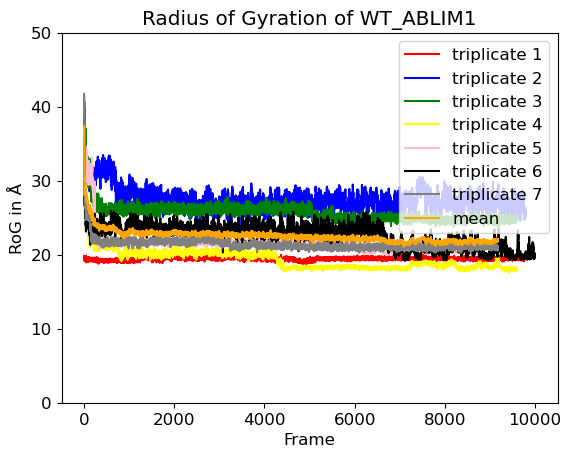

In [ ]:
#RADIUS OF GYRATION (RoG) of each replicate for a system

#Declare the system(s) you want to find the RoG for
system='WT_ABLIM1'
#systems=['WT_ABLIM1','S216_ABLIM1','LIM2_WT_ABLIM1','WT_ABLIM2','S76D_ABLIM2']

#use template to produce the trajectory and topology file names
template= 'abm_ProtIon_trip%s'
trajectory= [template % (str(i)+'.xtc') for i in range (1,8)]
#print(trajectory)

topology= [template % (str(i)+'_start.pdb') for i in range (1,8)]
#print(topology)

os.chdir(path/system)
print(os.getcwd())

print(trajectory)
print(topology)

#Trajectory files loaded for each replicate. Modify this for different # of replicates
traj1=pt.iterload(trajectory[0],topology[0])
traj2=pt.iterload(trajectory[1],topology[1])
traj3=pt.iterload(trajectory[2],topology[2])
traj4=pt.iterload(trajectory[3],topology[3])
traj5=pt.iterload(trajectory[4],topology[4])
traj6=pt.iterload(trajectory[5],topology[5])
traj7=pt.iterload(trajectory[6],topology[6])

#pytraj radius of gyration calculated for the backbone atoms
data1=pt.radgyr(traj1, mask='@BB')
data2=pt.radgyr(traj2, mask='@BB')
data3=pt.radgyr(traj3, mask='@BB')
data4=pt.radgyr(traj4, mask='@BB')
data5=pt.radgyr(traj5, mask='@BB')
data6=pt.radgyr(traj6, mask='@BB')
data7=pt.radgyr(traj7, mask='@BB')

#PLOT ROG


#longest=max(len(data1),len(data2),len(data3))
#Turn the lists of RoG for each replicate into arrays
multiple_lists = [data1,data2,data3,data4,data5,data6,data7]
arrays = [np.array(x) for x in multiple_lists]
means=[np.mean(k) for k in zip(*arrays)]

fig,ax = plt.subplots()
#fig=plt.figure(figsize=(14,5))
x1=np.arange(0,len(data1))
x2=np.arange(0,len(data2))
x3=np.arange(0,len(data3))
x4=np.arange(0,len(data4))
x5=np.arange(0,len(data5))
x6=np.arange(0,len(data6))
x7=np.arange(0,len(data7))
x8=np.arange(0,len(means))
y1=np.array(data1)
y2=np.array(data2)
y3=np.array(data3)
y4=np.array(data4)
y5=np.array(data5)
y6=np.array(data6)
y7=np.array(data7)
y8=np.array(means)
ax=plt.gca()
ax.set_ylim(0.0,50.0)
ax.plot(x1,y1,linestyle='-',color='red',label='triplicate 1')
ax.plot(x2,y2,linestyle='-',color='blue',label='triplicate 2')
ax.plot(x3,y3,linestyle='-',color='green',label='triplicate 3')
ax.plot(x4,y4,linestyle='-',color='yellow',label='triplicate 4')
ax.plot(x5,y5,linestyle='-',color='pink',label='triplicate 5')
ax.plot(x6,y6,linestyle='-',color='black',label='triplicate 6')
ax.plot(x7,y7,linestyle='-',color='gray',label='triplicate 7')
#Calculate the mean RoG in addition to the RoG for each replicate
ax.plot(x8,y8,linestyle='-',color='orange',label='mean')
title="Radius of Gyration of " + system
leg=ax.legend()
plt.title(title)
plt.xlabel("Frame")
plt.ylabel("RoG in Å")

name=system+'_ROG.png'
plt.savefig(name)
plt.show()

In [ ]:
#DICTIONARIES OF ZN ATOMS & THEIR CONSTRAINED CG SIDE CHAINS
WT_ABLIM1_constraints= {'@571':['@8','@17','@58','@65'],'@572':['@73','@80','@119','@125'],
                        '@573':['@150','@157','@195','@201'],'@574':['@208','@214','@258','@264'],
                        '@575':['@300','@304','@345','@350'],'@576':['@359','@366','@404','@411'],
                        '@577':['@433','@438','@482','@488'],'@578':['@494','@501','@548','@554']
}
S216D_ABLIM1_constraints={'@576':['@8','@17','@58','@65'],'@577':['@73','@80','@119','@125'],
                        '@578':['@150','@157','@195','@201'],'@579':['@208','@214','@258','@264'],
                        '@580':['@300','@304','@345','@350'],'@581':['@359','@366','@404','@411'],
                        '@582':['@433','@438','@482','@488'],'@583':['@494','@501','@548','@554']
}
LIM2_WT_ABLIM1_constraints={'@140':['@7','@14','@52','@58'],'@141':['@65','@71','@115','@121']
}
ABLIM2_constraints={'@179':['@40','@48','@87','@93'],'@180':['@101','@106','@149','@156']
}
S76D_ABLIM2_constraints={'@179':['@40','@48','@87','@93'],'@180':['@101','@106','@149','@156']
}
if system=='WT_ABLIM1':
    constraints=WT_ABLIM1_constraints
elif system=='S216D_ABLIM1':
    constraints=S216D_ABLIM1_constraints
elif system=='LIM2_WT_ABLIM1':
    constraints=LIM2_WT_ABLIM1_constraints
else:
    constraints=ABLIM2_constraints

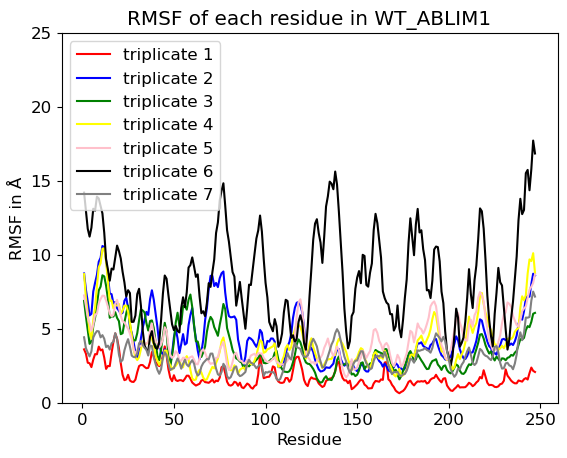

In [ ]:
#RMSF
#superimpose the structure onto its first frame
traj1_imposed= pt.superpose(traj1,ref=0)
#Calculate the RMSF for the bb beads of the replicate
rmsf_data1=pt.rmsf(traj1_imposed,mask='@BB',options='byres')
#print(rmsf_data1)

traj2_imposed= pt.superpose(traj2,ref=0)
rmsf_data2=pt.rmsf(traj2_imposed,mask='@BB',options='byres')
#print(rmsf_data2)

traj3_imposed= pt.superpose(traj3,ref=0)
rmsf_data3=pt.rmsf(traj3_imposed,mask='@BB',options='byres')
#print(rmsf_data3)

traj4_imposed= pt.superpose(traj4,ref=0)
rmsf_data4=pt.rmsf(traj4_imposed,mask='@BB',options='byres')

traj5_imposed= pt.superpose(traj5,ref=0)
rmsf_data5=pt.rmsf(traj5_imposed,mask='@BB',options='byres')

traj6_imposed= pt.superpose(traj6,ref=0)
rmsf_data6=pt.rmsf(traj6_imposed,mask='@BB',options='byres')

traj7_imposed= pt.superpose(traj7,ref=0)
rmsf_data7=pt.rmsf(traj7_imposed,mask='@BB',options='byres')

#ZN ion atom numbers in each system
if system=='WT_ABLIM1':
    zn1=573
    zn2=574
    zns='@573 @574'
elif system=='S216D_ABLIM1':
    zn1=578
    zn2=579
    zns=':252 :253'
elif system=='LIM2_WT_ABLIM1':
    zn1=140
    zn2=141
    zns=':64 :65'
else:
    zn1=179
    zn2=180
    zns=':82 :83'



fig,ax = plt.subplots()
ax=plt.gca()
ax.set_ylim(0.0,25.0)
ax.plot(rmsf_data1.T[0],rmsf_data1.T[1],linestyle='-',color='red',label='triplicate 1')
ax.plot(rmsf_data2.T[0],rmsf_data2.T[1],linestyle='-',color='blue',label='triplicate 2')
ax.plot(rmsf_data3.T[0],rmsf_data3.T[1],linestyle='-',color='green',label='triplicate 3')
ax.plot(rmsf_data4.T[0],rmsf_data4.T[1],linestyle='-',color='yellow',label='triplicate 4')
ax.plot(rmsf_data5.T[0],rmsf_data5.T[1],linestyle='-',color='pink',label='triplicate 5')
ax.plot(rmsf_data6.T[0],rmsf_data6.T[1],linestyle='-',color='black',label='triplicate 6')
ax.plot(rmsf_data7.T[0],rmsf_data7.T[1],linestyle='-',color='gray',label='triplicate 7')

'''for value in constraints.values():
    for i in range(0,4):
        atom=int(value[i][1:])
        print(atom)
        plt.axvspan(atom,atom+1, color='gray',alpha=1.0)


plt.axvspan(8,9, color='gray',alpha=1.0)
plt.axvspan(17,46, color='gray',alpha=1.0,label='ZN176 constrained')
plt.axvspan(81,82, color='gray',alpha=1.0)
plt.axvspan(89,90, color='red',alpha=1.0)
plt.axvspan(97,98, color='green',alpha=1.0,label='ZN177 constrained')
plt.axvspan(102,103, color='green',alpha=1.0)
plt.axvspan(145,146, color='green',alpha=1.0)
plt.axvspan(152,153, color='green',alpha=1.0)
plt.axvspan(176,176, color='red',alpha=1.0)
plt.axvspan(177,177, color='green',alpha=1.0)
'''
leg = ax.legend()
title= 'RMSF of each residue in ' + system
plt.title(title)
plt.xlabel('Residue')
plt.ylabel('RMSF in Å')

os.chdir(path)
name=system+'_RMSF.png'
plt.savefig(name)
plt.show()

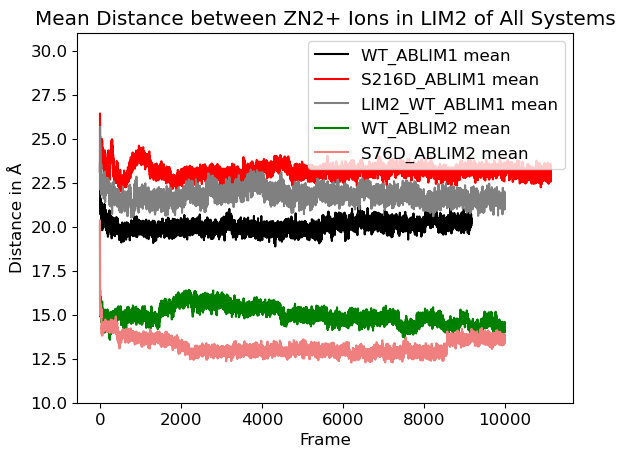

In [ ]:
#DISTANCES BETWEEN LIM2 ZNs


fig,ax = plt.subplots()
title="Mean Distance between ZN2+ Ions in LIM2 of All Systems"
plt.title(title)
plt.xlabel("Frame")
plt.ylabel("Distance in Å")
#WT_ABLIM1 is res 250 & 251
#S216D_ABLIM1 is res 252 & 253
#LIM2_WT_ABLIM1 is res 64 & 65
#WT_ABLIM2 is 82 & 83
#S76D_ABLIM2 is 82 & 83
systems=['WT_ABLIM1','S216D_ABLIM1','LIM2_WT_ABLIM1','WT_ABLIM2','S76D_ABLIM2']
color_num=0
colors=['black','red','gray','green','lightcoral']
for system in systems:
    os.chdir(path/system)
    if system=='WT_ABLIM1':
        zn1=573
        zn2=574
        zns='@573 @574'
    elif system=='S216D_ABLIM1':
        zn1=578
        zn2=579
        zns=':252 :253'
    elif system=='LIM2_WT_ABLIM1':
        zn1=140
        zn2=141
        zns=':64 :65'
    else:
        zn1=179
        zn2=180
        zns=':82 :83'

    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    traj4=pt.iterload(trajectory[3],topology[3])
    traj5=pt.iterload(trajectory[4],topology[4])
    traj6=pt.iterload(trajectory[5],topology[5])
    traj7=pt.iterload(trajectory[6],topology[6])
    ZN_distances1=pt.distance(traj1, mask=zns)
    ZN_distances2=pt.distance(traj2, mask=zns)
    ZN_distances3=pt.distance(traj3, mask=zns)
    ZN_distances4=pt.distance(traj4, mask=zns)
    ZN_distances5=pt.distance(traj5, mask=zns)
    ZN_distances6=pt.distance(traj6, mask=zns)
    ZN_distances7=pt.distance(traj7, mask=zns)

    #take each replicate distance in a system in a list
    multiple_lists = [ZN_distances1,ZN_distances2,ZN_distances3,ZN_distances4,ZN_distances5,ZN_distances6,ZN_distances7]
    #convert list to array
    arrays = [np.array(x) for x in multiple_lists]
    #calculate mean of all replicates' ZN distances to find the system's mean ZN distance
    means=[np.mean(k) for k in zip(*arrays)]

    #print(means)


    x1=np.arange(0,len(ZN_distances1))
    x2=np.arange(0,len(ZN_distances2))
    x3=np.arange(0,len(ZN_distances3))
    x4=np.arange(0,len(means))
    y1=np.array(ZN_distances1)
    y2=np.array(ZN_distances2)
    y3=np.array(ZN_distances3)
    y4=np.array(means)
    #ax=plt.gca()
    ax.set_ylim(10.0,31.0)
    #ax.plot(x1,y1,linestyle='-',color='red',label='triplicate 1',zorder=1)
    #ax.plot(x2,y2,linestyle='-',color='blue',label='triplicate 2',zorder=2)
    #ax.plot(x3,y3,linestyle='-',color='green',label='triplicate 3',zorder=3)
    legend=system+' mean'
    ax.plot(x4,y4,linestyle='-',color=colors[color_num],label=legend,zorder=4)
    color_num+=1
    leg = ax.legend()



os.chdir(path)
name='Mean_LIM2_ZN_distances.png'
plt.savefig(name)
plt.show()

In [ ]:
#Distances between ZN ions & Constrained Residues

'''
WT_ABLIM1_constraints= {'@571':['@8','@17','@58','@65'],'@572':['@73','@80','@119','@125'],
                        '@573':['@150','@157','@195','@201'],'@574':['@208','@214','@258','@264'],
                        '@575':['@300','@304','@345','@350'],'@576':['@359','@366','@404','@411'],
                        '@577':['@433','@438','@482','@488'],'@578':['@494','@501','@548','@554']
                       }
#mask for ZN & all other CYS or HIS
#for each ZN, pull out everything within

#explicitly define for the 2 ZNs in LIM2 (ABLIM1 & ABLIM2)

#RDF for each ZN in sequence - ask Xuan about it for O/Ca+


print(system)
#distance_matrix=[]
for key, value in constraints.items():
    for i in range(0,4):
        #print(type(combo))
        zinc=key
        atom=value[i]
        pair=atom + ' ' + zinc
        print(pair)
        distance_matrix.append(pt.distance(traj1,pair))
        distance_matrix.append(pt.distance(traj2,pair))
        distance_matrix.append(pt.distance(traj3,pair))
print(len(distance_matrix))


print(distance_matrix[0])
print(len(distance_matrix))

#def Distances(key,value,trajectory):
#    distances=pt.distance(trajectory,

#I have 96 arrays in a matrix, properly ordered, im having difficulty
#figuring out how i should plot them/plot them separately


def WT_ABLIM1(traj1,traj2,traj3):

    CYS99ZN1 = '@8 @571'
    Cys18Zn82=pt.distance(traj1,'@8 @571')
    Cys18Zn82=pt.distance(traj2,':18@SC1 @571')
    Cys18Zn82=pt.distance(traj3,':18@SC1 @571')

    CYS102ZN1= '@17 @571'
    HIS119ZN1= '@58 @571'
    CYS122ZN1='@65 @571'

    CYS125ZN2='@73 @572'
    CYS128ZN2='@80 @572'
    CYS146ZN2='@119 @572'
    ASP149ZN2='@125 @572

    CYS158ZN3='@150 @573'
    CYS161ZN3='@157 @573'
    HIS178ZN3='@195 @573'
    CYS181ZN3='@201 @573'

    CYS184ZN4='@208 @574'
    CYS187ZN4='@214 @574'
    CYS


def S216D_ABLIM1(traj1,traj2,traj3):


def LIM2_WT_ABLIM1(traj1,traj2,traj3):


def WT_ABLIM2(traj1,traj2,traj3):



def S76D_ABLIM2(traj1,traj2,traj3):




if system=='WT_ABLIM1':
    WT_ABLIM1(traj1,traj2,traj3)
elif system=='S216D_ABLIM1':
    S216D_ABLIM1(traj1,traj2,traj3)
elif system=='LIM2_WT_ABLIM1':
    LIM2_WT_ABLIM1(traj1,traj2,traj3)
elif system=='WT_ABLIM2':
    WT_ABLIM2(traj1,traj2,traj3)
elif system=='S76D_ABLIM2':
    S76D_ABLIM2(traj1,traj2,traj3)




ZN_distances1=pt.distance(traj1, mask=zns)
ZN_distances2=pt.distance(traj2, mask=zns)
ZN_distances3=pt.distance(traj3, mask=zns)
'''

[7.08486872 9.07496483 7.52168944 ... 7.77962777 7.5249172  6.92200106]
96


"\ndef WT_ABLIM1(traj1,traj2,traj3):\n\n    CYS99ZN1 = '@8 @571' \n    Cys18Zn82=pt.distance(traj1,'@8 @571')\n    Cys18Zn82=pt.distance(traj2,':18@SC1 @571')\n    Cys18Zn82=pt.distance(traj3,':18@SC1 @571')\n\n    CYS102ZN1= '@17 @571'\n    HIS119ZN1= '@58 @571'\n    CYS122ZN1='@65 @571'\n\n    CYS125ZN2='@73 @572'\n    CYS128ZN2='@80 @572'\n    CYS146ZN2='@119 @572'\n    ASP149ZN2='@125 @572\n\n    CYS158ZN3='@150 @573'\n    CYS161ZN3='@157 @573'\n    HIS178ZN3='@195 @573'\n    CYS181ZN3='@201 @573'\n\n    CYS184ZN4='@208 @574'\n    CYS187ZN4='@214 @574'\n    CYS\n    \n\ndef S216D_ABLIM1(traj1,traj2,traj3):\n\n\ndef LIM2_WT_ABLIM1(traj1,traj2,traj3):\n\n\ndef WT_ABLIM2(traj1,traj2,traj3):\n\n\n\ndef S76D_ABLIM2(traj1,traj2,traj3):\n\n\n\n\nif system=='WT_ABLIM1':\n    WT_ABLIM1(traj1,traj2,traj3)\nelif system=='S216D_ABLIM1':\n    S216D_ABLIM1(traj1,traj2,traj3)\nelif system=='LIM2_WT_ABLIM1':\n    LIM2_WT_ABLIM1(traj1,traj2,traj3)\nelif system=='WT_ABLIM2':\n    WT_ABLIM2(traj1,tra

['abm_water_trip1.xtc', 'abm_water_trip2.xtc', 'abm_water_trip3.xtc']
['abm_water_trip1_start.pdb', 'abm_water_trip2_start.pdb', 'abm_water_trip3_start.pdb']


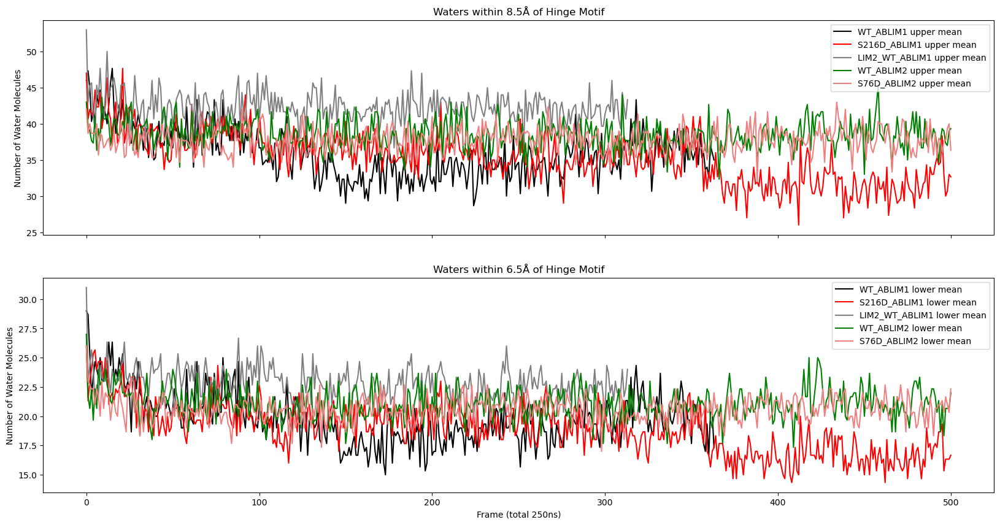

In [ ]:
#Water shell MSSSP motif


lower_bar_means=[]
lower_bar_sds=[]
upper_bar_means=[]
upper_bar_sds=[]

#Different traj & top files for analysis that include the solution
water_template= 'abm_water_trip%s'
water_trajectory= [water_template % (str(i)+'.xtc') for i in range (1,4)]

water_topology= [water_template % (str(i)+'_start.pdb') for i in range (1,4)]

print(water_trajectory)
print(water_topology)

systems=['WT_ABLIM1_97-343','S216D_ABLIM1_97-343','WT_ABLIM1_156-218','WT_ABLIM2_1-81','S76D_ABLIM2_1-81']
colors=['black','red','darkgray','slategray','lightcoral']

color_num=0

fig,(ax1,ax2) = plt.subplots(nrows=2,sharex=True)

ax1.figure.set_size_inches(20.0,15.0)
ax2.figure.set_size_inches(20.0,10.0)
#fig=plt.figure(figsize=(25,10))
#title="Mean Watershell Distances of All Systems"
#plt.title(title)
#plt.xlabel("Frame")
#plt.ylabel("Distance in Å")
for system in systems:
    os.chdir(path/system)
    #mask of the system is the MSSSP motif residues of the system / MSSDP motif for phosphorylated system
    if system=='WT_ABLIM1':
        mask=':117-121'
    elif system=='S216D_ABLIM1':
        mask=':117-121'
    elif system=='LIM2_WT_ABLIM1':
        mask=':58-62'
    else:
        mask=':73-77'

    sys_mean=system + ' mean'

    traj1=pt.iterload(water_trajectory[0],water_topology[0])
    traj2=pt.iterload(water_trajectory[1],water_topology[1])
    traj3=pt.iterload(water_trajectory[2],water_topology[2])
    traj4=pt.iterload(water_trajectory[3],water_topology[3])
    traj5=pt.iterload(water_trajectory[4],water_topology[4])
    traj6=pt.iterload(water_trajectory[5],water_topology[5])
    traj7=pt.iterload(water_trajectory[6],water_topology[6])
    #print(traj1)
    #print(traj2)
    #print(traj3)
    #set angstrom limits for finding # of water beads within the space
    lower_limit=6.5
    upper_limit=8.5
    data1=pt.watershell(traj1, solute_mask=mask,solvent_mask='@WN',lower=lower_limit,upper=upper_limit)
    data2=pt.watershell(traj2, solute_mask=mask,solvent_mask='@WN',lower=lower_limit,upper=upper_limit)
    data3=pt.watershell(traj3, solute_mask=mask,solvent_mask='@WN',lower=lower_limit,upper=upper_limit)
    data4=pt.watershell(traj4, solute_mask=mask,solvent_mask='@WN',lower=lower_limit,upper=upper_limit)
    data5=pt.watershell(traj5, solute_mask=mask,solvent_mask='@WN',lower=lower_limit,upper=upper_limit)
    data6=pt.watershell(traj6, solute_mask=mask,solvent_mask='@WN',lower=lower_limit,upper=upper_limit)
    data7=pt.watershell(traj7, solute_mask=mask,solvent_mask='@WN',lower=lower_limit,upper=upper_limit)
    #print(data1[0])
    #print(data2)
    #print(data3)
    lowers_list=[data1[0],data2[0],data3[0],data4[0],data5[0],data6[0],data7[0]]
    uppers_list=[data1[1],data2[1],data3[1],data4[1],data5[1],data6[1],data7[1]]

    #mean of lower limit mean/sd
    lower_arrays = [np.array(x) for x in lowers_list]
    lower_means=[np.mean(k) for k in zip(*lower_arrays)]
    lower_sds=[np.std(k) for k in zip(*lower_arrays)]
    #print(lower_means)
    #print(lower_sds)
    #mean of upper limit mean/sd
    upper_arrays = [np.array(x) for x in uppers_list]
    upper_means=[np.mean(k) for k in zip(*upper_arrays)]
    upper_sds=[np.std(k) for k in zip(*upper_arrays)]
    #print(upper_means)
    #print(upper_sds)

    #first 200 frames less representative of whole system progression over 2 microseconds, so cut them out
    lower_bar_means.append(np.mean(lower_means[200:]))
    lower_bar_sds.append(np.std(lower_sds[200:]))
    upper_bar_means.append(np.mean(upper_means[200:]))
    upper_bar_sds.append(np.std(upper_sds[200:]))

    x1=np.arange(0,len(lower_means))
    x2=np.arange(0,len(upper_means))
    y1=np.array(lower_means)
    y2=np.array(upper_means)
    e1=np.array(lower_sds)
    e2=np.array(upper_sds)
    #ax.set_ylim(0.0,40.0)


    lower_legend=system+' lower mean'
    upper_legend=system+' upper mean'
    ax1.plot(x2,y2,linestyle='-',color=colors[color_num],label=upper_legend)
    ax2.plot(x1,y1,linestyle='-',color=colors[color_num],label=lower_legend)

    ax1.set_title('Waters within ' + str(upper_limit) + 'Å of Hinge Motif')
    ax1.set_ylabel('Number of Water Molecules')

    ax2.set_title('Waters within ' + str(lower_limit) + 'Å of Hinge Motif')
    ax2.set_ylabel('Number of Water Molecules')


    color_num+=1
    leg = ax1.legend()
    end=ax2.legend()

    #mean of

plt.xlabel("Frame (total 250ns)")
os.chdir(path)
name='Mean_Watershell_Atoms.png'
plt.savefig(name)
plt.show()

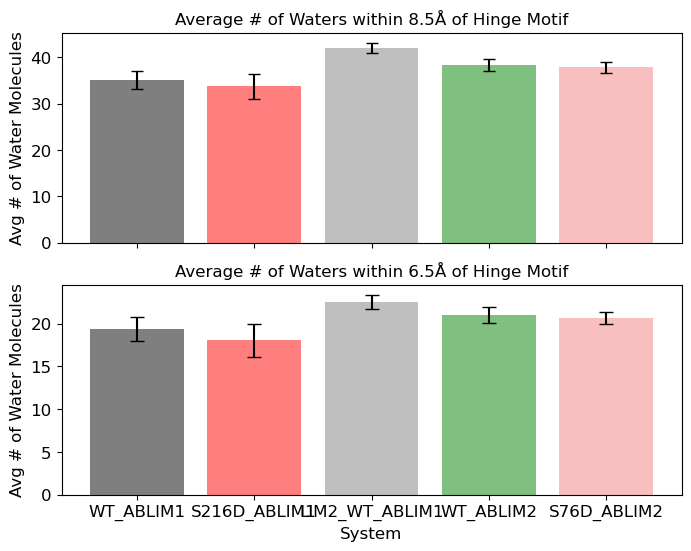

In [ ]:
#BAR PLOT OF MEAN/SD OF WATER MOTIFS
#data from previous cell turned into bar graphs

#print(lower_bar_means)
#print(len(lower_bar_means))
#print(lower_bar_sds)
#print(upper_bar_means)
#print(upper_bar_sds)
systems=['WT_ABLIM1_97-343','S216D_ABLIM1_97-343','WT_ABLIM1_156-218','WT_ABLIM2_1-81','S76D_ABLIM2_1-81']
colors=['black','red','darkgray','slategray','lightcoral']

fig,(ax1,ax2) = plt.subplots(nrows=2,sharex=True)


ax1.figure.set_size_inches(8.0,8.0)
ax2.figure.set_size_inches(8.0,6.0)
x1=np.array(systems)
x2=np.array(systems)
y1=np.array(lower_bar_means)
y2=np.array(upper_bar_means)
e1=np.array(lower_bar_sds)
e2=np.array(upper_bar_sds)
    #ax.set_ylim(0.0,40.0)

lower_legend=system+' lower mean'
upper_legend=system+' upper mean'
ax1.bar(x2,y2,yerr=e2, align='center',alpha=0.5,color=colors,capsize=4)
ax2.bar(x1,y1,yerr=e1, align='center',alpha=0.5,color=colors,capsize=5)

ax1.set_title('Average # of Waters within ' + str(upper_limit) + 'Å of Hinge Motif',size=12.0)
ax1.set_ylabel('Avg # of Water Molecules')

ax2.set_title('Average # of Waters within ' + str(lower_limit) + 'Å of Hinge Motif',size=12.0)
ax2.set_ylabel('Avg # of Water Molecules')
ax2.set_xlabel('System',size=12.0)

os.chdir(path)
name='Average_Waters.png'
plt.gcf().savefig(name,dpi=300)
plt.show()

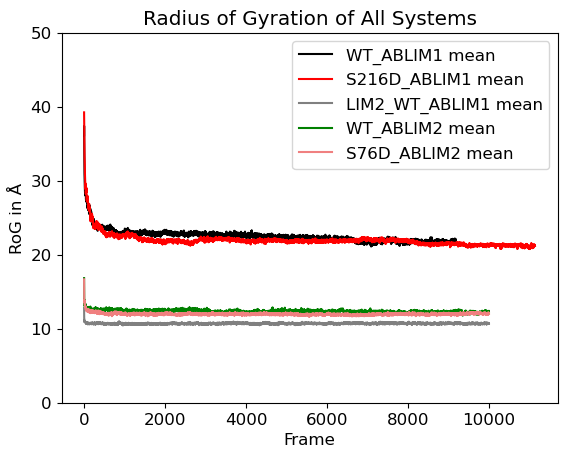

In [ ]:
#MEAN ROG

systems=['WT_ABLIM1','S216D_ABLIM1','LIM2_WT_ABLIM1','WT_ABLIM2','S76D_ABLIM2']
color_num=0
colors=['black','red','gray','green','lightcoral']
fig,ax = plt.subplots()
for system in systems:
    os.chdir(path/system)
    sys_mean=system + ' mean'
    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    traj4=pt.iterload(trajectory[3],topology[3])
    traj5=pt.iterload(trajectory[4],topology[4])
    traj6=pt.iterload(trajectory[5],topology[5])
    traj7=pt.iterload(trajectory[6],topology[6])

    #pytraj radius of gyration calculated for the backbone atoms
    data1=pt.radgyr(traj1, mask='@BB')
    data2=pt.radgyr(traj2, mask='@BB')
    data3=pt.radgyr(traj3, mask='@BB')
    data4=pt.radgyr(traj4, mask='@BB')
    data5=pt.radgyr(traj5, mask='@BB')
    data6=pt.radgyr(traj6, mask='@BB')
    data7=pt.radgyr(traj7, mask='@BB')

    multiple_lists = [data1,data2,data3,data4,data5,data6,data7]
    arrays = [np.array(x) for x in multiple_lists]
    means=[np.mean(k) for k in zip(*arrays)]


    #fig=plt.figure(figsize=(14,5))
    x=np.arange(0,len(means))
    y=np.array(means)
    #ax=plt.gca()
    ax.set_ylim(0.0,50.0)
    ax.plot(x,y,linestyle='-',color=colors[color_num],label=sys_mean)
    color_num+=1
    title="Radius of Gyration of All Systems"
    leg=ax.legend()
    plt.title(title)
    plt.xlabel("Frame")
    plt.ylabel("RoG in Å")

os.chdir(path)
name='ROG_means.png'
plt.savefig(name)
plt.show()


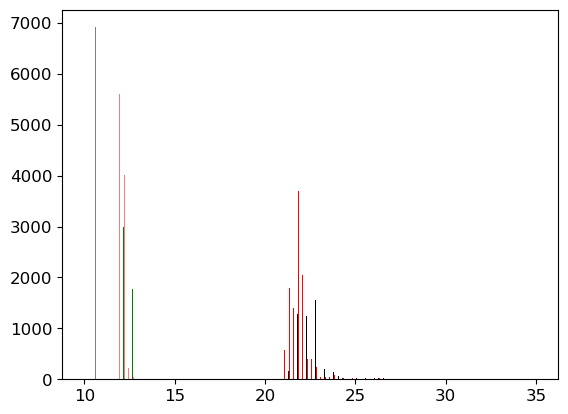

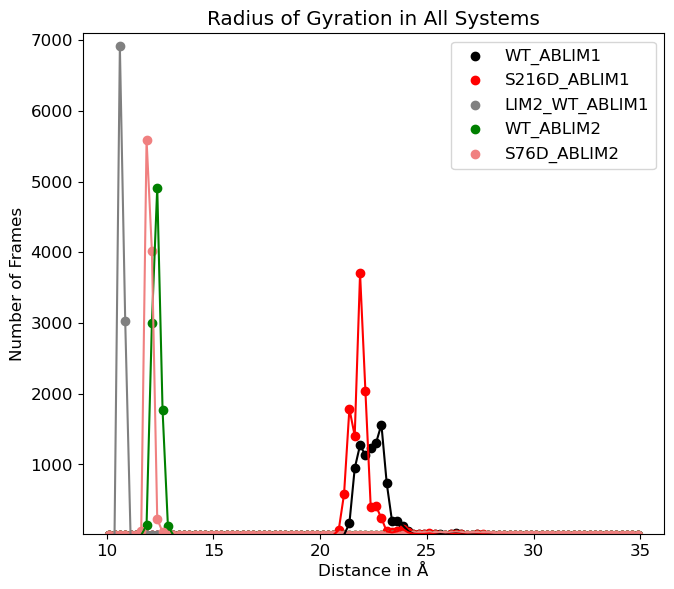

In [ ]:
#HISTOGRAM OF MEAN ROG OF ALL SYSTEMS

x_multi=[]
systems=['WT_ABLIM1','S216D_ABLIM1','LIM2_WT_ABLIM1','WT_ABLIM2','S76D_ABLIM2']
n_bins=100
color_num=0
colors=['black','red','gray','green','lightcoral']
fig,ax = plt.subplots()
for system in systems:
    os.chdir(path/system)
    sys_mean=system + ' mean'
    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    traj4=pt.iterload(trajectory[3],topology[3])
    traj5=pt.iterload(trajectory[4],topology[4])
    traj6=pt.iterload(trajectory[5],topology[5])
    traj7=pt.iterload(trajectory[6],topology[6])

    #pytraj radius of gyration calculated for the backbone atoms
    data1=pt.radgyr(traj1, mask='@BB')
    data2=pt.radgyr(traj2, mask='@BB')
    data3=pt.radgyr(traj3, mask='@BB')
    data4=pt.radgyr(traj4, mask='@BB')
    data5=pt.radgyr(traj5, mask='@BB')
    data6=pt.radgyr(traj6, mask='@BB')
    data7=pt.radgyr(traj7, mask='@BB')

    multiple_lists = [data1,data2,data3,data4,data5,data6,data7]
    arrays = [np.array(x) for x in multiple_lists]
    means=[np.mean(k) for k in zip(*arrays)]
    #print(means)
    #print(len(means))
    x_multi.append(means[50:])

    #legend=system+ ' mean'

#calculate the bars & edges of the histogram
bin_counts,bin_edges,bars=ax.hist(x_multi, n_bins, histtype='bar',range=(10,35),color=colors,label=systems)


fig,ax = plt.subplots()
for i in range(len(bin_counts)):
    #generate the outline/shape of the histogram for each system, NOT including the bars themselves
    bin_centres = (bin_edges[:-1] + bin_edges[1:])/2.
    plt.scatter(x=bin_centres,y=bin_counts[i],color=colors[i],label=systems[i])
    plt.plot(bin_centres,bin_counts[i],color=colors[i])


'''for i in range(len(x_multi)):
    histo, bin_edges = np.histogram(x_multi[i],nbins)
    bin_center = 0.5*(bin_edges[1:] + bin_edges[:-1])
    ax.plot(bin_center,histo,color=colors[i])
    ax.scatter(x=bin_center,y=histo,color=colors[i],label=systems[i])
#plt.show()
'''
title="Radius of Gyration in All Systems"
plt.title(title)
plt.ylim(20,7100)
plt.xlabel("Distance in Å")
plt.ylabel("Number of Frames")
ax.figure.set_size_inches(7.5,6.5)
ax.legend()
#for b in bars:
#    ax.bar_label(b, labels=[v.astype(np.int64) if v > 0 else '' for v in b.datavalues])

name='ALL_ROG_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()


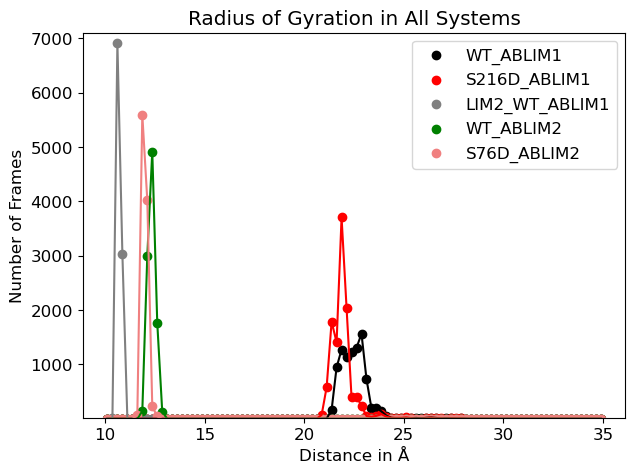

In [ ]:
#Figure generation (same as above but isolated from data collection and with different ylim parameters & fig size
fig,ax = plt.subplots()
for i in range(len(bin_counts)):
    bin_centres = (bin_edges[:-1] + bin_edges[1:])/2.
    plt.scatter(x=bin_centres,y=bin_counts[i],color=colors[i],label=systems[i])
    plt.plot(bin_centres,bin_counts[i],color=colors[i])

plt.ylim(20,7100)
title="Radius of Gyration in All Systems"
plt.title(title)
plt.xlabel("Distance in Å")
plt.ylabel("Number of Frames")
ax.figure.set_size_inches(7,5)
ax.legend()

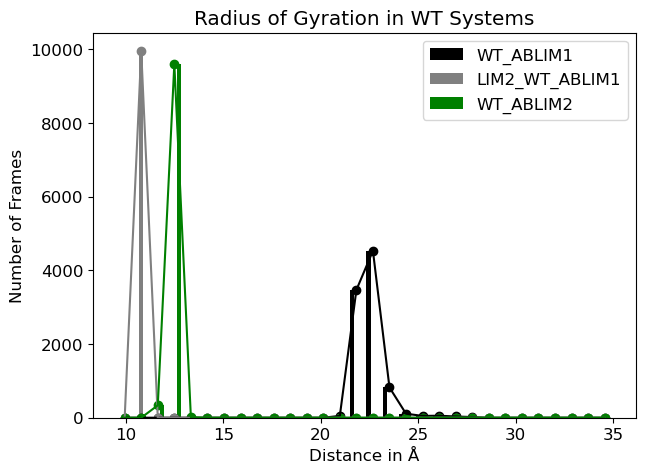

In [ ]:
#ROG OF WT SYSTEMS

x_multi=[]
#Only using WT systems, no phosphorylation yet
systems=['WT_ABLIM1','LIM2_WT_ABLIM1','WT_ABLIM2']
#n_bins=30
color_num=0
colors=['black','gray','green']
fig,ax = plt.subplots()
for system in systems:
    os.chdir(path/system)
    sys_mean=system + ' mean'
    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    traj4=pt.iterload(trajectory[3],topology[3])
    traj5=pt.iterload(trajectory[4],topology[4])
    traj6=pt.iterload(trajectory[5],topology[5])
    traj7=pt.iterload(trajectory[6],topology[6])

    #pytraj radius of gyration calculated for the backbone atoms
    data1=pt.radgyr(traj1, mask='@BB')
    data2=pt.radgyr(traj2, mask='@BB')
    data3=pt.radgyr(traj3, mask='@BB')
    data4=pt.radgyr(traj4, mask='@BB')
    data5=pt.radgyr(traj5, mask='@BB')
    data6=pt.radgyr(traj6, mask='@BB')
    data7=pt.radgyr(traj7, mask='@BB')

    multiple_lists = [data1,data2,data3,data4,data5,data6,data7]
    arrays = [np.array(x) for x in multiple_lists]
    means=[np.mean(k) for k in zip(*arrays)]
    #print(means)
    #print(len(means))
    x_multi.append(means[50:])

    #legend=system+ ' mean'

nbins=30
bin_counts,bin_edges,bars=ax.hist(x_multi, nbins,histtype='bar',range=(9.5,35),color=colors,label=systems)
#bin_counts,bin_edges=np.histogram(x_multi[0], nbins)


'''
for i in range(len(x_multi)):
    histo, bin_edges = np.histogram(x_multi[i],nbins)
    bin_center = 0.5*(bin_edges[1:] + bin_edges[:-1])
    ax.plot(bin_center,histo,color=colors[i])
    ax.scatter(x=bin_center,y=histo,color=colors[i],label=systems[i])
#plt.show()
'''


for i in range(len(bin_counts)):
    bin_centres = (bin_edges[:-1] + bin_edges[1:])/2.
    plt.scatter(x=bin_centres,y=bin_counts[i],color=colors[i])
    plt.plot(bin_centres,bin_counts[i],color=colors[i])
#plt.errorbar(x=bin_centres, y=bin_counts, yerr=err, fmt='o')

title="Radius of Gyration in WT Systems"
plt.title(title)
plt.xlabel("Distance in Å")
plt.ylabel("Number of Frames")
ax.figure.set_size_inches(7,5)
ax.legend()
#for b in bars:
#    ax.bar_label(b, labels=[v.astype(np.int64) if v > 0 else '' for v in b.datavalues])

name='WT_ROG_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

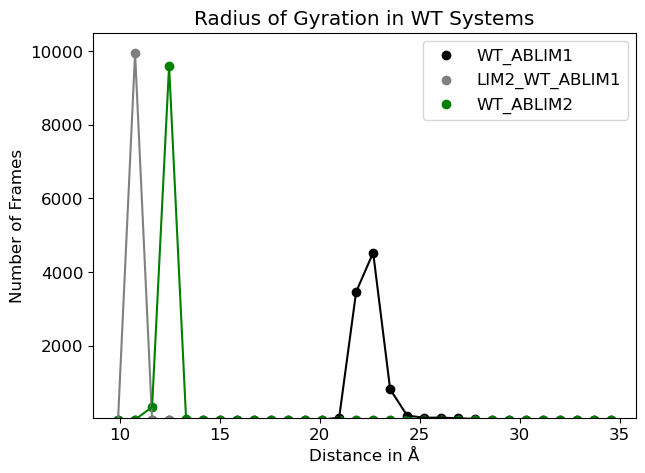

In [ ]:
#RoG for WT Systems figure generation, without bars
fig,ax = plt.subplots()
for i in range(len(bin_counts)):
    bin_centres = (bin_edges[:-1] + bin_edges[1:])/2.
    plt.scatter(x=bin_centres,y=bin_counts[i],color=colors[i],label=systems[i])
    plt.plot(bin_centres,bin_counts[i],color=colors[i])

title="Radius of Gyration in WT Systems"
plt.title(title)
plt.xlabel("Distance in Å")
plt.ylabel("Number of Frames")
ax.figure.set_size_inches(7,5)
ax.legend()
#for b in bars:
#    ax.bar_label(b, labels=[v.astype(np.int64) if v > 0 else '' for v in b.datavalues])
plt.ylim(50,10500)

name='WT_ROG_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

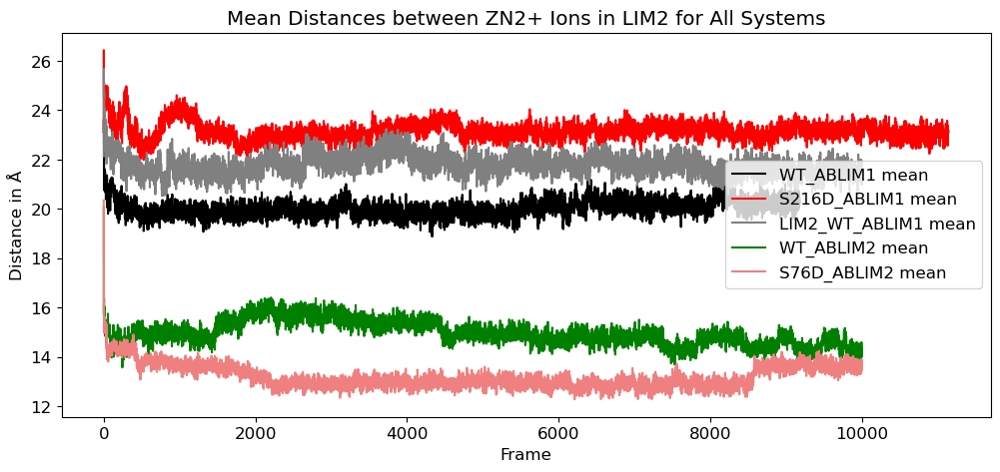

In [ ]:
#MEAN DISTANCES BETWEEN ZINC IONS

systems=['WT_ABLIM1','S216D_ABLIM1','LIM2_WT_ABLIM1','WT_ABLIM2','S76D_ABLIM2']
color_num=0
colors=['black','red','gray','green','lightcoral']

fig,ax=plt.subplots()
#fig=plt.figure(figsize=(14,5))

for system in systems:
    os.chdir(path/system)
    if system=='WT_ABLIM1':
        zn1=573
        zn2=574
        zns='@573 @574'
    elif system=='S216D_ABLIM1':
        zn1=578
        zn2=579
        zns=':252 :253'
    elif system=='LIM2_WT_ABLIM1':
        zn1=140
        zn2=141
        zns=':64 :65'
    else:
        zn1=179
        zn2=180
        zns=':82 :83'

    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    traj4=pt.iterload(trajectory[3],topology[3])
    traj5=pt.iterload(trajectory[4],topology[4])
    traj6=pt.iterload(trajectory[5],topology[5])
    traj7=pt.iterload(trajectory[6],topology[6])
    ZN_distances1=pt.distance(traj1, mask=zns)
    ZN_distances2=pt.distance(traj2, mask=zns)
    ZN_distances3=pt.distance(traj3, mask=zns)
    ZN_distances4=pt.distance(traj4, mask=zns)
    ZN_distances5=pt.distance(traj5, mask=zns)
    ZN_distances6=pt.distance(traj6, mask=zns)
    ZN_distances7=pt.distance(traj7, mask=zns)

    #take each replicate distance in a system in a list
    multiple_lists = [ZN_distances1,ZN_distances2,ZN_distances3,ZN_distances4,ZN_distances5,ZN_distances6,ZN_distances7]
    #convert list to array
    arrays = [np.array(x) for x in multiple_lists]
    #calculate mean of all replicates' ZN distances to find the system's mean ZN distance
    means=[np.mean(k) for k in zip(*arrays)]


    #x1=np.arange(0,len(ZN_distances1))
    #x2=np.arange(0,len(ZN_distances2))
    #x3=np.arange(0,len(ZN_distances3))
    x4=np.arange(0,len(means))
    #y1=np.array(ZN_distances1)
    #y2=np.array(ZN_distances2)
    #y3=np.array(ZN_distances3)
    y4=np.array(means)
    #ax=plt.gca()
    #ax.set_ylim(10.0,31.0)
    #ax.plot(x1,y1,linestyle='-',color='red',label='triplicate 1',zorder=1)
    #ax.plot(x2,y2,linestyle='-',color='blue',label='triplicate 2',zorder=2)
    #ax.plot(x3,y3,linestyle='-',color='green',label='triplicate 3',zorder=3)
    legend=system+ ' mean'
    ax.plot(x4,y4,linestyle='-',color=colors[color_num],label=legend,zorder=4)
    color_num+=1
    leg = ax.legend()
    title="Mean Distances between ZN2+ Ions in LIM2 for All Systems"
    plt.title(title)
    plt.xlabel("Frame")
    plt.ylabel("Distance in Å")
    ax.figure.set_size_inches(12.0,5.0)

name='mean_LIM2_ZN_distances.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

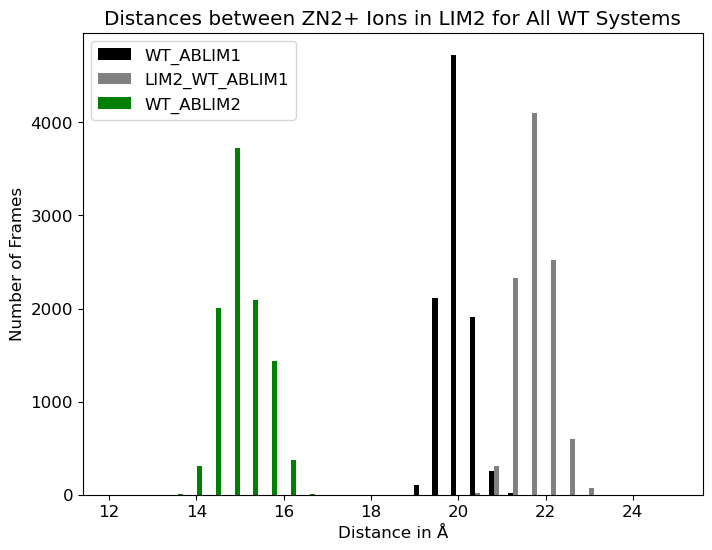

In [ ]:
#HISTOGRAM OF DISTANCES BETWEEN ZINC IONS OF WT STRUCTURES

systems=['WT_ABLIM1','LIM2_WT_ABLIM1','WT_ABLIM2']
color_num=0

n_bins = 30

fig, ax = plt.subplots()
x_multi=[]
colors = [ 'black','gray', 'green']
#fig=plt.figure(figsize=(14,5))

for system in systems:
    os.chdir(path/system)
    if system=='WT_ABLIM1':
        zn1=573
        zn2=574
        zns='@573 @574'
    elif system=='S216D_ABLIM1':
        zn1=578
        zn2=579
        zns=':252 :253'
    elif system=='LIM2_WT_ABLIM1':
        zn1=140
        zn2=141
        zns=':64 :65'
    else:
        zn1=179
        zn2=180
        zns=':82 :83'

    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    traj4=pt.iterload(trajectory[3],topology[3])
    traj5=pt.iterload(trajectory[4],topology[4])
    traj6=pt.iterload(trajectory[5],topology[5])
    traj7=pt.iterload(trajectory[6],topology[6])
    ZN_distances1=pt.distance(traj1, mask=zns)
    ZN_distances2=pt.distance(traj2, mask=zns)
    ZN_distances3=pt.distance(traj3, mask=zns)
    ZN_distances4=pt.distance(traj4, mask=zns)
    ZN_distances5=pt.distance(traj5, mask=zns)
    ZN_distances6=pt.distance(traj6, mask=zns)
    ZN_distances7=pt.distance(traj7, mask=zns)

    #take each replicate distance in a system in a list
    multiple_lists = [ZN_distances1,ZN_distances2,ZN_distances3,ZN_distances4,ZN_distances5,ZN_distances6,ZN_distances7]
    #convert list to array
    arrays = [np.array(x) for x in multiple_lists]
    #calculate mean of all replicates' ZN distances to find the system's mean ZN distance
    means=[np.mean(k) for k in zip(*arrays)]

    #print(means)
    x_multi.append(means[50:])

    legend=system+ ' mean'

bin_counts,bin_edges,bars=ax.hist(x_multi, n_bins, histtype='bar',range=(12,25),color=colors,label=systems)


title="Distances between ZN2+ Ions in LIM2 for All WT Systems"
plt.title(title)
plt.xlabel("Distance in Å")
plt.ylabel("Number of Frames")
ax.figure.set_size_inches(8.0,6.0)
ax.legend()
#for b in bars:
#    ax.bar_label(b, labels=[v.astype(np.int64) if v > 0 else '' for v in b.datavalues])

name='WT_LIM2_ZN_Distances_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

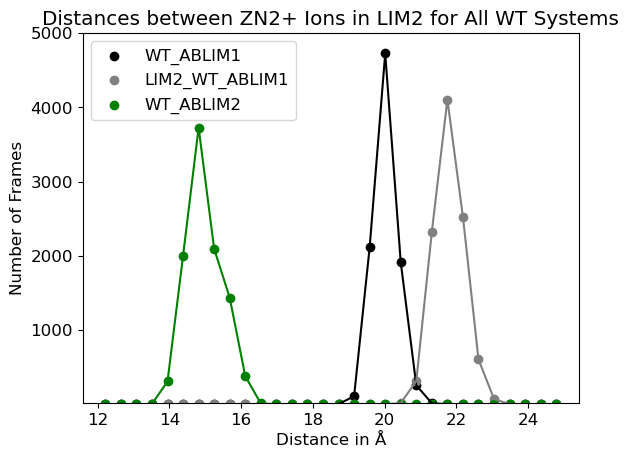

In [ ]:
#ZN Distance Histogram w/out bars, just outline
for i in range(len(bin_counts)):
    #get bin centers & convert them into scatterplot with lines connecting for each system
    bin_centers = (bin_edges[:-1] + bin_edges[1:])/2.
    plt.scatter(x=bin_centers,y=bin_counts[i],color=colors[i],label=systems[i])
    plt.plot(bin_centers,bin_counts[i],color=colors[i])

title="Distances between ZN2+ Ions in LIM2 for All WT Systems"
plt.title(title)
plt.xlabel("Distance in Å")
plt.ylabel("Number of Frames")
#ax.figure.set_size_inches(8.0,6.0)
plt.legend()
plt.ylim(20,5000)

name='WT_LIM2_ZN_Distances_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

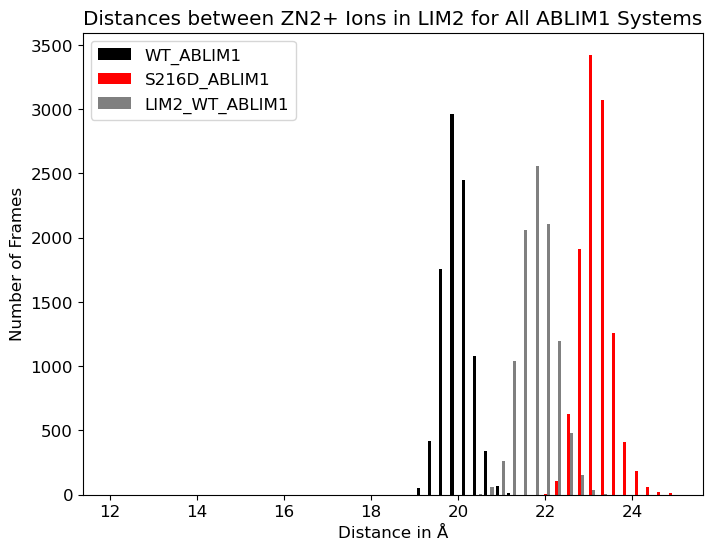

In [ ]:
#HISTOGRAM OF DISTANCES BETWEEN ZINC IONS OF ABLIM1 STRUCTURES

systems=['WT_ABLIM1','S216D_ABLIM1','LIM2_WT_ABLIM1']
color_num=0

n_bins = 50

fig, ax = plt.subplots()
x_multi=[]
colors = ['black','red', 'gray']
#fig=plt.figure(figsize=(14,5))

for system in systems:
    os.chdir(path/system)
    if system=='WT_ABLIM1':
        zn1=573
        zn2=574
        zns='@573 @574'
    elif system=='S216D_ABLIM1':
        zn1=578
        zn2=579
        zns=':252 :253'
    elif system=='LIM2_WT_ABLIM1':
        zn1=140
        zn2=141
        zns=':64 :65'
    else:
        zn1=179
        zn2=180
        zns=':82 :83'

    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    traj4=pt.iterload(trajectory[3],topology[3])
    traj5=pt.iterload(trajectory[4],topology[4])
    traj6=pt.iterload(trajectory[5],topology[5])
    traj7=pt.iterload(trajectory[6],topology[6])
    ZN_distances1=pt.distance(traj1, mask=zns)
    ZN_distances2=pt.distance(traj2, mask=zns)
    ZN_distances3=pt.distance(traj3, mask=zns)
    ZN_distances4=pt.distance(traj4, mask=zns)
    ZN_distances5=pt.distance(traj5, mask=zns)
    ZN_distances6=pt.distance(traj6, mask=zns)
    ZN_distances7=pt.distance(traj7, mask=zns)

    #take each replicate distance in a system in a list
    multiple_lists = [ZN_distances1,ZN_distances2,ZN_distances3,ZN_distances4,ZN_distances5,ZN_distances6,ZN_distances7]
    #convert list to array
    arrays = [np.array(x) for x in multiple_lists]
    #calculate mean of all replicates' ZN distances to find the system's mean ZN distance
    means=[np.mean(k) for k in zip(*arrays)]

    #print(means)
    x_multi.append(means[50:])

    legend=system+ ' mean'

#Find edges of histogram for each system

counts,edges,bars=ax.hist(x_multi, n_bins, histtype='bar',range=(12,25),color=colors,label=systems)
ax.set_title('different sample sizes')

title="Distances between ZN2+ Ions in LIM2 for All ABLIM1 Systems"
plt.title(title)
plt.xlabel("Distance in Å")
plt.ylabel("Number of Frames")
ax.figure.set_size_inches(8.0,6.0)
ax.legend()
#for b in bars:
#    ax.bar_label(b, labels=[v.astype(np.int64) if v > 0 else '' for v in b.datavalues])

name='ABLIM1_ZN_Distances_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

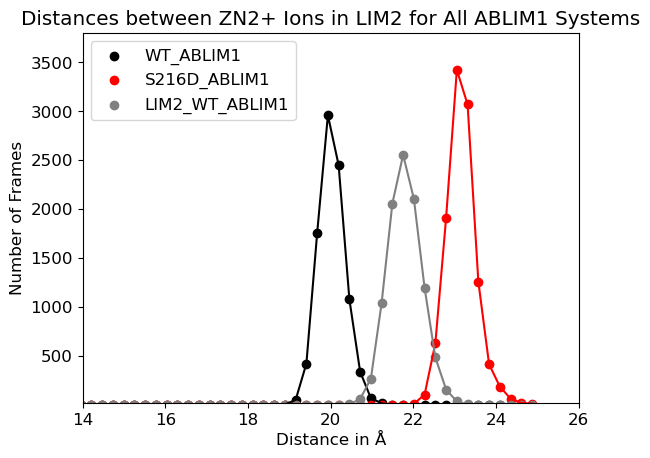

In [ ]:
for i in range(len(counts)):
    bin_centres = (edges[:-1] + edges[1:])/2.
    plt.scatter(x=bin_centres,y=counts[i],color=colors[i],label=systems[i])
    plt.plot(bin_centres,counts[i],color=colors[i])

title="Distances between ZN2+ Ions in LIM2 for All ABLIM1 Systems"
plt.title(title)
plt.xlabel("Distance in Å")
plt.ylabel("Number of Frames")
#ax.figure.set_size_inches(8.0,6.0)
plt.legend(loc='upper left')
#for b in bars:
#    ax.bar_label(b, labels=[v.astype(np.int64) if v > 0 else '' for v in b.datavalues])
plt.ylim(20,3800)
plt.xlim(14,26)

name='ABLIM1_ZN_Distances_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

pytraj.TrajectoryIterator, 10001 frames: 
Size: 0.040237 (GB)
<Topology: 180 atoms, 83 residues, 180 mols, PBC with box type = cubic>
           
pytraj.TrajectoryIterator, 10001 frames: 
Size: 0.040237 (GB)
<Topology: 180 atoms, 83 residues, 180 mols, PBC with box type = cubic>
           
[16.89501584 16.75842593 15.64832133 ... 13.75413317 13.64729012
 13.70563855]
[16.67139963 15.11289987 15.29206447 ... 11.84923778 11.65968066
 11.76282118]


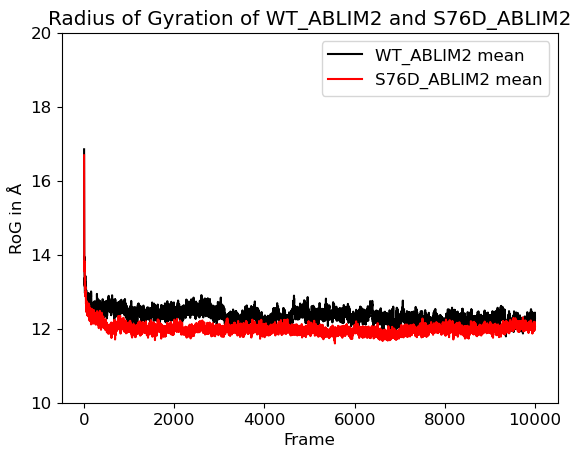

In [ ]:
#WT_ABLIM2 & S76D_ABLIM2 Mean RoG


system1='WT_ABLIM2'
os.chdir(path/system1)

WT_traj1=pt.iterload(trajectory[0],topology[0])
WT_traj2=pt.iterload(trajectory[1],topology[1])
WT_traj3=pt.iterload(trajectory[2],topology[2])
WT_traj4=pt.iterload(trajectory[3],topology[3])
WT_traj5=pt.iterload(trajectory[4],topology[4])
WT_traj6=pt.iterload(trajectory[5],topology[5])
WT_traj7=pt.iterload(trajectory[6],topology[6])
print(WT_traj1)

system2='S76D_ABLIM2'
os.chdir(path/system2)
S76D_traj1=pt.iterload(trajectory[0],topology[0])
S76D_traj2=pt.iterload(trajectory[1],topology[1])
S76D_traj3=pt.iterload(trajectory[2],topology[2])
S76D_traj4=pt.iterload(trajectory[3],topology[3])
S76D_traj5=pt.iterload(trajectory[4],topology[4])
S76D_traj6=pt.iterload(trajectory[5],topology[5])
S76D_traj7=pt.iterload(trajectory[6],topology[6])
print(S76D_traj1)

os.chdir(path)

WT_data1=pt.radgyr(WT_traj1, mask='@BB')
WT_data2=pt.radgyr(WT_traj2, mask='@BB')
WT_data3=pt.radgyr(WT_traj3, mask='@BB')
WT_data4=pt.radgyr(WT_traj4, mask='@BB')
WT_data5=pt.radgyr(WT_traj5, mask='@BB')
WT_data6=pt.radgyr(WT_traj6, mask='@BB')
WT_data7=pt.radgyr(WT_traj7, mask='@BB')
print(WT_data1)

S76D_data1=pt.radgyr(S76D_traj1, mask='@BB')
S76D_data2=pt.radgyr(S76D_traj2, mask='@BB')
S76D_data3=pt.radgyr(S76D_traj3, mask='@BB')
S76D_data4=pt.radgyr(S76D_traj4, mask='@BB')
S76D_data5=pt.radgyr(S76D_traj5, mask='@BB')
S76D_data6=pt.radgyr(S76D_traj6, mask='@BB')
S76D_data7=pt.radgyr(S76D_traj7, mask='@BB')
print(S76D_data1)


WT_multiple_lists = [WT_data1,WT_data2,WT_data3,WT_data4,WT_data5,WT_data6,WT_data7]
WT_arrays = [np.array(x) for x in WT_multiple_lists]
WT_means=[np.mean(k) for k in zip(*WT_arrays)]
WT_sds=[np.std(k) for k in zip(*WT_arrays)]

S76D_multiple_lists = [S76D_data1,S76D_data2,S76D_data3,S76D_data4,S76D_data5,S76D_data6,S76D_data7]
S76D_arrays = [np.array(x) for x in S76D_multiple_lists]
S76D_means=[np.mean(k) for k in zip(*S76D_arrays)]
S76D_sds=[np.std(k) for k in zip(*S76D_arrays)]

fig,ax = plt.subplots()
#fig=plt.figure(figsize=(14,5))
#WTx1=np.arange(0,len(WT_data1))
#WTx2=np.arange(0,len(WT_data2))
#WTx3=np.arange(0,len(WT_data3))
WTx4=np.arange(0,len(WT_means))

#S76Dx1=np.arange(0,len(S76D_data1))
#S76Dx2=np.arange(0,len(S76D_data2))
#S76Dx3=np.arange(0,len(S76D_data3))
S76Dx4=np.arange(0,len(S76D_means))

#WTy1=np.array(WT_data1)
#WTy2=np.array(WT_data2)
#WTy3=np.array(WT_data3)
WTy4=np.array(WT_means)

#S76Dy1=np.array(S76D_data1)
#S76Dy2=np.array(S76D_data2)
#S76Dy3=np.array(S76D_data3)
S76Dy4=np.array(S76D_means)


ax=plt.gca()
ax.set_ylim(10.0,20.0)
#ax.plot(WTx1,WTy1,linestyle='-',color='red',label='WT triplicate 1')
#ax.plot(WTx2,WTy2,linestyle='-',color='indianred',label='WT triplicate 2')
#ax.plot(WTx3,WTy3,linestyle='-',color='lightcoral',label='WT triplicate 3')
ax.plot(WTx4,WTy4,linestyle='-',color='black',label='WT_ABLIM2 mean')
#ax.plot(S76Dx1,S76Dy1,linestyle='-',color='darkblue',label='S76D triplicate 1')
#ax.plot(S76Dx2,S76Dy2,linestyle='-',color='blue',label='S76D triplicate 2')
#ax.plot(S76Dx3,S76Dy3,linestyle='-',color='cornflowerblue',label='S76D triplicate 3')
ax.plot(S76Dx4,S76Dy4,linestyle='-',color='red',label='S76D_ABLIM2 mean')
title="Radius of Gyration of " + system1 + ' and ' + system2
leg=ax.legend()
plt.title(title)
plt.xlabel("Frame")
plt.ylabel("RoG in Å")

name=system1 + '_' + system2+'_ROG.png'
plt.gcf().savefig(name,dpi=300)
plt.show()

pytraj.TrajectoryIterator, 10001 frames: 
Size: 0.040237 (GB)
<Topology: 180 atoms, 83 residues, 180 mols, PBC with box type = cubic>
           


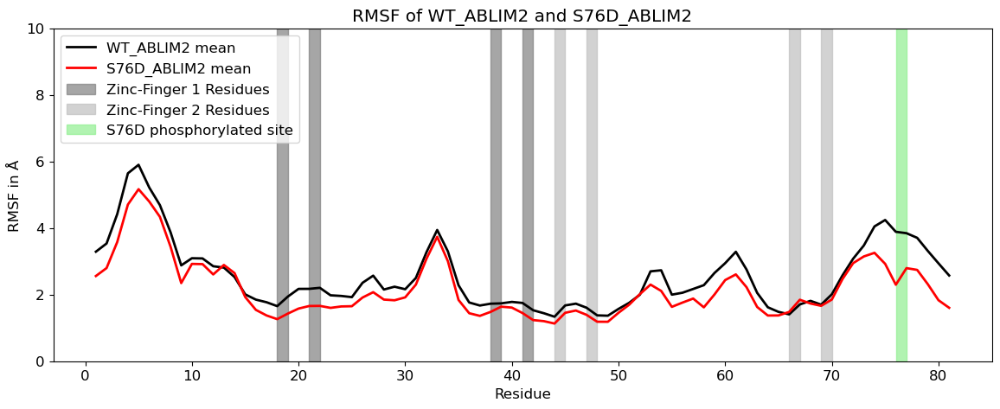

In [ ]:
#OVERLAY WT_ABLIM2 & S76D_ABLIM2 RMSF

system1='WT_ABLIM2'
os.chdir(path/system1)

WT_traj1=pt.iterload(trajectory[0],topology[0])
WT_traj2=pt.iterload(trajectory[1],topology[1])
WT_traj3=pt.iterload(trajectory[2],topology[2])
WT_traj4=pt.iterload(trajectory[3],topology[3])
WT_traj5=pt.iterload(trajectory[4],topology[4])
WT_traj6=pt.iterload(trajectory[5],topology[5])
WT_traj7=pt.iterload(trajectory[6],topology[6])
print(WT_traj1)

system2='S76D_ABLIM2'
os.chdir(path/system2)
S76D_traj1=pt.iterload(trajectory[0],topology[0])
S76D_traj2=pt.iterload(trajectory[1],topology[1])
S76D_traj3=pt.iterload(trajectory[2],topology[2])
S76D_traj4=pt.iterload(trajectory[3],topology[3])
S76D_traj5=pt.iterload(trajectory[4],topology[4])
S76D_traj6=pt.iterload(trajectory[5],topology[5])
S76D_traj7=pt.iterload(trajectory[6],topology[6])
os.chdir(path)

#Calculate RMSF for each replicate of each system
WT_traj1_imposed= pt.superpose(WT_traj1,ref=0)
WTrmsf_data1=pt.rmsf(WT_traj1_imposed,mask='@BB',options='byres')
#print(WTrmsf_data1.T[0])

WT_traj2_imposed= pt.superpose(WT_traj2,ref=0)
WTrmsf_data2=pt.rmsf(WT_traj2_imposed,mask='@BB',options='byres')
#print(WTrmsf_data2.T[0])

WT_traj3_imposed= pt.superpose(WT_traj3,ref=0)
WTrmsf_data3=pt.rmsf(WT_traj3_imposed,mask='@BB',options='byres')
#print(rmsf_data3)
WT_traj4_imposed= pt.superpose(WT_traj4,ref=0)
WTrmsf_data4=pt.rmsf(WT_traj4_imposed,mask='@BB',options='byres')

WT_traj5_imposed= pt.superpose(WT_traj5,ref=0)
WTrmsf_data5=pt.rmsf(WT_traj5_imposed,mask='@BB',options='byres')

WT_traj6_imposed= pt.superpose(WT_traj6,ref=0)
WTrmsf_data6=pt.rmsf(WT_traj6_imposed,mask='@BB',options='byres')

WT_traj7_imposed= pt.superpose(WT_traj7,ref=0)
WTrmsf_data7=pt.rmsf(WT_traj7_imposed,mask='@BB',options='byres')

S76D_traj1_imposed= pt.superpose(S76D_traj1,ref=0)
S76Drmsf_data1=pt.rmsf(S76D_traj1_imposed,mask='@BB',options='byres')
#print(S76Drmsf_data1)

S76D_traj2_imposed= pt.superpose(S76D_traj2,ref=0)
S76Drmsf_data2=pt.rmsf(S76D_traj2_imposed,mask='@BB',options='byres')
#print(rmsf_data2)

S76D_traj3_imposed= pt.superpose(S76D_traj3,ref=0)
S76Drmsf_data3=pt.rmsf(S76D_traj3_imposed,mask='@BB',options='byres')
#print(rmsf_data3)

S76D_traj4_imposed= pt.superpose(S76D_traj4,ref=0)
S76Drmsf_data4=pt.rmsf(S76D_traj4_imposed,mask='@BB',options='byres')

S76D_traj5_imposed= pt.superpose(S76D_traj5,ref=0)
S76Drmsf_data5=pt.rmsf(S76D_traj5_imposed,mask='@BB',options='byres')

S76D_traj6_imposed= pt.superpose(S76D_traj6,ref=0)
S76Drmsf_data6=pt.rmsf(S76D_traj6_imposed,mask='@BB',options='byres')

S76D_traj7_imposed= pt.superpose(S76D_traj7,ref=0)
S76Drmsf_data7=pt.rmsf(S76D_traj7_imposed,mask='@BB',options='byres')


#generate list of RMSFs, convert to arrays, and calculate mean of all arrays
WT_multiple_lists = [WTrmsf_data1.T[1],WTrmsf_data2.T[1],WTrmsf_data3.T[1],WTrmsf_data4.T[1],WTrmsf_data5.T[1],WTrmsf_data6.T[1],WTrmsf_data7.T[1]]
WT_arrays = [np.array(x) for x in WT_multiple_lists]
WT_means=[np.mean(k) for k in zip(*WT_arrays)]

#print(len(WT_means))
#print(WT_means)


S76D_multiple_lists = [S76Drmsf_data1.T[1],S76Drmsf_data2.T[1],S76Drmsf_data3.T[1],S76Drmsf_data4.T[1],S76Drmsf_data5.T[1],S76Drmsf_data6.T[1],S76Drmsf_data7.T[1]]
S76D_arrays = [np.array(x) for x in S76D_multiple_lists]
S76D_means=[np.mean(k) for k in zip(*S76D_arrays)]
#print(S76D_means)


fig=plt.figure(figsize=(14,5))
ax=plt.gca()
ax.set_ylim(0.0,10.0)
ax.plot(WTrmsf_data1.T[0],WT_means,linestyle='-',linewidth=2.0,color='black',label='WT_ABLIM2 mean')
ax.plot(S76Drmsf_data1.T[0],S76D_means,linestyle='-',linewidth=2.0,color='red',label='S76D_ABLIM2 mean')

#Add highlighted regions to figure for ZN finger 1
finger1_constraints=[18,21,38,41]
for constraint in finger1_constraints:
    res=constraint
    if res==18:
        plt.axvspan(res,res+1, color='gray',alpha=0.7,label='Zinc-Finger 1 Residues')
    else:
        plt.axvspan(res,res+1, color='gray',alpha=0.7)

#Add highlighted regions to figure for ZN finger 2
finger2_constraints=[44,47,66,69,76]
for constraint in finger2_constraints:
    res=constraint
    if res==44:
        plt.axvspan(res,res+1, color='silver',alpha=0.7,label='Zinc-Finger 2 Residues')
    elif res==76:
        #also highlight the phosphorylation site at the tail of ABLIM2 LIM2
        plt.axvspan(res,res+1, color='lightgreen',alpha=0.7,label='S76D phosphorylated site')
    else:
        plt.axvspan(res,res+1, color='silver',alpha=0.7)

title="RMSF of " + system1 + ' and ' + system2
leg=ax.legend()
plt.title(title)
plt.xlabel("Residue")
plt.ylabel("RMSF in Å")

os.chdir(path)
name=system1 + '_RMSF.png'
plt.gcf().savefig(name,dpi=300)
plt.show()

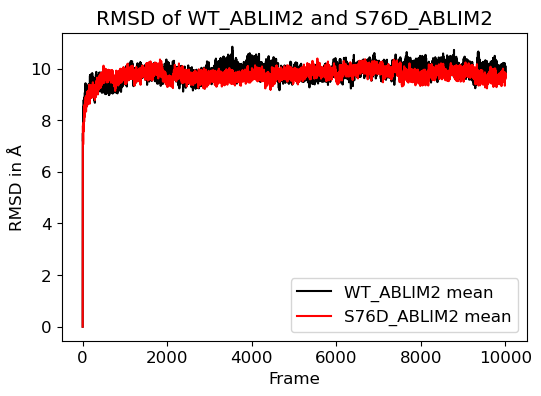

In [ ]:
#Overlay of WT_ABLIM2 & S76D_ABLIM2 RMSD

system1='WT_ABLIM2'
system2='S76D_ABLIM2'

os.chdir(path/system1)
os.chdir(path/system1)
WT_data1=pt.rmsd(WT_traj1, mask='@BB')
WT_data2=pt.rmsd(WT_traj2, mask='@BB')
WT_data3=pt.rmsd(WT_traj3, mask='@BB')
WT_data4=pt.rmsd(WT_traj4, mask='@BB')
WT_data5=pt.rmsd(WT_traj5, mask='@BB')
WT_data6=pt.rmsd(WT_traj6, mask='@BB')
WT_data7=pt.rmsd(WT_traj7, mask='@BB')
#print(WT_data1)

os.chdir(path/system2)
S76D_data1=pt.rmsd(S76D_traj1, mask='@BB')
S76D_data2=pt.rmsd(S76D_traj2, mask='@BB')
S76D_data3=pt.rmsd(S76D_traj3, mask='@BB')
S76D_data4=pt.rmsd(S76D_traj4, mask='@BB')
S76D_data5=pt.rmsd(S76D_traj5, mask='@BB')
S76D_data6=pt.rmsd(S76D_traj6, mask='@BB')
S76D_data7=pt.rmsd(S76D_traj7, mask='@BB')
#print(S76D_data1)

os.chdir(path)
WT_multiple_lists = [WT_data1,WT_data2,WT_data3,WT_data4,WT_data5,WT_data6,WT_data7]
WT_arrays = [np.array(x) for x in WT_multiple_lists]
WT_means=[np.mean(k) for k in zip(*WT_arrays)]
WT_sds=[np.std(k) for k in zip(*WT_arrays)]

S76D_multiple_lists = [S76D_data1,S76D_data2,S76D_data3,S76D_data4,S76D_data5,S76D_data6,S76D_data7]
S76D_arrays = [np.array(x) for x in S76D_multiple_lists]
S76D_means=[np.mean(k) for k in zip(*S76D_arrays)]
S76D_sds=[np.std(k) for k in zip(*S76D_arrays)]


fig,ax = plt.subplots()
#fig=plt.figure(figsize=(14,5))
#WTx1=np.arange(0,len(WT_data1))
#WTx2=np.arange(0,len(WT_data2))
#WTx3=np.arange(0,len(WT_data3))
WTx4=np.arange(0,len(WT_means))

#S76Dx1=np.arange(0,len(S76D_data1))
#S76Dx2=np.arange(0,len(S76D_data2))
#S76Dx3=np.arange(0,len(S76D_data3))
S76Dx4=np.arange(0,len(S76D_means))

#WTy1=np.array(WT_data1)
#WTy2=np.array(WT_data2)
#WTy3=np.array(WT_data3)
WTy4=np.array(WT_means)

#S76Dy1=np.array(S76D_data1)
#S76Dy2=np.array(S76D_data2)
#S76Dy3=np.array(S76D_data3)
S76Dy4=np.array(S76D_means)


ax=plt.gca()
ax.plot(WTx4,WTy4,linestyle='-',color='black',label='WT_ABLIM2 mean')
ax.plot(S76Dx4,S76Dy4,linestyle='-',color='red',label='S76D_ABLIM2 mean')
title="RMSD of " + system1 + ' and ' + system2
leg=ax.legend()
plt.title(title)
plt.xlabel("Frame")
plt.ylabel("RMSD in Å")
ax.figure.set_size_inches(6.0,4.0)

os.chdir(path)
name=system1 + '_' + system2+'_RMSD.png'
plt.gcf().savefig(name,dpi=300)
plt.show()

In [ ]:
#LIM2 ZN Coordination
#--ServerApp.iopub_data_rate_limit=2000000

lim2_systems=['WT_ABLIM2','S76D_ABLIM2','LIM2_WT_ABLIM1']


list_of_pairs=[]
mean_distance_matrix=[]
sd_distance_matrix=[]


for system in lim2_systems:
    os.chdir(path/system)
    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    traj4=pt.iterload(trajectory[3],topology[3])
    traj5=pt.iterload(trajectory[4],topology[4])
    traj6=pt.iterload(trajectory[5],topology[5])
    traj7=pt.iterload(trajectory[6],topology[6])

    if system=='LIM2_WT_ABLIM1':
        constraints=LIM2_WT_ABLIM1_constraints
        zn1=140
        zn2=141
    else:
        constraints=ABLIM2_constraints
        zn1=179
        zn2=180

    for key, value in constraints.items():
        for i in range(0,4):
            #print(type(combo))
            zinc=key
            atom=value[i]
            pair=atom + ' ' + zinc
            list_of_pairs.append(system+ ' ' + atom[1:] + ' ' + zinc[1:])
            #print(pair)


            data1=pt.distance(traj1,pair)
            data2=pt.distance(traj2,pair)
            data3=pt.distance(traj3,pair)
            data4=pt.distance(traj4,pair)
            data5=pt.distance(traj5,pair)
            data6=pt.distance(traj6,pair)
            data7=pt.distance(traj7,pair)
            #list of all triplicate
            triple_list=[data1,data2,data3,data4,data5,data6,data7]
            tripl_arrays = [np.array(x) for x in triple_list]
            means=[np.mean(k) for k in zip(*tripl_arrays)]
            sds=[np.std(k) for k in zip(*tripl_arrays)]
            #print(means)
            mean_distance_matrix.append(means)
            sd_distance_matrix.append(sds)


final_mean_matrix=[]
final_sd_matrix=[]
list=[]
for i in range(len(list_of_pairs)):
    mean_list=[]
    sd_list=[]
    for j in range(len(mean_distance_matrix[0])):
        mean_list.append(mean_distance_matrix[i])
        sd_list.append(sd_distance_matrix[i])

    mean_arrays = [np.array(x) for x in mean_list]
    #print(mean_arrays)
    final_means=[np.mean(k) for k in zip(*mean_arrays)]
    final_mean_matrix.append(final_means)

    sd_arrays=[np.array(x) for x in sd_list]
    final_sds=[np.mean(k) for k in zip(*sd_arrays)]
    final_sd_matrix.append(final_sds)

print(len(list_of_pairs))
print(len(mean_distance_matrix[0]))
print(len(sd_distance_matrix[0]))

print(len(final_sds_matrix))
print(len(final_sds_matrix[0]))
#print(list_of_pairs)
#print(mean_distance_matrix)
#print(sd_distance_matrix)
'''
fig,ax=plt.subplots()
x=list_of_pairs
y=final_mean_matrix
e=final_sd_matrix
plt.title('Mean & SD Distances of each Residue-Ion pairing for Isolated LIM2 domains')
plt.xlabel('Residue-Ion Pairing')
plt.bar(x,y,yerr=e, align='center',alpha=0.5,color='red')
ax.figure.set_size_inches(6.0,3.0)
plt.savefig('LIM2_ResIon_Distances.png')
plt.show()
'''
#print(distance_matrix)

10001


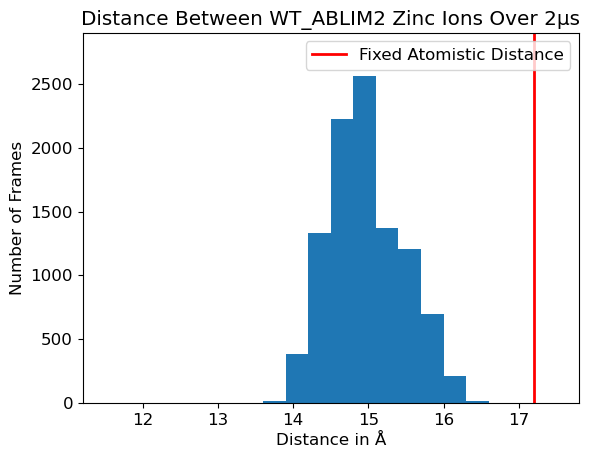

In [76]:
#CG WT_ABLIM2 vs atomistic WT_ABLIM2 distances

system1='WT_ABLIM2'


os.chdir(path+'/'+system1)

zn1=179
zn2=180
zns=':82 :83'

traj1=pt.iterload(trajectory[0],topology[0])
traj2=pt.iterload(trajectory[1],topology[1])
traj3=pt.iterload(trajectory[2],topology[2])
traj4=pt.iterload(trajectory[3],topology[3])
traj5=pt.iterload(trajectory[4],topology[4])
traj6=pt.iterload(trajectory[5],topology[5])
traj7=pt.iterload(trajectory[6],topology[6])
ZN_distances1=pt.distance(traj1, mask=zns)
ZN_distances2=pt.distance(traj2, mask=zns)
ZN_distances3=pt.distance(traj3, mask=zns)
ZN_distances4=pt.distance(traj4, mask=zns)
ZN_distances5=pt.distance(traj5, mask=zns)
ZN_distances6=pt.distance(traj6, mask=zns)
ZN_distances7=pt.distance(traj7, mask=zns)
#print(ZN_distances1)


multiple_lists = [ZN_distances1,ZN_distances2,ZN_distances3,ZN_distances4,ZN_distances5,ZN_distances6,ZN_distances7]
arrays = [np.array(x) for x in multiple_lists]
means=[np.mean(k) for k in zip(*arrays)]
sd=[np.std(k) for k in zip(*arrays)]

print(len(means))

count,edges,bars=plt.hist(means,bins=20,range=(11.5,17.5))
#plt.bar_label(bars)
plt.axvline(x=17.2, linewidth=2, label= 'Fixed Atomistic Distance',color='red')

# Add label
plt.legend(loc = 'upper right')


#atomistic_mean=[17.2]
#atomistic_sd=[0.0]


plt.title('Distance Between WT_ABLIM2 Zinc Ions Over 2μs')
plt.xlabel('Distance in Å')
plt.ylabel('Number of Frames')
plt.ylim(0,2900)

os.chdir(path)
name='WT_ABLIM2_ZN_Hist.png'
plt.gcf().savefig(name,dpi=300)
plt.show()

6.826104182011202
7.94483704821919
6.305927632220219
7.074878798059145
6.421643182187109
7.410447302375852
7.3128911061654565
7.400270662734629


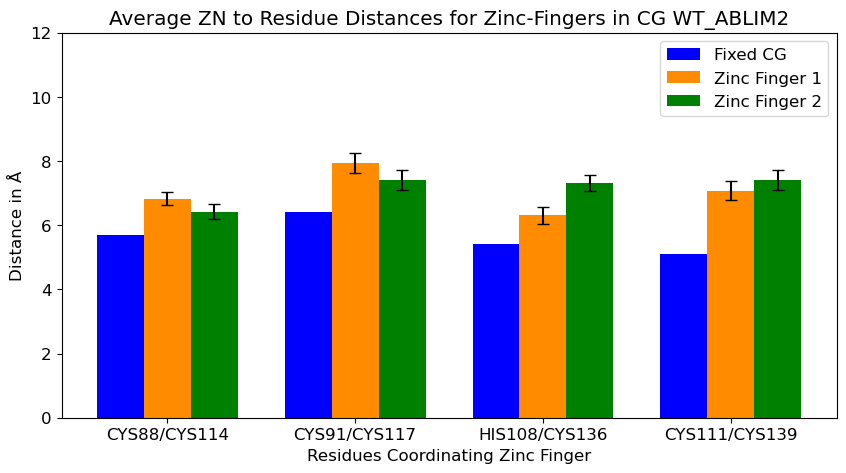

In [4]:
#DISTANCE BETWEEN ZNS AND COORDINATING RESIDUES IN WT_ABLIM2
#unfinished cell as it was deemed not super relevant for CG simulation that was constrained

import statistics

system='WT_ABLIM2_71-151'


os.chdir(path+'/'+system)

ABLIM2_constraints={'@179':['@40','@48','@87','@93'],'@180':['@101','@106','@149','@156']}

traj1=pt.iterload(trajectory[0],topology[0])
traj2=pt.iterload(trajectory[1],topology[1])
traj3=pt.iterload(trajectory[2],topology[2])
traj4=pt.iterload(trajectory[3],topology[3])
traj5=pt.iterload(trajectory[4],topology[4])
traj6=pt.iterload(trajectory[5],topology[5])
traj7=pt.iterload(trajectory[6],topology[6])
os.chdir(path)

fingers=['Fixed Atomistic Finger 1','CG Zinc-Finger 1','CG Zinc-Finger 2']

constraints=ABLIM2_constraints

#print(constraints)

fixed_dist=(5.7,6.4,5.4,5.1)
finger1_means=[]
finger2_means=[]
e1=[]
e2=[]

for key, value in constraints.items():
    finger_means=[]
    if key=='@179':
        for i in range(0,4):
        #print(type(combo))
            zinc=key
            atom=value[i]
            pair=atom + ' ' + zinc
            #print(pair)
            distance1=pt.distance(traj1,pair)
            distance2=pt.distance(traj2,pair)
            distance3=pt.distance(traj3,pair)
            distance4=pt.distance(traj4,pair)
            distance5=pt.distance(traj5,pair)
            distance6=pt.distance(traj6,pair)
            distance7=pt.distance(traj7,pair)
            distances=[distance1,distance2,distance3,distance4,distance5,distance6,distance7]
            distance_arrays = [np.array(x) for x in distances]
            #print(mean_arrays)
            means=[np.mean(k) for k in zip(*distance_arrays)]
            true_mean=statistics.fmean(means)
            sds=[np.std(j) for j in zip(*distance_arrays)]
            e1.append(np.std(sds))
            print(true_mean)
            finger1_means.append(true_mean)
            #print(len(means))
            #print(type(means))

            #print(len(finger_means))
            #final_array=[np.array(j) for j in finger_means]
            #final_means=[np.mean(l) for l in zip(*final_array)]
            #finger1_means.append(final_means)
        #print(len(finger1_means))
        #print(finger1_means)
    else:
        for i in range(0,4):
        #print(type(combo))
            zinc=key
            atom=value[i]
            pair=atom + ' ' + zinc
            #print(pair)
            distance1=pt.distance(traj1,pair)
            distance2=pt.distance(traj2,pair)
            distance3=pt.distance(traj3,pair)
            distance4=pt.distance(traj4,pair)
            distance5=pt.distance(traj5,pair)
            distance6=pt.distance(traj6,pair)
            distance7=pt.distance(traj7,pair)
            distances=[distance1,distance2,distance3,distance4,distance5,distance6,distance7]
            distance_arrays = [np.array(x) for x in distances]
            #print(mean_arrays)
            means=[np.mean(k) for k in zip(*distance_arrays)]
            sds=[np.std(j) for j in zip(*distance_arrays)]
            e2.append(np.std(sds))
            true_mean=statistics.fmean(means)
            print(true_mean)
            finger2_means.append(true_mean)
            #final_array=[np.array(j) for j in finger_means]
            #final_means=[np.mean(l) for l in zip(*final_array)]
            #finger2_means.append(final_means)
        #print(len(finger2_means))
        #print(finger2_means)

#print(finger1_means)
#print(len(finger1_means))

N=4
# Specify the values of blue bars (height)
#blue_bar = (2.1,2.8,2.9,3.1)
# Specify the values of orange bars (height)
#orange_bar = (1.9, 2.8, 2.4,2.8)

# Position of bars on x-axis
ind = np.arange(N)

# Figure size
plt.figure(figsize=(10,5))

# Width of a bar
width = 0.25

# Plotting
plt.bar(ind, fixed_dist , width, label='Fixed CG',color='blue')
plt.bar(ind + width, finger1_means,  width, yerr=e1,capsize=4,label='Zinc Finger 1',color='darkorange')
plt.bar(ind + width + width, finger2_means,  width, yerr=e2,capsize=4,label='Zinc Finger 2',color='green')

plt.xlabel('Residues Coordinating Zinc Finger')
plt.ylabel('Distance in Å')
plt.title('Average ZN to Residue Distances for Zinc-Fingers in CG WT_ABLIM2')
plt.ylim(0,12)
# xticks()
# First argument - A list of positions at which ticks should be placed
# Second argument -  A list of labels to place at the given locations
plt.xticks(ind + width, ('CYS88/CYS114','CYS91/CYS117','HIS108/CYS136','CYS111/CYS139'))

# Finding the best position for legends and putting it
plt.legend(loc='best')
name='WT_ABLIM2_ZN_Fingers.png'
plt.gcf().savefig(name,dpi=300)
plt.show()



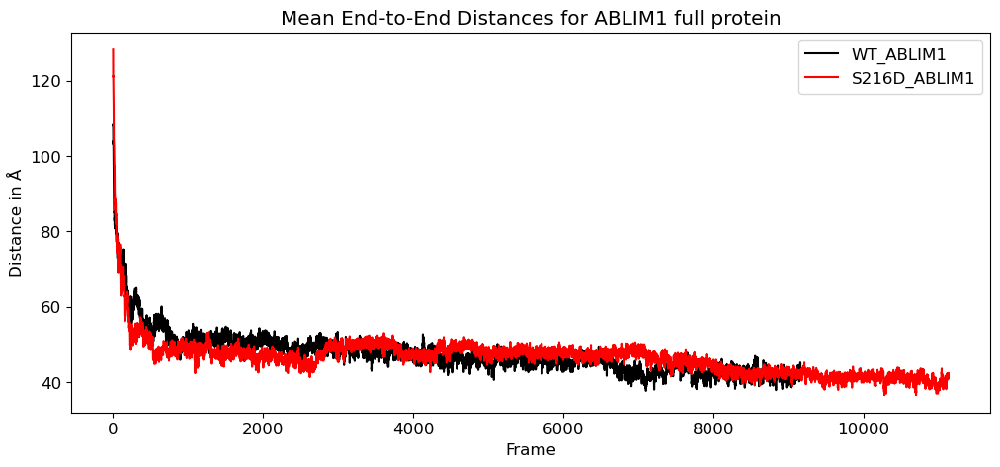

In [ ]:
#MEAN LIM1 TO LIM4 END TO END DISTANCE FOR FULL ABLIM1

systems=['WT_ABLIM1','S216D_ABLIM1']#,'LIM2_WT_ABLIM1','WT_ABLIM2','S76D_ABLIM2']
color_num=0
colors=['black','red']#,'gray','green','lightcoral']

fig,ax=plt.subplots()
#fig=plt.figure(figsize=(14,5))

for system in systems:
    os.chdir(path/system)
    if system=='WT_ABLIM1':
        ends='@1 @569'
    elif system=='S216D_ABLIM1':
        ends='@1 @573'
    elif system=='LIM2_WT_ABLIM1':
        ends='@1 @138'
    else:
        ends='@1 @178'

    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    traj4=pt.iterload(trajectory[3],topology[3])
    traj5=pt.iterload(trajectory[4],topology[4])
    traj6=pt.iterload(trajectory[5],topology[5])
    traj7=pt.iterload(trajectory[6],topology[6])

    end_distances1=pt.distance(traj1, mask=ends)
    end_distances2=pt.distance(traj2, mask=ends)
    end_distances3=pt.distance(traj3, mask=ends)
    end_distances4=pt.distance(traj4, mask=ends)
    end_distances5=pt.distance(traj5, mask=ends)
    end_distances6=pt.distance(traj6, mask=ends)
    end_distances7=pt.distance(traj7, mask=ends)
    #print(ZN_distances1)

    multiple_lists = [end_distances1,end_distances2,end_distances3,end_distances4,end_distances5,end_distances6,end_distances7]
    arrays = [np.array(x) for x in multiple_lists]
    means=[np.mean(k) for k in zip(*arrays)]
    sd=[np.std(k) for k in zip(*arrays)]

    x4=np.arange(0,len(means))
    y4=np.array(means)
    ax.plot(x4,y4,linestyle='-',color=colors[color_num],label=system,zorder=4)
    color_num+=1
    leg = ax.legend()
    title="Mean End-to-End Distances for ABLIM1 all LIM domains protein"
    plt.title(title)
    plt.xlabel("Frame")
    plt.ylabel("Distance in Å")
    ax.figure.set_size_inches(12.0,5.0)

name='mean_LIM1-4_end_to_end_distances.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

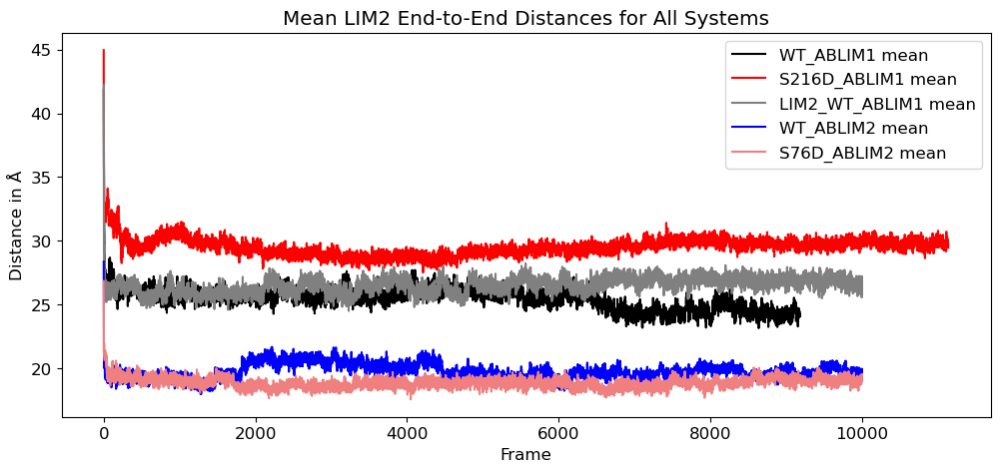

In [ ]:
#MEAN END TO END DISTANCE OF LIM2 FOR ALL SYSTEMS

systems=['WT_ABLIM1','S216D_ABLIM1','LIM2_WT_ABLIM1','WT_ABLIM2','S76D_ABLIM2']
color_num=0
colors=['black','red','gray','blue','lightcoral']

fig,ax=plt.subplots()
#fig=plt.figure(figsize=(14,5))

for system in systems:
    os.chdir(path/system)
    if system=='WT_ABLIM1':
        ends='@144 @280'
    elif system=='S216D_ABLIM1':
        ends='@144 @280'
    elif system=='LIM2_WT_ABLIM1':
        ends='@1 @138'
    else:
        ends='@34 @178'

    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    traj4=pt.iterload(trajectory[3],topology[3])
    traj5=pt.iterload(trajectory[4],topology[4])
    traj6=pt.iterload(trajectory[5],topology[5])
    traj7=pt.iterload(trajectory[6],topology[6])

    end_distances1=pt.distance(traj1, mask=ends)
    end_distances2=pt.distance(traj2, mask=ends)
    end_distances3=pt.distance(traj3, mask=ends)
    end_distances4=pt.distance(traj4, mask=ends)
    end_distances5=pt.distance(traj5, mask=ends)
    end_distances6=pt.distance(traj6, mask=ends)
    end_distances7=pt.distance(traj7, mask=ends)
    #print(ZN_distances1)

    multiple_lists = [end_distances1,end_distances2,end_distances3,end_distances4,end_distances5,end_distances6,end_distances7]
    arrays = [np.array(x) for x in multiple_lists]
    means=[np.mean(k) for k in zip(*arrays)]
    sd=[np.std(k) for k in zip(*arrays)]

    x4=np.arange(0,len(means))
    #y1=np.array(ZN_distances1)
    #y2=np.array(ZN_distances2)
    #y3=np.array(ZN_distances3)
    y4=np.array(means)
    #ax=plt.gca()
    #ax.set_ylim(10.0,31.0)
    #ax.plot(x1,y1,linestyle='-',color='red',label='triplicate 1',zorder=1)
    #ax.plot(x2,y2,linestyle='-',color='blue',label='triplicate 2',zorder=2)
    #ax.plot(x3,y3,linestyle='-',color='green',label='triplicate 3',zorder=3)
    legend=system+ ' mean'
    ax.plot(x4,y4,linestyle='-',color=colors[color_num],label=legend,zorder=4)
    color_num+=1
    leg = ax.legend()
    title="Mean LIM2 End-to-End Distances for All Systems"
    plt.title(title)
    plt.xlabel("Frame")
    plt.ylabel("Distance in Å")
    ax.figure.set_size_inches(12.0,5.0)

name='mean_LIM2_end_to_end_distances.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

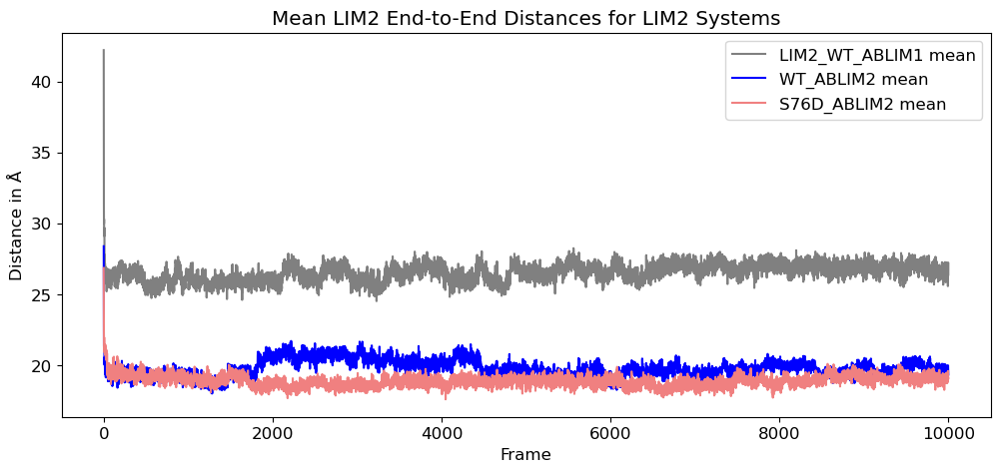

In [ ]:
#END TO END DISTANCE OF LIM2 FOR ONLY LIM2 SYSTEMS

systems=['LIM2_WT_ABLIM1','WT_ABLIM2','S76D_ABLIM2']
color_num=0
colors=['gray','blue','lightcoral']

fig,ax=plt.subplots()
#fig=plt.figure(figsize=(14,5))

for system in systems:
    os.chdir(path/system)
    if system=='WT_ABLIM1':
        ends='@144 @280'
    elif system=='S216D_ABLIM1':
        ends='@144 @280'
    elif system=='LIM2_WT_ABLIM1':
        ends='@1 @138'
    else:
        ends='@34 @178'

    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    traj4=pt.iterload(trajectory[3],topology[3])
    traj5=pt.iterload(trajectory[4],topology[4])
    traj6=pt.iterload(trajectory[5],topology[5])
    traj7=pt.iterload(trajectory[6],topology[6])

    end_distances1=pt.distance(traj1, mask=ends)
    end_distances2=pt.distance(traj2, mask=ends)
    end_distances3=pt.distance(traj3, mask=ends)
    end_distances4=pt.distance(traj4, mask=ends)
    end_distances5=pt.distance(traj5, mask=ends)
    end_distances6=pt.distance(traj6, mask=ends)
    end_distances7=pt.distance(traj7, mask=ends)
    #print(ZN_distances1)

    multiple_lists = [end_distances1,end_distances2,end_distances3,end_distances4,end_distances5,end_distances6,end_distances7]
    arrays = [np.array(x) for x in multiple_lists]
    means=[np.mean(k) for k in zip(*arrays)]
    sd=[np.std(k) for k in zip(*arrays)]

    x4=np.arange(0,len(means))
    #y1=np.array(ZN_distances1)
    #y2=np.array(ZN_distances2)
    #y3=np.array(ZN_distances3)
    y4=np.array(means)
    #ax=plt.gca()
    #ax.set_ylim(10.0,31.0)
    #ax.plot(x1,y1,linestyle='-',color='red',label='triplicate 1',zorder=1)
    #ax.plot(x2,y2,linestyle='-',color='blue',label='triplicate 2',zorder=2)
    #ax.plot(x3,y3,linestyle='-',color='green',label='triplicate 3',zorder=3)
    legend=system+ ' mean'
    ax.plot(x4,y4,linestyle='-',color=colors[color_num],label=legend,zorder=4)
    color_num+=1
    leg = ax.legend()
    title="Mean LIM2 End-to-End Distances for LIM2 Systems"
    plt.title(title)
    plt.xlabel("Frame")
    plt.ylabel("Distance in Å")
    ax.figure.set_size_inches(12.0,5.0)

name='mean_LIM2_only_end_to_end_distances.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

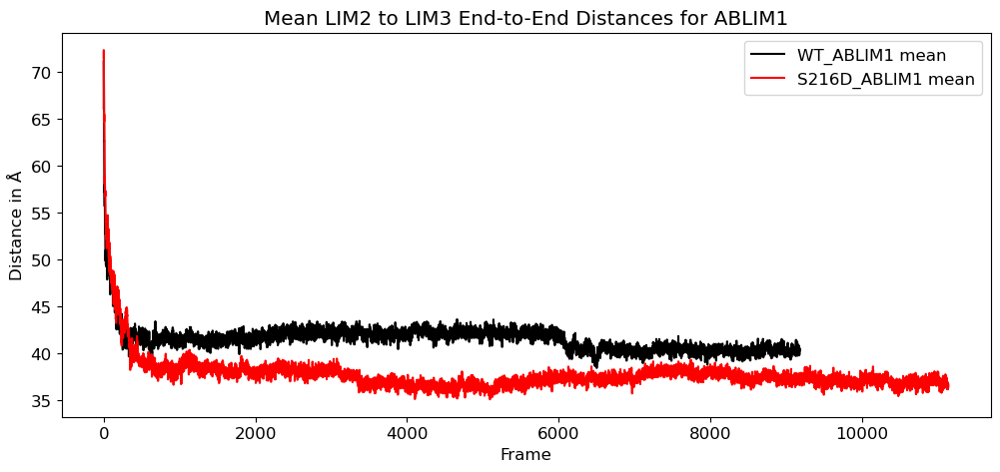

In [ ]:
#END TO END DISTANCE OF LIM2 TO LIM3 FOR ABLIM1 SYSTEMS

systems=['WT_ABLIM1','S216D_ABLIM1']
color_num=0
colors=['black','red']

fig,ax=plt.subplots()
#fig=plt.figure(figsize=(14,5))

for system in systems:
    os.chdir(path/system)
    if system=='WT_ABLIM1':
        ends='@144 @427'
    elif system=='S216D_ABLIM1':
        ends='@144 @427'
    elif system=='LIM2_WT_ABLIM1':
        ends='@1 @138'
    else:
        ends='@34 @178'

    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    traj4=pt.iterload(trajectory[3],topology[3])
    traj5=pt.iterload(trajectory[4],topology[4])
    traj6=pt.iterload(trajectory[5],topology[5])
    traj7=pt.iterload(trajectory[6],topology[6])

    end_distances1=pt.distance(traj1, mask=ends)
    end_distances2=pt.distance(traj2, mask=ends)
    end_distances3=pt.distance(traj3, mask=ends)
    end_distances4=pt.distance(traj4, mask=ends)
    end_distances5=pt.distance(traj5, mask=ends)
    end_distances6=pt.distance(traj6, mask=ends)
    end_distances7=pt.distance(traj7, mask=ends)
    #print(ZN_distances1)

    multiple_lists = [end_distances1,end_distances2,end_distances3,end_distances4,end_distances5,end_distances6,end_distances7]
    arrays = [np.array(x) for x in multiple_lists]
    means=[np.mean(k) for k in zip(*arrays)]
    sd=[np.std(k) for k in zip(*arrays)]

    x4=np.arange(0,len(means))
    #y1=np.array(ZN_distances1)
    #y2=np.array(ZN_distances2)
    #y3=np.array(ZN_distances3)
    y4=np.array(means)
    #ax=plt.gca()
    #ax.set_ylim(10.0,31.0)
    #ax.plot(x1,y1,linestyle='-',color='red',label='triplicate 1',zorder=1)
    #ax.plot(x2,y2,linestyle='-',color='blue',label='triplicate 2',zorder=2)
    #ax.plot(x3,y3,linestyle='-',color='green',label='triplicate 3',zorder=3)
    legend=system+ ' mean'
    ax.plot(x4,y4,linestyle='-',color=colors[color_num],label=legend,zorder=4)
    color_num+=1
    leg = ax.legend()
    title="Mean LIM2 to LIM3 End-to-End Distances for ABLIM1"
    plt.title(title)
    plt.xlabel("Frame")
    plt.ylabel("Distance in Å")
    ax.figure.set_size_inches(12.0,5.0)

name='mean_LIM2_LIM3_end_to_end_distances.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

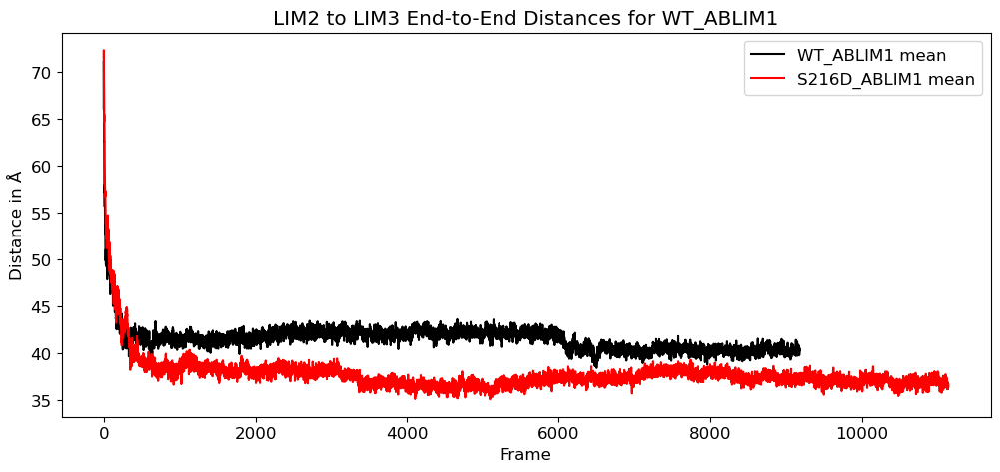

In [ ]:
#END TO END DISTANCE OF LIM2 TO LIM3 FOR WT_ABLIM1

systems=['WT_ABLIM1','S216D_ABLIM1']
color_num=0
colors=['black','red']

fig,ax=plt.subplots()
#fig=plt.figure(figsize=(14,5))

for system in systems:
    os.chdir(path/system)
    if system=='WT_ABLIM1':
        ends='@144 @427'
    elif system=='S216D_ABLIM1':
        ends='@144 @427'
    elif system=='LIM2_WT_ABLIM1':
        ends='@1 @138'
    else:
        ends='@34 @178'

    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    traj4=pt.iterload(trajectory[3],topology[3])
    traj5=pt.iterload(trajectory[4],topology[4])
    traj6=pt.iterload(trajectory[5],topology[5])
    traj7=pt.iterload(trajectory[6],topology[6])

    end_distances1=pt.distance(traj1, mask=ends)
    end_distances2=pt.distance(traj2, mask=ends)
    end_distances3=pt.distance(traj3, mask=ends)
    end_distances4=pt.distance(traj4, mask=ends)
    end_distances5=pt.distance(traj5, mask=ends)
    end_distances6=pt.distance(traj6, mask=ends)
    end_distances7=pt.distance(traj7, mask=ends)
    #print(ZN_distances1)

    multiple_lists = [end_distances1,end_distances2,end_distances3,end_distances4,end_distances5,end_distances6,end_distances7]
    arrays = [np.array(x) for x in multiple_lists]
    means=[np.mean(k) for k in zip(*arrays)]
    sd=[np.std(k) for k in zip(*arrays)]

    #x1=np.arange(len(end_distances1))
    #x2=np.arange(len(end_distances2))
    #x3=np.arange(len(end_distances3))
    x4=np.arange(0,len(means[0:]))

    #y1=np.array(end_distances1)
    #y2=np.array(end_distances2)
    #y3=np.array(end_distances3)
    y4=np.array(means[0:])
    #ax=plt.gca()
    #ax.set_ylim(10.0,31.0)
    #ax.plot(x1,y1,linestyle='-',color='red',label=system+' triplicate 1',zorder=1)
    #ax.plot(x2,y2,linestyle='-',color='blue',label=system+' triplicate 2',zorder=2)
    #ax.plot(x3,y3,linestyle='-',color='green',label=system+' triplicate 3',zorder=3)
    legend=system+ ' mean'
    ax.plot(x4,y4,linestyle='-',color=colors[color_num],label=legend,zorder=4)
    color_num+=1
    leg = ax.legend()
    title="LIM2 to LIM3 End-to-End Distances for WT_ABLIM1"
    plt.title(title)
    plt.xlabel("Frame")
    plt.ylabel("Distance in Å")
    ax.figure.set_size_inches(12.0,5.0)

name='WT_ABLIM1_end_to_end_distances.png'
os.chdir(path)
#plt.gcf().savefig(name,dpi=300)
plt.show()

[127.95984487 126.40505715 121.45041462 ...  26.39428306  26.66520686
  26.02605543]
7136


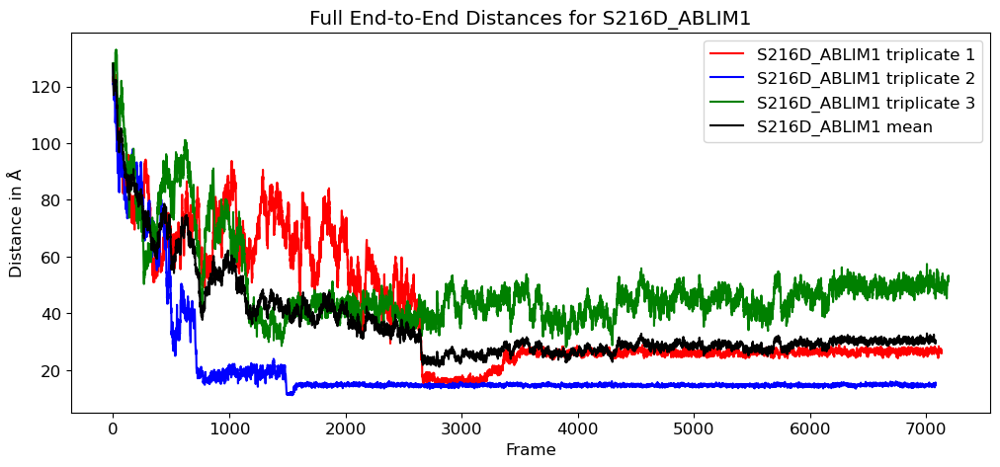

In [ ]:
#END TO END DISTANCE OF LIM2 TO LIM3 FOR ABLIM1 SYSTEMS

systems=['S216D_ABLIM1']
color_num=0
colors=['black','red']

fig,ax=plt.subplots()
#fig=plt.figure(figsize=(14,5))

for system in systems:
    os.chdir(path/system)
    if system=='WT_ABLIM1':
        ends='@1 @569'
    elif system=='S216D_ABLIM1':
        ends='@1 @573'
    elif system=='LIM2_WT_ABLIM1':
        ends='@1 @138'
    else:
        ends='@1 @178'

    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    traj4=pt.iterload(trajectory[3],topology[3])
    traj5=pt.iterload(trajectory[4],topology[4])
    traj6=pt.iterload(trajectory[5],topology[5])
    traj7=pt.iterload(trajectory[6],topology[6])

    end_distances1=pt.distance(traj1, mask=ends)
    end_distances2=pt.distance(traj2, mask=ends)
    end_distances3=pt.distance(traj3, mask=ends)
    end_distances4=pt.distance(traj4, mask=ends)
    end_distances5=pt.distance(traj5, mask=ends)
    end_distances6=pt.distance(traj6, mask=ends)
    end_distances7=pt.distance(traj7, mask=ends)
    #print(ZN_distances1)

    multiple_lists = [end_distances1,end_distances2,end_distances3,end_distances4,end_distances5,end_distances6,end_distances7]
    arrays = [np.array(x) for x in multiple_lists]
    means=[np.mean(k) for k in zip(*arrays)]
    sd=[np.std(k) for k in zip(*arrays)]

    #x1=np.arange(len(end_distances1))
    #x2=np.arange(len(end_distances2))
    #x3=np.arange(len(end_distances3))
    x4=np.arange(0,len(means))

    #y1=np.array(end_distances1)
    #y2=np.array(end_distances2)
    #y3=np.array(end_distances3)
    y4=np.array(means)
    #ax=plt.gca()
    #ax.set_ylim(10.0,31.0)
    #ax.plot(x1,y1,linestyle='-',color='red',label=system+' triplicate 1',zorder=1)
    #ax.plot(x2,y2,linestyle='-',color='blue',label=system+' triplicate 2',zorder=2)
    #ax.plot(x3,y3,linestyle='-',color='green',label=system+' triplicate 3',zorder=3)
    legend=system+ ' mean'
    ax.plot(x4,y4,linestyle='-',color=colors[color_num],label=legend,zorder=4)
    color_num+=1
    leg = ax.legend()
    title="Full End-to-End Distances for S216D_ABLIM1"
    plt.title(title)
    plt.xlabel("Frame")
    plt.ylabel("Distance in Å")
    ax.figure.set_size_inches(12.0,5.0)

name='S216D_ABLIM1_end_to_end_distances.png'
os.chdir(path)
#plt.gcf().savefig(name,dpi=300)
plt.show()

pytraj.TrajectoryIterator, 9772 frames: 
Size: 0.126247 (GB)
<Topology: 578 atoms, 255 residues, 576 mols, PBC with box type = cubic>
           


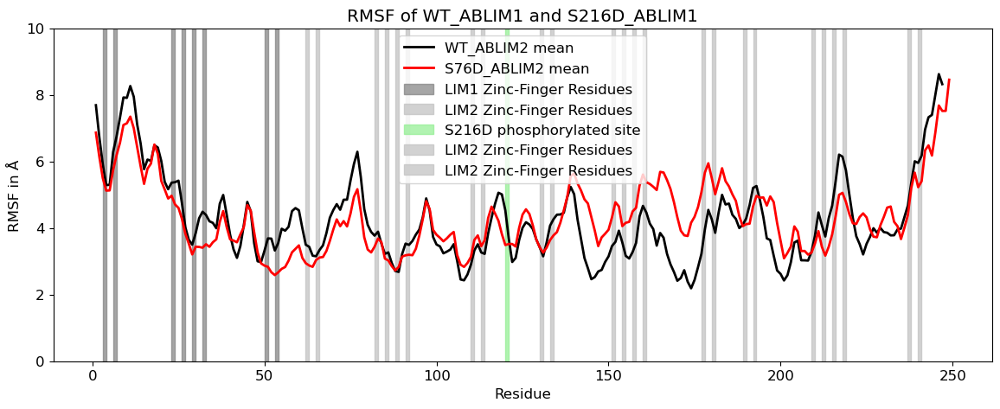

In [ ]:
#OVERLAY WT_ABLIM1 & S216D_ABLIM1 RMSF

system1='WT_ABLIM1'
os.chdir(path/system1)

WT_traj1=pt.iterload(trajectory[0],topology[0])
WT_traj2=pt.iterload(trajectory[1],topology[1])
WT_traj3=pt.iterload(trajectory[2],topology[2])
WT_traj4=pt.iterload(trajectory[3],topology[3])
WT_traj5=pt.iterload(trajectory[4],topology[4])
WT_traj6=pt.iterload(trajectory[5],topology[5])
WT_traj7=pt.iterload(trajectory[6],topology[6])
print(WT_traj1)

system2='S216D_ABLIM1'
os.chdir(path/system2)
S76D_traj1=pt.iterload(trajectory[0],topology[0])
S76D_traj2=pt.iterload(trajectory[1],topology[1])
S76D_traj3=pt.iterload(trajectory[2],topology[2])
S76D_traj4=pt.iterload(trajectory[3],topology[3])
S76D_traj5=pt.iterload(trajectory[4],topology[4])
S76D_traj6=pt.iterload(trajectory[5],topology[5])
S76D_traj7=pt.iterload(trajectory[6],topology[6])
os.chdir(path)

#Calculate RMSF for each replicate of each system
WT_traj1_imposed= pt.superpose(WT_traj1,ref=0)
WTrmsf_data1=pt.rmsf(WT_traj1_imposed,mask='@BB',options='byres')
#print(WTrmsf_data1.T[0])

WT_traj2_imposed= pt.superpose(WT_traj2,ref=0)
WTrmsf_data2=pt.rmsf(WT_traj2_imposed,mask='@BB',options='byres')
#print(WTrmsf_data2.T[0])

WT_traj3_imposed= pt.superpose(WT_traj3,ref=0)
WTrmsf_data3=pt.rmsf(WT_traj3_imposed,mask='@BB',options='byres')
#print(rmsf_data3)
WT_traj4_imposed= pt.superpose(WT_traj4,ref=0)
WTrmsf_data4=pt.rmsf(WT_traj4_imposed,mask='@BB',options='byres')

WT_traj5_imposed= pt.superpose(WT_traj5,ref=0)
WTrmsf_data5=pt.rmsf(WT_traj5_imposed,mask='@BB',options='byres')

WT_traj6_imposed= pt.superpose(WT_traj6,ref=0)
WTrmsf_data6=pt.rmsf(WT_traj6_imposed,mask='@BB',options='byres')

WT_traj7_imposed= pt.superpose(WT_traj7,ref=0)
WTrmsf_data7=pt.rmsf(WT_traj7_imposed,mask='@BB',options='byres')

S76D_traj1_imposed= pt.superpose(S76D_traj1,ref=0)
S76Drmsf_data1=pt.rmsf(S76D_traj1_imposed,mask='@BB',options='byres')
#print(S76Drmsf_data1)

S76D_traj2_imposed= pt.superpose(S76D_traj2,ref=0)
S76Drmsf_data2=pt.rmsf(S76D_traj2_imposed,mask='@BB',options='byres')
#print(rmsf_data2)

S76D_traj3_imposed= pt.superpose(S76D_traj3,ref=0)
S76Drmsf_data3=pt.rmsf(S76D_traj3_imposed,mask='@BB',options='byres')
#print(rmsf_data3)

S76D_traj4_imposed= pt.superpose(S76D_traj4,ref=0)
S76Drmsf_data4=pt.rmsf(S76D_traj4_imposed,mask='@BB',options='byres')

S76D_traj5_imposed= pt.superpose(S76D_traj5,ref=0)
S76Drmsf_data5=pt.rmsf(S76D_traj5_imposed,mask='@BB',options='byres')

S76D_traj6_imposed= pt.superpose(S76D_traj6,ref=0)
S76Drmsf_data6=pt.rmsf(S76D_traj6_imposed,mask='@BB',options='byres')

S76D_traj7_imposed= pt.superpose(S76D_traj7,ref=0)
S76Drmsf_data7=pt.rmsf(S76D_traj7_imposed,mask='@BB',options='byres')


#generate list of RMSFs, convert to arrays, and calculate mean of all arrays
WT_multiple_lists = [WTrmsf_data1.T[1],WTrmsf_data2.T[1],WTrmsf_data3.T[1],WTrmsf_data4.T[1],WTrmsf_data5.T[1],WTrmsf_data6.T[1],WTrmsf_data7.T[1]]
WT_arrays = [np.array(x) for x in WT_multiple_lists]
WT_means=[np.mean(k) for k in zip(*WT_arrays)]

#print(len(WT_means))
#print(WT_means)


S76D_multiple_lists = [S76Drmsf_data1.T[1],S76Drmsf_data2.T[1],S76Drmsf_data3.T[1],S76Drmsf_data4.T[1],S76Drmsf_data5.T[1],S76Drmsf_data6.T[1],S76Drmsf_data7.T[1]]
S76D_arrays = [np.array(x) for x in S76D_multiple_lists]
S76D_means=[np.mean(k) for k in zip(*S76D_arrays)]
#print(S76D_means)


fig=plt.figure(figsize=(14,5))
ax=plt.gca()
ax.set_ylim(0.0,10.0)
ax.plot(WTrmsf_data1.T[0],WT_means,linestyle='-',linewidth=2.0,color='black',label='WT_ABLIM2 mean')
ax.plot(S76Drmsf_data1.T[0],S76D_means,linestyle='-',linewidth=2.0,color='red',label='S76D_ABLIM2 mean')

#FIX THIS TO BE CORRECT FOR THE ZINC FINGERS OF EACH LIM DOMAIN & THE MUTATION SITE
#Add highlighted regions to figure for ZN finger 1
LIM1_constraints=[3,6,23,26,29,32,50,53]
for constraint in LIM1_constraints:
    res=constraint
    if res==3:
        plt.axvspan(res,res+1, color='silver',alpha=0.7,label='LIM1 Zinc-Finger Residues')
    else:
        plt.axvspan(res,res+1, color='silver',alpha=0.7)

#Add highlighted regions to figure for ZN finger 2
LIM2_constraints=[62,65,82,85,88,91,110,113,120]
for constraint in LIM2_constraints:
    res=constraint
    if res==62:
        plt.axvspan(res,res+1, color='silver',alpha=0.7,label='LIM2 Zinc-Finger Residues')
    elif res==120:
        #also highlight the phosphorylation site at the tail of ABLIM2 LIM2
        plt.axvspan(res,res+1, color='lightgreen',alpha=0.7,label='S216D phosphorylated site')
    else:
        plt.axvspan(res,res+1, color='silver',alpha=0.7)

LIM3_constraints=[130,133,151,154,157,160,177,180]
for constraint in LIM3_constraints:
    res=constraint
    if res==130:
        plt.axvspan(res,res+1, color='silver',alpha=0.7,label='LIM2 Zinc-Finger Residues')
    else:
        plt.axvspan(res,res+1, color='silver',alpha=0.7)

LIM4_constraints=[189,192,209,212,215,218,237,240]
for constraint in LIM4_constraints:
    res=constraint
    if res==189:
        plt.axvspan(res,res+1, color='silver',alpha=0.7,label='LIM2 Zinc-Finger Residues')
    else:
        plt.axvspan(res,res+1, color='silver',alpha=0.7)

title="RMSF of " + system1 + ' and ' + system2
leg=ax.legend()
plt.title(title)
plt.xlabel("Residue")
plt.ylabel("RMSF in Å")

os.chdir(path)
name=system1 + '_' + system2 +'_RMSF.png'
plt.gcf().savefig(name,dpi=300)
plt.show()

['abm_ProtIon_rep1.xtc', 'abm_ProtIon_rep2.xtc', 'abm_ProtIon_rep3.xtc', 'abm_ProtIon_rep4.xtc', 'abm_ProtIon_rep5.xtc', 'abm_ProtIon_rep6.xtc', 'abm_ProtIon_rep7.xtc']
['abm_ProtIon_rep1_start.pdb', 'abm_ProtIon_rep2_start.pdb', 'abm_ProtIon_rep3_start.pdb', 'abm_ProtIon_rep4_start.pdb', 'abm_ProtIon_rep5_start.pdb', 'abm_ProtIon_rep6_start.pdb', 'abm_ProtIon_rep7_start.pdb']
/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses/WT_ABLIM1
9772
9772


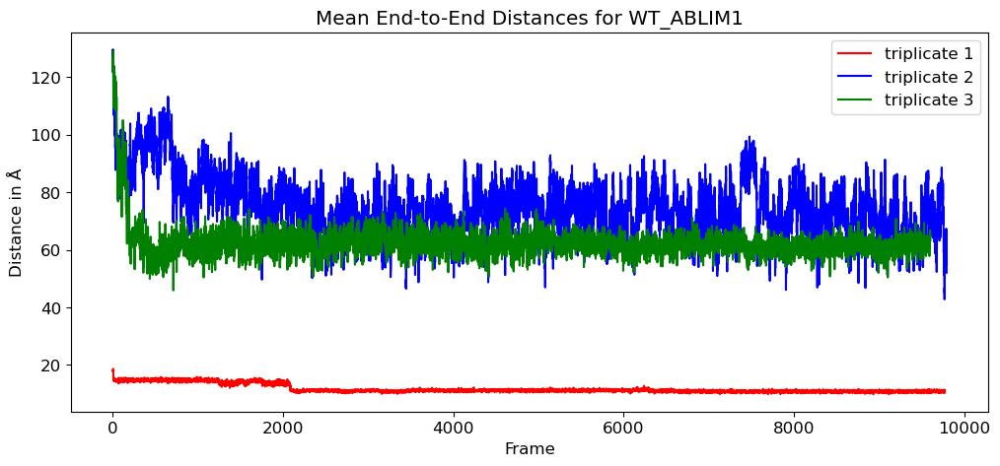

/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses/S216D_ABLIM1
11183
11183


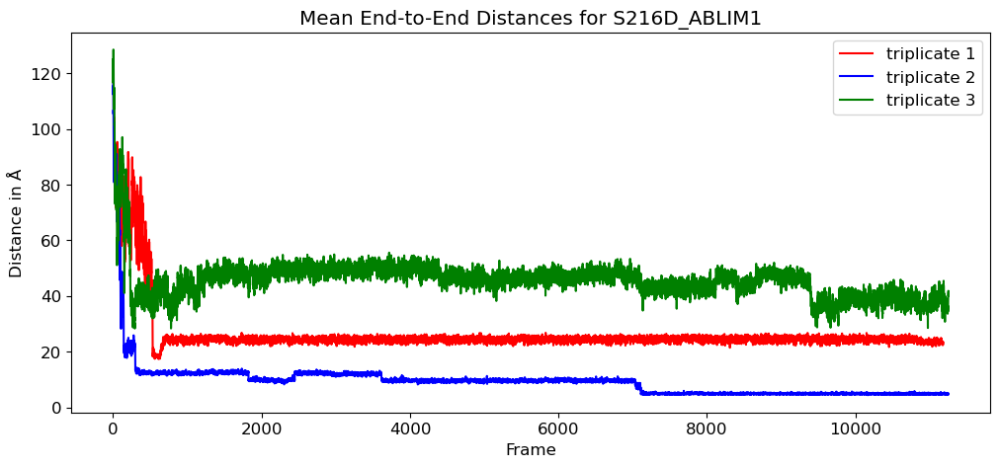

/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses/LIM2_WT_ABLIM1
10001
10001


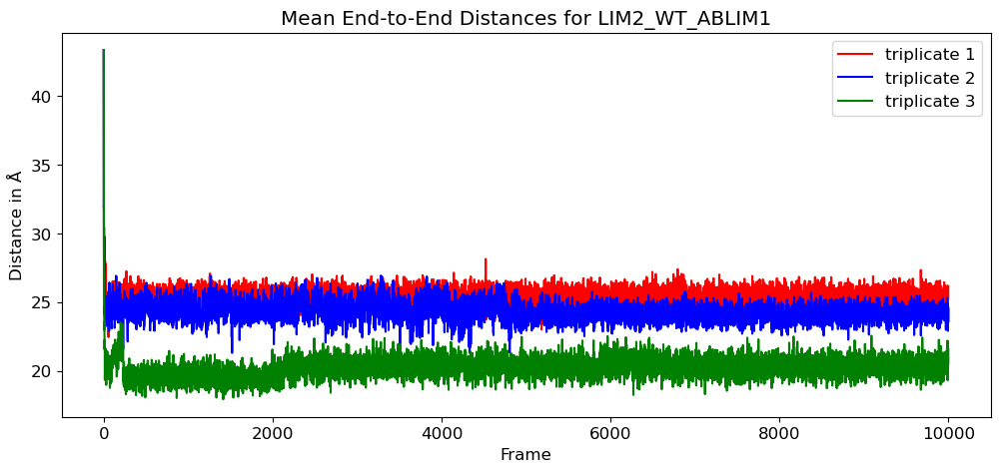

/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses/WT_ABLIM2
10001
10001


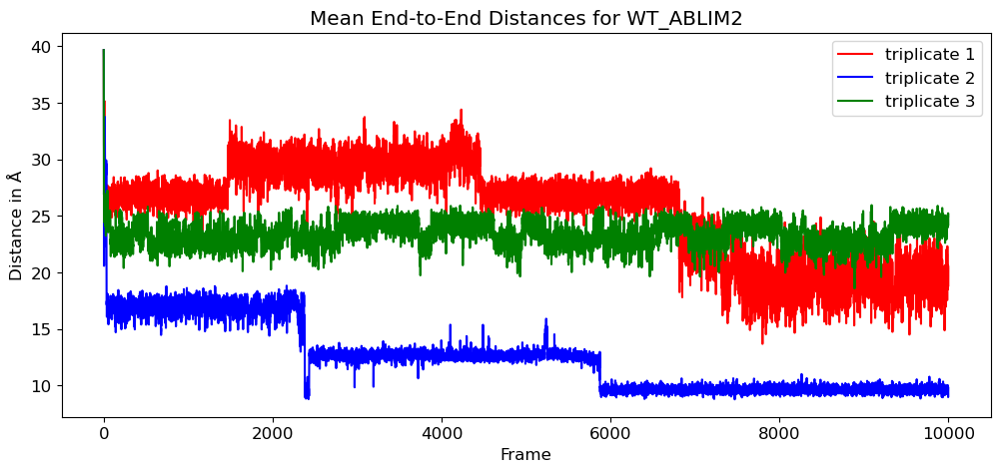

/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses/S76D_ABLIM2
10001
10001


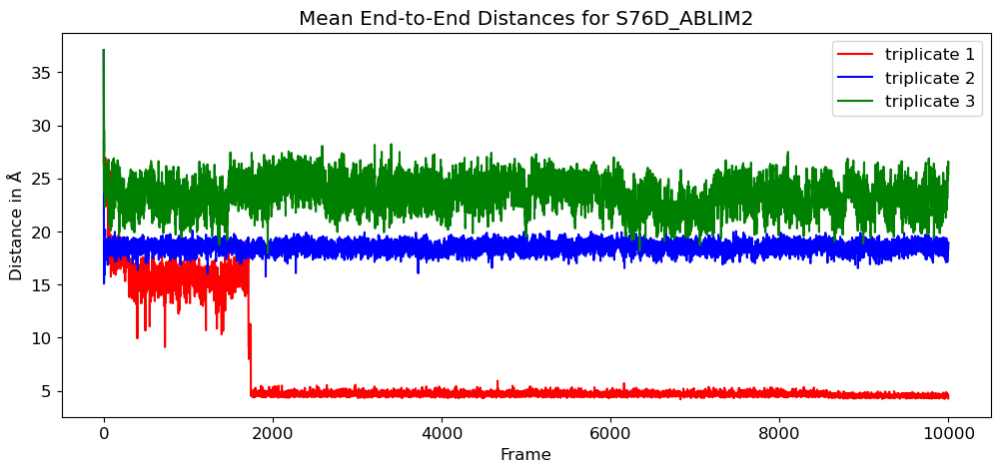

/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses/WT_EXTENDED
10001
10001


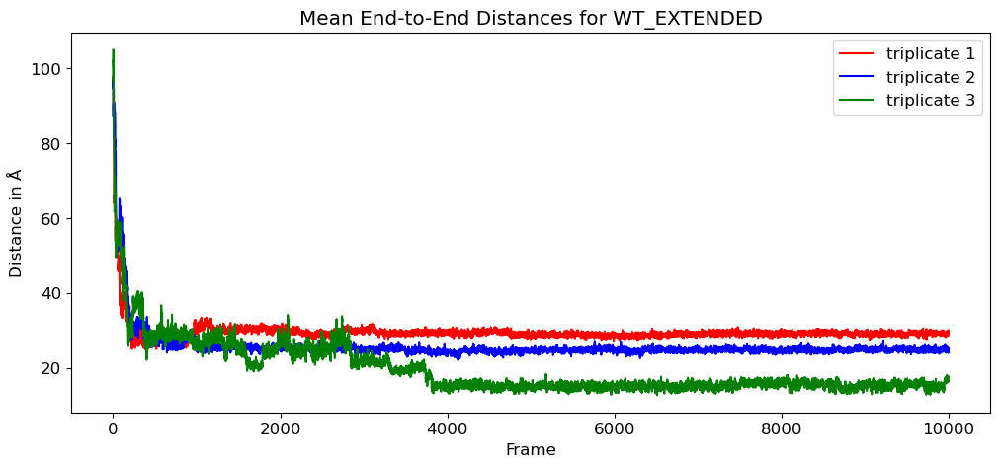

/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses/S216D_EXTENDED
10001
10001


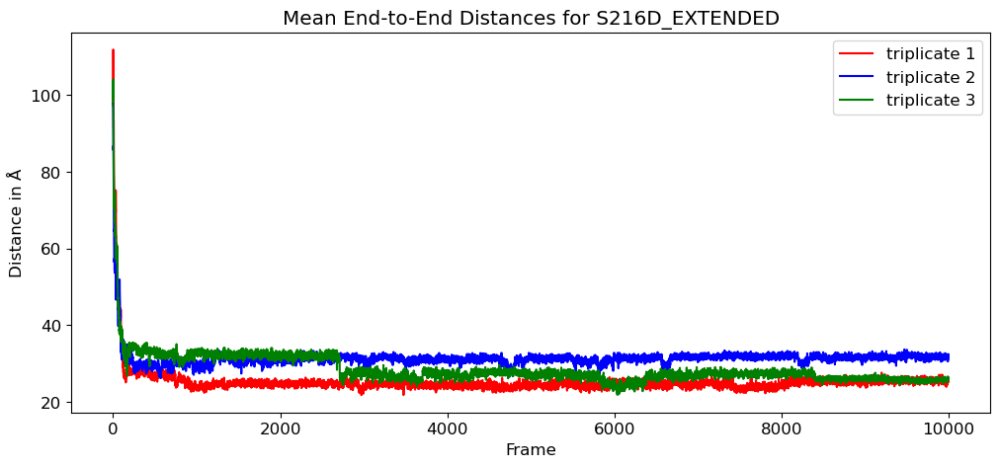

/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses/S216D_L2_L3
10001
10001


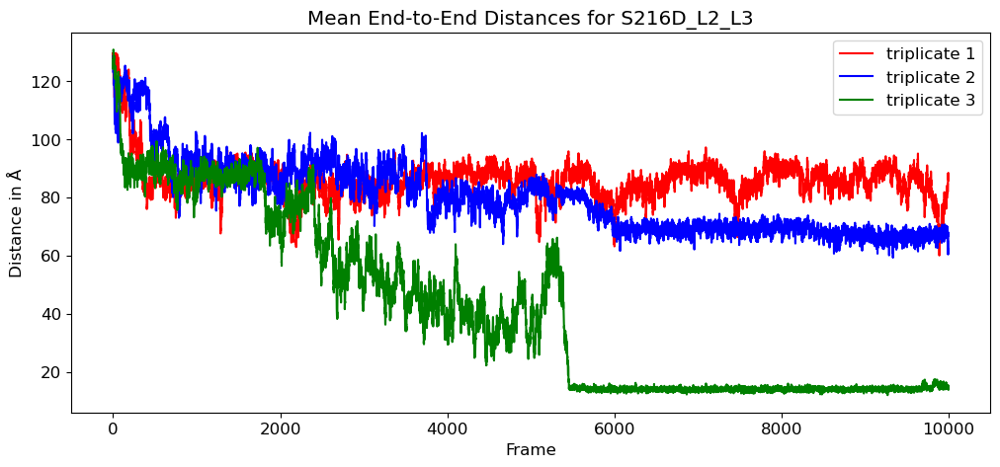

In [ ]:
#MEAN END TO END DISTANCE FOR ALL SYSTEMS

path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
os.chdir(path)
#print(os.getcwd())
#print(path)
systems=['WT_ABLIM1','S216D_ABLIM1','LIM2_WT_ABLIM1','WT_ABLIM2','S76D_ABLIM2','WT_EXTENDED','S216D_EXTENDED','S216D_L2_L3']
color_num=0
colors=['black','red','gray','blue','lightcoral','green','orange','pink']

#use template to produce the trajectory and topology file names
template= 'abm_ProtIon_rep%s'
trajectory= [template % (str(i)+'.xtc') for i in range (1,8)]
print(trajectory)

topology= [template % (str(i)+'_start.pdb') for i in range (1,8)]
print(topology)



#fig,ax=plt.subplots()
#fig=plt.figure(figsize=(14,5))

for system in systems:
    fig,ax=plt.subplots()
    new_path=path+'/'+system
    print(new_path)
    os.chdir(new_path)

    if system=='WT_ABLIM1':
        ends='@1 @569'
    elif system=='S216D_ABLIM1':
        ends='@1 @571'
    elif system=='LIM2_WT_ABLIM1':
        ends='@1 @137'
    elif system=='WT_EXTENDED':
        ends='@1 @1038'
    elif system=='S216D_EXTENDED':
        ends='@1 @1035'
    elif system=='S216D_L2_L3':
        ends='@1 @573'
    else:
        ends='@1 @178'

    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    #traj4=pt.iterload(trajectory[3],topology[3])
    #traj5=pt.iterload(trajectory[4],topology[4])
    #traj6=pt.iterload(trajectory[5],topology[5])
    #traj7=pt.iterload(trajectory[6],topology[6])

    end_distances1=pt.distance(traj1, mask=ends)
    end_distances2=pt.distance(traj2, mask=ends)
    end_distances3=pt.distance(traj3, mask=ends)
    #end_distances4=pt.distance(traj4, mask=ends)
    #end_distances5=pt.distance(traj5, mask=ends)
    #end_distances6=pt.distance(traj6, mask=ends)
    #end_distances7=pt.distance(traj7, mask=ends)
    #print(ZN_distances1)

    #multiple_lists = [end_distances1,end_distances2,end_distances3,end_distances4,end_distances5,end_distances6,end_distances7]
    #arrays = [np.array(x) for x in multiple_lists]
    #means=[np.mean(k) for k in zip(*arrays)]
    #sd=[np.std(k) for k in zip(*arrays)]

    x1=np.arange(0,len(end_distances1))
    print(len(x1))
    x2=np.arange(0,len(end_distances2))
    x3=np.arange(0,len(end_distances3))
    #x4=np.arange(0,len(means))
    y1=np.array(end_distances1)
    print(len(x1))
    y2=np.array(end_distances2)
    y3=np.array(end_distances3)
    #y4=np.array(means)
    #ax=plt.gca()
    #ax.set_ylim(10.0,31.0)
    ax.plot(x1,y1,linestyle='-',color='red',label='triplicate 1',zorder=1)
    ax.plot(x2,y2,linestyle='-',color='blue',label='triplicate 2',zorder=2)
    ax.plot(x3,y3,linestyle='-',color='green',label='triplicate 3',zorder=3)
    legend=system+ ' mean'
    #ax.plot(x4,y4,linestyle='-',color=colors[color_num],label=legend,zorder=4)
    color_num+=1
    leg = ax.legend()
    title="Mean End-to-End Distances for " + system
    plt.title(title)
    plt.xlabel("Frame")
    plt.ylabel("Distance in Å")
    ax.figure.set_size_inches(12.0,5.0)
    plt.show()

#name='full_end_to_end_distances.png'
#os.chdir(path)
#plt.gcf().savefig(name,dpi=300)
#plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[array([0., 0., 0., ..., 0., 0., 0.]), array([3.37470087, 2.87640861, 2.74051214, ..., 2.46197311, 3.19128622,
       2.27846339]), array([5.33641907, 6.22378035, 4.99045094, ..., 5.68201336, 5.60946412,
       5.51166617]), array([8.32986266, 8.67152337, 7.31573969, ..., 8.32794326, 8.45593732,
       7.87234539]), array([10.7547065 , 10.69045025, 10.46738768, ...,  8.79598042,
        9.43502265,  8.74748355]), array([14.44795788, 11.14394873, 12.58578813, ..., 10.86885303,
       10.0371373 , 11.48039071]), array([17.34030746, 12.70361826, 10.5492516 , ..., 12.80327758,
       11.17742535, 11.93594854]), array([20.97397393, 14.77439273, 10.95537076, ..., 11.23542373,
       10.96850933, 10.42344821]), array([23.14675338, 17.37837927, 13.38625211, ..., 11.9908864 ,
       12.62914773, 10.66765502]), array([25.67917141, 20.00430348, 15.84017093, ..., 12.41193664,
       13.49766755, 11.08792319]), array([29.63447671, 22.45292755, 19.57704629, ..., 12.07180608,
       11.59470983, 11.6

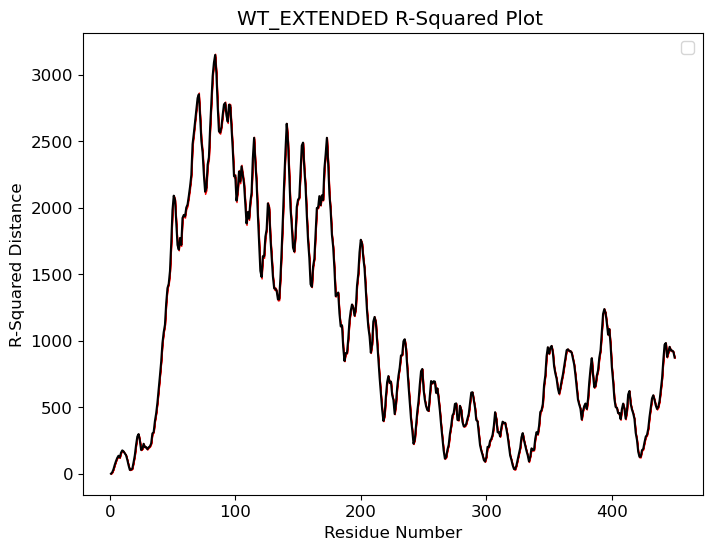

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[array([0., 0., 0., ..., 0., 0., 0.]), array([3.15293365, 4.86421839, 3.04717906, ..., 3.45648703, 3.09292766,
       3.41655962]), array([6.42202953, 6.77444056, 6.07647596, ..., 5.749655  , 5.89687183,
       6.38506436]), array([8.86861061, 9.17918394, 9.28165926, ..., 8.48383317, 8.6746471 ,
       8.60413434]), array([11.60068159, 12.56531392, 11.51498429, ..., 10.47910953,
       11.11334069, 11.02883807]), array([14.54318193, 15.03680674, 13.97947976, ...,  9.96170025,
       10.67832964,  9.60416539]), array([18.40228849, 17.29981226, 16.09194624, ..., 11.20118464,
       11.38185628, 10.84699937]), array([21.9194199 , 20.74052522, 19.81727857, ...,  9.94427704,
       10.89519406, 10.24646895]), array([25.04521623, 23.34904517, 22.48807197, ...,  9.62167617,
       10.85253201, 10.82105957]), array([28.70059104, 26.75957405, 25.64456032, ...,  7.61768064,
       10.13353707, 10.00355091]), array([33.13038947, 29.96980237, 27.96649524, ...,  9.14051013,
       11.33623272, 12.0

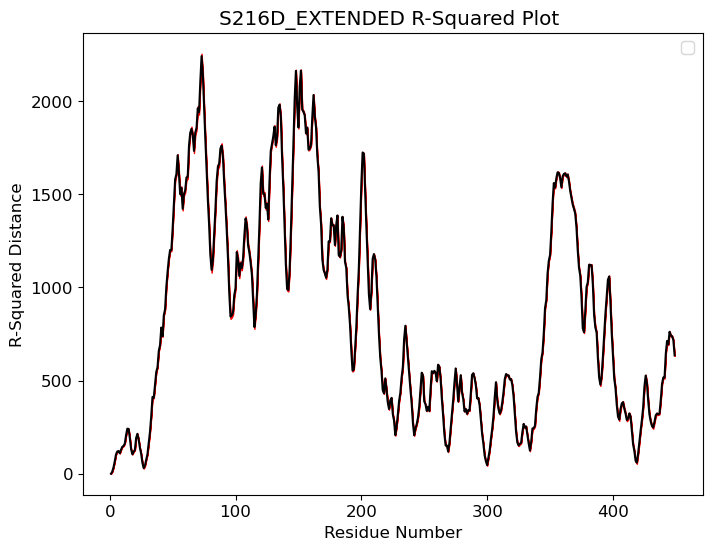

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[array([0., 0., 0., ..., 0., 0., 0.]), array([3.40301531, 3.04052796, 3.33295315, ..., 3.26082605, 2.76942363,
       3.54916074]), array([5.99100791, 6.38607288, 5.84661417, ..., 5.31763757, 5.31604752,
       5.12238967]), array([8.399002  , 8.34168268, 8.12038144, ..., 6.96305266, 6.51424719,
       7.14003761]), array([11.14327696, 11.05092142, 10.28110665, ..., 10.14986525,
        9.91935617, 10.45296344]), array([10.71429685, 11.59040117, 10.01903853, ..., 10.68223361,
        9.52962584, 10.32835373]), array([8.11658905, 8.9713169 , 7.68737727, ..., 8.0258633 , 7.89191868,
       8.31755827]), array([7.56360344, 7.6162255 , 6.47188747, ..., 7.49407279, 7.28330336,
       7.39233572]), array([5.25141053, 5.58759347, 5.10864218, ..., 5.7360354 , 5.49241347,
       6.29892955]), array([5.32483152, 6.42355217, 5.32048179, ..., 7.01022197, 6.97300068,
       5.91878972]), array([8.00271816, 8.3532128 , 7.22187518, ..., 8.61706036, 8.23243234,
       7.7607018 ]), array([ 9.05439916,

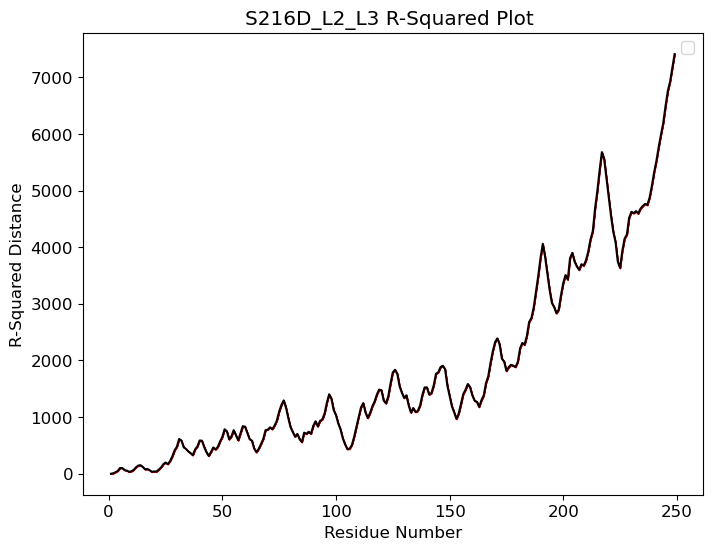

In [ ]:
systems=['WT_EXTENDED','S216D_EXTENDED','S216D_L2_L3']
colors=['black']
#from pytraj import topology as top
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
os.chdir(path)

#use template to produce the trajectory and topology file names

trajectory= 'abm_ProtIon_concat.xtc'
#print(trajectory)
topology= 'abm_ProtIon_rep1_start.pdb'

#print(topology)


for system in systems:
    fig,ax=plt.subplots()
    new_path=path+'/'+system
    #print(new_path)
    os.chdir(new_path)
    system_avg_distances=[]
    top=pt.load_topology(topology)
    traj=pt.iterload(trajectory,topology)
    #print(traj)
    #print(top.n_residues)
    n_residues=top.n_residues-7

    n_bins=n_residues
    for i in range(1,n_residues):
        resmask=(':1@BB :' + str(i)+'@BB')
        distance_between=pt.distance(traj, mask=resmask)
        system_avg_distances.append(distance_between)
    print(system_avg_distances)
    print(len(system_avg_distances))
    print(len(system_avg_distances[0]))
    print('BREAK')

    mean_distances=[]
    sd_distances=[]
    for i in range(len(system_avg_distances)):
        mean=np.mean(system_avg_distances[i])
        mean_distances.append(mean)
        sd=np.std(system_avg_distances[i])
        sd_distances.append(sd)

    #print(len(mean_distances))
    #print(mean_distances)

    r_squared=[]
    for i in range(len(mean_distances)):
        squared=mean_distances[i]*mean_distances[i]
        r_squared.append(squared)
    #print(r_squared)
    #print(n_residues)
    #print(len(r_squared))
    '''
    #print(len(means))
    #print(means)
    #end_distances=pt.distance(traj1, mask=ends)
    counts,edges,bars=ax.hist(r_squared, n_bins, histtype='bar',color='black',label=systems)
    ax.set_title('')

    for i in range(len(counts)):
        bin_centres = (edges[:-1] + edges[1:])/2.
        print(bin_centres)
        print(counts)
        plt.scatter(x=bin_centres,y=counts[i],color='black',label=systems[i])
        plt.plot(bin_centres,counts[i],color=colors[i])
    '''
    x_values=[]
    lower_sd=[]
    upper_sd=[]
    for i in range(1,n_residues):
        x_values.append(i)
    for i in range(len(x_values)):
        lower_sd.append(r_squared[i]-sd_distances[i])
        upper_sd.append(r_squared[i]+sd_distances[i])

    #print(len(x_values))
    #print(len(r_squared))
    print(sd_distances)
    print('BREAK')
    print(len(lower_sd))
    print(lower_sd)
    print(len(upper_sd))
    print(upper_sd)

    plt.plot(x_values,r_squared,'k-')
    plt.fill_between(x_values,lower_sd,upper_sd,color='red')

    title=system + " R-Squared Plot "
    plt.title(title)
    plt.xlabel("Residue Number")
    plt.ylabel("R-Squared Distance")
    #ax.figure.set_size_inches(8.0,6.0)
    ax.legend()

    name=system + '_r-squared_plot.png'

    plt.gcf().savefig(name,dpi=300)
    plt.show()


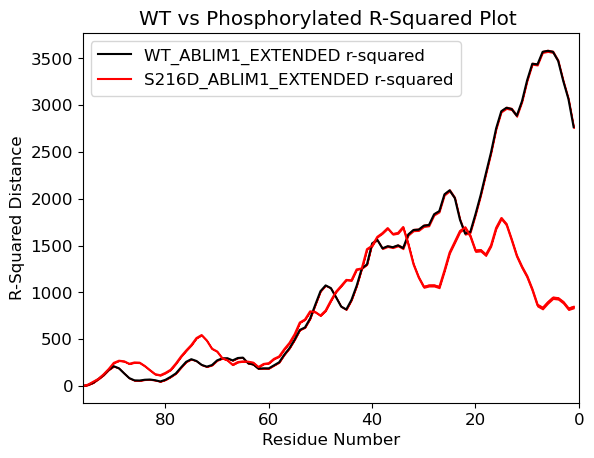

In [55]:
systems=['WT_ABLIM1_EXTENDED','S216D_ABLIM1_EXTENDED']#,'WT_L2_L3','S216D_L2_L3']
colors=['black','red']
color_num=0
#from pytraj import topology as top
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
os.chdir(path)

#use template to produce the trajectory and topology file names

trajectory= 'abm_ProtIon_concat.xtc'
#print(trajectory)
topology= 'abm_ProtIon_rep1_start.pdb'

#print(topology)

fig,ax=plt.subplots()

for system in systems:

    new_path=path+'/'+system
    #print(new_path)
    os.chdir(new_path)
    system_avg_distances=[]
    top=pt.load_topology(topology)
    traj=pt.iterload(trajectory,topology)
    #print(traj)
    #print(top.n_residues)
    n_residues=top.n_residues-7

    n_bins=n_residues
    for i in range(96,0,-1):
        resmask=(':96@BB :'+str(i)+'@BB')
        distance_between=pt.distance(traj, mask=resmask)
        system_avg_distances.append(distance_between)
    #print(system_avg_distances)
    #print(len(system_avg_distances))
    #print(len(system_avg_distances[0]))
    #print('BREAK')

    mean_distances=[]
    sd_distances=[]
    for i in range(len(system_avg_distances)):
        mean=np.mean(system_avg_distances[i])
        mean_distances.append(mean)
        sd=np.std(system_avg_distances[i])
        sd_distances.append(sd)

    #print(len(mean_distances))
    #print(mean_distances)

    r_squared=[]
    for i in range(len(mean_distances)):
        squared=mean_distances[i]*mean_distances[i]
        r_squared.append(squared)
    #print(r_squared)
    #print(n_residues)
    #print(len(r_squared))

    '''
    #print(len(means))
    #print(means)
    #end_distances=pt.distance(traj1, mask=ends)
    counts,edges,bars=ax.hist(r_squared, n_bins, histtype='bar',color='black',label=systems)
    ax.set_title('')

    for i in range(len(counts)):
        bin_centres = (edges[:-1] + edges[1:])/2.
        print(bin_centres)
        print(counts)
        plt.scatter(x=bin_centres,y=counts[i],color='black',label=systems[i])
        plt.plot(bin_centres,counts[i],color=colors[i])'''

    x_values=[]
    lower_sd=[]
    upper_sd=[]
    for i in range(96,0,-1):
        x_values.append(i)
    for i in range(len(x_values)):
        lower_sd.append(r_squared[i]-sd_distances[i])
        upper_sd.append(r_squared[i]+sd_distances[i])

    #print(len(x_values))
    #print(len(r_squared))
    #print(sd_distances)
    #print('BREAK')
    #print(len(lower_sd))
    #print(lower_sd)
    #print(len(upper_sd))
    #print(upper_sd)
    legend= system + ' r-squared'
    ax.plot(x_values,r_squared,'-',color=colors[color_num],label=legend)
    color_num+=1
    plt.fill_between(x_values,lower_sd,upper_sd,color='red')

    title="N-terminus R-Squared Plot "
    plt.title(title)
    plt.xlabel("Residue Number")
    plt.ylabel("R-Squared Distance")
    plt.xlim(0,96)
    plt.gca().invert_xaxis()
    #ax.figure.set_size_inches(8.0,6.0)
    leg = ax.legend()

name='WT_vs_S216D_Nterm_r-squared_plot.png'

plt.gcf().savefig(name,dpi=300)
plt.show()

#print(x_values)
#print(r_squared)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


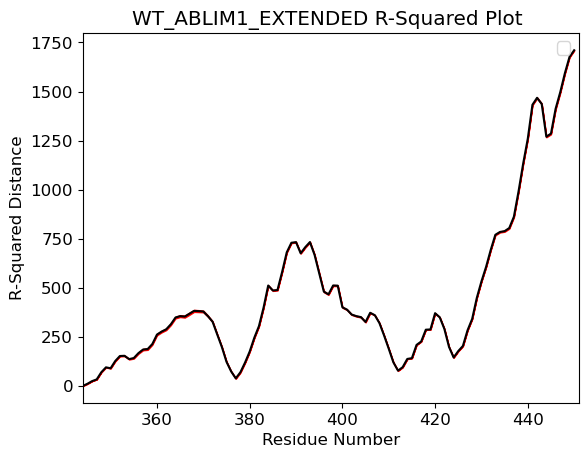

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


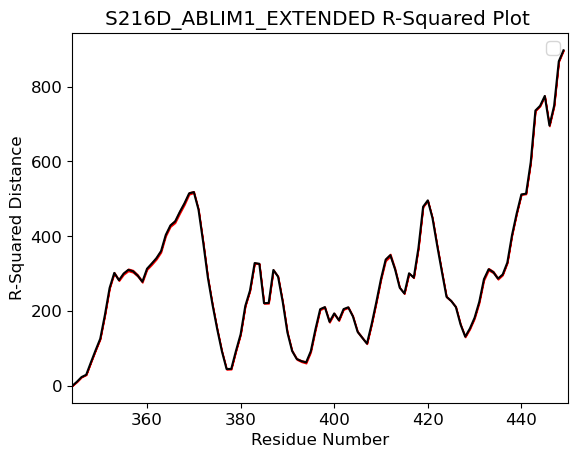

In [47]:
systems=['WT_ABLIM1_EXTENDED','S216D_ABLIM1_EXTENDED']#,'WT_L2_L3','S216D_L2_L3']
colors=['black']
#from pytraj import topology as top
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
os.chdir(path)

#use template to produce the trajectory and topology file names

trajectory= 'abm_ProtIon_concat.xtc'
#print(trajectory)
topology= 'abm_ProtIon_rep1_start.pdb'

#print(topology)


for system in systems:
    fig,ax=plt.subplots()
    new_path=path+'/'+system
    #print(new_path)
    os.chdir(new_path)
    system_avg_distances=[]
    top=pt.load_topology(topology)
    traj=pt.iterload(trajectory,topology)
    #print(traj)
    #print(top.n_residues)
    n_residues=top.n_residues-7

    n_bins=n_residues
    for i in range(344,n_residues):
        resmask=(':344@BB :'+str(i)+'@BB')
        distance_between=pt.distance(traj, mask=resmask)
        system_avg_distances.append(distance_between)
    #print(system_avg_distances)
    #print(len(system_avg_distances))
    #print(len(system_avg_distances[0]))
    #print('BREAK')

    mean_distances=[]
    sd_distances=[]
    for i in range(len(system_avg_distances)):
        mean=np.mean(system_avg_distances[i])
        mean_distances.append(mean)
        sd=np.std(system_avg_distances[i])
        sd_distances.append(sd)

    #print(len(mean_distances))
    #print(mean_distances)

    r_squared=[]
    for i in range(len(mean_distances)):
        squared=mean_distances[i]*mean_distances[i]
        r_squared.append(squared)
    #print(r_squared)
    #print(n_residues)
    #print(len(r_squared))

    '''
    #print(len(means))
    #print(means)
    #end_distances=pt.distance(traj1, mask=ends)
    counts,edges,bars=ax.hist(r_squared, n_bins, histtype='bar',color='black',label=systems)
    ax.set_title('')

    for i in range(len(counts)):
        bin_centres = (edges[:-1] + edges[1:])/2.
        print(bin_centres)
        print(counts)
        plt.scatter(x=bin_centres,y=counts[i],color='black',label=systems[i])
        plt.plot(bin_centres,counts[i],color=colors[i])'''

    x_values=[]
    lower_sd=[]
    upper_sd=[]
    for i in range(344,n_residues):
        x_values.append(i)
    for i in range(len(x_values)):
        lower_sd.append(r_squared[i]-sd_distances[i])
        upper_sd.append(r_squared[i]+sd_distances[i])

    #print(len(x_values))
    #print(len(r_squared))
    #print(sd_distances)
    #print('BREAK')
    #print(len(lower_sd))
    #print(lower_sd)
    #print(len(upper_sd))
    #print(upper_sd)

    plt.plot(x_values,r_squared,'k-')
    plt.fill_between(x_values,lower_sd,upper_sd,color='red')

    title=system + " R-Squared Plot "
    plt.title(title)
    plt.xlabel("Residue Number")
    plt.ylabel("R-Squared Distance")
    plt.xlim(344,n_residues)
    #plt.gca().invert_xaxis()
    #ax.figure.set_size_inches(8.0,6.0)
    ax.legend()

    name=system + '_Cterm_r-squared_plot.png'

    plt.gcf().savefig(name,dpi=300)
    plt.show()

#print(x_values)
#print(r_squared)

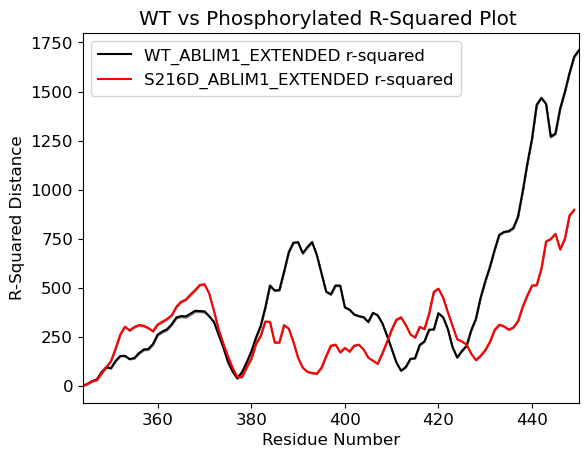

In [53]:
systems=['WT_ABLIM1_EXTENDED','S216D_ABLIM1_EXTENDED']#,'WT_L2_L3','S216D_L2_L3']
colors=['black','red']
#from pytraj import topology as top
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
os.chdir(path)

#use template to produce the trajectory and topology file names

trajectory= 'abm_ProtIon_concat.xtc'
#print(trajectory)
topology= 'abm_ProtIon_rep1_start.pdb'

#print(topology)
color_num=0
fig,ax=plt.subplots()

for system in systems:
    new_path=path+'/'+system
    #print(new_path)
    os.chdir(new_path)
    system_avg_distances=[]
    top=pt.load_topology(topology)
    traj=pt.iterload(trajectory,topology)
    #print(traj)
    #print(top.n_residues)
    n_residues=top.n_residues-7

    n_bins=n_residues
    for i in range(344,n_residues):
        resmask=(':344@BB :'+str(i)+'@BB')
        distance_between=pt.distance(traj, mask=resmask)
        system_avg_distances.append(distance_between)
    #print(system_avg_distances)
    #print(len(system_avg_distances))
    #print(len(system_avg_distances[0]))
    #print('BREAK')

    mean_distances=[]
    sd_distances=[]
    for i in range(len(system_avg_distances)):
        mean=np.mean(system_avg_distances[i])
        mean_distances.append(mean)
        sd=np.std(system_avg_distances[i])
        sd_distances.append(sd)
    
    #print(len(mean_distances))
    #print(mean_distances)

    r_squared=[]
    for i in range(len(mean_distances)):
        squared=mean_distances[i]*mean_distances[i]
        r_squared.append(squared)
    #print(r_squared)
    #print(n_residues)
    #print(len(r_squared))

    '''
    #print(len(means))
    #print(means)
    #end_distances=pt.distance(traj1, mask=ends)
    counts,edges,bars=ax.hist(r_squared, n_bins, histtype='bar',color='black',label=systems)
    ax.set_title('')

    for i in range(len(counts)):
        bin_centres = (edges[:-1] + edges[1:])/2.
        print(bin_centres)
        print(counts)
        plt.scatter(x=bin_centres,y=counts[i],color='black',label=systems[i])
        plt.plot(bin_centres,counts[i],color=colors[i])'''

    x_values=[]
    lower_sd=[]
    upper_sd=[]
    for i in range(344,n_residues):
        x_values.append(i)
    for i in range(len(x_values)):
        lower_sd.append(r_squared[i]-sd_distances[i])
        upper_sd.append(r_squared[i]+sd_distances[i])

    #print(len(x_values))
    #print(len(r_squared))
    #print(sd_distances)
    #print('BREAK')
    #print(len(lower_sd))
    #print(lower_sd)
    #print(len(upper_sd))
    #print(upper_sd)
    legend=system+ ' r-squared'
    ax.plot(x_values,r_squared,'-',color=colors[color_num],label=legend)
    color_num+=1
    plt.fill_between(x_values,lower_sd,upper_sd,color='gray')

    title="WT vs Phosphorylated R-Squared Plot "
    plt.title(title)
    plt.xlabel("Residue Number")
    plt.ylabel("R-Squared Distance")
    plt.xlim(344,n_residues)
    #plt.gca().invert_xaxis()
    #ax.figure.set_size_inches(8.0,6.0)
    leg = ax.legend()

name='WT_vs_S216D_Cterm_r-squared_plot.png'

plt.gcf().savefig(name,dpi=300)
plt.show()

#print(x_values)
#print(r_squared)

In [29]:
#WT_ABLIM1_EXTENDED DATA, FROM 94-1 (N-TERMINUS)

system='WT_EXTENDED'
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
new_path=path+'/'+system

#print(new_path)
os.chdir(new_path)

trajectory= 'abm_ProtIon_concat.xtc'
#print(trajectory)
topology= 'abm_ProtIon_rep1_start.pdb'

avg_distances=[]
top=pt.load_topology(topology)
traj=pt.iterload(trajectory,topology)
#print(traj)
#print(top.n_residues)
n_residues=top.n_residues-7
system_avg_distances=[]
n_bins=n_residues
'''
for i in range(1,n_residues):
    resmask=(':1@BB :' + str(i)+'@BB')
    distance_between=pt.distance(traj, mask=resmask)
    system_avg_distances.append(distance_between)
'''
for i in range(96,1,-1):
    resmask=(':96@BB :'+str(i)+'@BB')
    distance_between=pt.distance(traj, mask=resmask)
    system_avg_distances.append(distance_between)

wt_extended_mean_distances=[]
wt_extended_sd_distances=[]
for i in range(len(system_avg_distances)):
    mean=np.mean(system_avg_distances[i])
    wt_extended_mean_distances.append(mean)
    sd=np.std(system_avg_distances[i])
    wt_extended_sd_distances.append(sd)

#print(len(mean_distances))
#print(mean_distances)
print(len(wt_extended_mean_distances))

wt_extended_r_squared=[]
for i in range(len(wt_extended_mean_distances)):
    squared=wt_extended_mean_distances[i]*wt_extended_mean_distances[i]
    wt_extended_r_squared.append(squared)
#print(r_squared)
#print(n_residues)
#print(len(r_squared))'''

#print(len(means))
#print(means)
#end_distances=pt.distance(traj1, mask=ends)

wt_extended_x_values=[]
wt_extended_lower_sd=[]
wt_extended_upper_sd=[]
for i in range(96,1,-1):
    wt_extended_x_values.append(i)
print(len(wt_extended_x_values))
for i in range(len(wt_extended_x_values)):
    wt_extended_lower_sd.append(wt_extended_r_squared[i]-wt_extended_sd_distances[i])
    wt_extended_upper_sd.append(wt_extended_r_squared[i]+wt_extended_sd_distances[i])

print(wt_extended_upper_sd)

95
95
[0.0, 11.255601921635728, 34.40426911731413, 73.77920181335926, 116.07900754095502, 172.7626514475729, 212.13904754827652, 190.41104789501554, 136.50724356258905, 85.47579999184961, 60.995738102338144, 59.2073246437034, 67.17961992443274, 69.7763288289988, 62.444126703654575, 49.071263025013494, 66.81981823688403, 97.83782806710559, 134.41162201444064, 197.84248461757429, 258.7596614490404, 287.2635328646626, 268.5762626241241, 227.28413292558307, 208.55809152079965, 225.10717419036294, 275.5438056758418, 297.5635230981161, 297.5658842734347, 273.9915911791322, 299.3698754255164, 303.6100019869592, 242.865410528881, 230.76203342922662, 185.297478638883, 189.8458177808598, 189.4179228000309, 221.7925958665988, 253.86019275825413, 335.9631558863434, 405.1057146723122, 496.4341122056112, 600.3332854205898, 626.7888679397615, 723.3673169512921, 871.4618249042186, 1014.9289270869601, 1076.84453265573, 1048.3060800020555, 951.6625708143767, 851.303987324149, 820.71129316008, 922.976204

In [11]:
#print(wt_extended_mean_distances)
print(wt_extended_r_squared)

[0.0, 10.528301555451456, 33.592664224982485, 66.78646341462148, 94.89892208707082, 118.97219650678309, 135.05600482395096, 121.31636120861025, 157.63396897479407, 175.4771006837041, 167.88729072827826, 153.45805028923058, 139.38896245711283, 104.90814479905202, 63.78998301318908, 28.982411776077907, 31.01754131987972, 37.928687956877056, 85.87307791747652, 138.62109691455893, 216.5577659044021, 279.2543422458011, 297.94865949617554, 250.3457970054038, 178.94126051922268, 187.25007651910667, 225.09940632419688, 199.82449854394648, 200.209676759039, 184.07019407670984, 198.5404051580624, 205.1645661693734, 226.68670362890032, 302.5773793882782, 312.6305680982216, 395.3627052571643, 453.79541657848006, 534.1734604216822, 632.6854844878824, 736.7251610818672, 842.4755574222646, 981.0744262355943, 1063.4945401914547, 1119.3558225191039, 1282.8204905758164, 1394.7831730114754, 1427.2512075131517, 1522.836442859683, 1733.0863904561475, 1979.8813003659523, 2090.0701121265283, 2059.29029459309

/var/folders/tp/lkm8lbb14gb6_ysd0kvxpkgm0000gn/T/ipykernel_41908/794587381.py:25: RuntimeWarning: divide by zero encountered in scalar divide
  expon = (zeta/L) * (1-expon)
/var/folders/tp/lkm8lbb14gb6_ysd0kvxpkgm0000gn/T/ipykernel_41908/794587381.py:25: RuntimeWarning: invalid value encountered in scalar multiply
  expon = (zeta/L) * (1-expon)


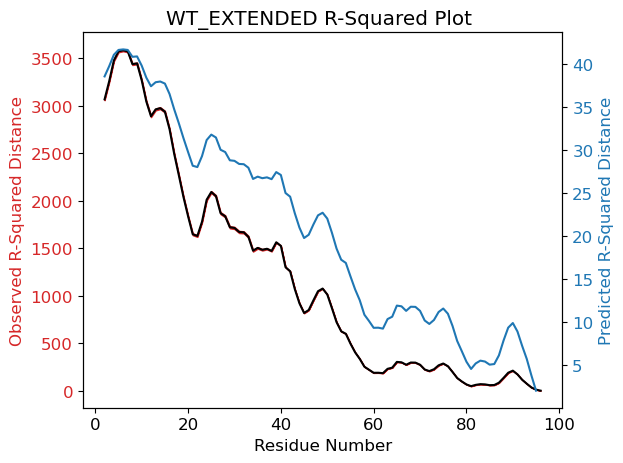

In [30]:
#WT_EXTENDED GRAPHING
system='WT_EXTENDED'

system_length=len(wt_extended_x_values)

fig, ax1 = plt.subplots()


title=system + " R-Squared Plot "
plt.title(title)
color='tab:red'
ax1.set_xlabel("Residue Number")
ax1.set_ylabel("Observed R-Squared Distance", color=color)
ax1.plot(wt_extended_x_values,wt_extended_r_squared,'k-')
ax1.fill_between(wt_extended_x_values,wt_extended_lower_sd,wt_extended_upper_sd,color=color)
ax1.tick_params(axis='y', labelcolor=color)
#ax1.legend()


# for R**2, see Eqn 5 in the mapid paper
def RR_ZL(zeta,L):

    prefac = 2 * zeta * L
    expon = np.exp(-L/zeta)
    expon = (zeta/L) * (1-expon)
    expon = 1 - expon
    #print(prefac*expon)
    #print('BREAK')
    return prefac * expon

zeta=0.35
lenPerResi=0.34
#D = 40 *lenPerResi
#L = 450 * lenPerResi  #estimated protein length given nm
'''
estimated=[]
for i in range(1,system_length+1):
    L=i*lenPerResi
    #print(L)
    estimated.append(RR_ZL(zeta,L))'''

estimated=[]
for i in range(0,system_length):
    #L=i*lenPerResi
    L=wt_extended_mean_distances[i]
    #print(L)
    estimated.append(RR_ZL(zeta,L))


ax2=ax1.twinx()
color='tab:blue'
ax2.set_ylabel('Predicted R-Squared Distance', color=color)  # we already handled the x-label with ax1
ax2.plot(wt_extended_x_values, estimated, color=color)
ax2.tick_params(axis='y', labelcolor=color)
#ax2.legend()

fig.tight_layout()
#name=system + '_r-squared_plot.png'
#plt.gcf().savefig(name,dpi=300)
plt.show()

In [ ]:
#WORKTHROUGH PLOTTING W/ PETE



In [31]:
#S216D_ABLIM1_EXTENDED DATA
system='S216D_EXTENDED'
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
new_path=path+'/'+system

#print(new_path)
os.chdir(new_path)

trajectory= 'abm_ProtIon_concat.xtc'
#print(trajectory)
topology= 'abm_ProtIon_rep1_start.pdb'

avg_distances=[]
top=pt.load_topology(topology)
traj=pt.iterload(trajectory,topology)
#print(traj)
#print(top.n_residues)
n_residues=top.n_residues-7
system_avg_distances=[]
n_bins=n_residues

for i in range(96,1,-1):
    resmask=(':96@BB :'+str(i)+'@BB')
    distance_between=pt.distance(traj, mask=resmask)
    system_avg_distances.append(distance_between)



s216d_extended_mean_distances=[]
s216d_extended_sd_distances=[]
for i in range(len(system_avg_distances)):
    mean=np.mean(system_avg_distances[i])
    s216d_extended_mean_distances.append(mean)
    sd=np.std(system_avg_distances[i])
    s216d_extended_sd_distances.append(sd)

#print(len(mean_distances))
#print(mean_distances)

s216d_extended_r_squared=[]
for i in range(len(s216d_extended_mean_distances)):
    squared=s216d_extended_mean_distances[i]*s216d_extended_mean_distances[i]
    s216d_extended_r_squared.append(squared)


s216d_extended_x_values=[]
s216d_extended_lower_sd=[]
s216d_extended_upper_sd=[]
for i in range(96,1,-1):
    s216d_extended_x_values.append(i)
for i in range(len(s216d_extended_x_values)):
    s216d_extended_lower_sd.append(s216d_extended_r_squared[i]-s216d_extended_sd_distances[i])
    s216d_extended_upper_sd.append(s216d_extended_r_squared[i]+s216d_extended_sd_distances[i])

print(s216d_extended_upper_sd)

[0.0, 13.206515612573284, 44.51726725802593, 74.26765110146441, 123.47301690295028, 180.95515724298363, 248.10224043599365, 270.84532520167136, 264.9008896679092, 237.8351323599426, 253.2833449414969, 251.4153590055596, 215.4938247518083, 171.09444474708317, 128.6024213441014, 117.02490200263182, 141.82991256528643, 174.91817394436364, 240.36740403742357, 315.40763380134774, 379.504199537367, 438.1992164663549, 513.2073647827195, 545.0145801489277, 487.000942976512, 399.4304768085934, 370.0587736168879, 297.8938726441541, 274.92746016516054, 227.20138552362528, 256.39026107995835, 264.2339059789943, 260.9921235314962, 250.67163945663, 203.5050478322513, 236.57811661454087, 245.04274734419263, 291.230122654768, 317.1020002971886, 394.26784431401575, 461.2734404300566, 553.3486966649208, 678.8797095049044, 711.4227923964088, 798.6275168538338, 792.0779326641864, 755.2498482044131, 809.3736234079495, 914.0511799740907, 1009.1085192566624, 1072.0522843685237, 1136.2571941432363, 1131.94625

/var/folders/tp/lkm8lbb14gb6_ysd0kvxpkgm0000gn/T/ipykernel_41908/2112221581.py:26: RuntimeWarning: divide by zero encountered in scalar divide
  expon = (zeta/L) * (1-expon)
/var/folders/tp/lkm8lbb14gb6_ysd0kvxpkgm0000gn/T/ipykernel_41908/2112221581.py:26: RuntimeWarning: invalid value encountered in scalar multiply
  expon = (zeta/L) * (1-expon)


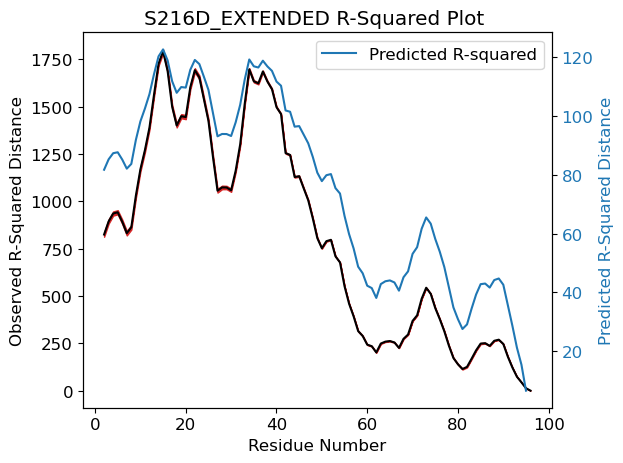

In [36]:
#S216D_EXTENDED GRAPHING
system='S216D_EXTENDED'

fig, ax1 = plt.subplots()

system_length=len(s216d_extended_x_values)


title=system + " R-Squared Plot "
plt.title(title)
color='tab:red'
ax1.set_xlabel("Residue Number")
ax1.set_ylabel("Observed R-Squared Distance")
ax1.plot(s216d_extended_x_values,s216d_extended_r_squared,'k-',label='Observed R-squared')
ax1.fill_between(s216d_extended_x_values,s216d_extended_lower_sd,s216d_extended_upper_sd,color=color)
#ax.figure.set_size_inches(8.0,6.0)
#plt.legend()



# for R**2, see Eqn 5 in the mapid paper
def RR_ZL(zeta,L):

    prefac = 2 * zeta * L
    expon = np.exp(-L/zeta)
    expon = (zeta/L) * (1-expon)
    expon = 1 - expon
    #print(prefac*expon)
    #print('BREAK')
    return prefac * expon


D = 30 *lenPerResi
#L = 450 * lenPerResi  #estimated protein length given nm
system_length=len(s216d_extended_x_values)
'''
estimated=[]
for i in range(1,system_length+1):
    L=i*lenPerResi
    #print(L)
    estimated.append(RR_ZL(zeta,L))
'''
zeta=1.5
lenPerResi=0.34
estimated=[]
for i in range(0,system_length):
    #L=i*lenPerResi
    L=s216d_extended_mean_distances[i]
    #print(L)
    estimated.append(RR_ZL(zeta,L))

ax2=ax1.twinx()
#ax2=plt.subplots()
color='tab:blue'
ax2.set_ylabel('Predicted R-Squared Distance', color=color)  # we already handled the x-label with ax1
ax2.plot(s216d_extended_x_values, estimated, color=color,label='Predicted R-squared')
ax2.tick_params(axis='y', labelcolor=color)
#ax2.legend()
plt.legend()
fig.tight_layout()
name=system + '_r-squared_plot.png'

plt.gcf().savefig(name,dpi=300)
plt.show()

In [7]:
#WT_LIM2_LIM3 DATA
system='WT_L2_L3'
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
new_path=path+'/'+system

#print(new_path)
os.chdir(new_path)

trajectory= 'abm_ProtIon_concat.xtc'
#print(trajectory)
topology= 'abm_ProtIon_rep1_start.pdb'

avg_distances=[]
top=pt.load_topology(topology)
traj=pt.iterload(trajectory,topology)
#print(traj)
#print(top.n_residues)
n_residues=top.n_residues-7
system_avg_distances=[]
n_bins=n_residues
for i in range(1,n_residues):
    resmask=(':1@BB :' + str(i)+'@BB')
    distance_between=pt.distance(traj, mask=resmask)
    system_avg_distances.append(distance_between)


wt_L2L3_mean_distances=[]
wt_L2L3_sd_distances=[]
for i in range(len(system_avg_distances)):
    mean=np.mean(system_avg_distances[i])
    wt_L2L3_mean_distances.append(mean)
    sd=np.std(system_avg_distances[i])
    wt_L2L3_sd_distances.append(sd)

#print(len(mean_distances))
#print(mean_distances)

wt_L2L3_r_squared=[]
for i in range(len(wt_L2L3_mean_distances)):
    squared=wt_L2L3_mean_distances[i]*wt_L2L3_mean_distances[i]
    wt_L2L3_r_squared.append(squared)


wt_L2L3_x_values=[]
wt_L2L3_lower_sd=[]
wt_L2L3_upper_sd=[]
for i in range(1,n_residues):
    wt_L2L3_x_values.append(i)
for i in range(len(wt_L2L3_x_values)):
    wt_L2L3_lower_sd.append(wt_L2L3_r_squared[i]-wt_L2L3_sd_distances[i])
    wt_L2L3_upper_sd.append(wt_L2L3_r_squared[i]+wt_L2L3_sd_distances[i])

print(wt_L2L3_upper_sd)

[0.0, 9.93050073234684, 32.29122297951327, 68.3952773590913, 110.86407233883371, 101.81820356195489, 59.95996920397297, 44.767775634336694, 28.460591929942485, 30.380363770353327, 69.22014051001707, 98.32232000344128, 128.34535302900068, 136.03733097514495, 123.90284629456282, 120.2313943678787, 129.6564739023204, 145.4308443196817, 111.89872575182793, 82.90358129911466, 57.67415874175708, 82.9798889170489, 111.26231889902502, 135.5911734986311, 166.84017751089877, 163.40831375365119, 211.9125535107001, 283.03513056066555, 366.3217223187372, 421.57297863165934, 539.0730375654899, 528.9577990577558, 416.3906175564263, 380.7534306432061, 342.83217314666035, 325.1403691861585, 375.93998706295815, 457.4784790751293, 505.6157831911502, 445.93990921126624, 476.48529151248465, 423.6728497057252, 425.40291200034466, 352.8507784519749, 332.75014773782567, 239.4104200351979, 208.40416781155665, 280.0424318793131, 350.1389255133775, 446.94252525127223, 530.634070517576, 672.9757996848577, 776.748

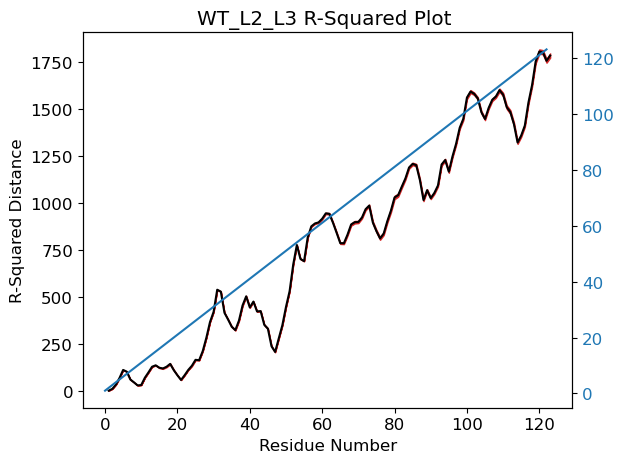

In [14]:
#WT_LIM2_LIM3 GRAPHING

system='WT_L2_L3'

fig, ax1 = plt.subplots()

color='tab:red'
title=system + " R-Squared Plot "
plt.title(title)
ax1.set_xlabel("Residue Number")
ax1.set_ylabel("R-Squared Distance")
ax1.plot(wt_L2L3_x_values,wt_L2L3_r_squared,'k-',label='observed R-squared')
ax1.fill_between(wt_L2L3_x_values,wt_L2L3_lower_sd,wt_L2L3_upper_sd,color=color)

#ax.figure.set_size_inches(8.0,6.0)

zeta=0.35
# for R**2, see Eqn 5 in the mapid paper
#def RR_ZL(zeta,L):

#    prefac = 2 * zeta * L
#    expon = np.exp(-L/zeta)
#    expon = (zeta/L) * (1-expon)
#    expon = 1 - expon
    #print(prefac*expon)
    #print('BREAK')
#    return prefac * expon


#D = 40 *lenPerResi
#L = 450 * lenPerResi  #estimated protein length given nm
system_length=len(wt_L2L3_x_values)
lenPerResi=0.34
estimated=[]
'''for i in range(1,system_length+1):
    L=i*lenPerResi
    #print(L)
    estimated.append(RR_ZL(zeta,L))
'''

ax2=ax1.twinx()
color='tab:blue'
#ax2.set_ylabel('Predicted R-Squared Distance', color=color)  # we already handled the x-label with ax1
#ax2.plot(wt_L2L3_x_values, estimated, color=color)
ax2.plot(wt_L2L3_x_values, color=color)
ax2.tick_params(axis='y', labelcolor=color)
#ax2.legend()

fig.tight_layout()

name=system + '_r-squared_plot.png'

plt.gcf().savefig(name,dpi=300)
plt.show()

In [ ]:
#S216D_LIM2_LIM3 DATA
system='S216D_L2_L3'
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
new_path=path+'/'+system

#print(new_path)
os.chdir(new_path)

trajectory= 'abm_ProtIon_concat.xtc'
#print(trajectory)
topology= 'abm_ProtIon_rep1_start.pdb'

avg_distances=[]
top=pt.load_topology(topology)
traj=pt.iterload(trajectory,topology)
#print(traj)
#print(top.n_residues)
n_residues=top.n_residues-7
system_avg_distances=[]
n_bins=n_residues
for i in range(1,n_residues):
    resmask=(':1@BB :' + str(i)+'@BB')
    distance_between=pt.distance(traj, mask=resmask)
    system_avg_distances.append(distance_between)


s216d_L2L3_mean_distances=[]
s216d_L2L3_sd_distances=[]
for i in range(len(system_avg_distances)):
    mean=np.mean(system_avg_distances[i])
    s216d_L2L3_mean_distances.append(mean)
    sd=np.std(system_avg_distances[i])
    s216d_L2L3_sd_distances.append(sd)

#print(len(mean_distances))
#print(mean_distances)

s216d_L2L3_r_squared=[]
for i in range(len(s216d_L2L3_mean_distances)):
    squared=s216d_L2L3_mean_distances[i]*s216d_L2L3_mean_distances[i]
    s216d_L2L3_r_squared.append(squared)


s216d_L2L3_x_values=[]
s216d_L2L3_lower_sd=[]
s216d_L2L3_upper_sd=[]
for i in range(1,n_residues):
    s216d_L2L3_x_values.append(i)
for i in range(len(s216d_L2L3_x_values)):
    s216d_L2L3_lower_sd.append(s216d_L2L3_r_squared[i]-s216d_L2L3_sd_distances[i])
    s216d_L2L3_upper_sd.append(s216d_L2L3_r_squared[i]+s216d_L2L3_sd_distances[i])

print(s216d_L2L3_upper_sd)

[0.0, 8.215241801659225, 26.932847015686995, 50.156912332013206, 101.82653845867006, 100.1405935234687, 65.14157775406923, 54.704334740129184, 35.148522373240915, 43.682498489903246, 68.402278097766, 113.94478356316472, 143.9705056038454, 151.904912734589, 120.79730723383143, 78.28857368420556, 83.7177406240494, 63.464703104314864, 34.215942749341, 41.871254024758784, 38.86391594514877, 70.30124194042739, 109.27113337015955, 165.98509982706858, 199.11757654276187, 169.46640791890977, 223.82860945182233, 306.0780269953148, 413.69224860172125, 476.79285155459405, 614.4403751925142, 586.4460126071173, 468.3715019882911, 439.60358102696154, 395.59832275933627, 365.88175518009405, 327.54571914747333, 429.0520985099502, 480.4845668871306, 587.1563884035995, 585.2963262264584, 475.3132231189632, 382.8670285467427, 316.11906653255926, 382.9933982615735, 465.12848520455765, 429.7069460808284, 473.7059800142601, 570.4043274017632, 651.3732003864073, 785.8841167402632, 749.5233864877595, 607.4149

249
449


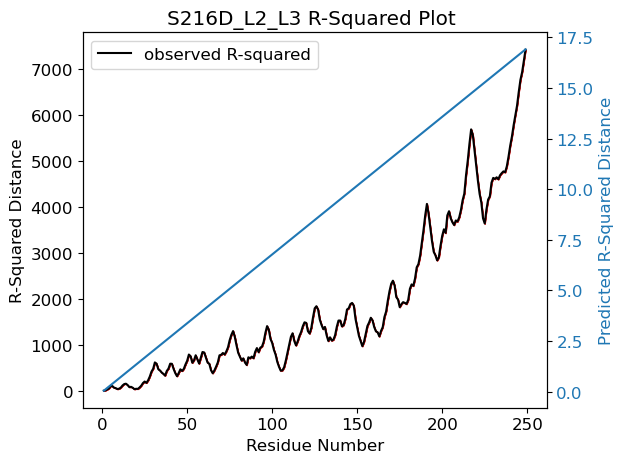

In [ ]:
#S216D_L2_L3 graphing
system='S216D_L2_L3'

print(len(s216d_L2L3_mean_distances))
print(system_length)
fig,ax1=plt.subplots()

title=system + " R-Squared Plot "
plt.title(title)
color='tab:red'
ax1.set_xlabel("Residue Number")
ax1.set_ylabel("R-Squared Distance")

ax1.plot(s216d_L2L3_x_values,s216d_L2L3_r_squared,'k-',label='observed R-squared')
ax1.fill_between(s216d_L2L3_x_values,s216d_L2L3_lower_sd,s216d_L2L3_upper_sd,color=color)

#ax.figure.set_size_inches(8.0,6.0)
plt.legend()


zeta=0.35
# for R**2, see Eqn 5 in the mapid paper
def RR_ZL(zeta,L):

    prefac = 2 * zeta * L
    expon = np.exp(-L/zeta)
    expon = (zeta/L) * (1-expon)
    expon = 1 - expon
    #print(prefac*expon)
    #print('BREAK')
    return prefac * expon


#D = 40 *lenPerResi
#L = 450 * lenPerResi  #estimated protein length given nm
system_length=len(s216d_L2L3_x_values)
lenPerResi=0.34
estimated=[]
for i in range(1,system_length+1):
    L=i*lenPerResi
    #print(L)
    estimated.append(RR_ZL(zeta,L))

'''
estimated=[]
for i in range(0,system_length):
    #L=i*lenPerResi
    L=s216d_L2L3_mean_distances[i]
    #print(L)
    estimated.append(RR_ZL(zeta,L))
'''

ax2=ax1.twinx()
color='tab:blue'
ax2.set_ylabel('Predicted R-Squared Distance', color=color)  # we already handled the x-label with ax1
ax2.plot(s216d_L2L3_x_values, estimated, color=color)
ax2.tick_params(axis='y', labelcolor=color)
#ax2.legend()

fig.tight_layout()
#name=system + '_r-squared_plot.png'

#plt.gcf().savefig(name,dpi=300)
plt.show()

In [ ]:
#Worm-Like-Chain model

import numpy as np
import matplotlib.pylab as plt

zeta = 0.35 #persistence length [nm]
lenPerResi = 0.34 # [nm]
#D = 40 *lenPerResi
L = 450 * lenPerResi  #estimated protein length given nm

# for R**2, see Eqn 5 in the mapid paper
def RR_ZL(zeta,L):
    prefac = 2*zeta * L
    expon = np.exp(-L/zeta)
    expon = (zeta/L) * (1-expon)
    expon = 1 - expon
    return prefac * expon

print(RR_ZL(zeta,L))

106.85499999999999


249
0.34
0.08574275999764323
BREAK
0.68
0.26610701849787943
BREAK
1.02
0.482289476697068
BREAK
1.36
0.7120306234604508
BREAK
1.7000000000000002
0.9469043016499228
BREAK
2.04
1.183720857921967
BREAK
2.3800000000000003
1.4212728749112222
BREAK
2.72
1.6591032945812278
BREAK
3.06
1.8970391013247176
BREAK
3.4000000000000004
2.135014801488873
BREAK
3.74
2.373005602983388
BREAK
4.08
2.6110021209638514
BREAK
4.42
2.8490008028736384
BREAK
4.760000000000001
3.087000303921295
BREAK
5.1000000000000005
3.325000115046938
BREAK
5.44
3.5630000435500837
BREAK
5.78
3.801000016485531
BREAK
6.12
4.039000006240464
BREAK
6.460000000000001
4.277000002362278
BREAK
6.800000000000001
4.51500000089422
BREAK
7.140000000000001
4.7530000003385
BREAK
7.48
4.991000000128136
BREAK
7.82
5.229000000048505
BREAK
8.16
5.467000000018361
BREAK
8.5
5.705000000006949
BREAK
8.84
5.94300000000263
BREAK
9.180000000000001
6.181000000000997
BREAK
9.520000000000001
6.419000000000377
BREAK
9.860000000000001
6.657000000000143
BREAK
1

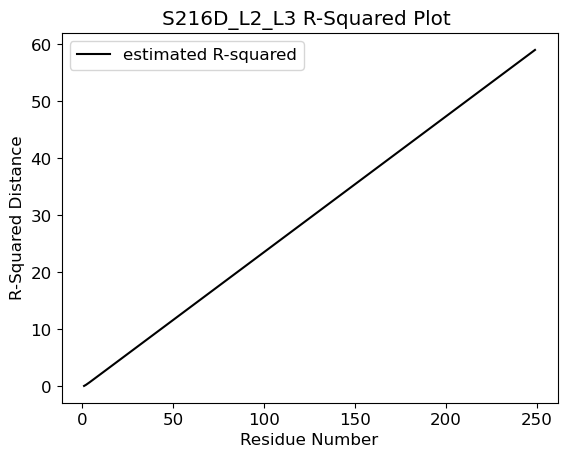

In [ ]:
system='S216D_L2_L3'
system_length=len(s216d_L2L3_x_values)
print(system_length)

zeta = 0.35 #persistence length [nm] #started at 0.35
lenPerResi = 0.34 # [nm]


# for R**2, see Eqn 5 in the mapid paper
def RR_ZL(zeta,L):
    print(L)
    prefac = 2 * zeta * L
    expon = np.exp(-L/zeta)
    expon = (zeta/L) * (1-expon)
    expon = 1 - expon
    print(prefac*expon)
    print('BREAK')
    return prefac * expon


#D = 40 *lenPerResi
#L = 450 * lenPerResi  #estimated protein length given nm

estimated=[]
for i in range(1,system_length+1):
    L=i*lenPerResi
    #print(L)
    estimated.append(RR_ZL(zeta,L))

#print(estimated)

plt.plot(s216d_L2L3_x_values,estimated,'k-',label='estimated R-squared')


title=system + " R-Squared Plot "
plt.title(title)
plt.xlabel("Residue Number")
plt.ylabel("R-Squared Distance")
#ax.figure.set_size_inches(8.0,6.0)
plt.legend()

#name=system + '_r-squared_plot.png'

#plt.gcf().savefig(name,dpi=300)
plt.show()

[0.08574275999764323, 0.26610701849787943, 0.482289476697068, 0.7120306234604508, 0.9469043016499228, 1.183720857921967, 1.4212728749112222, 1.6591032945812278, 1.8970391013247176, 2.135014801488873, 2.373005602983388, 2.6110021209638514, 2.8490008028736384, 3.087000303921295, 3.325000115046938, 3.5630000435500837, 3.801000016485531, 4.039000006240464, 4.277000002362277, 4.51500000089422, 4.753000000338499, 4.991000000128136, 5.229000000048505, 5.467000000018361, 5.705000000006949, 5.94300000000263, 6.181000000000995, 6.419000000000377, 6.657000000000142, 6.895000000000055, 7.1330000000000195, 7.3710000000000075, 7.6090000000000035, 7.847000000000001, 8.085, 8.323, 8.561, 8.799, 9.036999999999999, 9.274999999999999, 9.513, 9.750999999999998, 9.988999999999999, 10.226999999999999, 10.464999999999998, 10.703000000000001, 10.940999999999997, 11.178999999999998, 11.416999999999998, 11.654999999999998, 11.892999999999999, 12.130999999999998, 12.369, 12.607, 12.844999999999999, 13.083, 13.32

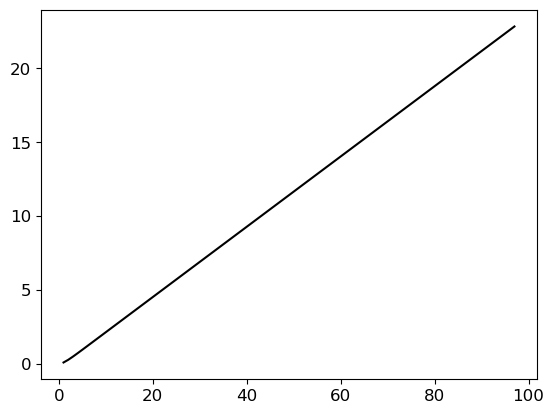

In [ ]:
aaNterm = 97
Ang_to_nm = 0.1
Ang_per_res = 3.4 # [A]
list=[]
for i in range(1,aaNterm+1):
    list.append(i)

test=[]
for i in range(1,aaNterm+1):
    L_freeN = i * Ang_per_res * Ang_to_nm # M1-M98
    #print (L_freeN, " [nm]")
    rsqd = RR_ZL(zeta,L_freeN)
    test.append(rsqd)
    #print("R^2: %3.1f [nm]"%rsqd)
    #print("sqrt(R^2): %3.1f [nm]"%np.sqrt(rsqd))


print(test)

plt.plot(list,test,'k-',label='estimated R-squared')

['abm_water_rep1.xtc', 'abm_water_rep2.xtc', 'abm_water_rep3.xtc']
['abm_water_rep1_start.pdb', 'abm_water_rep2_start.pdb', 'abm_water_rep3_start.pdb']


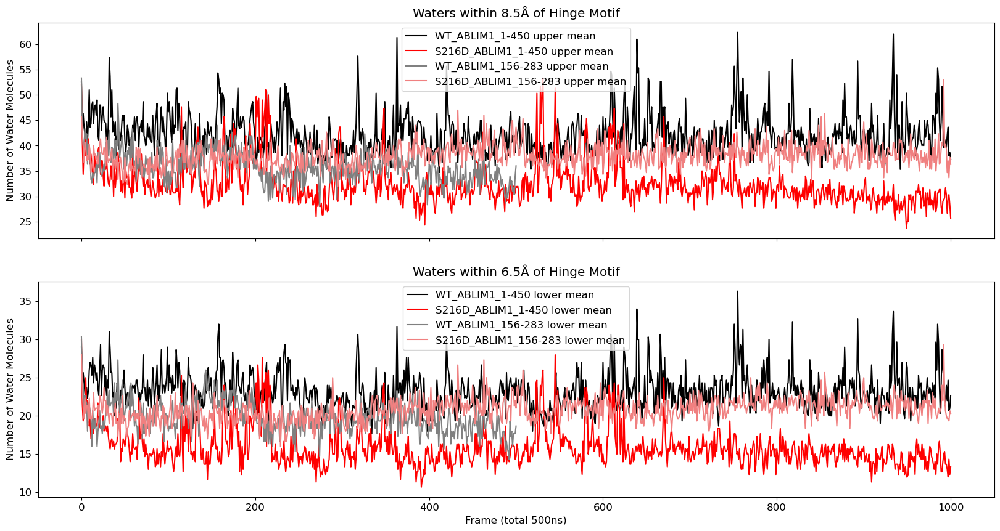

In [22]:
#Water shell MSSSP motif
systems=['WT_ABLIM1_1-450','S216D_ABLIM1_1-450','WT_ABLIM1_156-283','S216D_ABLIM1_156-283']
colors=['black','red','gray','lightcoral']
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
lower_bar_means=[]
lower_bar_sds=[]
upper_bar_means=[]
upper_bar_sds=[]

#Different traj & top files for analysis that include the solution
water_template= 'abm_water_rep%s'
water_trajectory= [water_template % (str(i)+'.xtc') for i in range (1,4)]

water_topology= [water_template % (str(i)+'_start.pdb') for i in range (1,4)]

print(water_trajectory)
print(water_topology)

color_num=0
#colors=['black','red','gray','green']


fig,(ax1,ax2) = plt.subplots(nrows=2,sharex=True)

ax1.figure.set_size_inches(20.0,15.0)
ax2.figure.set_size_inches(20.0,10.0)
#fig=plt.figure(figsize=(25,10))
#title="Mean Watershell Distances of All Systems"
#plt.title(title)
#plt.xlabel("Frame")
#plt.ylabel("Distance in Å")
for system in systems:
    os.chdir(path+'/'+system)
    #mask of the system is the MSSSP motif residues of the system / MSSDP motif for phosphorylated system
    if system=='WT_ABLIM1_1-450':
        mask=':213-217'
    elif system=='S216D_ABLIM1_1-450':
        mask=':213-217'
    elif system=='WT_ABLIM1_156-283':
        mask=':58-62'
    elif system=='S216D_ABLIM1_156-283':
        mask=':117-121'

    sys_mean=system + ' mean'

    traj1=pt.iterload(water_trajectory[0],water_topology[0])
    traj2=pt.iterload(water_trajectory[1],water_topology[1])
    traj3=pt.iterload(water_trajectory[2],water_topology[2])
    #traj4=pt.iterload(water_trajectory[3],water_topology[3])
    #traj5=pt.iterload(water_trajectory[4],water_topology[4])
    #traj6=pt.iterload(water_trajectory[5],water_topology[5])
    #traj7=pt.iterload(water_trajectory[6],water_topology[6])
    #print(traj1)
    #print(traj2)
    #print(traj3)
    #set angstrom limits for finding # of water beads within the space
    lower_limit=6.5
    upper_limit=8.5
    data1=pt.watershell(traj1, solute_mask=mask,solvent_mask='@WN',lower=lower_limit,upper=upper_limit)
    data2=pt.watershell(traj2, solute_mask=mask,solvent_mask='@WN',lower=lower_limit,upper=upper_limit)
    data3=pt.watershell(traj3, solute_mask=mask,solvent_mask='@WN',lower=lower_limit,upper=upper_limit)
    #data4=pt.watershell(traj4, solute_mask=mask,solvent_mask='@WN',lower=lower_limit,upper=upper_limit)
    #data5=pt.watershell(traj5, solute_mask=mask,solvent_mask='@WN',lower=lower_limit,upper=upper_limit)
    #data6=pt.watershell(traj6, solute_mask=mask,solvent_mask='@WN',lower=lower_limit,upper=upper_limit)
    #data7=pt.watershell(traj7, solute_mask=mask,solvent_mask='@WN',lower=lower_limit,upper=upper_limit)
    #print(data1[0])
    #print(data2)
    #print(data3)
    lowers_list=[data1[0],data2[0],data3[0]]#,data4[0],data5[0],data6[0],data7[0]]
    uppers_list=[data1[1],data2[1],data3[1]]#,data4[1],data5[1],data6[1],data7[1]]

    #mean of lower limit mean/sd
    lower_arrays = [np.array(x) for x in lowers_list]
    lower_means=[np.mean(k) for k in zip(*lower_arrays)]
    lower_sds=[np.std(k) for k in zip(*lower_arrays)]
    #print(lower_means)
    #print(lower_sds)
    #mean of upper limit mean/sd
    upper_arrays = [np.array(x) for x in uppers_list]
    upper_means=[np.mean(k) for k in zip(*upper_arrays)]
    upper_sds=[np.std(k) for k in zip(*upper_arrays)]
    #print(upper_means)
    #print(upper_sds)

    #first 200 frames less representative of whole system progression over 2 microseconds, so cut them out
    lower_bar_means.append(np.mean(lower_means[100:]))
    lower_bar_sds.append(np.std(lower_sds[100:]))
    upper_bar_means.append(np.mean(upper_means[100:]))
    upper_bar_sds.append(np.std(upper_sds[100:]))

    x1=np.arange(0,len(lower_means))
    x2=np.arange(0,len(upper_means))
    y1=np.array(lower_means)
    y2=np.array(upper_means)
    e1=np.array(lower_sds)
    e2=np.array(upper_sds)
    #ax.set_ylim(0.0,40.0)


    lower_legend=system+' lower mean'
    upper_legend=system+' upper mean'
    ax1.plot(x2,y2,linestyle='-',color=colors[color_num],label=upper_legend)
    ax2.plot(x1,y1,linestyle='-',color=colors[color_num],label=lower_legend)

    ax1.set_title('Waters within ' + str(upper_limit) + 'Å of Hinge Motif')
    ax1.set_ylabel('Number of Water Molecules')

    ax2.set_title('Waters within ' + str(lower_limit) + 'Å of Hinge Motif')
    ax2.set_ylabel('Number of Water Molecules')


    color_num+=1
    leg = ax1.legend()
    end=ax2.legend()

    #mean of

plt.xlabel("Frame (total 500ns)")
os.chdir(path)
name='EXTENDED_Mean_Watershell_Atoms.png'
#plt.gcf().savefig(name,dpi=300)
plt.show()

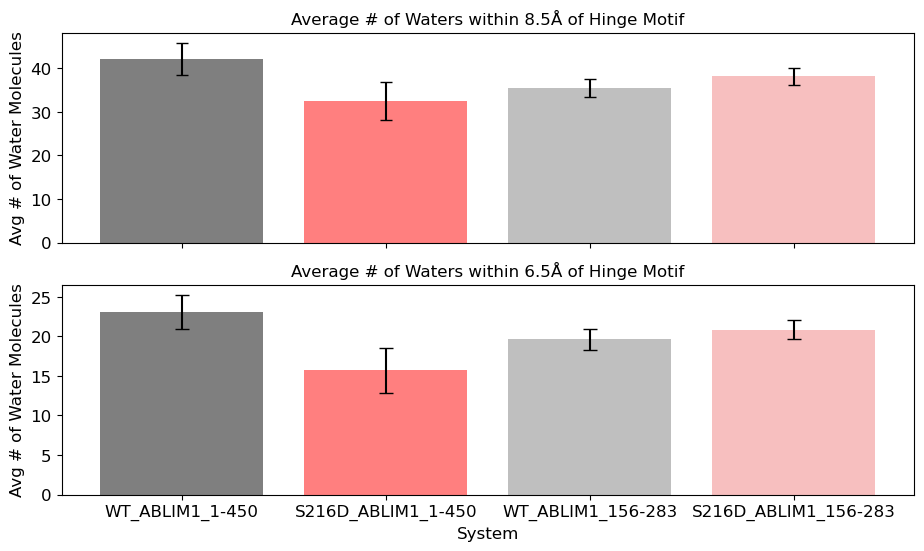

In [24]:
systems=['WT_ABLIM1_1-450','S216D_ABLIM1_1-450','WT_ABLIM1_156-283','S216D_ABLIM1_156-283']
colors=['black','red','gray','lightcoral']

fig,(ax1,ax2) = plt.subplots(nrows=2,sharex=True)


ax1.figure.set_size_inches(8.0,8.0)
ax2.figure.set_size_inches(11.0,6.0)
x1=np.array(systems)
x2=np.array(systems)
y1=np.array(lower_bar_means)
y2=np.array(upper_bar_means)
e1=np.array(lower_bar_sds)
e2=np.array(upper_bar_sds)
    #ax.set_ylim(0.0,40.0)

lower_legend=system+' lower mean'
upper_legend=system+' upper mean'
ax1.bar(x2,y2,yerr=e2, align='center',alpha=0.5,color=colors,capsize=4)
ax2.bar(x1,y1,yerr=e1, align='center',alpha=0.5,color=colors,capsize=5)

ax1.set_title('Average # of Waters within ' + str(upper_limit) + 'Å of Hinge Motif',size=12.0)
ax1.set_ylabel('Avg # of Water Molecules')

ax2.set_title('Average # of Waters within ' + str(lower_limit) + 'Å of Hinge Motif',size=12.0)
ax2.set_ylabel('Avg # of Water Molecules')
ax2.set_xlabel('System',size=12.0)

os.chdir(path)
name='EXTENDED_Average_Waters.png'
plt.gcf().savefig(name,dpi=300)
plt.show()

['abm_water_rep1.xtc', 'abm_water_rep2.xtc', 'abm_water_rep3.xtc']
['abm_water_rep1_start.pdb', 'abm_water_rep2_start.pdb', 'abm_water_rep3_start.pdb']
pytraj.TrajectoryIterator, 257 frames: 
Size: 0.192673 (GB)
<Topology: 33541 atoms, 10918 residues, 10838 mols, PBC with box type = cubic>
           
pytraj.TrajectoryIterator, 2043 frames: 
Size: 1.530541 (GB)
<Topology: 33517 atoms, 10716 residues, 10589 mols, PBC with box type = cubic>
           
pytraj.TrajectoryIterator, 620 frames: 
Size: 0.701482 (GB)
<Topology: 50619 atoms, 16631 residues, 16551 mols, PBC with box type = cubic>
           


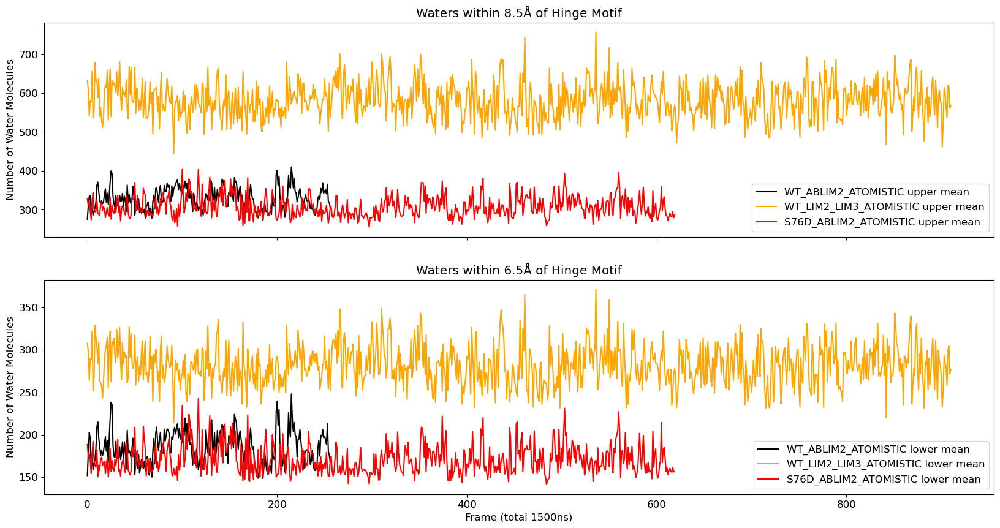

In [4]:
#Water shell MSSSP motif for atomistics
systems=['WT_ABLIM2_ATOMISTIC','WT_LIM2_LIM3_ATOMISTIC','S76D_ABLIM2_ATOMISTIC']
colors=['black','orange','red']
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
lower_bar_means=[]
lower_bar_sds=[]
upper_bar_means=[]
upper_bar_sds=[]

#Different traj & top files for analysis that include the solution
water_template= 'abm_water_rep%s'
water_trajectory= [water_template % (str(i)+'.xtc') for i in range (1,4)]

water_topology= [water_template % (str(i)+'_start.pdb') for i in range (1,4)]

print(water_trajectory)
print(water_topology)

color_num=0



fig,(ax1,ax2) = plt.subplots(nrows=2,sharex=True)

ax1.figure.set_size_inches(20.0,15.0)
ax2.figure.set_size_inches(20.0,10.0)
#fig=plt.figure(figsize=(25,10))
#title="Mean Watershell Distances of All Systems"
#plt.title(title)
#plt.xlabel("Frame")
#plt.ylabel("Distance in Å")
for system in systems:
    os.chdir(path+'/'+system)
    #mask of the system is the MSSSP motif residues of the system / MSSDP motif for phosphorylated system
    if system=='WT_ABLIM2_ATOMISTIC':
        mask=':73-77'
    elif system=='S76D_ABLIM2_ATOMISTIC':
        mask=':73-77'
    elif system=='WT_LIM2_LIM3_ATOMISTIC':
        mask=':213-217'
    
    sys_mean=system + ' mean'

    traj1=pt.iterload(water_trajectory[0],water_topology[0])
    print(traj1)
    traj2=pt.iterload(water_trajectory[1],water_topology[1])
    traj3=pt.iterload(water_trajectory[2],water_topology[2])
    
    #set angstrom limits for finding # of water beads within the space
    lower_limit=6.5
    upper_limit=8.5
    data1=pt.watershell(traj1, solute_mask=mask,solvent_mask=':SOL@OW',lower=lower_limit,upper=upper_limit)
    data2=pt.watershell(traj2, solute_mask=mask,solvent_mask=':SOL@OW',lower=lower_limit,upper=upper_limit)
    data3=pt.watershell(traj3, solute_mask=mask,solvent_mask=':SOL@OW',lower=lower_limit,upper=upper_limit)
    
    lowers_list=[data1[0],data2[0],data3[0]]#,data4[0],data5[0],data6[0],data7[0]]
    uppers_list=[data1[1],data2[1],data3[1]]#,data4[1],data5[1],data6[1],data7[1]]

    #mean of lower limit mean/sd
    lower_arrays = [np.array(x) for x in lowers_list]
    lower_means=[np.mean(k) for k in zip(*lower_arrays)]
    lower_sds=[np.std(k) for k in zip(*lower_arrays)]
    #print(lower_means)
    #print(lower_sds)
    #mean of upper limit mean/sd
    upper_arrays = [np.array(x) for x in uppers_list]
    upper_means=[np.mean(k) for k in zip(*upper_arrays)]
    upper_sds=[np.std(k) for k in zip(*upper_arrays)]
    #print(upper_means)
    #print(upper_sds)

    #first 100 frames less representative of whole system progression over 2 microseconds, so cut them out
    lower_bar_means.append(np.mean(lower_means[10:]))
    lower_bar_sds.append(np.std(lower_sds[10:]))
    upper_bar_means.append(np.mean(upper_means[10:]))
    upper_bar_sds.append(np.std(upper_sds[10:]))

    x1=np.arange(0,len(lower_means))
    x2=np.arange(0,len(upper_means))
    y1=np.array(lower_means)
    y2=np.array(upper_means)
    e1=np.array(lower_sds)
    e2=np.array(upper_sds)
    #ax.set_ylim(0.0,40.0)


    lower_legend=system+' lower mean'
    upper_legend=system+' upper mean'
    ax1.plot(x2,y2,linestyle='-',color=colors[color_num],label=upper_legend)
    ax2.plot(x1,y1,linestyle='-',color=colors[color_num],label=lower_legend)

    ax1.set_title('Waters within ' + str(upper_limit) + 'Å of Hinge Motif')
    ax1.set_ylabel('Number of Water Molecules')

    ax2.set_title('Waters within ' + str(lower_limit) + 'Å of Hinge Motif')
    ax2.set_ylabel('Number of Water Molecules')


    color_num+=1
    leg = ax1.legend()
    end=ax2.legend()


plt.xlabel("Frame (total 1500ns)")
os.chdir(path)
#name='ATOMISTIC_Mean_Watershell_Atoms.png'
#plt.gcf().savefig(name,dpi=300)
plt.show()

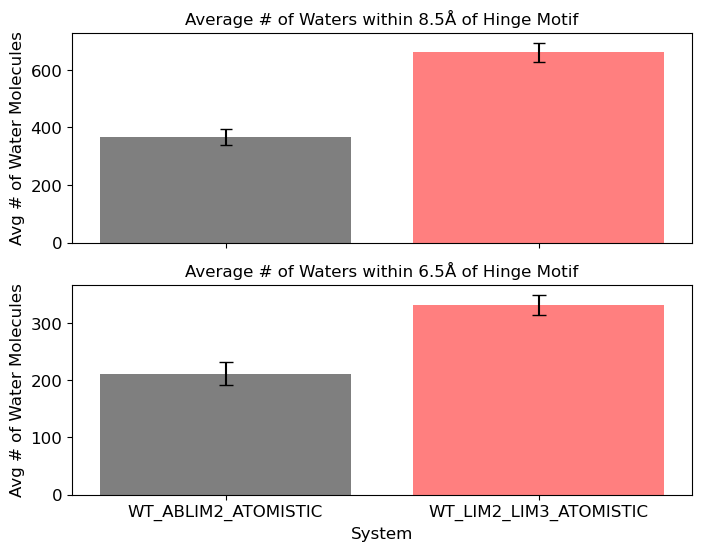

In [21]:
systems=['WT_ABLIM2_ATOMISTIC','WT_LIM2_LIM3_ATOMISTIC','S76D_ABLIM2_ATOMISTIC']
colors=['black','orange','red']

fig,(ax1,ax2) = plt.subplots(nrows=2,sharex=True)


ax1.figure.set_size_inches(8.0,8.0)
ax2.figure.set_size_inches(8.0,6.0)
x1=np.array(systems)
x2=np.array(systems)
y1=np.array(lower_bar_means)
y2=np.array(upper_bar_means)
e1=np.array(lower_bar_sds)
e2=np.array(upper_bar_sds)
    #ax.set_ylim(0.0,40.0)

lower_legend=system+' lower mean'
upper_legend=system+' upper mean'
ax1.bar(x2,y2,yerr=e2, align='center',alpha=0.5,color=colors,capsize=4)
ax2.bar(x1,y1,yerr=e1, align='center',alpha=0.5,color=colors,capsize=5)

ax1.set_title('Average # of Waters within ' + str(upper_limit) + 'Å of Hinge Motif',size=12.0)
ax1.set_ylabel('Avg # of Water Molecules')

ax2.set_title('Average # of Waters within ' + str(lower_limit) + 'Å of Hinge Motif',size=12.0)
ax2.set_ylabel('Avg # of Water Molecules')
ax2.set_xlabel('System',size=12.0)

os.chdir(path)
name='ATOMISTIC_Average_Waters.png'
plt.gcf().savefig(name,dpi=300)
plt.show()

In [27]:
#SAVE CSVs of SQUARED
import csv
os.chdir(path)

#wt_extended_r_squared
#s216d_extended_r_squared
#wt_L2L3_r_squared
#s216d_L2L3_r_squared
#print(wt_extended_r_squared)
#print(s216d_extended_r_squared)

wt_output=path+'/wt_r2_Nterm.csv'
wt_r2_Nterm=wt_extended_r_squared[0:94]
#print(wt_r2_Nterm)
wt_dF=pd.DataFrame(wt_r2_Nterm)
#print(wt_dF)

wt_dF.to_csv('wt_r2_Nterm.csv',index=False,header=None)
print(wt_dF)

s216d_output=path+'/s216d_r2_Nterm.csv'
s216d_r2_Nterm=s216d_extended_r_squared[0:94]
s216d_dF=pd.DataFrame(s216d_r2_Nterm)
s216d_dF.to_csv('s216d_r2_Nterm.csv',index=False,header=None)

#print(len(wt_r2_Nterm))
#print(wt_r2_Nterm)
#print('BREAK')
#print(s216d_r2_Nterm)
#os.chdir(path)


#with open('wt_r2_Nterm.csv','wb') as wt_csvFile: #EDIT - because comment.
#    writer = csv.writer(wt_csvFile)
#    writer.writerows(wt_r2_Nterm)


#with open('s216d_r2_Nterm.csv','wb') as s216d_csvFile: #EDIT - because comment.
#    writer = csv.writer(s216d_csvFile)
#    writer.writerows(s216d_r2_Nterm)

              0
0      0.000000
1     10.528302
2     33.592664
3     66.786463
4     94.898922
..          ...
89  2697.342701
90  2774.408672
91  2786.776660
92  2693.419975
93  2646.091499

[94 rows x 1 columns]


[2.5540820261813906]
[0.02895116437787628]
[2.5540820261813906, 2.608970212525923]
[0.02895116437787628, 0.04519033199190769]
[2.5540820261813906, 2.608970212525923, 2.2685073774481572]
[0.02895116437787628, 0.04519033199190769, 0.03869123472866206]
[2.5540820261813906, 2.608970212525923, 2.2685073774481572, 2.5931179799510624]
[0.02895116437787628, 0.04519033199190769, 0.03869123472866206, 0.05489124470699938]
[2.571926305040465]
[0.030534686826492786]
[2.571926305040465, 2.6929973652193016]
[0.030534686826492786, 0.049917814854205184]
[2.571926305040465, 2.6929973652193016, 2.627759722414859]
[0.030534686826492786, 0.049917814854205184, 0.03936166448272539]
[2.571926305040465, 2.6929973652193016, 2.627759722414859, 2.584293426380049]
[0.030534686826492786, 0.049917814854205184, 0.03936166448272539, 0.03317528097174317]
[0.02895116437787628, 0.04519033199190769, 0.03869123472866206, 0.05489124470699938]
[0.030534686826492786, 0.049917814854205184, 0.03936166448272539, 0.03317528097174

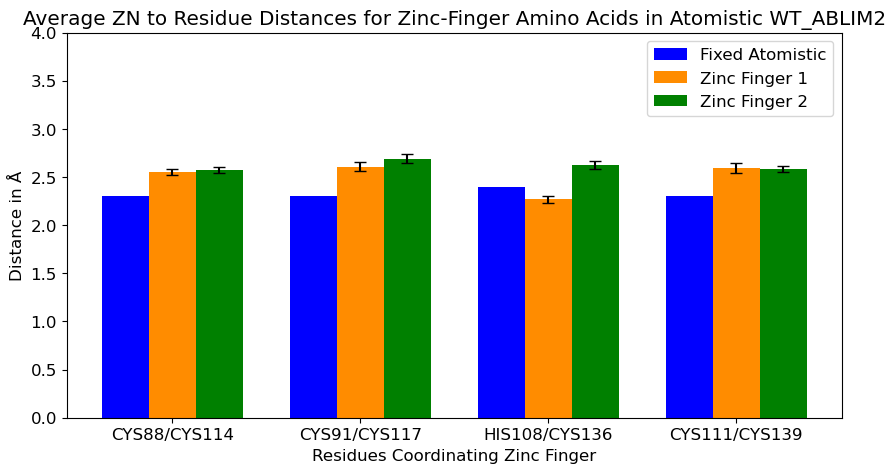

In [20]:
#DISTANCE BETWEEN ZNS AND COORDINATING RESIDUES IN ATOMISTIC WT_ABLIM2
#unfinished cell as it was deemed not super relevant for CG simulation that was constrained

import statistics

system='WT_ABLIM2_71-151_ATOMISTIC'

path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
os.chdir(path+'/'+system)

ABLIM2_constraints={'@1165':['@253','@294','@545','@588'],'@1166':['@634','@670','@964','@1013']}

template= 'abm_ProtIon_rep%s'
trajectory= [template % (str(i)+'.xtc') for i in range (1,8)]
#print(trajectory)

topology= [template % (str(i)+'_start.pdb') for i in range (1,8)]

traj1=pt.iterload(trajectory[0],topology[0])
traj2=pt.iterload(trajectory[1],topology[1])
traj3=pt.iterload(trajectory[2],topology[2])
#traj4=pt.iterload(trajectory[3],topology[3])
#traj5=pt.iterload(trajectory[4],topology[4])
#traj6=pt.iterload(trajectory[5],topology[5])
#traj7=pt.iterload(trajectory[6],topology[6])
os.chdir(path)

fingers=['Fixed Atomistic Finger 1','CG Zinc-Finger 1','CG Zinc-Finger 2']

constraints=ABLIM2_constraints

#print(constraints)

fixed_dist=(2.3,2.3,2.4,2.3)
finger1_means=[]
finger2_means=[]
e1=[]
e2=[]

for key, value in constraints.items():
    finger_means=[]
    if key=='@1165':
        for i in range(0,4):
        #print(type(combo))
            zinc=key
            atom=value[i]
            pair=atom + ' ' + zinc
            #print(pair)
            distance1=pt.distance(traj1,pair)
            distance2=pt.distance(traj2,pair)
            distance3=pt.distance(traj3,pair)
            #distance4=pt.distance(traj4,pair)
            #distance5=pt.distance(traj5,pair)
            #distance6=pt.distance(traj6,pair)
            #distance7=pt.distance(traj7,pair)
            distances=[distance1,distance2,distance3]#,distance4,distance5,distance6,distance7]
            distance_arrays = [np.array(x) for x in distances]
            #print(mean_arrays)
            means=[np.mean(k) for k in zip(*distance_arrays)]
            true_mean=statistics.fmean(means)
            sds=[np.std(j) for j in zip(*distance_arrays)]
            e1.append(np.std(sds))
            #print(true_mean)
            finger1_means.append(true_mean)
            #print(len(means))
            #print(type(means))
            print(finger1_means)
            print(e1)
            #print(len(finger_means))
            #final_array=[np.array(j) for j in finger_means]
            #final_means=[np.mean(l) for l in zip(*final_array)]
            #finger1_means.append(final_means)
        #print(len(finger1_means))
        #print(finger1_means)
    else:
        for i in range(0,4):
        #print(type(combo))
            zinc=key
            atom=value[i]
            pair=atom + ' ' + zinc
            #print(pair)
            distance1=pt.distance(traj1,pair)
            distance2=pt.distance(traj2,pair)
            distance3=pt.distance(traj3,pair)
            #distance4=pt.distance(traj4,pair)
            #distance5=pt.distance(traj5,pair)
            #distance6=pt.distance(traj6,pair)
            #distance7=pt.distance(traj7,pair)
            distances=[distance1,distance2,distance3]#,distance4,distance5,distance6,distance7]
            distance_arrays = [np.array(x) for x in distances]
            #print(mean_arrays)
            means=[np.mean(k) for k in zip(*distance_arrays)]
            sds=[np.std(j) for j in zip(*distance_arrays)]
            e2.append(np.std(sds))
            true_mean=statistics.fmean(means)
            #print(true_mean)
            finger2_means.append(true_mean)
            print(finger2_means)
            print(e2)
            #final_array=[np.array(j) for j in finger_means]
            #final_means=[np.mean(l) for l in zip(*final_array)]
            #finger2_means.append(final_means)
        #print(len(finger2_means))
        #print(finger2_means)

#print(finger1_means)
#print(len(finger1_means))

N=4
# Specify the values of blue bars (height)
blue_bar = (2.1,2.8,2.9,3.1)
# Specify the values of orange bars (height)
#orange_bar = (1.9, 2.8, 2.4,2.8)

# Position of bars on x-axis
ind = np.arange(N)

# Figure size
plt.figure(figsize=(10,5))

# Width of a bar
width = 0.25

#print(finger1_means)
print(e1)
print(e2)
# Plotting
plt.bar(ind, fixed_dist , width, label='Fixed Atomistic',color='blue')
plt.bar(ind+width, finger1_means, width,yerr=e1,capsize=4,label='Zinc Finger 1',color='darkorange')
plt.bar(ind+width + width, finger2_means, width,yerr=e2,capsize=4,label='Zinc Finger 2',color='green')

plt.xlabel('Residues Coordinating Zinc Finger')
plt.ylabel('Distance in Å')
plt.title('Average ZN to Residue Distances for Zinc-Finger Amino Acids in Atomistic WT_ABLIM2')
plt.ylim(0,4)
# xticks()
# First argument - A list of positions at which ticks should be placed
# Second argument -  A list of labels to place at the given locations
plt.xticks(ind + width, ('CYS88/CYS114','CYS91/CYS117','HIS108/CYS136','CYS111/CYS139'))

# Finding the best position for legends and putting it
plt.legend(loc='best')
name='ATOMISTIC_WT_ABLIM2_ZN_Fingers.png'
plt.gcf().savefig(name,dpi=300)
plt.show()



pytraj.TrajectoryIterator, 5126 frames: 
Size: 0.133594 (GB)
<Topology: 1166 atoms, 83 residues, 3 mols, PBC with box type = cubic>
           


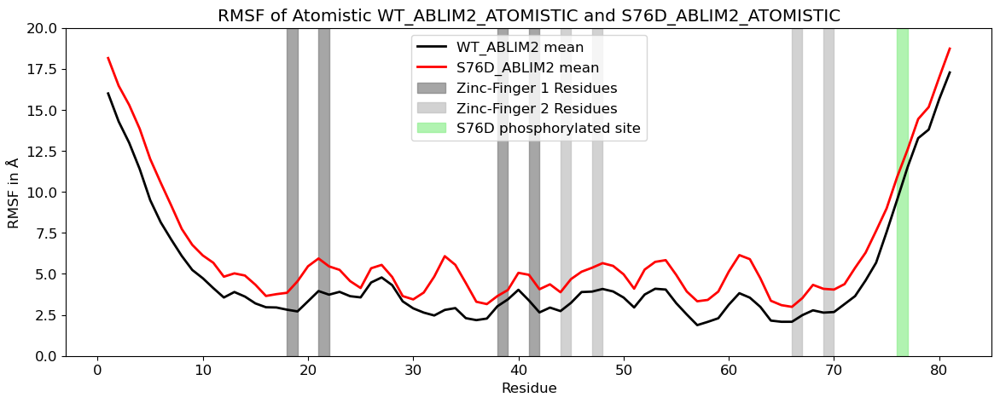

In [31]:
#OVERLAY ATOMISTIC WT_ABLIM2 & S76D_ABLIM2 RMSF

system1='WT_ABLIM2_ATOMISTIC'
os.chdir(path+'/'+system1)

WT_traj1=pt.iterload(trajectory[0],topology[0])
WT_traj2=pt.iterload(trajectory[1],topology[1])
WT_traj3=pt.iterload(trajectory[2],topology[2])
#WT_traj4=pt.iterload(trajectory[3],topology[3])
#WT_traj5=pt.iterload(trajectory[4],topology[4])
#WT_traj6=pt.iterload(trajectory[5],topology[5])
#WT_traj7=pt.iterload(trajectory[6],topology[6])
print(WT_traj1)

system2='S76D_ABLIM2_ATOMISTIC'
os.chdir(path+'/'+system2)
S76D_traj1=pt.iterload(trajectory[0],topology[0])
S76D_traj2=pt.iterload(trajectory[1],topology[1])
S76D_traj3=pt.iterload(trajectory[2],topology[2])
#S76D_traj4=pt.iterload(trajectory[3],topology[3])
##S76D_traj5=pt.iterload(trajectory[4],topology[4])
#S76D_traj6=pt.iterload(trajectory[5],topology[5])
#S76D_traj7=pt.iterload(trajectory[6],topology[6])
os.chdir(path)

#Calculate RMSF for each replicate of each system
WT_traj1_imposed= pt.superpose(WT_traj1,ref=0)
WTrmsf_data1=pt.rmsf(WT_traj1_imposed,mask='@CA',options='byres')
#print(WTrmsf_data1.T[0])

WT_traj2_imposed= pt.superpose(WT_traj2,ref=0)
WTrmsf_data2=pt.rmsf(WT_traj2_imposed,mask='@CA',options='byres')
#print(WTrmsf_data2.T[0])

WT_traj3_imposed= pt.superpose(WT_traj3,ref=0)
WTrmsf_data3=pt.rmsf(WT_traj3_imposed,mask='@CA',options='byres')
#print(rmsf_data3)
#WT_traj4_imposed= pt.superpose(WT_traj4,ref=0)
#WTrmsf_data4=pt.rmsf(WT_traj4_imposed,mask='@CA',options='byres')

#WT_traj5_imposed= pt.superpose(WT_traj5,ref=0)
#WTrmsf_data5=pt.rmsf(WT_traj5_imposed,mask='@CA',options='byres')

#WT_traj6_imposed= pt.superpose(WT_traj6,ref=0)
#WTrmsf_data6=pt.rmsf(WT_traj6_imposed,mask='@CA',options='byres')

#WT_traj7_imposed= pt.superpose(WT_traj7,ref=0)
#WTrmsf_data7=pt.rmsf(WT_traj7_imposed,mask='@CA',options='byres')

S76D_traj1_imposed= pt.superpose(S76D_traj1,ref=0)
S76Drmsf_data1=pt.rmsf(S76D_traj1_imposed,mask='@CA',options='byres')
#print(S76Drmsf_data1)

S76D_traj2_imposed= pt.superpose(S76D_traj2,ref=0)
S76Drmsf_data2=pt.rmsf(S76D_traj2_imposed,mask='@CA',options='byres')
#print(rmsf_data2)

S76D_traj3_imposed= pt.superpose(S76D_traj3,ref=0)
S76Drmsf_data3=pt.rmsf(S76D_traj3_imposed,mask='@CA',options='byres')
#print(rmsf_data3)

#S76D_traj4_imposed= pt.superpose(S76D_traj4,ref=0)
#S76Drmsf_data4=pt.rmsf(S76D_traj4_imposed,mask='@BB',options='byres')

#S76D_traj5_imposed= pt.superpose(S76D_traj5,ref=0)
#S76Drmsf_data5=pt.rmsf(S76D_traj5_imposed,mask='@BB',options='byres')

#S76D_traj6_imposed= pt.superpose(S76D_traj6,ref=0)
#S76Drmsf_data6=pt.rmsf(S76D_traj6_imposed,mask='@BB',options='byres')

#S76D_traj7_imposed= pt.superpose(S76D_traj7,ref=0)
#S76Drmsf_data7=pt.rmsf(S76D_traj7_imposed,mask='@BB',options='byres')


#generate list of RMSFs, convert to arrays, and calculate mean of all arrays
WT_multiple_lists = [WTrmsf_data1.T[1],WTrmsf_data2.T[1],WTrmsf_data3.T[1]]#,WTrmsf_data4.T[1],WTrmsf_data5.T[1],WTrmsf_data6.T[1],WTrmsf_data7.T[1]]
WT_arrays = [np.array(x) for x in WT_multiple_lists]
WT_means=[np.mean(k) for k in zip(*WT_arrays)]

#print(len(WT_means))
#print(WT_means)


S76D_multiple_lists = [S76Drmsf_data1.T[1],S76Drmsf_data2.T[1],S76Drmsf_data3.T[1]]#,S76Drmsf_data4.T[1],S76Drmsf_data5.T[1],S76Drmsf_data6.T[1],S76Drmsf_data7.T[1]]
S76D_arrays = [np.array(x) for x in S76D_multiple_lists]
S76D_means=[np.mean(k) for k in zip(*S76D_arrays)]
#print(S76D_means)


fig=plt.figure(figsize=(14,5))
ax=plt.gca()
ax.set_ylim(0.0,20.0)
ax.plot(WTrmsf_data1.T[0],WT_means,linestyle='-',linewidth=2.0,color='black',label='WT_ABLIM2 mean')
ax.plot(S76Drmsf_data1.T[0],S76D_means,linestyle='-',linewidth=2.0,color='red',label='S76D_ABLIM2 mean')

#Add highlighted regions to figure for ZN finger 1
finger1_constraints=[18,21,38,41]
for constraint in finger1_constraints:
    res=constraint
    if res==18:
        plt.axvspan(res,res+1, color='gray',alpha=0.7,label='Zinc-Finger 1 Residues')
    else:
        plt.axvspan(res,res+1, color='gray',alpha=0.7)

#Add highlighted regions to figure for ZN finger 2
finger2_constraints=[44,47,66,69,76]
for constraint in finger2_constraints:
    res=constraint
    if res==44:
        plt.axvspan(res,res+1, color='silver',alpha=0.7,label='Zinc-Finger 2 Residues')
    elif res==76:
        #also highlight the phosphorylation site at the tail of ABLIM2 LIM2
        plt.axvspan(res,res+1, color='lightgreen',alpha=0.7,label='S76D phosphorylated site')
    else:
        plt.axvspan(res,res+1, color='silver',alpha=0.7)

title="RMSF of Atomistic " + system1 + ' and ' + system2
leg=ax.legend()
plt.title(title)
plt.xlabel("Residue")
plt.ylabel("RMSF in Å")

os.chdir(path)
name='ATOMISTIC_'+system1 + '_'+system2+'_RMSF.png'
plt.gcf().savefig(name,dpi=300)
plt.show()

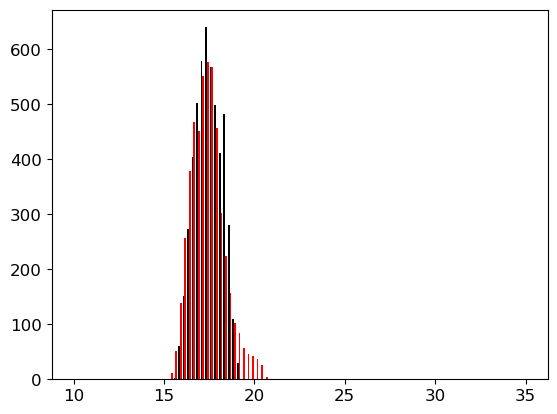

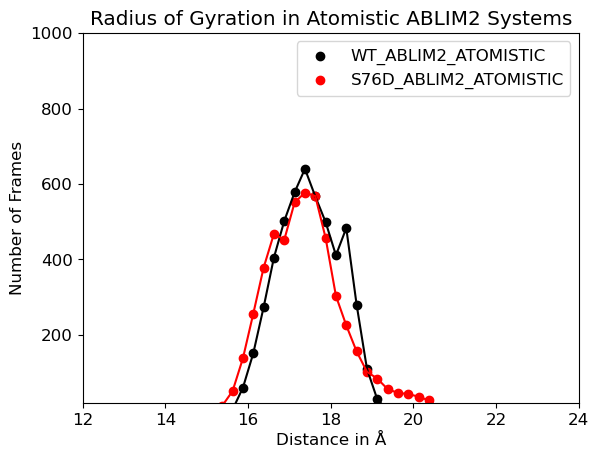

In [42]:
#HISTOGRAM OF MEAN ROG OF aTOMISTIC ABLIM2 SYSTEMS

x_multi=[]
systems=['WT_ABLIM2_ATOMISTIC','S76D_ABLIM2_ATOMISTIC']
n_bins=100
color_num=0
colors=['black','red']
fig,ax = plt.subplots()
for system in systems:
    os.chdir(path+'/'+system)
    sys_mean=system + ' mean'
    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    #traj4=pt.iterload(trajectory[3],topology[3])
    #traj5=pt.iterload(trajectory[4],topology[4])
    #traj6=pt.iterload(trajectory[5],topology[5])
    #traj7=pt.iterload(trajectory[6],topology[6])

    #pytraj radius of gyration calculated for the backbone atoms
    data1=pt.radgyr(traj1, mask='@CA')
    data2=pt.radgyr(traj2, mask='@CA')
    data3=pt.radgyr(traj3, mask='@CA')
    #data4=pt.radgyr(traj4, mask='@BB')
    #data5=pt.radgyr(traj5, mask='@BB')
    #data6=pt.radgyr(traj6, mask='@BB')
    #data7=pt.radgyr(traj7, mask='@BB')

    multiple_lists = [data1,data2,data3]#,data4,data5,data6,data7]
    arrays = [np.array(x) for x in multiple_lists]
    means=[np.mean(k) for k in zip(*arrays)]
    #print(means)
    #print(len(means))
    x_multi.append(means[10:5000])

    #legend=system+ ' mean'

#calculate the bars & edges of the histogram
bin_counts,bin_edges,bars=ax.hist(x_multi, n_bins, histtype='bar',range=(10,35),color=colors,label=systems)


fig,ax = plt.subplots()
for i in range(len(bin_counts)):
    #generate the outline/shape of the histogram for each system, NOT including the bars themselves
    bin_centres = (bin_edges[:-1] + bin_edges[1:])/2.
    plt.scatter(x=bin_centres,y=bin_counts[i],color=colors[i],label=systems[i])
    plt.plot(bin_centres,bin_counts[i],color=colors[i])


'''for i in range(len(x_multi)):
    histo, bin_edges = np.histogram(x_multi[i],nbins)
    bin_center = 0.5*(bin_edges[1:] + bin_edges[:-1])
    ax.plot(bin_center,histo,color=colors[i])
    ax.scatter(x=bin_center,y=histo,color=colors[i],label=systems[i])
#plt.show()
'''
title="Radius of Gyration in Atomistic ABLIM2 Systems"
plt.title(title)
plt.xlim(12,24)
plt.ylim(20,1000)
plt.xlabel("Distance in Å")
plt.ylabel("Number of Frames")
#ax.figure.set_size_inches(7.5,6.5)
ax.legend()
#for b in bars:
#    ax.bar_label(b, labels=[v.astype(np.int64) if v > 0 else '' for v in b.datavalues])

name='ATOMISTIC_ABLIM2_ROG_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()


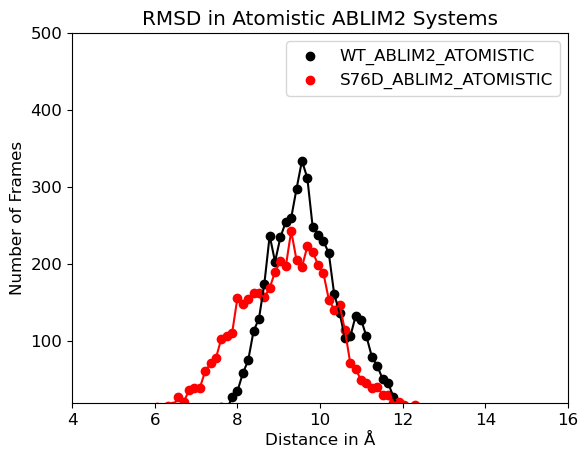

In [56]:
#Overlay of ATOMISTIC WT_ABLIM2 & S76D_ABLIM2 RMSD

system1='WT_ABLIM2_ATOMISTIC'
system2='S76D_ABLIM2_ATOMISTIC'
'''
os.chdir(path+'/'+system1)
WT_data1=pt.rmsd(WT_traj1, mask='@CA')
WT_data2=pt.rmsd(WT_traj2, mask='@CA')
WT_data3=pt.rmsd(WT_traj3, mask='@CA')
#WT_data4=pt.rmsd(WT_traj4, mask='@BB')
#WT_data5=pt.rmsd(WT_traj5, mask='@BB')
#WT_data6=pt.rmsd(WT_traj6, mask='@BB')
#WT_data7=pt.rmsd(WT_traj7, mask='@BB')
#print(WT_data1)

os.chdir(path+'/'+system2)
S76D_data1=pt.rmsd(S76D_traj1, mask='@CA')
S76D_data2=pt.rmsd(S76D_traj2, mask='@CA')
S76D_data3=pt.rmsd(S76D_traj3, mask='@CA')
#S76D_data4=pt.rmsd(S76D_traj4, mask='@BB')
#S76D_data5=pt.rmsd(S76D_traj5, mask='@BB')
#S76D_data6=pt.rmsd(S76D_traj6, mask='@BB')
#S76D_data7=pt.rmsd(S76D_traj7, mask='@BB')
#print(S76D_data1)

os.chdir(path)
WT_multiple_lists = [WT_data1,WT_data2,WT_data3]#,WT_data4,WT_data5,WT_data6,WT_data7]
WT_arrays = [np.array(x) for x in WT_multiple_lists]
WT_means=[np.mean(k) for k in zip(*WT_arrays)]

WT_sds=[np.std(k) for k in zip(*WT_arrays)]

S76D_multiple_lists = [S76D_data1,S76D_data2,S76D_data3]#,S76D_data4,S76D_data5,S76D_data6,S76D_data7]
S76D_arrays = [np.array(x) for x in S76D_multiple_lists]
S76D_means=[np.mean(k) for k in zip(*S76D_arrays)]
S76D_sds=[np.std(k) for k in zip(*S76D_arrays)]


fig,ax = plt.subplots()
#fig=plt.figure(figsize=(14,5))
#WTx1=np.arange(0,len(WT_data1))
#WTx2=np.arange(0,len(WT_data2))
#WTx3=np.arange(0,len(WT_data3))
WTx4=np.arange(0,len(WT_means[0:5000]))

#S76Dx1=np.arange(0,len(S76D_data1))
#S76Dx2=np.arange(0,len(S76D_data2))
#S76Dx3=np.arange(0,len(S76D_data3))
S76Dx4=np.arange(0,len(S76D_means[0:5000]))

#WTy1=np.array(WT_data1)
#WTy2=np.array(WT_data2)
#WTy3=np.array(WT_data3)
WTy4=np.array(WT_means[0:5000])

#S76Dy1=np.array(S76D_data1)
#S76Dy2=np.array(S76D_data2)
#S76Dy3=np.array(S76D_data3)
S76Dy4=np.array(S76D_means[0:5000])


ax=plt.gca()
ax.plot(WTx4,WTy4,linestyle='-',color='black',label='WT_ABLIM2 mean')
ax.plot(S76Dx4,S76Dy4,linestyle='-',color='red',label='S76D_ABLIM2 mean')
title="RMSD of ATOMISTIC " + system1 + ' and ' + system2
leg=ax.legend()
plt.title(title)
plt.xlabel("Frame")
plt.ylabel("RMSD in Å")
ax.figure.set_size_inches(10.0,5.0)

os.chdir(path)
name='ATOMISTIC_'+system1 + '_' + system2+'_RMSD.png'
plt.gcf().savefig(name,dpi=300)
plt.show()
'''
n_bins
x_multi=[]
x_multi.append(WTy4)
x_multi.append(S76Dy4)
#calculate the bars & edges of the histogram
bin_counts,bin_edges,bars=ax.hist(x_multi, n_bins, histtype='bar',color=colors,label=systems)


fig,ax = plt.subplots()
for i in range(len(bin_counts)):
    #generate the outline/shape of the histogram for each system, NOT including the bars themselves
    bin_centres = (bin_edges[:-1] + bin_edges[1:])/2.
    plt.scatter(x=bin_centres,y=bin_counts[i],color=colors[i],label=systems[i])
    plt.plot(bin_centres,bin_counts[i],color=colors[i])


'''for i in range(len(x_multi)):
    histo, bin_edges = np.histogram(x_multi[i],nbins)
    bin_center = 0.5*(bin_edges[1:] + bin_edges[:-1])
    ax.plot(bin_center,histo,color=colors[i])
    ax.scatter(x=bin_center,y=histo,color=colors[i],label=systems[i])
#plt.show()
'''

title="RMSD in Atomistic ABLIM2 Systems"
plt.title(title)
plt.xlim(4,16)
plt.ylim(20,500)
plt.xlabel("Distance in Å")
plt.ylabel("Number of Frames")
#ax.figure.set_size_inches(7.5,6.5)
ax.legend()
#for b in bars:
#    ax.bar_label(b, labels=[v.astype(np.int64) if v > 0 else '' for v in b.datavalues])

name='ATOMISTIC_ABLIM2_RMSD_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()




/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses/WT_ABLIM1_156-218_ATOMISTIC
WT_ABLIM1_156-218_ATOMISTIC attempt
/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses/WT_ABLIM1_156-218
/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses/WT_ABLIM1_156-283_ATOMISTIC
WT_ABLIM1_156-283_ATOMISTIC attempt
/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses/WT_ABLIM1_156-283


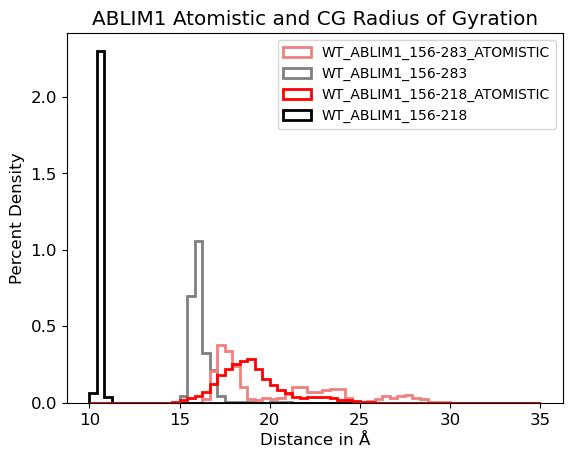

In [13]:
#HISTOGRAM OF MEAN ROG OF aTOMISTIC & CG WT ABLIM1 SYSTEMS
template= 'abm_ProtIon_rep%s'
trajectory= [template % (str(i)+'.xtc') for i in range (1,8)]
#print(trajectory)

topology= [template % (str(i)+'_start.pdb') for i in range (1,8)]

x_multi=[]
systems=['WT_ABLIM1_156-218_ATOMISTIC','WT_ABLIM1_156-218','WT_ABLIM1_156-283_ATOMISTIC','WT_ABLIM1_156-283']

#os.chdir(path+'/WT_LIM2_LIM3_ATOMISTIC')
#traj1=pt.iterload(trajectory[0],topology[0],':156-220')
#traj2=pt.iterload(trajectory[1],topology[1],':156-220')
#traj3=pt.iterload(trajectory[2],topology[2],':156-220')


#n_bins=50
color_num=0
colors=['red','black','lightcoral','gray']
fig,ax = plt.subplots()
for system in systems:
    os.chdir(path+'/'+system)
    print(path+'/'+system)
    sys_mean=system + ' mean'
    #traj1=pt.iterload(trajectory[0],topology[0])
    #traj2=pt.iterload(trajectory[1],topology[1])
    #traj3=pt.iterload(trajectory[2],topology[2])
    #traj4=pt.iterload(trajectory[3],topology[3])
    #traj5=pt.iterload(trajectory[4],topology[4])
    #traj6=pt.iterload(trajectory[5],topology[5])
    #traj7=pt.iterload(trajectory[6],topology[6])

    
    #pytraj radius of gyration calculated for the backbone atoms
    if system=='WT_ABLIM1_156-283_ATOMISTIC':
        print(system+' attempt')
        traj1=pt.iterload(trajectory[0],topology[0])
        traj2=pt.iterload(trajectory[1],topology[1])
        traj3=pt.iterload(trajectory[2],topology[2])
        data1=pt.radgyr(traj1, mask='@CA')
        data2=pt.radgyr(traj2, mask='@CA')
        data3=pt.radgyr(traj3, mask='@CA')
    
    elif system=='WT_ABLIM1_156-218_ATOMISTIC':
        print(system+' attempt')
        traj1=pt.iterload(trajectory[0],topology[0])#,':156-220')
        traj2=pt.iterload(trajectory[1],topology[1])#,':156-220')
        traj3=pt.iterload(trajectory[2],topology[2])#,':156-220')
        data1=pt.radgyr(traj1, mask='@1-@925 @CA')
        data2=pt.radgyr(traj2, mask='@1-@925 @CA')
        data3=pt.radgyr(traj3, mask='@1-@925 @CA')
    else:
        traj1=pt.iterload(trajectory[0],topology[0])
        traj2=pt.iterload(trajectory[1],topology[1])
        traj3=pt.iterload(trajectory[2],topology[2])
        data1=pt.radgyr(traj1, mask='@BB')
        data2=pt.radgyr(traj2, mask='@BB')
        data3=pt.radgyr(traj3, mask='@BB')
    #data7=pt.radgyr(traj7, mask='@BB')

    multiple_lists = [data1,data2,data3]#,data4,data5,data6,data7]
    arrays = [np.array(x) for x in multiple_lists]
    means=[np.mean(k) for k in zip(*arrays)]
    #print(means)
    #print(len(means))
    x_multi.append(means[10:])

    #legend=system+ ' mean'

bin_counts,bin_edges,bars=ax.hist(x_multi, bins=60, histtype='step',range=(10,35),color=colors,label=systems,density=True,linewidth=2.0)
#get andles and labels
handles, labels = plt.gca().get_legend_handles_labels() 
#set order
order = [1,0,3,2]

# pass handle & labels lists along with order as below 
plt.legend([handles[i] for i in order], [labels[i] for i in order],loc='best',prop={'size': 10}) 

'''
fig,ax = plt.subplots()
for i in range(len(bin_counts)):
    #generate the outline/shape of the histogram for each system, NOT including the bars themselves
    bin_centres = (bin_edges[:-1] + bin_edges[1:])/2.
    plt.scatter(x=bin_centres,y=bin_counts[i],color=colors[i],label=systems[i])
    plt.plot(bin_centres,bin_counts[i],color=colors[i])
'''

'''for i in range(len(x_multi)):
    histo, bin_edges = np.histogram(x_multi[i],nbins)
    bin_center = 0.5*(bin_edges[1:] + bin_edges[:-1])
    ax.plot(bin_center,histo,color=colors[i])
    ax.scatter(x=bin_center,y=histo,color=colors[i],label=systems[i])
#plt.show()
'''
title="ABLIM1 Atomistic and CG Radius of Gyration"
plt.title(title)
#plt.xlim(12,24)
#plt.ylim(20,6000)
plt.xlabel("Distance in Å")
plt.ylabel("Percent Density")
#ax.figure.set_size_inches(7.5,6.5)
#ax.legend()
#for b in bars:
#    ax.bar_label(b, labels=[v.astype(np.int64) if v > 0 else '' for v in b.datavalues])

name='atomistic_vs_CG_ROG_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()


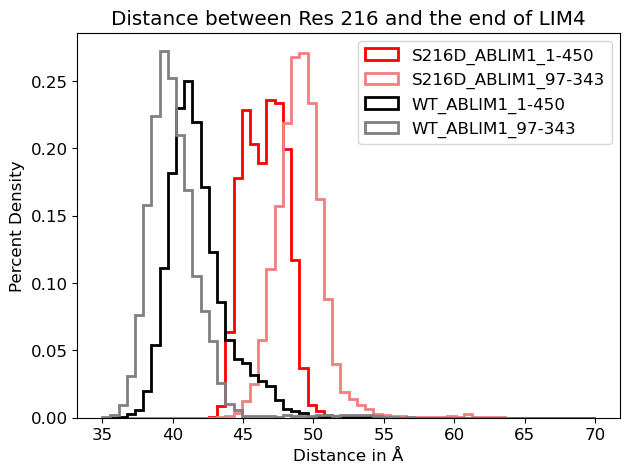

In [21]:
#HISTOGRAM OF DISTANCES BETWEEN ZINC IONS OF WT STRUCTURES

systems=['WT_ABLIM1_97-343','WT_ABLIM1_1-450','S216D_ABLIM1_97-343','S216D_ABLIM1_1-450']
color_num=0

n_bins = 50

fig, ax = plt.subplots()
x_multi=[]
colors = [ 'gray','black', 'lightcoral','red']
#fig=plt.figure(figsize=(14,5))

for system in systems:
    os.chdir(path+'/'+system)
    if system=='WT_ABLIM1_97-343':
        ends='@276 @569'
    elif system=='S216D_ABLIM1_97-343':
        zn1=578
        zn2=579
        ends='@276 @569'
    elif system=='WT_ABLIM1_1-450':
        zn1=140
        zn2=141
        ends='@497 @790'
    else:
        zn1=179
        zn2=180
        ends='@497 @790'

    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    #traj4=pt.iterload(trajectory[3],topology[3])
    #traj5=pt.iterload(trajectory[4],topology[4])
    #traj6=pt.iterload(trajectory[5],topology[5])
    #traj7=pt.iterload(trajectory[6],topology[6])
    ZN_distances1=pt.distance(traj1, mask=ends)
    ZN_distances2=pt.distance(traj2, mask=ends)
    ZN_distances3=pt.distance(traj3, mask=ends)
    #ZN_distances4=pt.distance(traj4, mask=zns)
    #ZN_distances5=pt.distance(traj5, mask=zns)
    #ZN_distances6=pt.distance(traj6, mask=zns)
    #ZN_distances7=pt.distance(traj7, mask=zns)

    #take each replicate distance in a system in a list
    multiple_lists = [ZN_distances1,ZN_distances2,ZN_distances3]#,ZN_distances4,ZN_distances5,ZN_distances6,ZN_distances7]
    #convert list to array
    arrays = [np.array(x) for x in multiple_lists]
    #calculate mean of all replicates' ZN distances to find the system's mean ZN distance
    means=[np.mean(k) for k in zip(*arrays)]

    #print(means)
    x_multi.append(means[50:])

    legend=system+ ' mean'

bin_counts,bin_edges,bars=ax.hist(x_multi, bins=60, histtype='step',range=(35,70),color=colors,label=systems,density=True,linewidth=2.0)
#get andles and labels
handles, labels = plt.gca().get_legend_handles_labels() 
#set order
order = [0,1,2,3]

# pass handle & labels lists along with order as below 
plt.legend([handles[i] for i in order], [labels[i] for i in order],loc='best',prop={'size': 10}) 

title="Distance between Res 216 and the end of LIM4"
plt.title(title)
plt.xlabel("Distance in Å")
plt.ylabel("Percent Density")
ax.figure.set_size_inches(7.0,5.0)
ax.legend()
#for b in bars:
#    ax.bar_label(b, labels=[v.astype(np.int64) if v > 0 else '' for v in b.datavalues])

#name='216_TO_END_Distances_Hist.png'
#os.chdir(path)
#plt.gcf().savefig(name,dpi=300)

'''
#ZN Distance Histogram w/out bars, just outline
for i in range(len(bin_counts)):
    #get bin centers & convert them into scatterplot with lines connecting for each system
    bin_centers = (bin_edges[:-1] + bin_edges[1:])/2.
    plt.scatter(x=bin_centers,y=bin_counts[i],color=colors[i],label=systems[i])
    plt.plot(bin_centers,bin_counts[i],color=colors[i])
'''

name='216_TO_LIM4_Distances_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

pytraj.TrajectoryIterator, 10001 frames: 
Size: 0.234046 (GB)
<Topology: 1047 atoms, 458 residues, 1046 mols, PBC with box type = cubic>
           


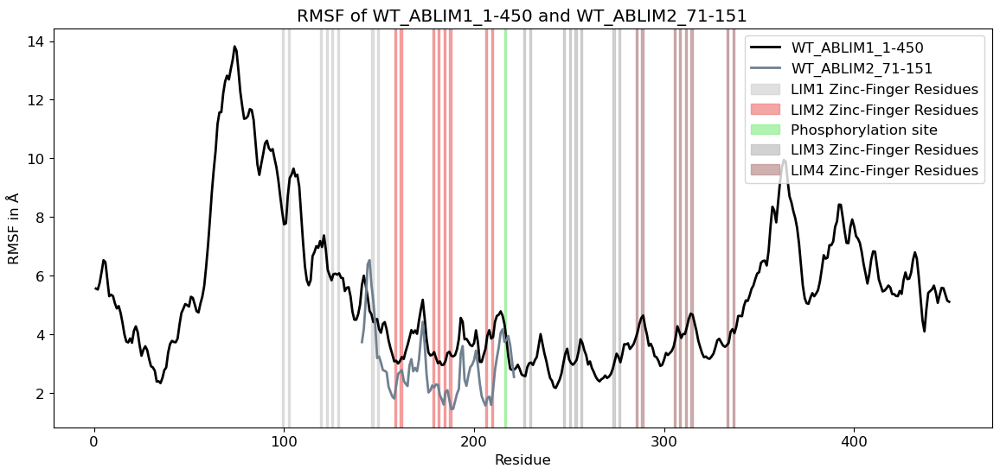

In [5]:
#OVERLAY WT_ABLIM1 & S216D_ABLIM1 RMSF
template= 'abm_ProtIon_rep%s'
trajectory= [template % (str(i)+'.xtc') for i in range (1,8)]
#print(trajectory)
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
topology= [template % (str(i)+'_start.pdb') for i in range (1,8)]



system1='WT_ABLIM1_1-450'
os.chdir(path+'/'+system1)

WT_traj1=pt.iterload(trajectory[0],topology[0])
WT_traj2=pt.iterload(trajectory[1],topology[1])
WT_traj3=pt.iterload(trajectory[2],topology[2])
#WT_traj4=pt.iterload(trajectory[3],topology[3])
#WT_traj5=pt.iterload(trajectory[4],topology[4])
#WT_traj6=pt.iterload(trajectory[5],topology[5])
#WT_traj7=pt.iterload(trajectory[6],topology[6])
print(WT_traj1)

system2='WT_ABLIM2_71-151'
os.chdir(path+'/'+system2)
S76D_traj1=pt.iterload(trajectory[0],topology[0])
S76D_traj2=pt.iterload(trajectory[1],topology[1])
S76D_traj3=pt.iterload(trajectory[2],topology[2])
#S76D_traj4=pt.iterload(trajectory[3],topology[3])
#S76D_traj5=pt.iterload(trajectory[4],topology[4])
#S76D_traj6=pt.iterload(trajectory[5],topology[5])
#S76D_traj7=pt.iterload(trajectory[6],topology[6])
os.chdir(path)

#Calculate RMSF for each replicate of each system
WT_traj1_imposed= pt.superpose(WT_traj1,ref=0)
WTrmsf_data1=pt.rmsf(WT_traj1_imposed,mask='@BB',options='byres')
#print(WTrmsf_data1.T[0])

WT_traj2_imposed= pt.superpose(WT_traj2,ref=0)
WTrmsf_data2=pt.rmsf(WT_traj2_imposed,mask='@BB',options='byres')
#print(WTrmsf_data2.T[0])

WT_traj3_imposed= pt.superpose(WT_traj3,ref=0)
WTrmsf_data3=pt.rmsf(WT_traj3_imposed,mask='@BB',options='byres')

S76D_traj1_imposed= pt.superpose(S76D_traj1,ref=0)
S76Drmsf_data1=pt.rmsf(S76D_traj1_imposed,mask='@BB',options='byres')
#print(S76Drmsf_data1)

S76D_traj2_imposed= pt.superpose(S76D_traj2,ref=0)
S76Drmsf_data2=pt.rmsf(S76D_traj2_imposed,mask='@BB',options='byres')
#print(rmsf_data2)

S76D_traj3_imposed= pt.superpose(S76D_traj3,ref=0)
S76Drmsf_data3=pt.rmsf(S76D_traj3_imposed,mask='@BB',options='byres')
#print(rmsf_data3)



#generate list of RMSFs, convert to arrays, and calculate mean of all arrays
WT_multiple_lists = [WTrmsf_data1.T[1],WTrmsf_data2.T[1],WTrmsf_data3.T[1]]
WT_arrays = [np.array(x) for x in WT_multiple_lists]
WT_means=[np.mean(k) for k in zip(*WT_arrays)]

#print(len(WT_means))
#print(WT_means)


S76D_multiple_lists = [S76Drmsf_data1.T[1],S76Drmsf_data2.T[1],S76Drmsf_data3.T[1]]#,S76Drmsf_data4.T[1],S76Drmsf_data5.T[1],S76Drmsf_data6.T[1],S76Drmsf_data7.T[1]]
S76D_arrays = [np.array(x) for x in S76D_multiple_lists]
S76D_means=[np.mean(k) for k in zip(*S76D_arrays)]
#print(S76D_means)


fig=plt.figure(figsize=(14,6))
ax=plt.gca()
#ax.set_ylim(0.0,10.0)
ax.plot(WTrmsf_data1.T[0],WT_means,linestyle='-',linewidth=2.0,color='black',label=system1)
ax.plot(S76Drmsf_data1.T[0]+140,S76D_means,linestyle='-',linewidth=2.0,color='slategray',label=system2)

#FIX THIS TO BE CORRECT FOR THE ZINC FINGERS OF EACH LIM DOMAIN & THE MUTATION SITE
#Add highlighted regions to figure for ZN finger 1
LIM1_constraints=[99,102,119,122,125,128,146,149]
for constraint in LIM1_constraints:
    res=constraint
    if res==99:
        plt.axvspan(res,res+1, color='lightgray',alpha=0.7,label='LIM1 Zinc-Finger Residues')
    else:
        plt.axvspan(res,res+1, color='lightgray',alpha=0.7)

#Add highlighted regions to figure for ZN finger 2
LIM2_constraints=[158,161,178,181,184,187,206,209,216]
for constraint in LIM2_constraints:
    res=constraint
    if res==158:
        plt.axvspan(res,res+1, color='lightcoral',alpha=0.7,label='LIM2 Zinc-Finger Residues')
    elif res==216:
        #also highlight the phosphorylation site at the tail of ABLIM2 LIM2
        plt.axvspan(res,res+1, color='lightgreen',alpha=0.7,label='Phosphorylation site')
    else:
        plt.axvspan(res,res+1, color='lightcoral',alpha=0.7)

LIM3_constraints=[226,229,247,250,253,256,273,276]
for constraint in LIM3_constraints:
    res=constraint
    if res==226:
        plt.axvspan(res,res+1, color='silver',alpha=0.7,label='LIM3 Zinc-Finger Residues')
    else:
        plt.axvspan(res,res+1, color='silver',alpha=0.7)

LIM4_constraints=[285,288,305,308,311,314,333,336]
for constraint in LIM4_constraints:
    res=constraint
    if res==285:
        plt.axvspan(res,res+1, color='rosybrown',alpha=0.7,label='LIM4 Zinc-Finger Residues')
    else:
        plt.axvspan(res,res+1, color='rosybrown',alpha=0.7)

title="RMSF of " + system1 + ' and ' + system2
leg=ax.legend()
plt.title(title)
plt.xlabel("Residue")
plt.ylabel("RMSF in Å")

os.chdir(path)
name=system1 + '_' + system2 +'_RMSF.png'
plt.gcf().savefig(name,dpi=300)
plt.show()

/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses/LIM2_WT_ABLIM1_ATOMISTIC
LIM2_WT_ABLIM1_ATOMISTIC attempt
[    0     1     2 ... 18203 18204 18205]
[22.225501762068077, 22.35475359285448, 22.956148244307013, 23.09491590876597, 22.493887779734326, 22.086173846894457, 22.82086814541825, 22.67694594800187, 22.345533488191748, 22.45410701781171, 22.32085513525125, 22.317588918744036, 22.390721943983152, 22.664401299833298, 22.308488819898173, 22.10027199080402, 22.720472879067355, 22.7307641947733, 22.890588031817543, 22.55712483437047, 22.354625028721003, 22.366804724465435, 22.838426054806018, 22.88621214383163, 22.80999479995791, 23.31576059271177, 23.76060141797538, 23.75100077413542, 24.32358046631722, 24.382598394623727, 24.69442852028715, 25.235727108613712, 24.900307402309494, 24.771054027328194, 25.01153349245628, 24.96986496898319, 25.358372969144416, 25.452976560640668, 25.252139215598163, 24.997714722155326, 24.87282924517344, 25.118359208980376, 25.30645591396673, 25.5689

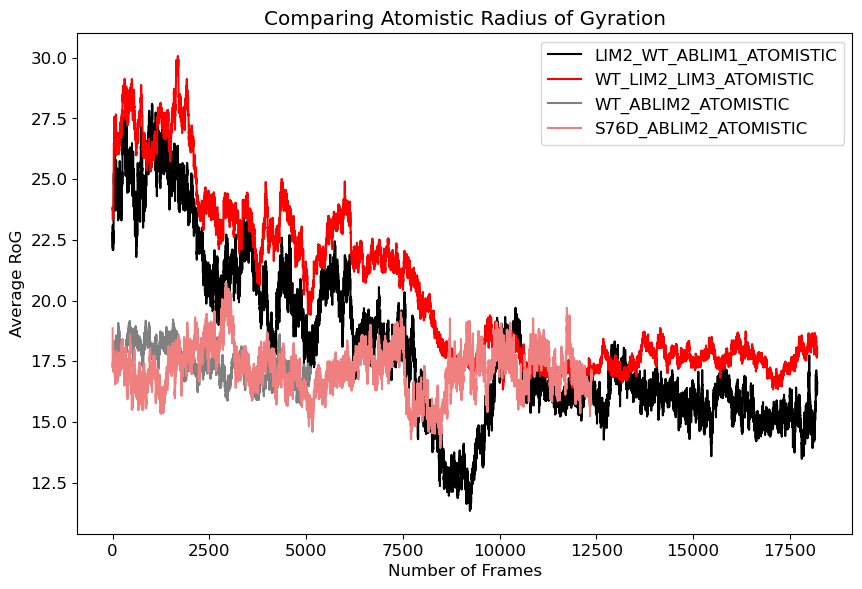

In [67]:
#ROG OF ATOMISTIC DATA
#HISTOGRAM OF MEAN ROG OF aTOMISTIC & CG WT ABLIM1 SYSTEMS
template= 'abm_ProtIon_rep%s'
trajectory= [template % (str(i)+'.xtc') for i in range (1,8)]
#print(trajectory)

topology= [template % (str(i)+'_start.pdb') for i in range (1,8)]


systems=['LIM2_WT_ABLIM1_ATOMISTIC','WT_LIM2_LIM3_ATOMISTIC','WT_ABLIM2_ATOMISTIC','S76D_ABLIM2_ATOMISTIC']

#os.chdir(path+'/WT_LIM2_LIM3_ATOMISTIC')
#traj1=pt.iterload(trajectory[0],topology[0],':156-220')
#traj2=pt.iterload(trajectory[1],topology[1],':156-220')
#traj3=pt.iterload(trajectory[2],topology[2],':156-220')



color_num=0
colors=['black','red','gray','lightcoral']
color_num=0
fig,ax = plt.subplots()
for system in systems:
    #x_multi=[]
    os.chdir(path+'/'+system)
    print(path+'/'+system)
    sys_mean=system + ' mean'
    #traj1=pt.iterload(trajectory[0],topology[0])
    #traj2=pt.iterload(trajectory[1],topology[1])
    #traj3=pt.iterload(trajectory[2],topology[2])
    #traj4=pt.iterload(trajectory[3],topology[3])
    #traj5=pt.iterload(trajectory[4],topology[4])
    #traj6=pt.iterload(trajectory[5],topology[5])
    #traj7=pt.iterload(trajectory[6],topology[6])

    
    #pytraj radius of gyration calculated for the backbone atoms
    if system=='WT_LIM2_LIM3_ATOMISTIC':
        print(system+' attempt')
        traj1=pt.iterload(trajectory[0],topology[0])
        traj2=pt.iterload(trajectory[1],topology[1])
        traj3=pt.iterload(trajectory[2],topology[2])
        data1=pt.radgyr(traj1, mask='@CA')
        data2=pt.radgyr(traj2, mask='@CA')
        data3=pt.radgyr(traj3, mask='@CA')
    
    elif system=='LIM2_WT_ABLIM1_ATOMISTIC':
        print(system+' attempt')
        traj1=pt.iterload(trajectory[0],topology[0])#,':156-220')
        traj2=pt.iterload(trajectory[1],topology[1])#,':156-220')
        traj3=pt.iterload(trajectory[2],topology[2])#,':156-220')
        data1=pt.radgyr(traj1, mask='@1-@925 @CA')
        data2=pt.radgyr(traj2, mask='@1-@925 @CA')
        data3=pt.radgyr(traj3, mask='@1-@925 @CA')
    else:
        print(system+' attempt')
        traj1=pt.iterload(trajectory[0],topology[0])
        traj2=pt.iterload(trajectory[1],topology[1])
        traj3=pt.iterload(trajectory[2],topology[2])
        data1=pt.radgyr(traj1, mask='@CA')
        data2=pt.radgyr(traj2, mask='@CA')
        data3=pt.radgyr(traj3, mask='@CA')
    #data7=pt.radgyr(traj7, mask='@BB')

    multiple_lists = [data1,data2,data3]#,data4,data5,data6,data7]
    arrays = [np.array(x) for x in multiple_lists]
    means=[np.mean(k) for k in zip(*arrays)]
    #print(means)
    #print(len(means))
    x_multi=means[10:]
    x_len=np.arange(0,len(x_multi))
    #print(x_len)
    #print(x_multi)
    legend=system
    ax.plot(x_len,x_multi,linestyle='-',color=colors[color_num],label=legend,zorder=4)
    color_num+=1

#calculate the bars & edges of the histogram

#fig,ax = plt.subplots()

#ax.plot(x_len,x_multi,linestyle='-',color=colors[color_num],label=legend,zorder=4)


title="Comparing Atomistic Radius of Gyration"
plt.title(title)

plt.xlabel("Number of Frames")
plt.ylabel("Average RoG")
ax.figure.set_size_inches(10,6.5)
ax.legend()

name='atomistic_ROG_frames.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()



In [ ]:
#CG WT_ABLIM2 vs atomistic WT_ABLIM2 distances

system1='WT_ABLIM2'


os.chdir(path/system1)

zn1=179
zn2=180
zns=':201 :401'

traj1=pt.iterload(trajectory[0],topology[0])
traj2=pt.iterload(trajectory[1],topology[1])
traj3=pt.iterload(trajectory[2],topology[2])

ZN_distances1=pt.distance(traj1, mask=zns)
ZN_distances2=pt.distance(traj2, mask=zns)
ZN_distances3=pt.distance(traj3, mask=zns)

#print(ZN_distances1)


multiple_lists = [ZN_distances1,ZN_distances2,ZN_distances3]
arrays = [np.array(x) for x in multiple_lists]
means=[np.mean(k) for k in zip(*arrays)]
sd=[np.std(k) for k in zip(*arrays)]

print(len(means))

count,edges,bars=plt.hist(means,bins=20,range=(11.5,17.5))
#plt.bar_label(bars)
plt.axvline(x=17.2, linewidth=2, label= 'Fixed Atomistic Distance',color='red')

# Add label
plt.legend(loc = 'upper right')


#atomistic_mean=[17.2]
#atomistic_sd=[0.0]


plt.title('Distance Between WT_ABLIM2 Zinc Ions Over 2μs')
plt.xlabel('Distance in Å')
plt.ylabel('Number of Frames')
plt.ylim(0,2900)

os.chdir(path)
#name='WT_ABLIM2_ZN_Hist.png'
plt.gcf().savefig(name,dpi=300)
plt.show()

pytraj.TrajectoryIterator, 5126 frames: 
Size: 0.133594 (GB)
<Topology: 1166 atoms, 83 residues, 3 mols, PBC with box type = cubic>
           


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<class 'numpy.ndarray'>
[18.27764061 18.56628701 18.63543341 ... 17.75946995 18.34872096
 18.34356794]
[array([18.27764061, 18.56628701, 18.63543341, ..., 17.75946995,
       18.34872096, 18.34356794]), array([18.61656066, 18.90504675, 18.6243793 , ..., 18.07950285,
       18.78989336, 18.28897174]), array([18.35310699, 18.66402332, 19.53955333, ..., 19.35165729,
       19.75101631, 19.42684336])]
pytraj.TrajectoryIterator, 12382 frames: 
Size: 0.322978 (GB)
<Topology: 1167 atoms, 83 residues, 3 mols, PBC with box type = cubic>
           


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<class 'numpy.ndarray'>
[18.15623611 20.17434693 19.20166152 ... 18.67004424 18.51934503
 19.60897326]
[array([18.15623611, 20.17434693, 19.20166152, ..., 18.67004424,
       18.51934503, 19.60897326]), array([18.48144665, 18.73844003, 18.40420046, ..., 21.46039744,
       21.42362233, 20.92447144]), array([18.39047272, 17.63009763, 18.283     , ..., 17.60021217,
       17.11924515, 17.47311327])]


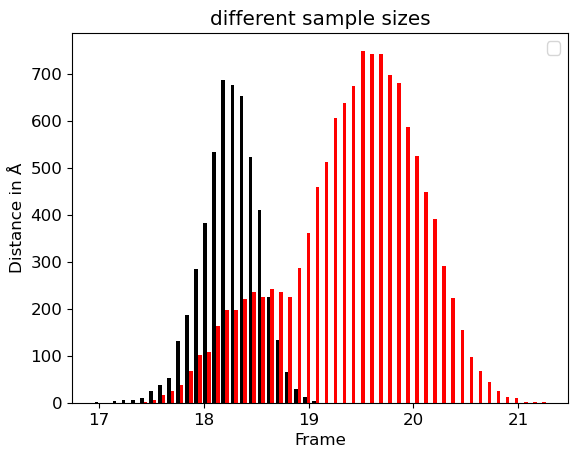

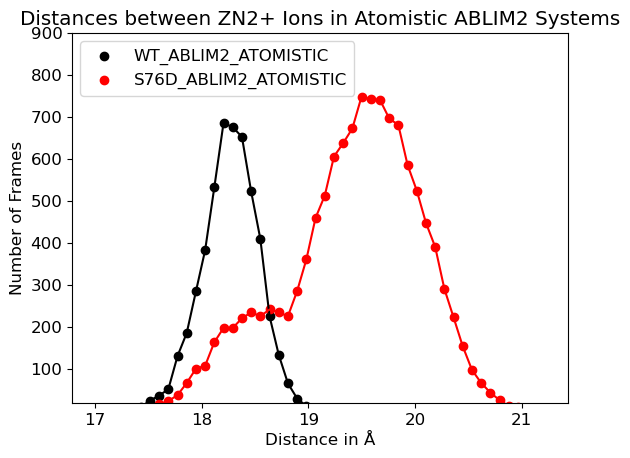

In [93]:
#DISTANCES BETWEEN LIM2 ZNs
template= 'abm_ProtIon_rep%s'
trajectory= [template % (str(i)+'.xtc') for i in range (1,8)]
#print(trajectory)

topology= [template % (str(i)+'_start.pdb') for i in range (1,8)]

fig,ax = plt.subplots()
title="Mean Distance between ZN2+ Ions in Atomistic ABLIM2 Systems"
plt.title(title)
plt.xlabel("Frame")
plt.ylabel("Distance in Å")
n_bins=50
#WT_ABLIM1 is res 250 & 251
#S216D_ABLIM1 is res 252 & 253
#LIM2_WT_ABLIM1 is res 64 & 65
#WT_ABLIM2 is 82 & 83
#S76D_ABLIM2 is 82 & 83

systems=['WT_ABLIM2_ATOMISTIC','S76D_ABLIM2_ATOMISTIC']
color_num=0
colors=['black','red']
x_multi=[]

for system in systems:
    os.chdir(path+'/'+system)



    traj1=pt.iterload(trajectory[0],topology[0])
    print(traj1)
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])

    #data1=pt.distance(traj1,':1 :81')
    #print(data1)

    ZN_distances1=pt.distance(traj1,':82 :83')
    ZN_distances2=pt.distance(traj2,':82 :83')
    ZN_distances3=pt.distance(traj3,':82 :83')
    print(type(ZN_distances1))
    print(ZN_distances1)

    #take each replicate distance in a system in a list
    multiple_lists = [ZN_distances1,ZN_distances2,ZN_distances3]
    print(multiple_lists)
    #convert list to array
    arrays = [np.array(x) for x in multiple_lists]
    #calculate mean of all replicates' ZN distances to find the system's mean ZN distance
    means=[np.mean(k) for k in zip(*arrays)]

    #print(means)


    x1=np.arange(0,len(ZN_distances1))
    x2=np.arange(0,len(ZN_distances2))
    x3=np.arange(0,len(ZN_distances3))
    x4=np.arange(0,len(means))
    y1=np.array(ZN_distances1)
    y2=np.array(ZN_distances2)
    y3=np.array(ZN_distances3)
    y4=np.array(means)
    #ax=plt.gca()
    #ax.set_ylim(10.0,31.0)
    #ax.plot(x1,y1,linestyle='-',color='red',label='triplicate 1',zorder=1)
    #ax.plot(x2,y2,linestyle='-',color='blue',label='triplicate 2',zorder=2)
    #ax.plot(x3,y3,linestyle='-',color='green',label='triplicate 3',zorder=3)
    legend=system+' mean'
    #ax.plot(x4,y4,linestyle='-',color=colors[color_num],label=legend,zorder=4)
    #color_num+=1
    leg = ax.legend()


    x_multi.append(means[50:])

    legend=system+ ' mean'

#Find edges of histogram for each system

counts,edges,bars=ax.hist(x_multi, n_bins, histtype='bar',color=colors,label=systems)
color_num+=1
ax.set_title('different sample sizes')
       
fig,ax = plt.subplots()        
for i in range(len(counts)):
    bin_centres = (edges[:-1] + edges[1:])/2.
    plt.scatter(x=bin_centres,y=counts[i],color=colors[i],label=systems[i])
    plt.plot(bin_centres,counts[i],color=colors[i])

title="Distances between ZN2+ Ions in Atomistic ABLIM2 Systems"
plt.title(title)
plt.xlabel("Distance in Å")
plt.ylabel("Number of Frames")
#ax.figure.set_size_inches(8.0,6.0)
plt.legend(loc='upper left')
#for b in bars:
#    ax.bar_label(b, labels=[v.astype(np.int64) if v > 0 else '' for v in b.datavalues])
plt.ylim(20,900)
#plt.xlim(14,26)

name='ATOMISTIC_ABLIM2_ZN_Distances_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

In [ ]:
#Distance over time of data above

/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses
pytraj.TrajectoryIterator, 5126 frames: 
Size: 0.133594 (GB)
<Topology: 1166 atoms, 83 residues, 3 mols, PBC with box type = cubic>
           


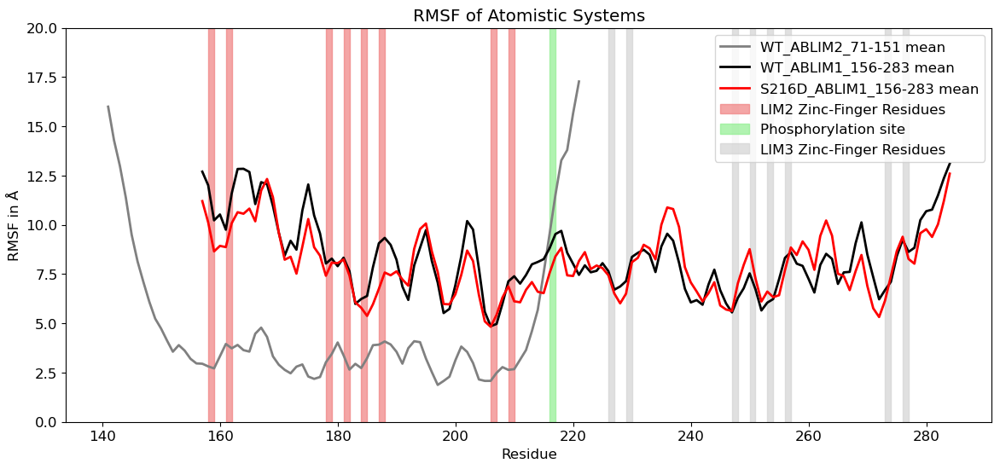

In [23]:
#OVERLAY WT_ABLIM1 & S216D_ABLIM1 RMSF
template= 'abm_ProtIon_rep%s'
trajectory= [template % (str(i)+'.xtc') for i in range (1,8)]
#print(trajectory)

path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
topology= [template % (str(i)+'_start.pdb') for i in range (1,8)]

print(path)

system1='WT_ABLIM2_71-151_ATOMISTIC'
os.chdir(path+'/'+system1)

WT_traj1=pt.iterload(trajectory[0],topology[0])
WT_traj2=pt.iterload(trajectory[1],topology[1])
WT_traj3=pt.iterload(trajectory[2],topology[2])
#WT_traj4=pt.iterload(trajectory[3],topology[3])
#WT_traj5=pt.iterload(trajectory[4],topology[4])
#WT_traj6=pt.iterload(trajectory[5],topology[5])
#WT_traj7=pt.iterload(trajectory[6],topology[6])
print(WT_traj1)

system2='WT_ABLIM1_156-283_ATOMISTIC'
os.chdir(path+'/'+system2)
S76D_traj1=pt.iterload(trajectory[0],topology[0])
S76D_traj2=pt.iterload(trajectory[1],topology[1])
S76D_traj3=pt.iterload(trajectory[2],topology[2])
#S76D_traj4=pt.iterload(trajectory[3],topology[3])
#S76D_traj5=pt.iterload(trajectory[4],topology[4])
#S76D_traj6=pt.iterload(trajectory[5],topology[5])
#S76D_traj7=pt.iterload(trajectory[6],topology[6])
os.chdir(path)


system3='S216D_ABLIM1_156-283_ATOMISTIC'
os.chdir(path+'/'+system3)
S216D_traj1=pt.iterload(trajectory[0],topology[0])
S216D_traj2=pt.iterload(trajectory[1],topology[1])
S216D_traj3=pt.iterload(trajectory[2],topology[2])

#Calculate RMSF for each replicate of each system
WT_traj1_imposed= pt.superpose(WT_traj1,ref=0)
WTrmsf_data1=pt.rmsf(WT_traj1_imposed,mask='@CA',options='byres')
#print(WTrmsf_data1.T[0])

WT_traj2_imposed= pt.superpose(WT_traj2,ref=0)
WTrmsf_data2=pt.rmsf(WT_traj2_imposed,mask='@CA',options='byres')
#print(WTrmsf_data2.T[0])

WT_traj3_imposed= pt.superpose(WT_traj3,ref=0)
WTrmsf_data3=pt.rmsf(WT_traj3_imposed,mask='@CA',options='byres')

S76D_traj1_imposed= pt.superpose(S76D_traj1,ref=0)
S76Drmsf_data1=pt.rmsf(S76D_traj1_imposed,mask='@CA',options='byres')
#print(S76Drmsf_data1)

S76D_traj2_imposed= pt.superpose(S76D_traj2,ref=0)
S76Drmsf_data2=pt.rmsf(S76D_traj2_imposed,mask='@CA',options='byres')
#print(rmsf_data2)

S76D_traj3_imposed= pt.superpose(S76D_traj3,ref=0)
S76Drmsf_data3=pt.rmsf(S76D_traj3_imposed,mask='@CA',options='byres')
#print(rmsf_data3)

S216D_traj1_imposed= pt.superpose(S216D_traj1,ref=0)
S216Drmsf_data1=pt.rmsf(S216D_traj1_imposed,mask='@CA',options='byres')
#print(S76Drmsf_data1)

S216D_traj2_imposed= pt.superpose(S216D_traj2,ref=0)
S216Drmsf_data2=pt.rmsf(S216D_traj2_imposed,mask='@CA',options='byres')
#print(rmsf_data2)

S216D_traj3_imposed= pt.superpose(S216D_traj3,ref=0)
S216Drmsf_data3=pt.rmsf(S216D_traj3_imposed,mask='@CA',options='byres')
#print(rmsf_data3)


#generate list of RMSFs, convert to arrays, and calculate mean of all arrays
WT_multiple_lists = [WTrmsf_data1.T[1],WTrmsf_data2.T[1],WTrmsf_data3.T[1]]
WT_arrays = [np.array(x) for x in WT_multiple_lists]
WT_means=[np.mean(k) for k in zip(*WT_arrays)]

#print(len(WT_means))
#print(WT_means)


S76D_multiple_lists = [S76Drmsf_data1.T[1],S76Drmsf_data2.T[1],S76Drmsf_data3.T[1]]#,S76Drmsf_data4.T[1],S76Drmsf_data5.T[1],S76Drmsf_data6.T[1],S76Drmsf_data7.T[1]]
S76D_arrays = [np.array(x) for x in S76D_multiple_lists]
S76D_means=[np.mean(k) for k in zip(*S76D_arrays)]
#print(S76D_means)

S216D_multiple_lists = [S216Drmsf_data1.T[1],S216Drmsf_data2.T[1],S216Drmsf_data3.T[1]]#,S76Drmsf_data4.T[1],S76Drmsf_data5.T[1],S76Drmsf_data6.T[1],S76Drmsf_data7.T[1]]
S216D_arrays = [np.array(x) for x in S216D_multiple_lists]
S216D_means=[np.mean(k) for k in zip(*S216D_arrays)]

plt.rcParams["legend.loc"] = 'upper right'
fig=plt.figure(figsize=(14,6))
ax=plt.gca()
ax.set_ylim(0.0,20.0)
ax.plot(WTrmsf_data1.T[0]+140,WT_means,linestyle='-',linewidth=2.0,color='gray',label='WT_ABLIM2_71-151 mean')
ax.plot(S76Drmsf_data1.T[0]+156,S76D_means,linestyle='-',linewidth=2.0,color='black',label='WT_ABLIM1_156-283 mean')
ax.plot(S216Drmsf_data1.T[0]+156,S216D_means,linestyle='-',linewidth=2.0,color='red',label='S216D_ABLIM1_156-283 mean')

#FIX THIS TO BE CORRECT FOR THE ZINC FINGERS OF EACH LIM DOMAIN & THE MUTATION SITE


#Add highlighted regions to figure for ZN finger 2
LIM2_constraints=[158,161,178,181,184,187,206,209,216]
for constraint in LIM2_constraints:
    res=constraint
    if res==158:
        plt.axvspan(res,res+1, color='lightcoral',alpha=0.7,label='LIM2 Zinc-Finger Residues')
    elif res==216:
        #also highlight the phosphorylation site at the tail of ABLIM2 LIM2
        plt.axvspan(res,res+1, color='lightgreen',alpha=0.7,label='Phosphorylation site')
    else:
        plt.axvspan(res,res+1, color='lightcoral',alpha=0.7)

LIM3_constraints=[226,229,247,250,253,256,273,276]
for constraint in LIM3_constraints:
    res=constraint
    if res==226:
        plt.axvspan(res,res+1, color='lightgray',alpha=0.7,label='LIM3 Zinc-Finger Residues')
    else:
        plt.axvspan(res,res+1, color='lightgray',alpha=0.7)


title="RMSF of Atomistic Systems"
leg=ax.legend()
plt.title(title)
plt.xlabel("Residue")
plt.ylabel("RMSF in Å")

os.chdir(path)
name=system1 + '_' + system2 + '_' + system3 + '_RMSF.png'
plt.gcf().savefig(name,dpi=300)
plt.show()

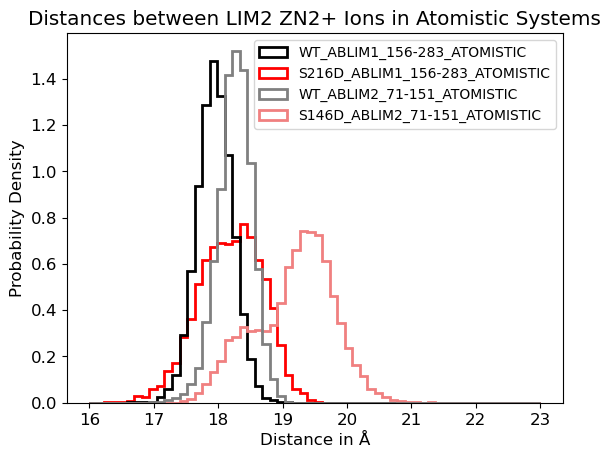

In [24]:
#DISTANCES BETWEEN LIM2 ZNs in Atomistic
template= 'abm_ProtIon_rep%s'
trajectory= [template % (str(i)+'.xtc') for i in range (1,8)]
#print(trajectory)

topology= [template % (str(i)+'_start.pdb') for i in range (1,8)]

fig,ax = plt.subplots()
title="Mean Distance between ZN2+ Ions in Atomistic Systems"
plt.title(title)
plt.xlabel("Distance in Å")
plt.ylabel("Probability Density")
n_bins=50
#WT_ABLIM1 is res 250 & 251
#S216D_ABLIM1 is res 252 & 253
#LIM2_WT_ABLIM1 is res 64 & 65
#WT_ABLIM2 is 82 & 83
#S76D_ABLIM2 is 82 & 83

systems=['WT_ABLIM2_71-151_ATOMISTIC','S146D_ABLIM2_71-151_ATOMISTIC','WT_ABLIM1_156-283_ATOMISTIC','S216D_ABLIM1_156-283_ATOMISTIC']
color_num=0
colors=['gray','lightcoral','black','red']
x_multi=[]

for system in systems:
    os.chdir(path+'/'+system)



    traj1=pt.iterload(trajectory[0],topology[0])
    #print(traj1)
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])

    #data1=pt.distance(traj1,':1 :81')
    #print(data1)
    if system=='WT_ABLIM2_71-151_ATOMISTIC':
        ZN_distances1=pt.distance(traj1,':82 :83')
        ZN_distances2=pt.distance(traj2,':82 :83')
        ZN_distances3=pt.distance(traj3,':82 :83')
    elif system=='S146D_ABLIM2_71-151_ATOMISTIC':
        ZN_distances1=pt.distance(traj1,':82 :83')
        ZN_distances2=pt.distance(traj2,':82 :83')
        ZN_distances3=pt.distance(traj3,':82 :83')
    elif system=='WT_ABLIM1_156-283_ATOMISTIC':
        ZN_distances1=pt.distance(traj1,':129 :130')
        ZN_distances2=pt.distance(traj2,':129 :130')
        ZN_distances3=pt.distance(traj3,':129 :130')
    else:
        ZN_distances1=pt.distance(traj1,':129 :130')
        ZN_distances2=pt.distance(traj2,':129 :130')
        ZN_distances3=pt.distance(traj3,':129 :130')
    #print(type(ZN_distances1))
    #print(ZN_distances1)
    #print(system)
    #take each replicate distance in a system in a list
    multiple_lists = [ZN_distances1,ZN_distances2,ZN_distances3]
    #print(multiple_lists)
    #convert list to array
    arrays = [np.array(x) for x in multiple_lists]
    #calculate mean of all replicates' ZN distances to find the system's mean ZN distance
    means=[np.mean(k) for k in zip(*arrays)]

    #print(means)


    x1=np.arange(0,len(ZN_distances1))
    x2=np.arange(0,len(ZN_distances2))
    x3=np.arange(0,len(ZN_distances3))
    x4=np.arange(0,len(means))
    y1=np.array(ZN_distances1)
    y2=np.array(ZN_distances2)
    y3=np.array(ZN_distances3)
    y4=np.array(means)
    #ax=plt.gca()
    #ax.set_ylim(10.0,31.0)
    #ax.plot(x1,y1,linestyle='-',color='red',label='triplicate 1',zorder=1)
    #ax.plot(x2,y2,linestyle='-',color='blue',label='triplicate 2',zorder=2)
    #ax.plot(x3,y3,linestyle='-',color='green',label='triplicate 3',zorder=3)
    legend=system+' mean'
    #ax.plot(x4,y4,linestyle='-',color=colors[color_num],label=legend,zorder=4)
    #color_num+=1
    #leg = ax.legend()


    x_multi.append(means[10:8000])

    #legend=system+ ' mean'

#Find edges of histogram for each system

#n_bins=60

bin_counts,bin_edges,bars=ax.hist(x_multi, bins=60, histtype='step',range=(16,23),color=colors,label=systems,density=True,linewidth=2.0)
#get andles and labels
handles, labels = plt.gca().get_legend_handles_labels() 
#set order
order = [1,0,3,2]

# pass handle & labels lists along with order as below 
plt.legend([handles[i] for i in order], [labels[i] for i in order],loc='best',prop={'size': 10}) 

'''       
fig,ax = plt.subplots()        
for i in range(len(counts)):
    bin_centres = (edges[:-1] + edges[1:])/2.
    plt.scatter(x=bin_centres,y=counts[i],color=colors[i],label=systems[i])
    plt.plot(bin_centres,counts[i],color=colors[i])
'''
title="Distances between LIM2 ZN2+ Ions in Atomistic Systems"
plt.title(title)
#plt.xlabel("Distance in Å")
#plt.ylabel("Number of Frames")
#ax.figure.set_size_inches(8.0,6.0)
#plt.legend()
#for b in bars:
#    ax.bar_label(b, labels=[v.astype(np.int64) if v > 0 else '' for v in b.datavalues])
#plt.ylim(20,1900)
#plt.xlim(14,26)

name='ATOMISTIC_ZN_Distances_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses


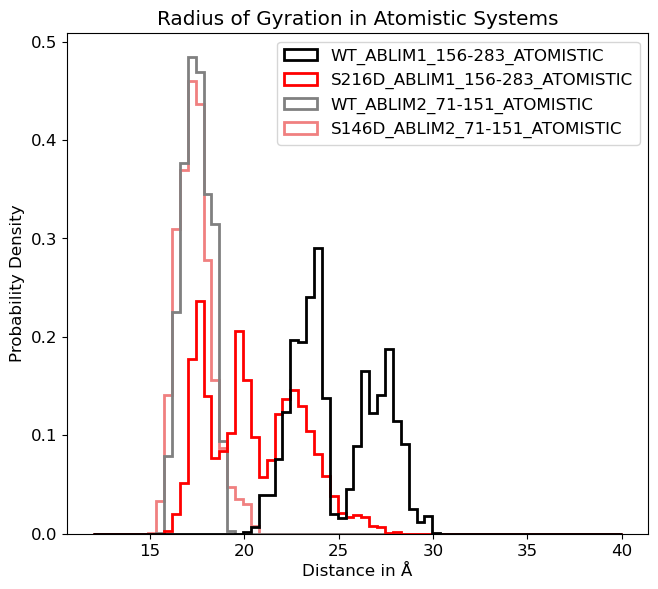

In [25]:
#HISTOGRAM OF MEAN ROG OF aTOMISTIC SYSTEMS
template= 'abm_ProtIon_rep%s'
trajectory= [template % (str(i)+'.xtc') for i in range (1,8)]
#print(trajectory)

topology= [template % (str(i)+'_start.pdb') for i in range (1,8)]

x_multi=[]
systems=['WT_ABLIM1_156-283_ATOMISTIC','S216D_ABLIM1_156-283_ATOMISTIC','WT_ABLIM2_71-151_ATOMISTIC','S146D_ABLIM2_71-151_ATOMISTIC']
#n_bins=100
color_num=0
colors=['black','red','gray','lightcoral']
fig,ax = plt.subplots()
print(path)
for system in systems:
    os.chdir(path+'/'+system)
    sys_mean=system + ' mean'
    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    #traj4=pt.iterload(trajectory[3],topology[3])
    #traj5=pt.iterload(trajectory[4],topology[4])
    #traj6=pt.iterload(trajectory[5],topology[5])
    #traj7=pt.iterload(trajectory[6],topology[6])

    #pytraj radius of gyration calculated for the backbone atoms
    data1=pt.radgyr(traj1, mask='@CA')
    data2=pt.radgyr(traj2, mask='@CA')
    data3=pt.radgyr(traj3, mask='@CA')
    #data4=pt.radgyr(traj4, mask='@BB')
    #data5=pt.radgyr(traj5, mask='@BB')
    #data6=pt.radgyr(traj6, mask='@BB')
    #data7=pt.radgyr(traj7, mask='@BB')

    multiple_lists = [data1,data2,data3]#,data4,data5,data6,data7]
    arrays = [np.array(x) for x in multiple_lists]
    means=[np.mean(k) for k in zip(*arrays)]
    #print(means)
    #print(len(means))
    x_multi.append(means[10:5000])

    #legend=system+ ' mean'

#n_bins=40

bin_counts,bin_edges,bars=ax.hist(x_multi, bins='auto', histtype='step',range=(12,40),color=colors,label=systems,density=True,linewidth=2.0)
#get andles and labels
handles, labels = plt.gca().get_legend_handles_labels() 
#set order
order = [3,2,1,0] 

# pass handle & labels lists along with order as below 
plt.legend([handles[i] for i in order], [labels[i] for i in order],loc='upper right') 
    

'''fig,ax = plt.subplots()
for i in range(len(bin_counts)):
    #generate the outline/shape of the histogram for each system, NOT including the bars themselves
    bin_centres = (bin_edges[:-1] + bin_edges[1:])/2.
    plt.scatter(x=bin_centres,y=bin_counts[i],color=colors[i],label=systems[i])
    plt.plot(bin_centres,bin_counts[i],color=colors[i])
'''

'''for i in range(len(x_multi)):
    histo, bin_edges = np.histogram(x_multi[i],nbins)
    bin_center = 0.5*(bin_edges[1:] + bin_edges[:-1])
    ax.plot(bin_center,histo,color=colors[i])
    ax.scatter(x=bin_center,y=histo,color=colors[i],label=systems[i])
#plt.show()
'''
title="Radius of Gyration in Atomistic Systems"
plt.title(title)
#plt.xlim(12,24)
#plt.ylim(20,1000)
plt.xlabel("Distance in Å")
plt.ylabel("Probability Density")
ax.figure.set_size_inches(7.5,6.5)
#ax.legend()
#for b in bars:
#    ax.bar_label(b, labels=[v.astype(np.int64) if v > 0 else '' for v in b.datavalues])

name='ATOMISTIC_ROG_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()


1
2
3
4
5
6
7


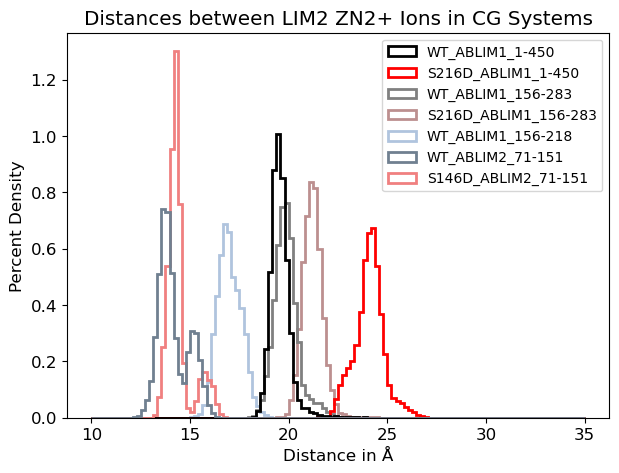

In [6]:
#HISTOGRAM OF DISTANCES BETWEEN STRUCTURES

systems=['WT_ABLIM2_71-151','S146D_ABLIM2_71-151','WT_ABLIM1_1-450','S216D_ABLIM1_1-450','WT_ABLIM1_156-283','S216D_ABLIM1_156-283','WT_ABLIM1_156-218']
color_num=0

n_bins = 50

fig, ax = plt.subplots()
x_multi=[]
colors = ['slategray','lightcoral','black','red','gray','rosybrown','lightsteelblue']
#fig=plt.figure(figsize=(14,5))

for system in systems:
    os.chdir(path+'/'+system)
    if system=='WT_ABLIM1_1-450':
        zn1=573
        zn2=574
        zns=':453 :454'
    elif system=='S216D_ABLIM1_1-450':
        zn1=578
        zn2=579
        zns=':452 :453'
    elif system=='WT_ABLIM1_156-283':
        zns=':128 :129'
    elif system=='S216D_ABLIM1_156-283':
        zns=':252 :253'
    elif system=='WT_ABLIM1_156-218':
        zns=':64 :65'
    else:
        zn1=179
        zn2=180
        zns=':82 :83'

    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    
    ZN_distances1=pt.distance(traj1, mask=zns)
    ZN_distances2=pt.distance(traj2, mask=zns)
    ZN_distances3=pt.distance(traj3, mask=zns)


    #take each replicate distance in a system in a list
    multiple_lists = [ZN_distances1,ZN_distances2,ZN_distances3]#,ZN_distances4,ZN_distances5,ZN_distances6,ZN_distances7]
    #convert list to array
    arrays = [np.array(x) for x in multiple_lists]
    #calculate mean of all replicates' ZN distances to find the system's mean ZN distance
    means=[np.mean(k) for k in zip(*arrays)]

    #print(means)
    x_multi.append(means[50:])
    print(len(x_multi))
    legend=system+ ' mean'

#Find edges of histogram for each system

bin_counts,bin_edges,bars=ax.hist(x_multi, bins=120, histtype='step',range=(10,35),color=colors,label=systems,density=True,linewidth=2.0)
#get andles and labels
handles, labels = plt.gca().get_legend_handles_labels() 
#set order
order = [0,1,2,3,4,5,6]
order = [4,3,2,1,0,6,5]
# pass handle & labels lists along with order as below 
plt.legend([handles[i] for i in order], [labels[i] for i in order],loc='best',prop={'size': 10}) 

'''
fig,ax = plt.subplots()
for i in range(len(bin_counts)):
    #generate the outline/shape of the histogram for each system, NOT including the bars themselves
    bin_centres = (bin_edges[:-1] + bin_edges[1:])/2.
    plt.scatter(x=bin_centres,y=bin_counts[i],color=colors[i],label=systems[i])
    plt.plot(bin_centres,bin_counts[i],color=colors[i])
'''

title="Distances between LIM2 ZN2+ Ions in CG Systems"
plt.title(title)
plt.xlabel("Distance in Å")
plt.ylabel("Percent Density")
ax.figure.set_size_inches(7.0,5.0)
#ax.legend()
#plt.xlim(12,36)
#plt.ylim(20,4000)
#for b in bars:
#    ax.bar_label(b, labels=[v.astype(np.int64) if v > 0 else '' for v in b.datavalues])

name='ABLIM_CG_ZN_Distances_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

8


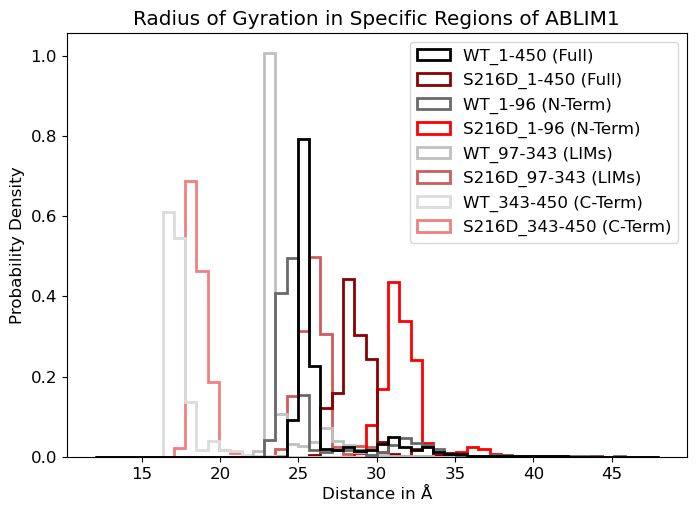

In [36]:
#RADIUS OF GYRATION FOR TRUNCATED SYSTEMS
#HISTOGRAM OF MEAN ROG OF aTOMISTIC ABLIM2 SYSTEMS
template= 'abm_ProtIon_rep%s'
trajectory= [template % (str(i)+'.xtc') for i in range (1,8)]
#print(trajectory)

topology= [template % (str(i)+'_start.pdb') for i in range (1,8)]

x_multi=[]
systems=['WT_ABLIM1_1-450','S216D_ABLIM1_1-450']

labels=['WT_1-450 (Full)','WT_1-96 (N-Term)','WT_97-343 (LIMs)','WT_343-450 (C-Term)','S216D_1-450 (Full)','S216D_1-96 (N-Term)','S216D_97-343 (LIMs)','S216D_343-450 (C-Term)']
n_bins=100
color_num=0
colors=['black','dimgrey','silver','gainsboro','darkred','red','indianred','lightcoral']
fig,ax = plt.subplots()
for system in systems:
    os.chdir(path+'/'+system)
    sys_mean=system + ' mean'
    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])

    


    #pytraj radius of gyration calculated for the backbone atoms
    data1=pt.radgyr(traj1, mask=':1-449@BB')
    data2=pt.radgyr(traj2, mask=':1-449@BB')
    data3=pt.radgyr(traj3, mask=':1-449@BB')

    ntermd1=pt.radgyr(traj1, mask=':1-96@BB')
    ntermd2=pt.radgyr(traj2, mask=':1-96@BB')
    ntermd3=pt.radgyr(traj3, mask=':1-96@BB')

    lims1=pt.radgyr(traj1, mask=':97-343@BB')
    lims2=pt.radgyr(traj2, mask=':97-343@BB')
    lims3=pt.radgyr(traj3, mask=':97-343@BB')

    if system=='WT_ABLIM1_1-450':
        ctermd1=pt.radgyr(traj1, mask=':344-450@BB')
        ctermd2=pt.radgyr(traj2, mask=':344-450@BB')
        ctermd3=pt.radgyr(traj3, mask=':344-450@BB')

    else:
        ctermd1=pt.radgyr(traj1, mask=':344-449@BB')
        ctermd2=pt.radgyr(traj2, mask=':344-449@BB')
        ctermd3=pt.radgyr(traj3, mask=':344-449@BB')

    
    multiple_lists = [data1,data2,data3]#,data4,data5,data6,data7]
    arrays = [np.array(x) for x in multiple_lists]
    means=[np.mean(k) for k in zip(*arrays)]
    #print(means)
    #print(len(means))
    x_multi.append(means[10:])

    ntermmultiple_lists = [ntermd1,ntermd2,ntermd3]#,data4,data5,data6,data7]
    ntermarrays = [np.array(x) for x in ntermmultiple_lists]
    ntermmeans=[np.mean(k) for k in zip(*ntermarrays)]
    #print(means)
    #print(len(means))
    x_multi.append(ntermmeans[10:])

    limsmultiple_lists = [lims1,lims2,lims3]#,data4,data5,data6,data7]
    limsarrays = [np.array(x) for x in limsmultiple_lists]
    limsmeans=[np.mean(k) for k in zip(*limsarrays)]
    #print(means)
    #print(len(means))
    x_multi.append(limsmeans[10:])

    ctermdmultiple_lists = [ctermd1,ctermd2,ctermd3]#,data4,data5,data6,data7]
    ctermdarrays = [np.array(x) for x in ctermdmultiple_lists]
    ctermdmeans=[np.mean(k) for k in zip(*ctermdarrays)]
    #print(means)
    #print(len(means))
    x_multi.append(ctermdmeans[10:])
    
    #legend=system+ ' mean'

print(len(x_multi))
#print(x_multi)
#calculate the bars & edges of the histogram
n_bins=50

bin_counts,bin_edges,bars=ax.hist(x_multi, n_bins, histtype='step',range=(12,48),color=colors,label=labels,density=1,linewidth=2.0)
#get andles and labels
handles, labels = plt.gca().get_legend_handles_labels() 
#set order
#order = [0,1,2,3,4,5,6,7] 
order = [7,3,6,2,5,1,4,0]

# pass handle & labels lists along with order as below 
plt.legend([handles[i] for i in order], [labels[i] for i in order]) 

'''fig,ax = plt.subplots()
print(len(bin_counts))
for i in range(len(bin_counts)):
    #generate the outline/shape of the histogram for each system, NOT including the bars themselves
    bin_centres = (bin_edges[:-1] + bin_edges[1:])/2.
    plt.scatter(x=bin_centres,y=bin_counts[i],color=colors[i],label=labels[i])
    plt.plot(bin_centres,bin_counts[i],color=colors[i])
'''


title="Radius of Gyration in Specific Regions of ABLIM1"
plt.title(title)
#plt.xlim(15,38)
#plt.ylim(30,6000)
plt.xlabel("Distance in Å")
plt.ylabel("Probability Density")
ax.figure.set_size_inches(8.0,5.5)
#ax.legend()
#for b in bars:
#    ax.bar_label(b, labels=[v.astype(np.int64) if v > 0 else '' for v in b.datavalues])

name='ABLIM1_ROG_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()


pytraj.TrajectoryIterator, 50642 frames: 
Size: 0.350900 (GB)
<Topology: 310 atoms, 131 residues, 310 mols, PBC with box type = cubic>
           
131
[343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 471, 472]
130
130
pytraj.TrajectoryIterator, 20001 frames: 
Size: 0.138588 (GB)
<Topology: 310 atoms, 131 residues, 310 mols, PBC with box type = cubic>
           
131
[343, 344, 345, 346, 347, 348, 349, 350

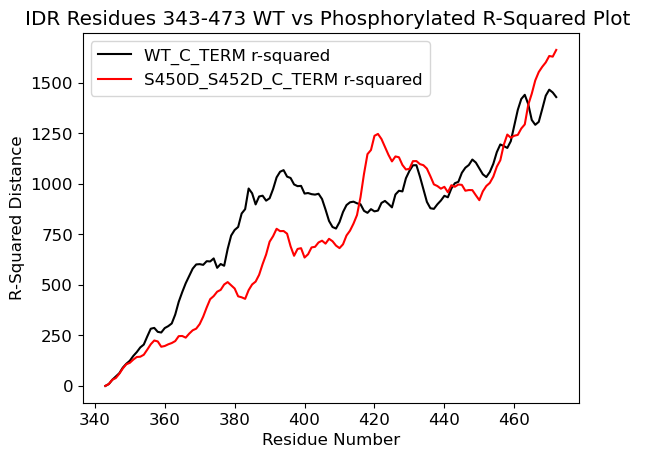

0.0
huh?
9.516034836049466
[0.0, 9.165610013415773, 30.472665714954648, 46.596602750292114, 62.83846117879568, 90.49958348650298, 109.60597684900596, 124.42455900432644, 148.36916452332255, 167.5875693734632, 190.6762363329371, 204.74349096013626, 244.9812772865934, 283.29321638590886, 287.2650298886049, 267.7515717976811, 264.4806560673014, 286.50553991580284, 296.0273806845652, 309.22780222446374, 353.4082084696431, 416.46706571922783, 464.4614268906279, 508.46815638508815, 544.1442138631353, 580.826464972116, 601.5360880997221, 603.013712579034, 599.5218532942899, 617.6713803797408, 616.3833624502258, 631.3283374414491, 584.8214490671011, 603.7421633383509, 594.912781078304, 678.3017634647181, 744.5478342745628, 772.284195580516, 787.0835218462109, 853.7745296393348, 875.3668111618132, 977.5243646091606, 953.7794922343185, 898.7678722718944, 938.0566446457804, 941.9444071383499, 917.4695197395112, 929.1433874316352, 975.0240847353194, 1032.6567744171134, 1060.577130396159, 1068.5662

In [37]:
systems=['WT_C_TERM','S450D_S452D_C_TERM']#,'WT_L2_L3','S216D_L2_L3']
colors=['black','red']
#from pytraj import topology as top
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
os.chdir(path)
import math

#use template to produce the trajectory and topology file names

trajectory= 'abm_ProtIon_trimmed_concat.xtc'
#print(trajectory)
topology= 'abm_ProtIon_rep1_start.pdb'

#print(topology)
color_num=0
fig,ax=plt.subplots()

for system in systems:
    new_path=path+'/'+system
    #print(new_path)
    os.chdir(new_path)
    system_avg_distances=[]
    top=pt.load_topology(topology)
    traj=pt.iterload(trajectory,topology)
    print(traj)
    print(top.n_residues)
    n_residues=top.n_residues
    #print(n_residues)
    n_bins=n_residues
    for i in range(1,n_residues):
        resmask=(':1@BB :' + str(i)+'@BB')
        distance_between=pt.distance(traj, mask=resmask)
        system_avg_distances.append(distance_between)
    #print(system_avg_distances)
    #print(len(system_avg_distances))
    #print(len(system_avg_distances[0]))
    #print('BREAK')

    mean_distances=[]
    sd_distances=[]
    for i in range(len(system_avg_distances)):
        mean=np.mean(system_avg_distances[i])
        mean_distances.append(mean)
        sd=np.std(system_avg_distances[i])
        sd_distances.append(sd)
    
    #print(len(mean_distances))
    #print(mean_distances)

    r_squared=[]
    for i in range(len(mean_distances)):
        squared=mean_distances[i]*mean_distances[i]
        r_squared.append(squared)

    if system=='WT_C_TERM':
        wt_r2_Cterm=r_squared
    elif system=='S450D_S452D_C_TERM':
        s450d_s452d_r2_Cterm=r_squared
    #print(r_squared)
    #print(n_residues)
    #print(len(r_squared))

    '''
    #print(len(means))
    #print(means)
    #end_distances=pt.distance(traj1, mask=ends)
    counts,edges,bars=ax.hist(r_squared, n_bins, histtype='bar',color='black',label=systems)
    ax.set_title('')

    for i in range(len(counts)):
        bin_centres = (edges[:-1] + edges[1:])/2.
        print(bin_centres)
        print(counts)
        plt.scatter(x=bin_centres,y=counts[i],color='black',label=systems[i])
        plt.plot(bin_centres,counts[i],color=colors[i])'''

    x_values=[]
    lower_sd=[]
    upper_sd=[]
    for i in range(343,n_residues+342):
        x_values.append(i)
    print(x_values)
    #for i in range(0,len(x_values)):
    #    lower_sd.append(r_squared[i]-sd_distances[i])
    #    upper_sd.append(r_squared[i]+sd_distances[i])

    #print(len(x_values))
    #print(len(r_squared))
    #print(sd_distances)
    #print('BREAK')
    #print(len(lower_sd))
    #print(lower_sd)
    #print(len(upper_sd))
    #print(upper_sd)
    legend=system+ ' r-squared'
    print(len(x_values))
    print(len(r_squared))
    ax.plot(x_values,r_squared,'-',color=colors[color_num],label=legend)
    color_num+=1
    #plt.fill_between(x_values,lower_sd,upper_sd,color='gray')

    title="IDR Residues 343-473 WT vs Phosphorylated R-Squared Plot "
    plt.title(title)
    plt.xlabel("Residue Number")
    plt.ylabel("R-Squared Distance")
    #plt.xlim(0,n_residues)
    #plt.gca().invert_xaxis()
    #ax.figure.set_size_inches(8.0,6.0)
    leg = ax.legend()

name='WT_vs_S450D_S452D_Cterm_r-squared_plot.png'

plt.gcf().savefig(name,dpi=300)
plt.show()

#print(x_values)
#print(r_squared)

import csv
os.chdir(path)

#wt_extended_r_squared
#s216d_extended_r_squared
#wt_L2L3_r_squared
#s216d_L2L3_r_squared
#print(wt_extended_r_squared)
#print(s216d_extended_r_squared)
print(r_squared[0])

print('huh?')

print(r_squared[1])

wt_output=path+'/wt_r2_Cterm.csv'
#wt_r2_Cterm=r_squared[0]
print(wt_r2_Cterm)
wt_dF=pd.DataFrame(wt_r2_Cterm)
print(wt_dF)

wt_dF.to_csv('wt_r2_Cterm.csv',index=False,header=None)


s450d_output=path+'/s450d_s452d_r2_Cterm.csv'
#s450d_r2_Cterm=s450d_extended_r_squared[1]
s450d_dF=pd.DataFrame(s450d_s452d_r2_Cterm)
print(s450d_dF)
s450d_dF.to_csv('s450d_s452d_r2_Cterm.csv',index=False,header=None)

pytraj.TrajectoryIterator, 50642 frames: 
Size: 0.350900 (GB)
<Topology: 310 atoms, 131 residues, 310 mols, PBC with box type = cubic>
           
131
[343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 471, 472]
130
130
pytraj.TrajectoryIterator, 20001 frames: 
Size: 0.138588 (GB)
<Topology: 310 atoms, 131 residues, 310 mols, PBC with box type = cubic>
           
131
[343, 344, 345, 346, 347, 348, 349, 350

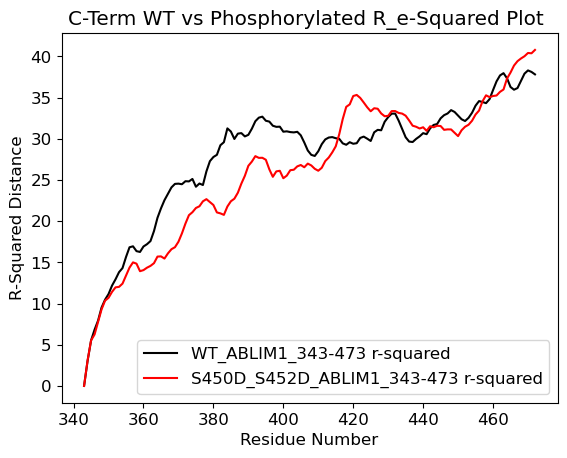

"\n#print(x_values)\n#print(r_squared)\n\nimport csv\nos.chdir(path)\n\n#wt_extended_r_squared\n#s216d_extended_r_squared\n#wt_L2L3_r_squared\n#s216d_L2L3_r_squared\n#print(wt_extended_r_squared)\n#print(s216d_extended_r_squared)\nprint(r_squared[0])\n\nprint('huh?')\n\nprint(r_squared[1])\n\nwt_output=path+'/wt_r_e**2_Cterm.csv'\n#wt_r2_Cterm=r_squared[0]\nprint(wt_r2_Cterm)\nwt_dF=pd.DataFrame(wt_r2_Cterm)\nprint(wt_dF)\n\nwt_dF.to_csv('wt_r_e**2_Cterm.csv',index=False,header=None)\n\n\ns450d_output=path+'/s450d_s452d_r_e**2_Cterm.csv'\n#s450d_r2_Cterm=s450d_extended_r_squared[1]\ns450d_dF=pd.DataFrame(s450d_s452d_r2_Cterm)\nprint(s450d_dF)\ns450d_dF.to_csv('s450d_s452d_r_e**2_Cterm.csv',index=False,header=None)"

In [31]:
systems=['WT_ABLIM1_343-473','S450D_S452D_ABLIM1_343-473']#,'WT_L2_L3','S216D_L2_L3']
colors=['black','red']
#from pytraj import topology as top
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
os.chdir(path)
import math

#use template to produce the trajectory and topology file names

trajectory= 'abm_ProtIon_trimmed_concat.xtc'
#print(trajectory)
topology= 'abm_ProtIon_rep1_start.pdb'

#print(topology)
color_num=0
fig,ax=plt.subplots()

for system in systems:
    new_path=path+'/'+system
    #print(new_path)
    os.chdir(new_path)
    system_avg_distances=[]
    top=pt.load_topology(topology)
    traj=pt.iterload(trajectory,topology)
    print(traj)
    print(top.n_residues)
    n_residues=top.n_residues
    #print(n_residues)
    n_bins=n_residues
    for i in range(1,n_residues):
        resmask=(':1@BB :' + str(i)+'@BB')
        distance_between=pt.distance(traj, mask=resmask)
        system_avg_distances.append(distance_between)
    #print(system_avg_distances)
    #print(len(system_avg_distances))
    #print(len(system_avg_distances[0]))
    #print('BREAK')

    mean_distances=[]
    sd_distances=[]
    for i in range(len(system_avg_distances)):
        mean=np.mean(system_avg_distances[i])
        mean_distances.append(mean)
        sd=np.std(system_avg_distances[i])
        sd_distances.append(sd)
    
    #print(len(mean_distances))
    #print(mean_distances)

    r_squared=[]
    for i in range(len(mean_distances)):
        squared=mean_distances[i]*mean_distances[i]
        r_squared.append(math.sqrt(squared))

    if system=='WT_C_TERM':
        wt_r2_Cterm=r_squared
    elif system=='S450D_S452D_C_TERM':
        s450d_s452d_r2_Cterm=r_squared
    #print(r_squared)
    #print(n_residues)
    #print(len(r_squared))

    '''
    #print(len(means))
    #print(means)
    #end_distances=pt.distance(traj1, mask=ends)
    counts,edges,bars=ax.hist(r_squared, n_bins, histtype='bar',color='black',label=systems)
    ax.set_title('')

    for i in range(len(counts)):
        bin_centres = (edges[:-1] + edges[1:])/2.
        print(bin_centres)
        print(counts)
        plt.scatter(x=bin_centres,y=counts[i],color='black',label=systems[i])
        plt.plot(bin_centres,counts[i],color=colors[i])'''

    x_values=[]
    lower_sd=[]
    upper_sd=[]
    for i in range(343,n_residues+342):
        x_values.append(i)
    print(x_values)
    #for i in range(0,len(x_values)):
    #    lower_sd.append(r_squared[i]-sd_distances[i])
    #    upper_sd.append(r_squared[i]+sd_distances[i])

    #print(len(x_values))
    #print(len(r_squared))
    #print(sd_distances)
    #print('BREAK')
    #print(len(lower_sd))
    #print(lower_sd)
    #print(len(upper_sd))
    #print(upper_sd)
    legend=system+ ' r-squared'
    print(len(x_values))
    print(len(r_squared))
    ax.plot(x_values,r_squared,'-',color=colors[color_num],label=legend)
    color_num+=1
    #plt.fill_between(x_values,lower_sd,upper_sd,color='gray')

    title="C-Term WT vs Phosphorylated R_e-Squared Plot "
    plt.title(title)
    plt.xlabel("Residue Number")
    plt.ylabel("R-Squared Distance")
    #plt.xlim(0,n_residues)
    #plt.gca().invert_xaxis()
    #ax.figure.set_size_inches(8.0,6.0)
    leg = ax.legend()

name='WT_vs_S450D_S452D_Cterm_r_e**2_plot.png'

plt.gcf().savefig(name,dpi=300)
plt.show()
'''
#print(x_values)
#print(r_squared)

import csv
os.chdir(path)

#wt_extended_r_squared
#s216d_extended_r_squared
#wt_L2L3_r_squared
#s216d_L2L3_r_squared
#print(wt_extended_r_squared)
#print(s216d_extended_r_squared)
print(r_squared[0])

print('huh?')

print(r_squared[1])

wt_output=path+'/wt_r_e**2_Cterm.csv'
#wt_r2_Cterm=r_squared[0]
print(wt_r2_Cterm)
wt_dF=pd.DataFrame(wt_r2_Cterm)
print(wt_dF)

wt_dF.to_csv('wt_r_e**2_Cterm.csv',index=False,header=None)


s450d_output=path+'/s450d_s452d_r_e**2_Cterm.csv'
#s450d_r2_Cterm=s450d_extended_r_squared[1]
s450d_dF=pd.DataFrame(s450d_s452d_r2_Cterm)
print(s450d_dF)
s450d_dF.to_csv('s450d_s452d_r_e**2_Cterm.csv',index=False,header=None)'''

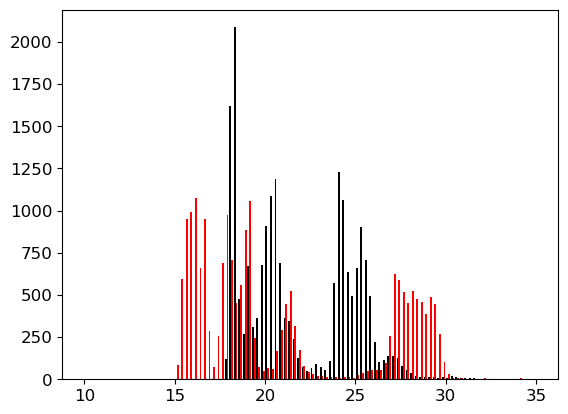

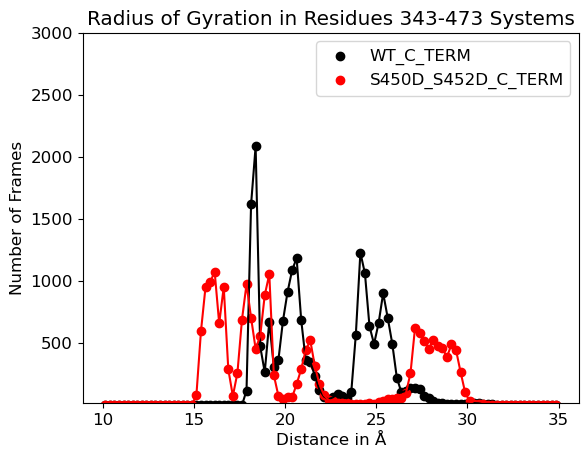

In [35]:
#HISTOGRAM OF MEAN ROG OF aTOMISTIC ABLIM2 SYSTEMS

trajectory= 'abm_ProtIon_trimmed_concat.xtc'
#print(trajectory)
topology= 'abm_ProtIon_rep1_start.pdb'

x_multi=[]
systems=['WT_C_TERM','S450D_S452D_C_TERM']
n_bins=100
color_num=0
colors=['black','red']

fig,ax = plt.subplots()
for system in systems:
    os.chdir(path+'/'+system)
    sys_mean=system + ' mean'
    traj=pt.iterload(trajectory,topology)
    #traj2=pt.iterload(trajectory[1],topology[1])
    #traj3=pt.iterload(trajectory[2],topology[2])
    #traj4=pt.iterload(trajectory[3],topology[3])
    #traj5=pt.iterload(trajectory[4],topology[4])
    #traj6=pt.iterload(trajectory[5],topology[5])
    #traj7=pt.iterload(trajectory[6],topology[6])

    #pytraj radius of gyration calculated for the backbone atoms
    data=pt.radgyr(traj, mask='@BB')
    #data2=pt.radgyr(traj2, mask='@BB')
    #data3=pt.radgyr(traj3, mask='@BB')
    #data4=pt.radgyr(traj4, mask='@BB')
    #data5=pt.radgyr(traj5, mask='@BB')
    #data6=pt.radgyr(traj6, mask='@BB')
    #data7=pt.radgyr(traj7, mask='@BB')

    multiple_lists = [data]#,data4,data5,data6,data7]
    arrays = [np.array(x) for x in multiple_lists]
    means=[np.mean(k) for k in zip(*arrays)]
    #print(means)
    #print(len(means))
    x_multi.append(means[10:20000])

    #legend=system+ ' mean'

#calculate the bars & edges of the histogram
bin_counts,bin_edges,bars=ax.hist(x_multi, n_bins, histtype='bar',range=(10,35),color=colors,label=systems)


fig,ax = plt.subplots()
for i in range(len(bin_counts)):
    #generate the outline/shape of the histogram for each system, NOT including the bars themselves
    bin_centres = (bin_edges[:-1] + bin_edges[1:])/2.
    plt.scatter(x=bin_centres,y=bin_counts[i],color=colors[i],label=systems[i])
    plt.plot(bin_centres,bin_counts[i],color=colors[i])


'''for i in range(len(x_multi)):
    histo, bin_edges = np.histogram(x_multi[i],nbins)
    bin_center = 0.5*(bin_edges[1:] + bin_edges[:-1])
    ax.plot(bin_center,histo,color=colors[i])
    ax.scatter(x=bin_center,y=histo,color=colors[i],label=systems[i])
#plt.show()
'''
title="Radius of Gyration in Residues 343-473 Systems"
plt.title(title)
#plt.xlim(12,24)
plt.ylim(20,3000)
plt.xlabel("Distance in Å")
plt.ylabel("Number of Frames")
#ax.figure.set_size_inches(7.5,6.5)
ax.legend()
#for b in bars:
#    ax.bar_label(b, labels=[v.astype(np.int64) if v > 0 else '' for v in b.datavalues])

name='C_TERM_ROG_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()


/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses
check in 1
hi
52.51844834825125
WT_ABLIM1_343-473_BUILT: 52.51844834825125
check in 1
47.9957169710918
S450D_S452D_ABLIM1_343-473_BUILT: 47.9957169710918
check-in 2


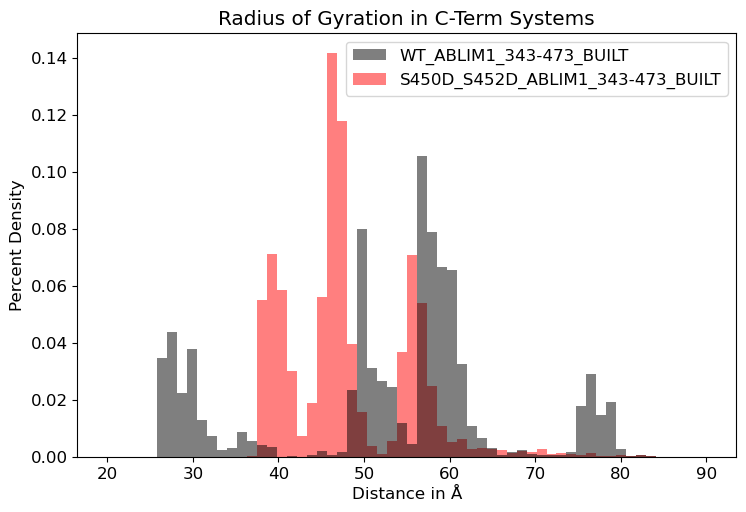

In [26]:
#HISTOGRAM OF MEAN ROG FOR BUILT, LONG C-TERM SYSTEMS
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
trajectory= 'abm_ProtIon_trimmed_concat.xtc'
#print(trajectory)
topology= 'abm_ProtIon_rep1_start.pdb'
print(path)
x_multi=[]
systems=['WT_ABLIM1_343-473_BUILT','S450D_S452D_ABLIM1_343-473_BUILT']
n_bins=100
color_num=0
colors=['black','red']

multi_num=0
fig,ax = plt.subplots()
for system in systems:
    os.chdir(path+'/'+system)
    sys_mean=system + ' mean'
    traj=pt.iterload(trajectory,topology)
    #traj2=pt.iterload(trajectory[1],topology[1])
    #traj3=pt.iterload(trajectory[2],topology[2])
    #traj4=pt.iterload(trajectory[3],topology[3])
    #traj5=pt.iterload(trajectory[4],topology[4])
    #traj6=pt.iterload(trajectory[5],topology[5])
    #traj7=pt.iterload(trajectory[6],topology[6])

    #pytraj radius of gyration calculated for the backbone atoms
    data=pt.radgyr(traj, mask='@BB')
    #data2=pt.radgyr(traj2, mask='@BB')
    #data3=pt.radgyr(traj3, mask='@BB')
    #data4=pt.radgyr(traj4, mask='@BB')
    #data5=pt.radgyr(traj5, mask='@BB')
    #data6=pt.radgyr(traj6, mask='@BB')
    #data7=pt.radgyr(traj7, mask='@BB')
    print('check in 1')
    #print(len(data))
    multiple_lists = [data]#,data4,data5,data6,data7]
    arrays = [np.array(x) for x in multiple_lists]
    means=[np.mean(k) for k in zip(*arrays)]
    #print(len(means))
    #print(means)
    if system=='WT_ABLIM1_343-473_BUILT':
        real_means=[]
        #one WT run did not go through production properly but was not noticed until after all runs were concatenated, so it is manually spliced out here
        real_means.extend(means[200:3550])
        real_means.extend(means[4200:])
        print(' ')
        x_multi.append(real_means)
    else:
        x_multi.append(means[200:])
    total_mean=np.mean(x_multi[multi_num])
    multi_num+=1
    print(str(total_mean))
    print(system + ': ' + str(total_mean))


#calculate the bars & edges of the histogram
n_bins=60

bin_counts,bin_edges,bars=ax.hist(x_multi, n_bins, histtype='stepfilled',range=(20,90),color=colors,label=systems,density=True,alpha=0.5)
#get andles and labels
handles, labels = plt.gca().get_legend_handles_labels() 
#set order
order = [1,0] 

# pass handle & labels lists along with order as below 
plt.legend([handles[i] for i in order], [labels[i] for i in order],loc='best',) 
    
print('check-in 2')
'''
fig,ax = plt.subplots()
for i in range(len(bin_counts)):
    #generate the outline/shape of the histogram for each system, NOT including the bars themselves
    bin_centres = (bin_edges[:-1] + bin_edges[1:])/2.
    plt.scatter(x=bin_centres,y=bin_counts[i],color=colors[i],label=systems[i])
    plt.plot(bin_centres,bin_counts[i],color=colors[i])
'''
#print('check in 3')

title="Radius of Gyration in C-Term Systems"
plt.title(title)
#plt.xlim(12,24)
#plt.ylim(0,1)
plt.xlabel("Distance in Å")
plt.ylabel("Percent Density")
ax.figure.set_size_inches(8.5,5.5)
#ax.legend()
#for b in bars:
#    ax.bar_label(b, labels=[v.astype(np.int64) if v > 0 else '' for v in b.datavalues])

name='BUILT_C_TERM_ROG_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()


pytraj.TrajectoryIterator, 5404 frames: 
Size: 0.037445 (GB)
<Topology: 310 atoms, 131 residues, 310 mols, PBC with box type = cubic>
           
131
[343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 471, 472]
130
130
pytraj.TrajectoryIterator, 4736 frames: 
Size: 0.032816 (GB)
<Topology: 310 atoms, 131 residues, 310 mols, PBC with box type = cubic>
           
131
[343, 344, 345, 346, 347, 348, 349, 350, 

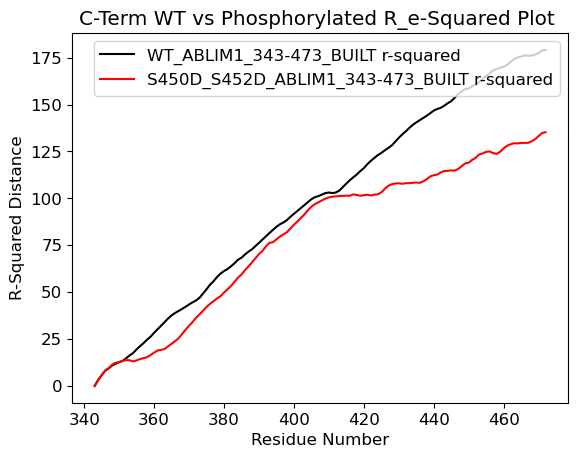

"\nimport csv\nos.chdir(path)\n\n#wt_extended_r_squared\n#s216d_extended_r_squared\n#wt_L2L3_r_squared\n#s216d_L2L3_r_squared\n#print(wt_extended_r_squared)\n#print(s216d_extended_r_squared)\nprint(r_squared[0])\n\nprint('huh?')\n\nprint(r_squared[1])\n\nwt_output=path+'/built_wt_r_e**2_Cterm.csv'\n#wt_r2_Cterm=r_squared[0]\nprint(wt_r2_Cterm)\nwt_dF=pd.DataFrame(wt_r2_Cterm)\nprint(wt_dF)\n\nwt_dF.to_csv('built_wt_r_e**2_Cterm.csv',index=False,header=None)\n\n\ns450d_output=path+'/built_s450d_s452d_r_e**2_Cterm.csv'\n#s450d_r2_Cterm=s450d_extended_r_squared[1]\ns450d_dF=pd.DataFrame(s450d_s452d_r2_Cterm)\nprint(s450d_dF)\ns450d_dF.to_csv('built_s450d_s452d_r_e**2_Cterm.csv',index=False,header=None)\n"

In [8]:
systems=['WT_ABLIM1_343-473_BUILT','S450D_S452D_ABLIM1_343-473_BUILT']#,'WT_L2_L3','S216D_L2_L3']
colors=['black','red']
#from pytraj import topology as top
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
os.chdir(path)
import math

#use template to produce the trajectory and topology file names

trajectory= 'abm_ProtIon_trimmed_concat.xtc'
#print(trajectory)
topology= 'abm_ProtIon_rep1_start.pdb'

#print(topology)
color_num=0
fig,ax=plt.subplots()

for system in systems:
    new_path=path+'/'+system
    #print(new_path)
    os.chdir(new_path)
    system_avg_distances=[]
    top=pt.load_topology(topology)
    traj=pt.iterload(trajectory,topology)
    print(traj)
    print(top.n_residues)
    n_residues=top.n_residues
    #print(n_residues)
    n_bins=n_residues
    for i in range(1,n_residues):
        resmask=(':1@BB :' + str(i)+'@BB')
        distance_between=pt.distance(traj, mask=resmask)
        system_avg_distances.append(distance_between)
    #print(system_avg_distances)
    #print(len(system_avg_distances))
    #print(len(system_avg_distances[0]))
    #print('BREAK')

    mean_distances=[]
    sd_distances=[]
    for i in range(len(system_avg_distances)):
        res_averages.append(system_avg_distances[i]*system_avg_distances[i])
        mean=np.mean(system_avg_distances[i]*system_avg_distances[i])
        mean_distances.append(mean)
        sd=np.std(system_avg_distances[i])
        sd_distances.append(sd)
    
    #print(len(mean_distances))
    #print(mean_distances)

    r_squared=[]
    for i in range(len(mean_distances)):
        squared=mean_distances[i]
        r_squared.append(math.sqrt(squared))

    if system=='WT_343-473_BUILT':
        wt_r2_Cterm=r_squared
    elif system=='S450D_S452D_343-473_BUILT':
        s450d_s452d_r2_Cterm=r_squared
    #print(r_squared)
    #print(n_residues)
    #print(len(r_squared))

    '''
    #print(len(means))
    #print(means)
    #end_distances=pt.distance(traj1, mask=ends)
    counts,edges,bars=ax.hist(r_squared, n_bins, histtype='bar',color='black',label=systems)
    ax.set_title('')

    for i in range(len(counts)):
        bin_centres = (edges[:-1] + edges[1:])/2.
        print(bin_centres)
        print(counts)
        plt.scatter(x=bin_centres,y=counts[i],color='black',label=systems[i])
        plt.plot(bin_centres,counts[i],color=colors[i])'''

    x_values=[]
    lower_sd=[]
    upper_sd=[]
    for i in range(343,n_residues+342):
        x_values.append(i)
    print(x_values)
    #for i in range(0,len(x_values)):
    #    lower_sd.append(r_squared[i]-sd_distances[i])
    #    upper_sd.append(r_squared[i]+sd_distances[i])

    #print(len(x_values))
    #print(len(r_squared))
    #print(sd_distances)
    #print('BREAK')
    #print(len(lower_sd))
    #print(lower_sd)
    #print(len(upper_sd))
    #print(upper_sd)
    legend=system+ ' r-squared'
    print(len(x_values))
    print(len(r_squared))
    ax.plot(x_values,r_squared,'-',color=colors[color_num],label=legend)
    color_num+=1
    #plt.fill_between(x_values,lower_sd,upper_sd,color='gray')

    title="C-Term WT vs Phosphorylated R_e-Squared Plot "
    plt.title(title)
    plt.xlabel("Residue Number")
    plt.ylabel("R-Squared Distance")
    #plt.xlim(0,n_residues)
    #plt.gca().invert_xaxis()
    #ax.figure.set_size_inches(8.0,6.0)
    leg = ax.legend()

name='BUILT_WT_vs_S450D_S452D_Cterm_r_e**2_plot.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

#print(x_values)
#print(r_squared)
'''
import csv
os.chdir(path)

#wt_extended_r_squared
#s216d_extended_r_squared
#wt_L2L3_r_squared
#s216d_L2L3_r_squared
#print(wt_extended_r_squared)
#print(s216d_extended_r_squared)
print(r_squared[0])

print('huh?')

print(r_squared[1])

wt_output=path+'/built_wt_r_e**2_Cterm.csv'
#wt_r2_Cterm=r_squared[0]
print(wt_r2_Cterm)
wt_dF=pd.DataFrame(wt_r2_Cterm)
print(wt_dF)

wt_dF.to_csv('built_wt_r_e**2_Cterm.csv',index=False,header=None)


s450d_output=path+'/built_s450d_s452d_r_e**2_Cterm.csv'
#s450d_r2_Cterm=s450d_extended_r_squared[1]
s450d_dF=pd.DataFrame(s450d_s452d_r2_Cterm)
print(s450d_dF)
s450d_dF.to_csv('built_s450d_s452d_r_e**2_Cterm.csv',index=False,header=None)
'''

pytraj.TrajectoryIterator, 5404 frames: 
Size: 0.037445 (GB)
<Topology: 310 atoms, 131 residues, 310 mols, PBC with box type = cubic>
           
131
[343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 471, 472, 473]
131
131
pytraj.TrajectoryIterator, 4736 frames: 
Size: 0.032816 (GB)
<Topology: 310 atoms, 131 residues, 310 mols, PBC with box type = cubic>
           
131
[343, 344, 345, 346, 347, 348, 349, 

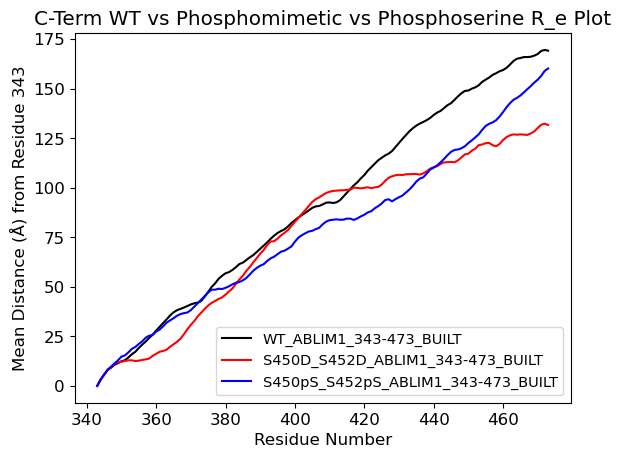

0.0
huh?
3.29071640374795
[0.0, 3.1930366582416014, 5.715913809455666, 8.02573986468655, 9.213036049660433, 10.671337830026637, 11.52431074297685, 12.442828262742946, 12.997736111379748, 14.396696438249185, 15.997793093821882, 17.259920316818672, 19.197254821992843, 20.8868448696582, 22.436619879939386, 24.272618674231875, 25.87635812989545, 27.952726517722624, 29.821357623058347, 31.695998088012516, 33.59829194224284, 35.569358803389335, 37.11588105785899, 38.221738402039946, 38.8858988061696, 39.558872045516345, 40.34111146291, 41.140666487121614, 41.71421592344363, 42.061157216971054, 42.90892850231, 45.10102571154872, 47.44966317232167, 49.99011349786888, 51.79322270526394, 54.07331374128221, 55.60097968183035, 56.85542820844794, 57.46521028178786, 58.56744508809595, 59.964408922955506, 61.54693546009653, 62.230633334110266, 63.556719638069616, 64.9033163916895, 66.04543832650859, 67.62105733191451, 69.21014272261681, 70.84714079461283, 72.47572914250088, 74.29109612959016, 75.8351

In [23]:
systems=['WT_ABLIM1_343-473_BUILT','S450D_S452D_ABLIM1_343-473_BUILT','S450pS_S452pS_ABLIM1_343-473_BUILT']#,'WT_L2_L3','S216D_L2_L3']
colors=['black','red','blue']
#from pytraj import topology as top
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
os.chdir(path)
import math

#use template to produce the trajectory and topology file names

trajectory= 'abm_ProtIon_trimmed_concat.xtc'
#print(trajectory)
topology= 'abm_ProtIon_rep1_start.pdb'

#print(topology)
color_num=0
fig,ax=plt.subplots()

for system in systems:
    new_path=path+'/'+system
    #print(new_path)
    os.chdir(new_path)
    system_avg_distances=[]
    top=pt.load_topology(topology)
    traj=pt.iterload(trajectory,topology)
    print(traj)
    print(top.n_residues)
    n_residues=top.n_residues
    #print(n_residues)
    n_bins=n_residues
    for i in range(1,n_residues+1):
        resmask=(':1@BB :' + str(i)+'@BB')
        distance_between=pt.distance(traj, mask=resmask)
        system_avg_distances.append(distance_between)
    #print(system_avg_distances)
    #print(len(system_avg_distances))
    #print(len(system_avg_distances[0]))
    #print('BREAK')

    mean_distances=[]
    sd_distances=[]
    for i in range(len(system_avg_distances)):
        mean=np.mean(system_avg_distances[i])
        mean_distances.append(mean)
        sd=np.std(system_avg_distances[i])
        sd_distances.append(sd)
    
    #print(len(mean_distances))
    #print(mean_distances)

    r_squared=[]
    for i in range(len(mean_distances)):
        squared=mean_distances[i]#*mean_distances[i]
        r_squared.append(squared)#math.sqrt(squared))

    if system=='WT_ABLIM1_343-473_BUILT':
        wt_r2_Cterm=mean_distances
    elif system=='S450D_S452D_ABLIM1_343-473_BUILT':
        s450d_s452d_r2_Cterm=mean_distances
    elif system=='S450pS_S452pS_ABLIM1_343-473_BUILT':
        s450pS_s452pS_r2_Cterm=mean_distances
    #print(r_squared)
    #print(n_residues)
    #print(len(r_squared))

    '''
    #print(len(means))
    #print(means)
    #end_distances=pt.distance(traj1, mask=ends)
    counts,edges,bars=ax.hist(r_squared, n_bins, histtype='bar',color='black',label=systems)
    ax.set_title('')

    for i in range(len(counts)):
        bin_centres = (edges[:-1] + edges[1:])/2.
        print(bin_centres)
        print(counts)
        plt.scatter(x=bin_centres,y=counts[i],color='black',label=systems[i])
        plt.plot(bin_centres,counts[i],color=colors[i])'''

    x_values=[]
    lower_sd=[]
    upper_sd=[]
    for i in range(343,n_residues+343):
        x_values.append(i)
    print(x_values)
    #for i in range(0,len(x_values)):
    #    lower_sd.append(r_squared[i]-sd_distances[i])
    #    upper_sd.append(r_squared[i]+sd_distances[i])

    #print(len(x_values))
    #print(len(r_squared))
    #print(sd_distances)
    #print('BREAK')
    #print(len(lower_sd))
    #print(lower_sd)
    #print(len(upper_sd))
    #print(upper_sd)
    legend=system
    print(len(x_values))
    print(len(r_squared))
    ax.plot(x_values,mean_distances,'-',color=colors[color_num],label=legend)
    color_num+=1
    #plt.fill_between(x_values,lower_sd,upper_sd,color='gray')

    title="C-Term WT vs Phosphomimetic vs Phosphoserine R_e Plot"
    plt.title(title)
    plt.xlabel("Residue Number")
    plt.ylabel("Mean Distance (Å) from Residue 343")
    #plt.xlim(0,n_residues)
    #plt.gca().invert_xaxis()
    #ax.figure.set_size_inches(8.0,6.0)
    leg = ax.legend(loc='lower right',prop={'size': 10.5})

name='BUILT_WT_vs_S450D_S452D__vs_S450pS_S452pS_Cterm_re_plot.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=600)
plt.show()

#print(x_values)
#print(r_squared)

import csv
os.chdir(path)

#wt_extended_r_squared
#s216d_extended_r_squared
#wt_L2L3_r_squared
#s216d_L2L3_r_squared
#print(wt_extended_r_squared)
#print(s216d_extended_r_squared)
print(r_squared[0])

print('huh?')

print(r_squared[1])

wt_output=path+'/built_wt_Re_Cterm.csv'
#wt_r2_Cterm=r_squared[0]
print(wt_r2_Cterm)
wt_dF=pd.DataFrame(wt_r2_Cterm)
print(wt_dF)
wt_dF.to_csv('built_wt_Re_Cterm.csv',index=False,header=None)


s450d_output=path+'/built_s450d_s452d_Re_Cterm.csv'
#s450d_r2_Cterm=s450d_extended_r_squared[1]
s450d_dF=pd.DataFrame(s450d_s452d_r2_Cterm)
print(s450d_dF)
s450d_dF.to_csv('built_s450d_s452d_Re_Cterm.csv',index=False,header=None)


s450pS_output=path+'/built_s450pS_s452pS_Re_Cterm.csv'
s450pS_dF=pd.DataFrame(s450pS_s452pS_r2_Cterm)
print(s450pS_dF)
s450pS_dF.to_csv('built_s450pS_s452pS_Re_Cterm.csv',index=False,header=None)


pytraj.TrajectoryIterator, 50642 frames: 
Size: 0.350900 (GB)
<Topology: 310 atoms, 131 residues, 310 mols, PBC with box type = cubic>
           
131
[343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 471, 472]
130
130
pytraj.TrajectoryIterator, 20001 frames: 
Size: 0.138588 (GB)
<Topology: 310 atoms, 131 residues, 310 mols, PBC with box type = cubic>
           
131
[343, 344, 345, 346, 347, 348, 349, 350

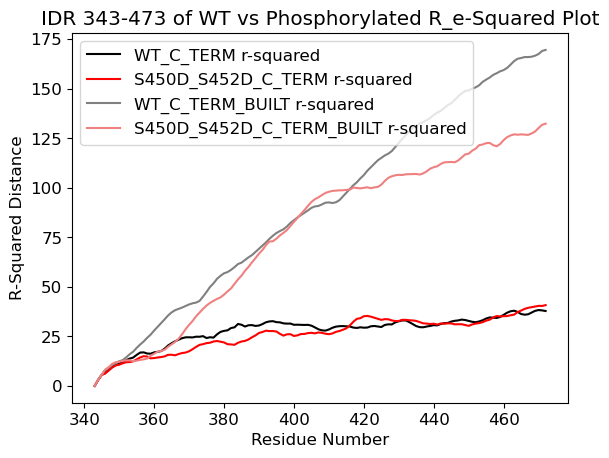

huh?


"\nwt_output=path+'/built_wt_r_e**2_Cterm.csv'\n#wt_r2_Cterm=r_squared[0]\nprint(wt_r2_Cterm)\nwt_dF=pd.DataFrame(wt_r2_Cterm)\nprint(wt_dF)\n\nwt_dF.to_csv('built_wt_r_e**2_Cterm.csv',index=False,header=None)\n\n\ns450d_output=path+'/built_s450d_s452d_r_e**2_Cterm.csv'\n#s450d_r2_Cterm=s450d_extended_r_squared[1]\ns450d_dF=pd.DataFrame(s450d_s452d_r2_Cterm)\nprint(s450d_dF)\ns450d_dF.to_csv('built_s450d_s452d_r_e**2_Cterm.csv',index=False,header=None)\n"

In [9]:
systems=['WT_C_TERM','S450D_S452D_C_TERM','WT_C_TERM_BUILT','S450D_S452D_C_TERM_BUILT']#,'WT_L2_L3','S216D_L2_L3']
colors=['black','red','gray','lightcoral']
#from pytraj import topology as top
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
os.chdir(path)
import math

#use template to produce the trajectory and topology file names

trajectory= 'abm_ProtIon_trimmed_concat.xtc'
#print(trajectory)
topology= 'abm_ProtIon_rep1_start.pdb'

#print(topology)
color_num=0
fig,ax=plt.subplots()

for system in systems:
    new_path=path+'/'+system
    #print(new_path)
    os.chdir(new_path)
    system_avg_distances=[]
    top=pt.load_topology(topology)
    traj=pt.iterload(trajectory,topology)
    print(traj)
    print(top.n_residues)
    n_residues=top.n_residues
    #print(n_residues)
    n_bins=n_residues
    for i in range(1,n_residues):
        resmask=(':1@BB :' + str(i)+'@BB')
        distance_between=pt.distance(traj, mask=resmask)
        system_avg_distances.append(distance_between)
    #print(system_avg_distances)
    #print(len(system_avg_distances))
    #print(len(system_avg_distances[0]))
    #print('BREAK')

    mean_distances=[]
    sd_distances=[]
    for i in range(len(system_avg_distances)):
        mean=np.mean(system_avg_distances[i])
        mean_distances.append(mean)
        sd=np.std(system_avg_distances[i])
        sd_distances.append(sd)
    
    #print(len(mean_distances))
    #print(mean_distances)

    r_squared=[]
    for i in range(len(mean_distances)):
        squared=mean_distances[i]*mean_distances[i]
        r_squared.append(math.sqrt(squared))

    #if system=='WT_C_TERM_BUILT':
    #    wt_r2_Cterm=r_squared
    #elif system=='S450D_S452D_C_TERM_BUILT':
    #    s450d_s452d_r2_Cterm=r_squared
    #print(r_squared)
    #print(n_residues)
    #print(len(r_squared))
 
    '''
    #print(len(means))
    #print(means)
    #end_distances=pt.distance(traj1, mask=ends)
    counts,edges,bars=ax.hist(r_squared, n_bins, histtype='bar',color='black',label=systems)
    ax.set_title('')

    for i in range(len(counts)):
        bin_centres = (edges[:-1] + edges[1:])/2.
        print(bin_centres)
        print(counts)
        plt.scatter(x=bin_centres,y=counts[i],color='black',label=systems[i])
        plt.plot(bin_centres,counts[i],color=colors[i])'''

    x_values=[]
    lower_sd=[]
    upper_sd=[]
    for i in range(343,n_residues+342):
        x_values.append(i)
    print(x_values)
    #for i in range(0,len(x_values)):
    #    lower_sd.append(r_squared[i]-sd_distances[i])
    #    upper_sd.append(r_squared[i]+sd_distances[i])

    #print(len(x_values))
    #print(len(r_squared))
    #print(sd_distances)
    #print('BREAK')
    #print(len(lower_sd))
    #print(lower_sd)
    #print(len(upper_sd))
    #print(upper_sd)
        
    legend=system+ ' r-squared'
    print(len(x_values))
    print(len(r_squared))
    ax.plot(x_values,r_squared,'-',color=colors[color_num],label=legend)
    color_num+=1
    #plt.fill_between(x_values,lower_sd,upper_sd,color='gray')

    title="IDR 343-473 of WT vs Phosphorylated R_e-Squared Plot"
    plt.title(title)
    plt.xlabel("Residue Number")
    plt.ylabel("R-Squared Distance")
    #plt.xlim(0,n_residues)
    #plt.gca().invert_xaxis()
    #ax.figure.set_size_inches(8.0,6.0)
    leg = ax.legend()

name='COMBINED_WT_vs_S450D_S452D_Cterm_r_e**2_plot.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

#print(x_values)
#print(r_squared)

import csv
os.chdir(path)

print('huh?')

#print(r_squared[1])
'''
wt_output=path+'/built_wt_r_e**2_Cterm.csv'
#wt_r2_Cterm=r_squared[0]
print(wt_r2_Cterm)
wt_dF=pd.DataFrame(wt_r2_Cterm)
print(wt_dF)

wt_dF.to_csv('built_wt_r_e**2_Cterm.csv',index=False,header=None)


s450d_output=path+'/built_s450d_s452d_r_e**2_Cterm.csv'
#s450d_r2_Cterm=s450d_extended_r_squared[1]
s450d_dF=pd.DataFrame(s450d_s452d_r2_Cterm)
print(s450d_dF)
s450d_dF.to_csv('built_s450d_s452d_r_e**2_Cterm.csv',index=False,header=None)
'''

/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses
check in 1
check in 1
check in 1
check in 1
check in 2


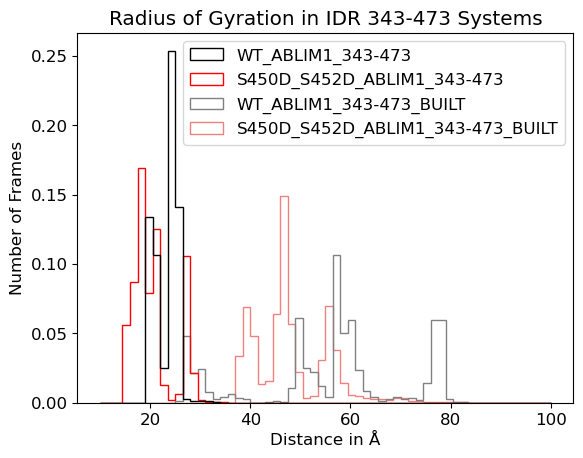

In [35]:
#HISTOGRAM OF MEAN ROG FOR ALL C-TERM SYSTEMS
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
trajectory= 'abm_ProtIon_trimmed_concat.xtc'
#print(trajectory)
topology= 'abm_ProtIon_rep1_start.pdb'
print(path)
x_multi=[]
systems=['WT_ABLIM1_343-473','S450D_S452D_ABLIM1_343-473','WT_ABLIM1_343-473_BUILT','S450D_S452D_ABLIM1_343-473_BUILT']
n_bins=100
color_num=0
colors=['black','red','gray','lightcoral']

fig,ax = plt.subplots()
for system in systems:
    os.chdir(path+'/'+system)
    sys_mean=system + ' mean'
    traj=pt.iterload(trajectory,topology)


    #pytraj radius of gyration calculated for the backbone atoms
    data=pt.radgyr(traj, mask='@BB')

    print('check in 1')
    multiple_lists = [data]#,data4,data5,data6,data7]
    arrays = [np.array(x) for x in multiple_lists]
    means=[np.mean(k) for k in zip(*arrays)]
    #print(means)
    #print(len(means))
    x_multi.append(means[10:10000])

    #legend=system+ ' mean'

n_bins=60

bin_counts,bin_edges,bars=ax.hist(x_multi, n_bins, histtype='step',range=(10,100),color=colors,label=systems,density=True)
#get andles and labels
handles, labels = plt.gca().get_legend_handles_labels() 
#set order
order = [3,2,1,0] 

# pass handle & labels lists along with order as below 
plt.legend([handles[i] for i in order], [labels[i] for i in order]) 
    
print('check in 2')
'''
fig,ax = plt.subplots()
for i in range(len(bin_counts)):
    #generate the outline/shape of the histogram for each system, NOT including the bars themselves
    bin_centres = (bin_edges[:-1] + bin_edges[1:])/2.
    plt.scatter(x=bin_centres,y=bin_counts[i],color=colors[i],label=systems[i])
    plt.plot(bin_centres,bin_counts[i],color=colors[i])

print('check in 3')
'''
title="Radius of Gyration in IDR 343-473 Systems"
plt.title(title)
#plt.xlim(12,24)
#plt.ylim(20,3000)
plt.xlabel("Distance in Å")
plt.ylabel("Number of Frames")
#ax.figure.set_size_inches(7.5,6.5)
#plt.legend()
#for b in bars:
#    ax.bar_label(b, labels=[v.astype(np.int64) if v > 0 else '' for v in b.datavalues])

name='COMBINED_C_TERM_ROG_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()


check in 2


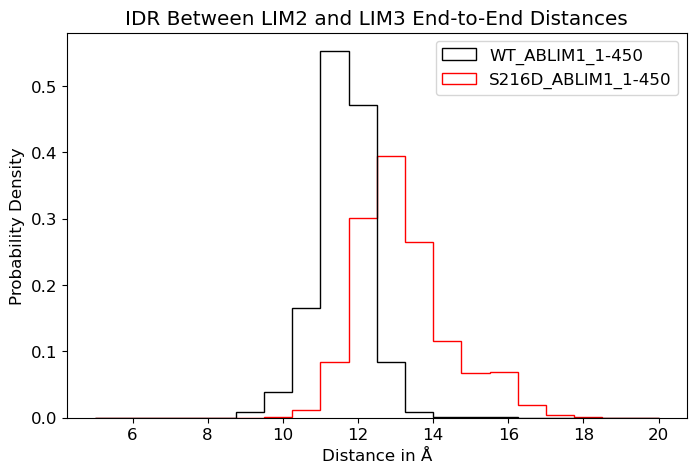

In [27]:
#END TO END DISTANCE OF LIM2 TO LIM3 FOR WT_ABLIM1

path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
template= 'abm_ProtIon_rep%s'
trajectory= [template % (str(i)+'.xtc') for i in range (1,4)]
#print(trajectory)
n_bins=20

topology= [template % (str(i)+'_start.pdb') for i in range (1,4)]

systems=['WT_ABLIM1_1-450','S216D_ABLIM1_1-450']
color_num=0
colors=['black','red']
x_multi=[]
fig,ax=plt.subplots()
#fig=plt.figure(figsize=(14,5))

for system in systems:
    os.chdir(path+'/'+system)
    if system=='WT_ABLIM1_1-450':
        ends='@486 @506'
    elif system=='S216D_ABLIM1_1-450':
        ends='@486 @507'

    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    #traj4=pt.iterload(trajectory[3],topology[3])
    #traj5=pt.iterload(trajectory[4],topology[4])
    #traj6=pt.iterload(trajectory[5],topology[5])
    #traj7=pt.iterload(trajectory[6],topology[6])

    end_distances1=pt.distance(traj1, mask=ends)
    end_distances2=pt.distance(traj2, mask=ends)
    end_distances3=pt.distance(traj3, mask=ends)
    #end_distances4=pt.distance(traj4, mask=ends)
    #end_distances5=pt.distance(traj5, mask=ends)
    #end_distances6=pt.distance(traj6, mask=ends)
    #end_distances7=pt.distance(traj7, mask=ends)
    #print(ZN_distances1)

    multiple_lists = [end_distances1,end_distances2,end_distances3]#,end_distances4,end_distances5,end_distances6,end_distances7]
    arrays = [np.array(x) for x in multiple_lists]
    means=[np.mean(k) for k in zip(*arrays)]
    sd=[np.std(k) for k in zip(*arrays)]

    x_multi.append(means)
    
    #x1=np.arange(len(end_distances1))
    #x2=np.arange(len(end_distances2))
    #x3=np.arange(len(end_distances3))
    x4=np.arange(0,len(means[0:]))

    #y1=np.array(end_distances1)
    #y2=np.array(end_distances2)
    #y3=np.array(end_distances3)
    y4=np.array(means[0:])
    #ax=plt.gca()
    #ax.set_ylim(10.0,31.0)
    #ax.plot(x1,y1,linestyle='-',color='red',label=system+' triplicate 1',zorder=1)
    #ax.plot(x2,y2,linestyle='-',color='blue',label=system+' triplicate 2',zorder=2)
    #ax.plot(x3,y3,linestyle='-',color='green',label=system+' triplicate 3',zorder=3)
    legend=system+ ' mean'
    #ax.plot(x4,y4,linestyle='-',color=colors[color_num],label=legend,zorder=4)
    color_num+=1
    #leg = ax.legend()
    title="IDR Between LIM2 and LIM3 End-to-End Distances"
    plt.title(title)
    plt.xlabel("Distance in Å")
    plt.ylabel("Probability Density")
    ax.figure.set_size_inches(8.0,5.0)


bin_counts,bin_edges,bars=ax.hist(x_multi, n_bins, histtype='step',range=(5,20),color=colors,label=systems,density=True)
#get andles and labels
handles, labels = plt.gca().get_legend_handles_labels() 
#set order
order = [1,0] 

# pass handle & labels lists along with order as below 
plt.legend([handles[i] for i in order], [labels[i] for i in order]) 
print('check in 2')
'''
#fig,ax = plt.subplots()
for i in range(len(bin_counts)):
    #generate the outline/shape of the histogram for each system, NOT including the bars themselves
    bin_centres = (bin_edges[:-1] + bin_edges[1:])/2.
    plt.scatter(x=bin_centres,y=bin_counts[i],color=colors[i],label=systems[i])
    plt.plot(bin_centres,bin_counts[i],color=colors[i])
'''
#title="End-to_End Distances in IDR between LIM2 & LIM3"
#ax.title(title)
#plt.xlim(12,24)
#plt.ylim(30,2500)
#ax.xlabel("Distance in Å")
#ax.ylabel("Number of Frames")
#ax.figure.set_size_inches(7.5,6.5)
#ax.legend()
#plt.legend()
name='IDR_216_end_to_end_distances.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

[2.5433227977733184]
[0.027414647477586974]
[2.5433227977733184, 2.506525389563106]
[0.027414647477586974, 0.03932503607076088]
[2.5433227977733184, 2.506525389563106, 2.220894443509907]
[0.027414647477586974, 0.03932503607076088, 0.027479057369062625]
[2.5433227977733184, 2.506525389563106, 2.220894443509907, 2.729955030225975]
[0.027414647477586974, 0.03932503607076088, 0.027479057369062625, 0.38832026523867974]
[2.5825432479590824]
[0.03277982438418146]
[2.5825432479590824, 2.6528447586623467]
[0.03277982438418146, 0.05013768832051463]
[2.5825432479590824, 2.6528447586623467, 3.438213217162767]
[0.03277982438418146, 0.05013768832051463, 0.22311114961180736]
[2.5825432479590824, 2.6528447586623467, 3.438213217162767, 2.5859267339679004]
[0.03277982438418146, 0.05013768832051463, 0.22311114961180736, 0.03413091751826741]
[0.027414647477586974, 0.03932503607076088, 0.027479057369062625, 0.38832026523867974]
[0.03277982438418146, 0.05013768832051463, 0.22311114961180736, 0.0341309175182

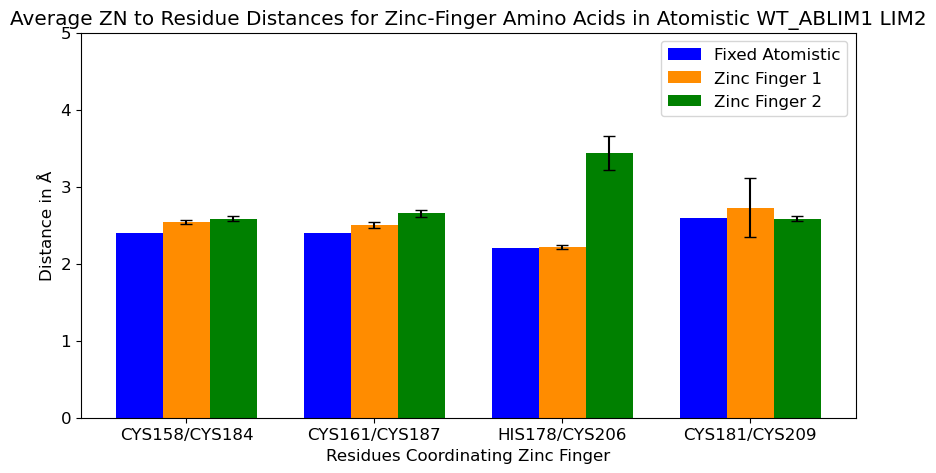

In [33]:
#DISTANCE BETWEEN ZNS AND COORDINATING RESIDUES IN ATOMISTIC WT_ABLIM1
#unfinished cell as it was deemed not super relevant for CG simulation that was constrained

import statistics

system='WT_ABLIM1_156-283_ATOMISTIC'

path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
os.chdir(path+'/'+system)

ABLIM1_constraints={'@1890':['@48','@82','@326','@371'],'@1891':['@411','@454','@752','@798']}

template= 'abm_ProtIon_rep%s'
trajectory= [template % (str(i)+'.xtc') for i in range (1,4)]
#print(trajectory)

topology= [template % (str(i)+'_start.pdb') for i in range (1,4)]

traj1=pt.iterload(trajectory[0],topology[0])
traj2=pt.iterload(trajectory[1],topology[1])
traj3=pt.iterload(trajectory[2],topology[2])
#traj4=pt.iterload(trajectory[3],topology[3])
#traj5=pt.iterload(trajectory[4],topology[4])
#traj6=pt.iterload(trajectory[5],topology[5])
#traj7=pt.iterload(trajectory[6],topology[6])
os.chdir(path)

fingers=['Fixed Atomistic Finger 1','Atomistic Zinc-Finger 1','Atomistic Zinc-Finger 2']

constraints=ABLIM1_constraints

#print(constraints)

fixed_dist=(2.4,2.4,2.2,2.6)
finger1_means=[]
finger2_means=[]
e1=[]
e2=[]

for key, value in constraints.items():
    finger_means=[]
    if key=='@1890':
        for i in range(0,4):
        #print(type(combo))
            zinc=key
            atom=value[i]
            pair=atom + ' ' + zinc
            #print(pair)
            distance1=pt.distance(traj1,pair)
            distance2=pt.distance(traj2,pair)
            distance3=pt.distance(traj3,pair)
            #distance4=pt.distance(traj4,pair)
            #distance5=pt.distance(traj5,pair)
            #distance6=pt.distance(traj6,pair)
            #distance7=pt.distance(traj7,pair)
            distances=[distance1,distance2,distance3]#,distance4,distance5,distance6,distance7]
            distance_arrays = [np.array(x) for x in distances]
            #print(mean_arrays)
            means=[np.mean(k) for k in zip(*distance_arrays)]
            true_mean=statistics.fmean(means)
            sds=[np.std(j) for j in zip(*distance_arrays)]
            e1.append(np.std(sds))
            #print(true_mean)
            finger1_means.append(true_mean)
            #print(len(means))
            #print(type(means))
            print(finger1_means)
            print(e1)
            #print(len(finger_means))
            #final_array=[np.array(j) for j in finger_means]
            #final_means=[np.mean(l) for l in zip(*final_array)]
            #finger1_means.append(final_means)
        #print(len(finger1_means))
        #print(finger1_means)
    else:
        for i in range(0,4):
        #print(type(combo))
            zinc=key
            atom=value[i]
            pair=atom + ' ' + zinc
            #print(pair)
            distance1=pt.distance(traj1,pair)
            distance2=pt.distance(traj2,pair)
            distance3=pt.distance(traj3,pair)
            #distance4=pt.distance(traj4,pair)
            #distance5=pt.distance(traj5,pair)
            #distance6=pt.distance(traj6,pair)
            #distance7=pt.distance(traj7,pair)
            distances=[distance1,distance2,distance3]#,distance4,distance5,distance6,distance7]
            distance_arrays = [np.array(x) for x in distances]
            #print(mean_arrays)
            means=[np.mean(k) for k in zip(*distance_arrays)]
            sds=[np.std(j) for j in zip(*distance_arrays)]
            e2.append(np.std(sds))
            true_mean=statistics.fmean(means)
            #print(true_mean)
            finger2_means.append(true_mean)
            print(finger2_means)
            print(e2)
            #final_array=[np.array(j) for j in finger_means]
            #final_means=[np.mean(l) for l in zip(*final_array)]
            #finger2_means.append(final_means)
        #print(len(finger2_means))
        #print(finger2_means)

#print(finger1_means)
#print(len(finger1_means))

N=4
# Specify the values of blue bars (height)
#blue_bar = (2.1,2.8,2.9,3.1)
# Specify the values of orange bars (height)
#orange_bar = (1.9, 2.8, 2.4,2.8)

# Position of bars on x-axis
ind = np.arange(N)

# Figure size
plt.figure(figsize=(10,5))

# Width of a bar
width = 0.25

#print(finger1_means)
print(e1)
print(e2)
# Plotting
plt.bar(ind, fixed_dist , width, label='Fixed Atomistic',color='blue')
plt.bar(ind+width, finger1_means, width,yerr=e1,capsize=4,label='Zinc Finger 1',color='darkorange')
plt.bar(ind+width + width, finger2_means, width,yerr=e2,capsize=4,label='Zinc Finger 2',color='green')

plt.xlabel('Residues Coordinating Zinc Finger')
plt.ylabel('Distance in Å')
plt.title('Average ZN to Residue Distances for Zinc-Finger Amino Acids in Atomistic WT_ABLIM1 LIM2')
plt.ylim(0,5)
# xticks()
# First argument - A list of positions at which ticks should be placed
# Second argument -  A list of labels to place at the given locations
plt.xticks(ind + width, ('CYS158/CYS184','CYS161/CYS187','HIS178/CYS206','CYS181/CYS209'))

# Finding the best position for legends and putting it
plt.legend(loc='best')
os.chdir(path)
name='ATOMISTIC_WT_ABLIM1_LIM2_ZN_Fingers.png'
plt.gcf().savefig(name,dpi=300)
plt.show()



[2.5487833370712294]
[0.029473388946091666]
[2.5487833370712294, 2.535194554537758]
[0.029473388946091666, 0.03764241100744159]
[2.5487833370712294, 2.535194554537758, 2.9876189401279785]
[0.029473388946091666, 0.03764241100744159, 0.6589255949603383]
[2.5487833370712294, 2.535194554537758, 2.9876189401279785, 3.0035472657526054]
[0.029473388946091666, 0.03764241100744159, 0.6589255949603383, 0.47139337227815953]
[2.585151986034154]
[0.03275381598683119]
[2.585151986034154, 2.6753848075965885]
[0.03275381598683119, 0.0488921335289505]
[2.585151986034154, 2.6753848075965885, 2.6185489462885556]
[0.03275381598683119, 0.0488921335289505, 0.040151010236746526]
[2.585151986034154, 2.6753848075965885, 2.6185489462885556, 3.1968224430451615]
[0.03275381598683119, 0.0488921335289505, 0.040151010236746526, 0.5050146258500137]
[0.029473388946091666, 0.03764241100744159, 0.6589255949603383, 0.47139337227815953]
[0.03275381598683119, 0.0488921335289505, 0.040151010236746526, 0.5050146258500137]


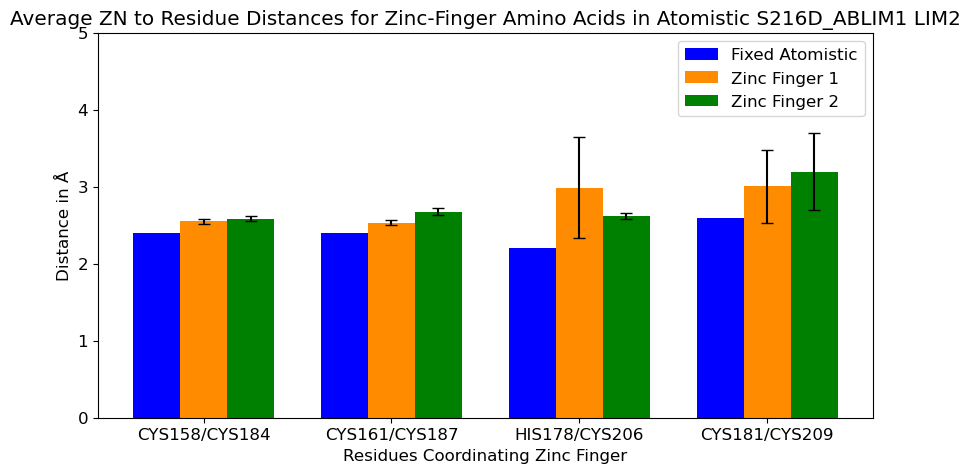

In [30]:
#DISTANCE BETWEEN ZNS AND COORDINATING RESIDUES IN ATOMISTIC S216D_ABLIM1
#unfinished cell as it was deemed not super relevant for CG simulation that was constrained

import statistics

system='S216D_ABLIM1_156-283_ATOMISTIC'

path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
os.chdir(path+'/'+system)

ABLIM1_constraints={'@1891':['@48','@82','@326','@371'],'@1892':['@411','@454','@752','@798']}

template= 'abm_ProtIon_rep%s'
trajectory= [template % (str(i)+'.xtc') for i in range (1,4)]
#print(trajectory)

topology= [template % (str(i)+'_start.pdb') for i in range (1,4)]

traj1=pt.iterload(trajectory[0],topology[0])
traj2=pt.iterload(trajectory[1],topology[1])
traj3=pt.iterload(trajectory[2],topology[2])
#traj4=pt.iterload(trajectory[3],topology[3])
#traj5=pt.iterload(trajectory[4],topology[4])
#traj6=pt.iterload(trajectory[5],topology[5])
#traj7=pt.iterload(trajectory[6],topology[6])
os.chdir(path)

fingers=['Fixed Atomistic Finger 1','Atomistic Zinc-Finger 1','Atomistic Zinc-Finger 2']

constraints=ABLIM1_constraints

#print(constraints)

fixed_dist=(2.4,2.4,2.2,2.6)
finger1_means=[]
finger2_means=[]
e1=[]
e2=[]

for key, value in constraints.items():
    finger_means=[]
    if key=='@1891':
        for i in range(0,4):
        #print(type(combo))
            zinc=key
            atom=value[i]
            pair=atom + ' ' + zinc
            #print(pair)
            distance1=pt.distance(traj1,pair)
            distance2=pt.distance(traj2,pair)
            distance3=pt.distance(traj3,pair)
            #distance4=pt.distance(traj4,pair)
            #distance5=pt.distance(traj5,pair)
            #distance6=pt.distance(traj6,pair)
            #distance7=pt.distance(traj7,pair)
            distances=[distance1,distance2,distance3]#,distance4,distance5,distance6,distance7]
            distance_arrays = [np.array(x) for x in distances]
            #print(mean_arrays)
            means=[np.mean(k) for k in zip(*distance_arrays)]
            true_mean=statistics.fmean(means)
            sds=[np.std(j) for j in zip(*distance_arrays)]
            e1.append(np.std(sds))
            #print(true_mean)
            finger1_means.append(true_mean)
            #print(len(means))
            #print(type(means))
            print(finger1_means)
            print(e1)
            #print(len(finger_means))
            #final_array=[np.array(j) for j in finger_means]
            #final_means=[np.mean(l) for l in zip(*final_array)]
            #finger1_means.append(final_means)
        #print(len(finger1_means))
        #print(finger1_means)
    else:
        for i in range(0,4):
        #print(type(combo))
            zinc=key
            atom=value[i]
            pair=atom + ' ' + zinc
            #print(pair)
            distance1=pt.distance(traj1,pair)
            distance2=pt.distance(traj2,pair)
            distance3=pt.distance(traj3,pair)
            #distance4=pt.distance(traj4,pair)
            #distance5=pt.distance(traj5,pair)
            #distance6=pt.distance(traj6,pair)
            #distance7=pt.distance(traj7,pair)
            distances=[distance1,distance2,distance3]#,distance4,distance5,distance6,distance7]
            distance_arrays = [np.array(x) for x in distances]
            #print(mean_arrays)
            means=[np.mean(k) for k in zip(*distance_arrays)]
            sds=[np.std(j) for j in zip(*distance_arrays)]
            e2.append(np.std(sds))
            true_mean=statistics.fmean(means)
            #print(true_mean)
            finger2_means.append(true_mean)
            print(finger2_means)
            print(e2)
            #final_array=[np.array(j) for j in finger_means]
            #final_means=[np.mean(l) for l in zip(*final_array)]
            #finger2_means.append(final_means)
        #print(len(finger2_means))
        #print(finger2_means)

#print(finger1_means)
#print(len(finger1_means))

N=4
# Specify the values of blue bars (height)
#blue_bar = (2.1,2.8,2.9,3.1)
# Specify the values of orange bars (height)
#orange_bar = (1.9, 2.8, 2.4,2.8)

# Position of bars on x-axis
ind = np.arange(N)

# Figure size
plt.figure(figsize=(10,5))

# Width of a bar
width = 0.25

#print(finger1_means)
print(e1)
print(e2)
# Plotting
plt.bar(ind, fixed_dist , width, label='Fixed Atomistic',color='blue')
plt.bar(ind+width, finger1_means, width,yerr=e1,capsize=4,label='Zinc Finger 1',color='darkorange')
plt.bar(ind+width + width, finger2_means, width,yerr=e2,capsize=4,label='Zinc Finger 2',color='green')

plt.xlabel('Residues Coordinating Zinc Finger')
plt.ylabel('Distance in Å')
plt.title('Average ZN to Residue Distances for Zinc-Finger Amino Acids in Atomistic S216D_ABLIM1 LIM2')
plt.ylim(0,5)
# xticks()
# First argument - A list of positions at which ticks should be placed
# Second argument -  A list of labels to place at the given locations
plt.xticks(ind + width, ('CYS158/CYS184','CYS161/CYS187','HIS178/CYS206','CYS181/CYS209'))

# Finding the best position for legends and putting it
plt.legend(loc='best')
os.chdir(path)
name='ATOMISTIC_S216D_LIM2_ZN_Fingers.png'
plt.gcf().savefig(name,dpi=300)
plt.show()



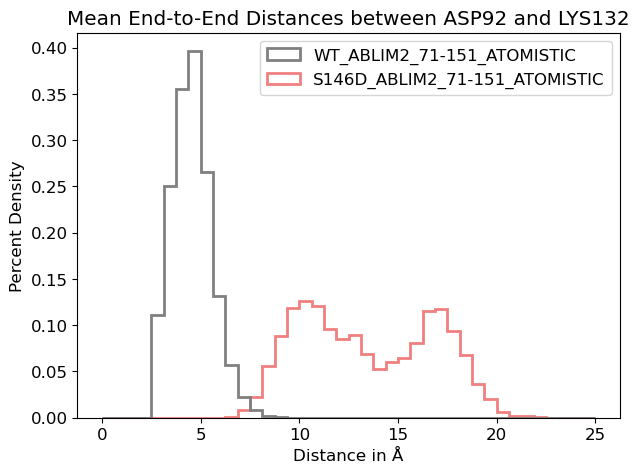

In [22]:
systems=['WT_ABLIM2_71-151_ATOMISTIC','S146D_ABLIM2_71-151_ATOMISTIC']

colors=['gray','lightcoral']
color_num=0
template= 'abm_ProtIon_rep%s'
trajectory= [template % (str(i)+'.xtc') for i in range (1,4)]
#print(trajectory)

x_multi=[]
topology= [template % (str(i)+'_start.pdb') for i in range (1,4)]
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
fig,ax=plt.subplots()
for system in systems:
    os.chdir(path+'/'+system)
    
    
    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    #traj4=pt.iterload(trajectory[3],topology[3])
    #traj5=pt.iterload(trajectory[4],topology[4])
    #traj6=pt.iterload(trajectory[5],topology[5])
    #traj7=pt.iterload(trajectory[6],topology[6])
    os.chdir(path)
    
    distance1=pt.distance(traj1,mask='@305 @908')
    distance2=pt.distance(traj2,mask='@305 @908')
    distance3=pt.distance(traj3,mask='@305 @908')
    distances=[distance1,distance2,distance3]#,distance4,distance5,distance6,distance7]
    distance_arrays = [np.array(x) for x in distances]
    #print(mean_arrays
    means=[np.mean(k) for k in zip(*distance_arrays)]
    sds=[np.std(j) for j in zip(*distance_arrays)]
    means=means[200:5000]
    x_multi.append(means)
    #ax.plot(x4,y4,linestyle='-',color=colors[color_num],label=system,zorder=4)
    #color_num+=1
    x4=np.arange(0,len(means))
    y4=np.array(means)

n_bins=40

bin_counts,bin_edges,bars=ax.hist(x_multi, n_bins, histtype='step',range=(0,25),color=colors,label=systems,density=True,linewidth=2.0)
#get andles and labels
handles, labels = plt.gca().get_legend_handles_labels() 
#set order
order = [1,0] 

# pass handle & labels lists along with order as below 
plt.legend([handles[i] for i in order], [labels[i] for i in order]) 
    
#leg = ax.legend()
title="Mean End-to-End Distances between ASP92 and LYS132"
plt.title(title)
plt.xlabel("Distance in Å")
plt.ylabel("Percent Density")
ax.figure.set_size_inches(7.0,5.0)
for i in range(len(x_multi)):
    true_mean=np.mean(x_multi[i])
    #print(true_mean)

name='ASP92_LYS132_mean_dist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()


pytraj.TrajectoryIterator, 10001 frames: 
Size: 0.234046 (GB)
<Topology: 1047 atoms, 458 residues, 1046 mols, PBC with box type = cubic>
           


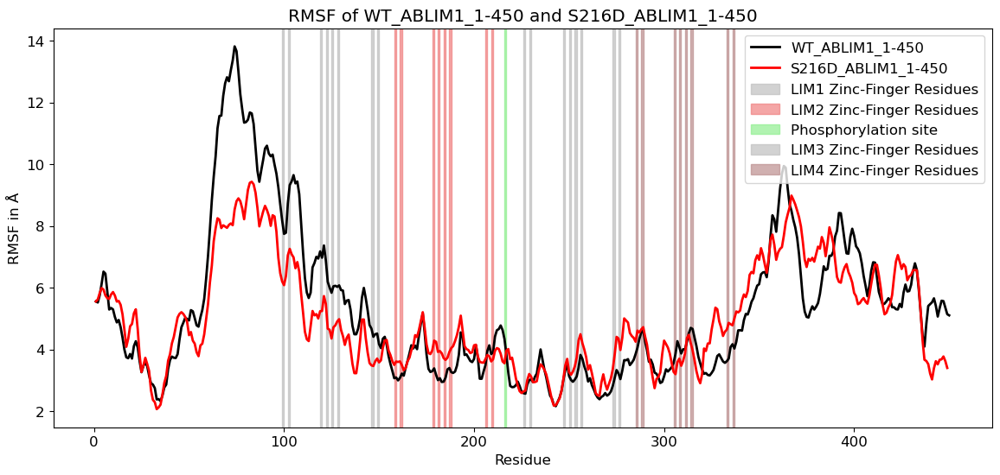

In [15]:
#OVERLAY WT_ABLIM1 & S216D_ABLIM1 RMSF
template= 'abm_ProtIon_rep%s'
trajectory= [template % (str(i)+'.xtc') for i in range (1,8)]
#print(trajectory)

topology= [template % (str(i)+'_start.pdb') for i in range (1,8)]



system1='WT_ABLIM1_1-450'
os.chdir(path+'/'+system1)

WT_traj1=pt.iterload(trajectory[0],topology[0])
WT_traj2=pt.iterload(trajectory[1],topology[1])
WT_traj3=pt.iterload(trajectory[2],topology[2])
#WT_traj4=pt.iterload(trajectory[3],topology[3])
#WT_traj5=pt.iterload(trajectory[4],topology[4])
#WT_traj6=pt.iterload(trajectory[5],topology[5])
#WT_traj7=pt.iterload(trajectory[6],topology[6])
print(WT_traj1)

system2='S216D_ABLIM1_1-450'
os.chdir(path+'/'+system2)
S76D_traj1=pt.iterload(trajectory[0],topology[0])
S76D_traj2=pt.iterload(trajectory[1],topology[1])
S76D_traj3=pt.iterload(trajectory[2],topology[2])
#S76D_traj4=pt.iterload(trajectory[3],topology[3])
#S76D_traj5=pt.iterload(trajectory[4],topology[4])
#S76D_traj6=pt.iterload(trajectory[5],topology[5])
#S76D_traj7=pt.iterload(trajectory[6],topology[6])
os.chdir(path)

#Calculate RMSF for each replicate of each system
WT_traj1_imposed= pt.superpose(WT_traj1,ref=0)
WTrmsf_data1=pt.rmsf(WT_traj1_imposed,mask='@BB',options='byres')
#print(WTrmsf_data1.T[0])

WT_traj2_imposed= pt.superpose(WT_traj2,ref=0)
WTrmsf_data2=pt.rmsf(WT_traj2_imposed,mask='@BB',options='byres')
#print(WTrmsf_data2.T[0])

WT_traj3_imposed= pt.superpose(WT_traj3,ref=0)
WTrmsf_data3=pt.rmsf(WT_traj3_imposed,mask='@BB',options='byres')

S76D_traj1_imposed= pt.superpose(S76D_traj1,ref=0)
S76Drmsf_data1=pt.rmsf(S76D_traj1_imposed,mask='@BB',options='byres')
#print(S76Drmsf_data1)

S76D_traj2_imposed= pt.superpose(S76D_traj2,ref=0)
S76Drmsf_data2=pt.rmsf(S76D_traj2_imposed,mask='@BB',options='byres')
#print(rmsf_data2)

S76D_traj3_imposed= pt.superpose(S76D_traj3,ref=0)
S76Drmsf_data3=pt.rmsf(S76D_traj3_imposed,mask='@BB',options='byres')
#print(rmsf_data3)



#generate list of RMSFs, convert to arrays, and calculate mean of all arrays
WT_multiple_lists = [WTrmsf_data1.T[1],WTrmsf_data2.T[1],WTrmsf_data3.T[1]]
WT_arrays = [np.array(x) for x in WT_multiple_lists]
WT_means=[np.mean(k) for k in zip(*WT_arrays)]

#print(len(WT_means))
#print(WT_means)


S76D_multiple_lists = [S76Drmsf_data1.T[1],S76Drmsf_data2.T[1],S76Drmsf_data3.T[1]]#,S76Drmsf_data4.T[1],S76Drmsf_data5.T[1],S76Drmsf_data6.T[1],S76Drmsf_data7.T[1]]
S76D_arrays = [np.array(x) for x in S76D_multiple_lists]
S76D_means=[np.mean(k) for k in zip(*S76D_arrays)]
#print(S76D_means)


fig=plt.figure(figsize=(14,6))
ax=plt.gca()
#ax.set_ylim(0.0,10.0)
ax.plot(WTrmsf_data1.T[0],WT_means,linestyle='-',linewidth=2.0,color='black',label='WT_ABLIM1_1-450')
ax.plot(S76Drmsf_data1.T[0],S76D_means,linestyle='-',linewidth=2.0,color='red',label='S216D_ABLIM1_1-450')

#FIX THIS TO BE CORRECT FOR THE ZINC FINGERS OF EACH LIM DOMAIN & THE MUTATION SITE
#Add highlighted regions to figure for ZN finger 1
LIM1_constraints=[99,102,119,122,125,128,146,149]
for constraint in LIM1_constraints:
    res=constraint
    if res==99:
        plt.axvspan(res,res+1, color='silver',alpha=0.7,label='LIM1 Zinc-Finger Residues')
    else:
        plt.axvspan(res,res+1, color='silver',alpha=0.7)

#Add highlighted regions to figure for ZN finger 2
LIM2_constraints=[158,161,178,181,184,187,206,209,216]
for constraint in LIM2_constraints:
    res=constraint
    if res==158:
        plt.axvspan(res,res+1, color='lightcoral',alpha=0.7,label='LIM2 Zinc-Finger Residues')
    elif res==216:
        #also highlight the phosphorylation site at the tail of ABLIM2 LIM2
        plt.axvspan(res,res+1, color='lightgreen',alpha=0.7,label='Phosphorylation site')
    else:
        plt.axvspan(res,res+1, color='lightcoral',alpha=0.7)

LIM3_constraints=[226,229,247,250,253,256,273,276]
for constraint in LIM3_constraints:
    res=constraint
    if res==226:
        plt.axvspan(res,res+1, color='silver',alpha=0.7,label='LIM3 Zinc-Finger Residues')
    else:
        plt.axvspan(res,res+1, color='silver',alpha=0.7)

LIM4_constraints=[285,288,305,308,311,314,333,336]
for constraint in LIM4_constraints:
    res=constraint
    if res==285:
        plt.axvspan(res,res+1, color='rosybrown',alpha=0.7,label='LIM4 Zinc-Finger Residues')
    else:
        plt.axvspan(res,res+1, color='rosybrown',alpha=0.7)

title="RMSF of " + system1 + ' and ' + system2
leg=ax.legend()
plt.title(title)
plt.xlabel("Residue")
plt.ylabel("RMSF in Å")

os.chdir(path)
name=system1 + '_' + system2 +'_RMSF.png'
plt.gcf().savefig(name,dpi=300)
plt.show()

1
2
3
4
5
6
7
8


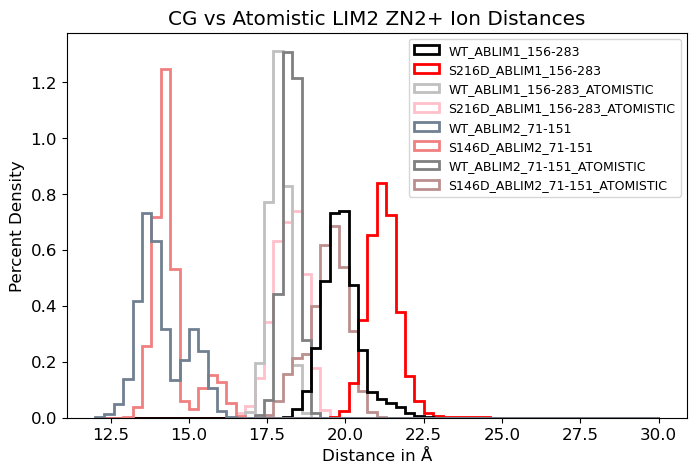

In [11]:
#HISTOGRAM OF DISTANCES BETWEEN STRUCTURES

systems=['WT_ABLIM2_71-151','S146D_ABLIM2_71-151','WT_ABLIM1_156-283','S216D_ABLIM1_156-283','WT_ABLIM2_71-151_ATOMISTIC','S146D_ABLIM2_71-151_ATOMISTIC','WT_ABLIM1_156-283_ATOMISTIC','S216D_ABLIM1_156-283_ATOMISTIC']
color_num=0

n_bins = 50

fig, ax = plt.subplots()

colors = ['slategray','lightcoral','black','red','gray','rosybrown','silver','pink']
#fig=plt.figure(figsize=(14,5))

x_multi=[]
for system in systems:
    os.chdir(path+'/'+system)
    if system=='WT_ABLIM1_156-283':
        zns=':128 :129'
    elif system=='S216D_ABLIM1_156-283':
        zns=':252 :253'
    elif system=='WT_ABLIM1_156-283_ATOMISTIC':
        zns=':129 :130'
    elif system=='S216D_ABLIM1_156-283_ATOMISTIC':
        zns=':129 :130'
    else:
        zns=':82 :83'

    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    
    ZN_distances1=pt.distance(traj1, mask=zns)
    ZN_distances2=pt.distance(traj2, mask=zns)
    ZN_distances3=pt.distance(traj3, mask=zns)


    #take each replicate distance in a system in a list
    multiple_lists = [ZN_distances1,ZN_distances2,ZN_distances3]#,ZN_distances4,ZN_distances5,ZN_distances6,ZN_distances7]
    #convert list to array
    arrays = [np.array(x) for x in multiple_lists]
    #calculate mean of all replicates' ZN distances to find the system's mean ZN distance
    means=[np.mean(k) for k in zip(*arrays)]

    #print(means)
    x_multi.append(means[50:])
    print(len(x_multi))
    legend=system+ ' mean'

#Find edges of histogram for each system

bin_counts,bin_edges,bars=ax.hist(x_multi, bins=60, histtype='step',range=(12,30),color=colors,label=systems,density=True,linewidth=2.0)
#get andles and labels
handles, labels = plt.gca().get_legend_handles_labels() 
#set order
#order = [0,1,2,3,4,5,6,7]
order = [5,4,1,0,7,6,3,2]
# pass handle & labels lists along with order as below 
plt.legend([handles[i] for i in order], [labels[i] for i in order],loc='best',prop={'size': 9}) 

'''
fig,ax = plt.subplots()
for i in range(len(bin_counts)):
    #generate the outline/shape of the histogram for each system, NOT including the bars themselves
    bin_centres = (bin_edges[:-1] + bin_edges[1:])/2.
    plt.scatter(x=bin_centres,y=bin_counts[i],color=colors[i],label=systems[i])
    plt.plot(bin_centres,bin_counts[i],color=colors[i])
'''

title="CG vs Atomistic LIM2 ZN2+ Ion Distances"
plt.title(title)
plt.xlabel("Distance in Å")
plt.ylabel("Percent Density")
ax.figure.set_size_inches(8.0,5.0)
#ax.legend()
#plt.xlim(12,36)
#plt.ylim(20,4000)
#for b in bars:
#    ax.bar_label(b, labels=[v.astype(np.int64) if v > 0 else '' for v in b.datavalues])

name='ATOM_vs_CG_ZN_Distances_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

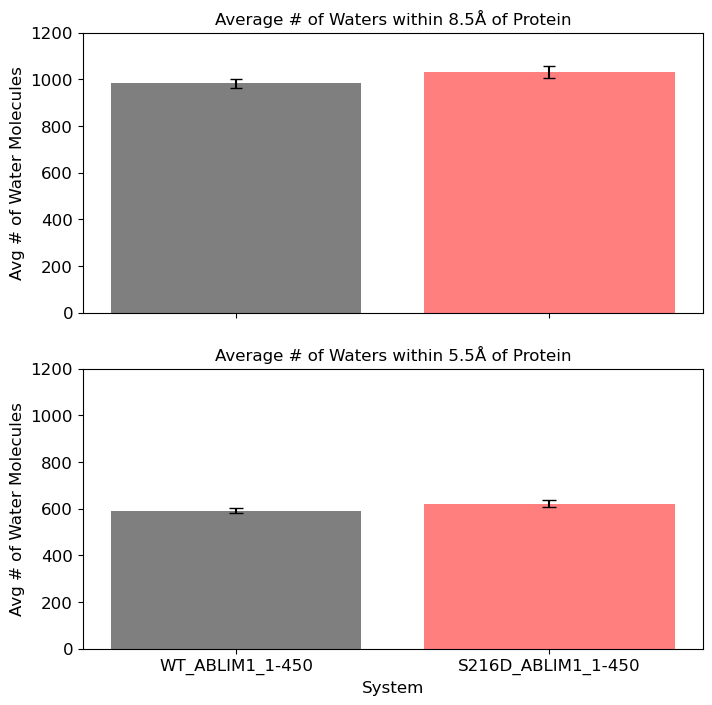

In [17]:
#Water shell MSSSP motif
systems=['WT_ABLIM1_1-450','S216D_ABLIM1_1-450']#,'WT_ABLIM1_156-283','S216D_ABLIM1_156-283']
colors=['black','red']#,'gray','lightcoral']
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
'''
lower_bar_means=[]
lower_bar_sds=[]
upper_bar_means=[]
upper_bar_sds=[]

#Different traj & top files for analysis that include the solution
water_template= 'abm_water_rep%s'
water_trajectory= [water_template % (str(i)+'.xtc') for i in range (1,4)]

water_topology= [water_template % (str(i)+'_start.pdb') for i in range (1,4)]

print(water_trajectory)
print(water_topology)

color_num=0
#colors=['black','red','gray','green']


fig,(ax1,ax2) = plt.subplots(nrows=2,sharex=True)

#ax1.figure.set_size_inches(20.0,15.0)
#ax2.figure.set_size_inches(20.0,10.0)
#fig=plt.figure(figsize=(25,10))
#title="Mean Watershell Distances of All Systems"
#plt.title(title)
#plt.xlabel("Frame")
#plt.ylabel("Distance in Å")
for system in systems:
    os.chdir(path+'/'+system)
    #mask of the system is the MSSSP motif residues of the system / MSSDP motif for phosphorylated system
    if system=='WT_ABLIM1_1-450':
        mask='!@WN'
    elif system=='S216D_ABLIM1_1-450':
        mask='!@WN'
    #elif system=='WT_ABLIM1_156-283':
    #    mask='!@WN'
    #elif system=='S216D_ABLIM1_156-283':
    #    mask='!@WN'

    sys_mean=system + ' mean'
    print(sys_mean)
    traj1=pt.iterload(water_trajectory[0],water_topology[0])
    traj2=pt.iterload(water_trajectory[1],water_topology[1])
    traj3=pt.iterload(water_trajectory[2],water_topology[2])
    #traj4=pt.iterload(water_trajectory[3],water_topology[3])
    #traj5=pt.iterload(water_trajectory[4],water_topology[4])
    #traj6=pt.iterload(water_trajectory[5],water_topology[5])
    #traj7=pt.iterload(water_trajectory[6],water_topology[6])
    #print(traj1)
    #print(traj2)
    #print(traj3)
    #set angstrom limits for finding # of water beads within the space
    lower_limit=5.5
    upper_limit=8.5
    print(system + ' check-in 1')
    data1=pt.watershell(traj1, solute_mask=mask,solvent_mask='@WN',lower=lower_limit,upper=upper_limit)
    data2=pt.watershell(traj2, solute_mask=mask,solvent_mask='@WN',lower=lower_limit,upper=upper_limit)
    data3=pt.watershell(traj3, solute_mask=mask,solvent_mask='@WN',lower=lower_limit,upper=upper_limit)
    #data4=pt.watershell(traj4, solute_mask=mask,solvent_mask='@WN',lower=lower_limit,upper=upper_limit)
    #data5=pt.watershell(traj5, solute_mask=mask,solvent_mask='@WN',lower=lower_limit,upper=upper_limit)
    #data6=pt.watershell(traj6, solute_mask=mask,solvent_mask='@WN',lower=lower_limit,upper=upper_limit)
    #data7=pt.watershell(traj7, solute_mask=mask,solvent_mask='@WN',lower=lower_limit,upper=upper_limit)
    #print(data1[0])
    #print(data2)
    #print(data3)
    lowers_list=[data1[0],data2[0],data3[0]]#,data4[0],data5[0],data6[0],data7[0]]
    uppers_list=[data1[1],data2[1],data3[1]]#,data4[1],data5[1],data6[1],data7[1]]

    print(system + ' check-in 2')
    #mean of lower limit mean/sd
    lower_arrays = [np.array(x) for x in lowers_list]
    lower_means=[np.mean(k) for k in zip(*lower_arrays)]
    lower_sds=[np.std(k) for k in zip(*lower_arrays)]
    #print(lower_means)
    #print(lower_sds)
    #mean of upper limit mean/sd
    upper_arrays = [np.array(x) for x in uppers_list]
    upper_means=[np.mean(k) for k in zip(*upper_arrays)]
    upper_sds=[np.std(k) for k in zip(*upper_arrays)]
    #print(upper_means)
    #print(upper_sds)
    print(system + ' check-in 3')
    #first 200 frames less representative of whole system progression over 2 microseconds, so cut them out
    lower_bar_means.append(np.mean(lower_means[100:]))
    lower_bar_sds.append(np.std(lower_sds[100:]))
    upper_bar_means.append(np.mean(upper_means[100:]))
    upper_bar_sds.append(np.std(upper_sds[100:]))

    x1=np.arange(0,len(lower_means))
    x2=np.arange(0,len(upper_means))
    y1=np.array(lower_means)
    y2=np.array(upper_means)
    e1=np.array(lower_sds)
    e2=np.array(upper_sds)
    #ax.set_ylim(0.0,40.0)

    print('Finished running ' + system)
    #lower_legend=system+' lower mean'
    #upper_legend=system+' upper mean'
    #ax1.plot(x2,y2,linestyle='-',color=colors[color_num],label=upper_legend)
    #ax2.plot(x1,y1,linestyle='-',color=colors[color_num],label=lower_legend)

    #ax1.set_title('Waters within ' + str(upper_limit) + 'Å of Hinge Motif')
    #ax1.set_ylabel('Number of Water Molecules')

    #ax2.set_title('Waters within ' + str(lower_limit) + 'Å of Hinge Motif')
    #ax2.set_ylabel('Number of Water Molecules')


    color_num+=1
    #leg = ax1.legend()
    #end=ax2.legend()

    #mean of
'''
#plt.xlabel("Frame (total 500ns)")
os.chdir(path)
#name='EXTENDED_Mean_Watershell_Atoms.png'
#plt.gcf().savefig(name,dpi=300)
#plt.show()


fig,(ax1,ax2) = plt.subplots(nrows=2,sharex=True)


ax1.figure.set_size_inches(8.0,8.0)
ax2.figure.set_size_inches(8.0,8.0)
x1=np.array(systems)
x2=np.array(systems)
y1=np.array(lower_bar_means)
y2=np.array(upper_bar_means)
e1=np.array(lower_bar_sds)
e2=np.array(upper_bar_sds)
ax1.set_ylim(0.0,1200.0)
ax2.set_ylim(0.0,1200.0)

lower_legend=system+' lower mean'
upper_legend=system+' upper mean'
ax1.bar(x2,y2,yerr=e2, align='center',alpha=0.5,color=colors,capsize=4)
ax2.bar(x1,y1,yerr=e1, align='center',alpha=0.5,color=colors,capsize=5)

ax1.set_title('Average # of Waters within ' + str(upper_limit) + 'Å of Protein',size=12.0)
ax1.set_ylabel('Avg # of Water Molecules')

ax2.set_title('Average # of Waters within ' + str(lower_limit) + 'Å of Protein',size=12.0)
ax2.set_ylabel('Avg # of Water Molecules')
ax2.set_xlabel('System',size=12.0)

os.chdir(path)
name='EXTENDED_Average_Waters.png'
plt.gcf().savefig(name,dpi=300)
plt.show()

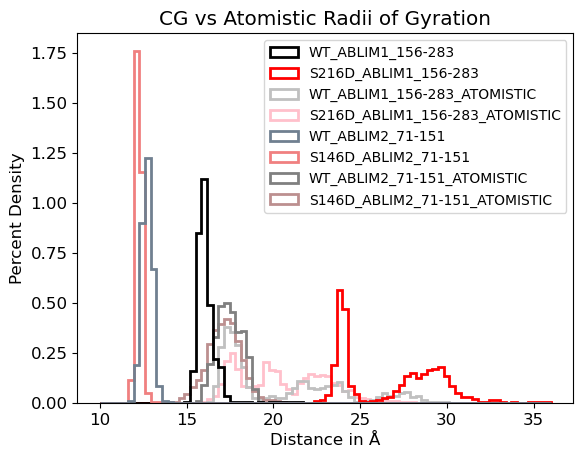

In [21]:
#HISTOGRAM OF DISTANCES BETWEEN STRUCTURES

systems=['WT_ABLIM2_71-151','S146D_ABLIM2_71-151','WT_ABLIM1_156-283','S216D_ABLIM1_156-283','WT_ABLIM2_71-151_ATOMISTIC','S146D_ABLIM2_71-151_ATOMISTIC','WT_ABLIM1_156-283_ATOMISTIC','S216D_ABLIM1_156-283_ATOMISTIC']
color_num=0
colors = ['slategray','lightcoral','black','red','gray','rosybrown','silver','pink']

n_bins = 50

fig, ax = plt.subplots()

#fig=plt.figure(figsize=(14,5))

x_multi=[]
#colors = ['slategray','lightcoral','black','red','gray','rosybrown','lightsteelblue']
#fig=plt.figure(figsize=(14,5))

for system in systems:
    os.chdir(path+'/'+system)
    traj1=pt.iterload(trajectory[0],topology[0])
    traj2=pt.iterload(trajectory[1],topology[1])
    traj3=pt.iterload(trajectory[2],topology[2])
    
    if system in ('WT_ABLIM2_71-151','S146D_ABLIM2_71-151','WT_ABLIM1_156-283'):
        data1=pt.radgyr(traj1, mask='@BB')
        data2=pt.radgyr(traj2, mask='@BB')
        data3=pt.radgyr(traj3, mask='@BB')
        #data7=pt.radgyr(traj7, mask='@BB')
    elif system=='S216D_ABLIM1_156-283':
        data1=pt.radgyr(traj1, mask='@BB:60-:186')
        data2=pt.radgyr(traj2, mask='@BB:60-:186')
        data3=pt.radgyr(traj3, mask='@BB:60-:186')
    elif system in ('WT_ABLIM2_71-151_ATOMISTIC','S146D_ABLIM2_71-151_ATOMISTIC','WT_ABLIM1_156-283_ATOMISTIC','S216D_ABLIM1_156-283_ATOMISTIC'):
        data1=pt.radgyr(traj1, mask='@CA')
        data2=pt.radgyr(traj2, mask='@CA')
        data3=pt.radgyr(traj3, mask='@CA')
        
    multiple_lists = [data1,data2,data3]#,data4,data5,data6,data7]
    arrays = [np.array(x) for x in multiple_lists]
    means=[np.mean(k) for k in zip(*arrays)]
    #print(means)
    #print(len(means))
    x_multi.append(means[10:])

    #legend=system+ ' mean'

bin_counts,bin_edges,bars=ax.hist(x_multi, bins=80, histtype='step',range=(10,36),color=colors,label=systems,density=True,linewidth=2.0)
#get andles and labels
handles, labels = plt.gca().get_legend_handles_labels() 
#set order
order = [0,1,2,3,4,5,6,7]
#order = [4,3,2,1,0,6,5,7]
order = [5,4,1,0,7,6,3,2]
# pass handle & labels lists along with order as below 
plt.legend([handles[i] for i in order], [labels[i] for i in order],loc='best',prop={'size': 10}) 

title="CG vs Atomistic Radii of Gyration"
plt.title(title)
#plt.xlim(12,24)
#plt.ylim(20,6000)
plt.xlabel("Distance in Å")
plt.ylabel("Percent Density")
#ax.figure.set_size_inches(7.5,6.5)
#ax.legend()
#for b in bars:
#    ax.bar_label(b, labels=[v.astype(np.int64) if v > 0 else '' for v in b.datavalues])

name='atom_vs_CG_ROG_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

['-4407.10720472144', '-3219.52803060485', '-2497.03303817737', '-1985.51556394075', '-1343.5857810806', '-551.635422588938', '-96.7991764747339', '92421.0066759442', '100324.286803538', '107250.582294852', '118577.904374341', '133816.480861331', '154082.52074312']
<class 'float'>
['-4407.10720472144', '-3219.52803060485', '-2497.03303817737', '-1985.51556394075', '-1343.5857810806', '-551.635422588938', '-96.7991764747339', '2028.41409399527', '5424.77552756568', '11353.5935416821', '35661.9235029201', '63514.8813202462', '95608.3497140811']
[4.0, 4.05, 4.1, 4.1499999999999995, 4.199999999999999, 4.249999999999999, 4.299999999999999, 4.349999999999999, 4.399999999999999, 4.449999999999998, 4.499999999999998, 4.549999999999998, 4.599999999999998, 4.649999999999998, 4.6999999999999975, 4.749999999999997, 4.799999999999997, 4.849999999999997, 4.899999999999997, 4.949999999999997, 4.9999999999999964, 5.049999999999996, 5.099999999999996, 5.149999999999996, 5.199999999999996, 5.24999999999

ValueError: x and y must have same first dimension, but have shapes (8,) and (13,)

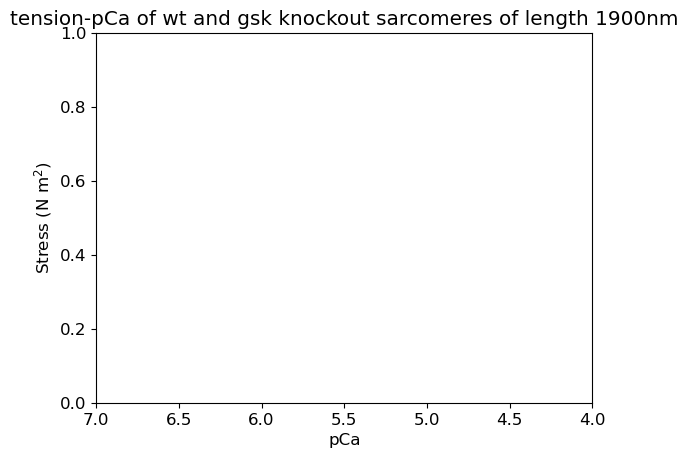

In [10]:
#MATLAB LDA tension
csv_file='hsl950'#,'hsl1050','hsl1100','hsl1200','hsl1300']

import numpy as np;
import scipy.optimize as opt;
from scipy.optimize import curve_fit

LDApath=path+'/tension_pCa'
os.chdir(LDApath)
#print(LDApath)
x_values=[9,6.4,6.2,6,5.8,5.6,5.4,4.5]

import csv 


#for csv_file in csvs:
#print(csv_file)
wt=csv_file + '_kforce5.csv'
#print(wt)
gsk=csv_file + '_kforce174.csv'
#wt_obj = open(wt, 'r')


# Return a reader object which will 
# iterate over lines in the given csvfile 
wt_obj = open(wt, 'r')
wt_csv = csv.reader(wt_obj)

#print(wt_csv)
list_of_wt = list(wt_csv) 
list_of_wt = list_of_wt[0]
print(list_of_wt)
for i in range(len(list_of_wt)):
    list_of_wt[i]=float(list_of_wt[i])
print(type(list_of_wt[0]))

wt50=5.78


gsk50=5.52


#print(type(list_of_gsk[0]))

#print(gsk)
gsk_obj = open(gsk, 'r')
gsk_csv = csv.reader(gsk_obj)
#print(gsk_csv)
list_of_gsk = list(gsk_csv)
list_of_gsk = list_of_gsk[0]
print(list_of_gsk)


for i in range(len(list_of_gsk)):
    list_of_gsk[i]=float(list_of_gsk[i])

fig,ax = plt.subplots()
#ax.set_yscale('log')


#optimized_wt_Parameters, pcov = opt.curve_fit(func, x_values, list_of_wt,maxfev=5000)
#optimized_gsk_Parameters, pcov = opt.curve_fit(func, x_values, list_of_gsk,maxfev=5000)

#optimized_wt_Parameters=optimized_wt_Parameters.tolist()
#print(optimized_wt_Parameters)
#optimized_gsk_Parameters=optimized_gsk_Parameters.tolist()
#print(type(optimized_gsk_Parameters))

plt.xlim(4,7)
#ax.set_yticks([-1000, 200000])
plt.gca().invert_xaxis()

hill_co=2

def hill_function(F,Ca50,Ca,n):
    return F/(1+(Ca50/Ca)**n)

F=150000

pCa_sequence=[]
y=4.0
for i in range(0,100):
    pCa_sequence.append(y)
    y+=0.05
print(pCa_sequence)

line_items=[]
for Ca in pCa_sequence:
    line_items.append(hill_function(F,wt50,Ca,-120))

#print(line_items)
#for i in range(
    
hill_co=2

def hill_GSK_function(G,Ca50,Ca,n):
    return G/(1+(Ca50/Ca)**n)

G=90000

GSK_sequence=[]
y=4.0
for i in range(0,100):
    GSK_sequence.append(y)
    y+=0.05
#print(GSK_sequence)

gsk_line_items=[]
for Ca in GSK_sequence:
    gsk_line_items.append(hill_GSK_function(G,gsk50,Ca,-70))



title="tension-pCa of wt and gsk knockout sarcomeres of length 1900nm"
plt.title(title)

plt.xlabel("pCa")
plt.ylabel('Stress (N m$^2$)')

plt.plot(x_values,list_of_wt,'ko',label='WT tension pCa')
plt.plot(x_values,list_of_gsk,'ro',label='GSK tension pCa')
plt.plot(pCa_sequence,line_items,'k-',label='WT curve fit')
plt.plot(GSK_sequence,gsk_line_items,'r-',label='GSK curve fit')

delta50=round(wt50-gsk50,3)
text="\u0394 pCa$_{50}$="+str(delta50)
plt.text(4.8,0,text)
plt.legend()
plt.legend(loc='best',fontsize=10)


name='pCa_hsl950.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

['-3006.70356272543', '-1654.06944131459', '-831.79546486963', '69018.1552445959', '111426.109043144', '137684.113158954', '153280.670876284', '174196.24210462']
<class 'float'>
['-3006.70356272543', '-1654.06944131459', '-831.79546486963', '1180.34527134696', '16538.9986735469', '58102.6095300079', '84812.1100098119', '116731.573709487']


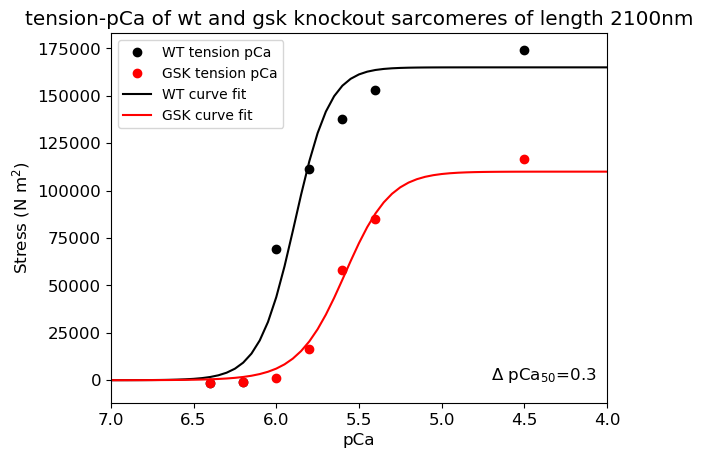

In [9]:
#MATLAB LDA tension
csv_file='hsl1050'#,'hsl1100','hsl1200','hsl1300']

import numpy as np;
import scipy.optimize as opt;
from scipy.optimize import curve_fit

LDApath=path+'/tension_pCa'
os.chdir(LDApath)
#print(LDApath)
x_values=[9,6.4,6.2,6,5.8,5.6,5.4,4.5]

import csv 


#for csv_file in csvs:
#print(csv_file)
wt=csv_file + '_kforce5.csv'
#print(wt)
gsk=csv_file + '_kforce174.csv'
#wt_obj = open(wt, 'r')


# Return a reader object which will 
# iterate over lines in the given csvfile 
wt_obj = open(wt, 'r')
wt_csv = csv.reader(wt_obj)

#print(wt_csv)
list_of_wt = list(wt_csv) 
list_of_wt = list_of_wt[0]
print(list_of_wt)
for i in range(len(list_of_wt)):
    list_of_wt[i]=float(list_of_wt[i])
print(type(list_of_wt[0]))




#print(type(list_of_gsk[0]))

#print(gsk)
gsk_obj = open(gsk, 'r')
gsk_csv = csv.reader(gsk_obj)
#print(gsk_csv)
list_of_gsk = list(gsk_csv)
list_of_gsk = list_of_gsk[0]
print(list_of_gsk)


for i in range(len(list_of_gsk)):
    list_of_gsk[i]=float(list_of_gsk[i])

fig,ax = plt.subplots()
#ax.set_yscale('log')


#optimized_wt_Parameters, pcov = opt.curve_fit(func, x_values, list_of_wt,maxfev=5000)
#optimized_gsk_Parameters, pcov = opt.curve_fit(func, x_values, list_of_gsk,maxfev=5000)

#optimized_wt_Parameters=optimized_wt_Parameters.tolist()
#print(optimized_wt_Parameters)
#optimized_gsk_Parameters=optimized_gsk_Parameters.tolist()
#print(type(optimized_gsk_Parameters))

plt.xlim(4,7)
#ax.set_yticks([-1000, 200000])
plt.gca().invert_xaxis()

wt50=5.89


gsk50=5.59

hill_co=2

def hill_function(F,Ca50,Ca,n):
    return F/(1+(Ca50/Ca)**n)

F=165000

pCa_sequence=[]
y=4.0
for i in range(0,100):
    pCa_sequence.append(y)
    y+=0.05
#print(pCa_sequence)

line_items=[]
for Ca in pCa_sequence:
    line_items.append(hill_function(F,wt50,Ca,-55))

#print(line_items)
#for i in range(
    
#hill_co=2

def hill_GSK_function(G,Ca50,Ca,n):
    return G/(1+(Ca50/Ca)**n)

G=110000

GSK_sequence=[]
y=4.0
for i in range(0,100):
    GSK_sequence.append(y)
    y+=0.05
#print(GSK_sequence)

gsk_line_items=[]
for Ca in GSK_sequence:
    gsk_line_items.append(hill_GSK_function(G,gsk50,Ca,-40))



title="tension-pCa of wt and gsk knockout sarcomeres of length 2100nm"
plt.title(title)

plt.xlabel("pCa")
plt.ylabel('Stress (N m$^2$)')

plt.plot(x_values,list_of_wt,'ko',label='WT tension pCa')
plt.plot(x_values,list_of_gsk,'ro',label='GSK tension pCa')
plt.plot(pCa_sequence,line_items,'k-',label='WT curve fit')
plt.plot(GSK_sequence,gsk_line_items,'r-',label='GSK curve fit')

delta50=round(wt50-gsk50,3)
text="\u0394 pCa$_{50}$="+str(delta50)
plt.text(4.7,0,text)
plt.legend()
plt.legend(loc='best',fontsize=10)


name='pCa_hsl1050.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

['-2306.70356272543', '-954.069441314587', '-131.79546486963', '2878.26212239648', '19666.3754506351', '59978.1894724488', '86231.0967564437', '117876.847979837']


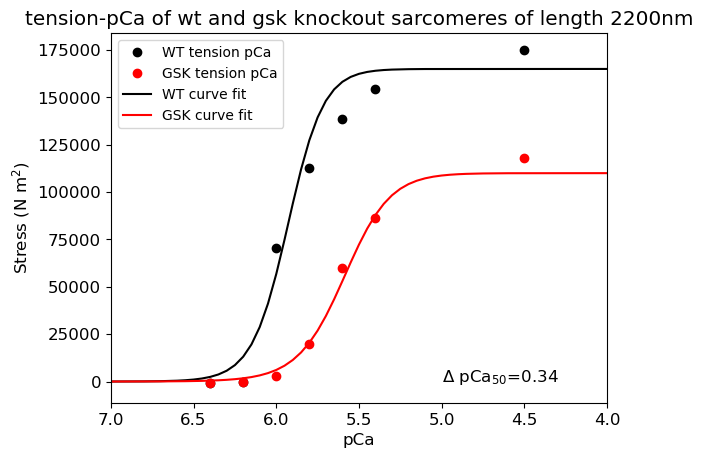

In [8]:
#MATLAB LDA tension-pCa
csv_file='hsl1100'#,'hsl1200','hsl1300']

import numpy as np;
import scipy.optimize as opt;
from scipy.optimize import curve_fit

LDApath=path+'/tension_pCa'
os.chdir(LDApath)
#print(LDApath)
x_values=[9,6.4,6.2,6,5.8,5.6,5.4,4.5]

import csv 


#for csv_file in csvs:
#print(csv_file)
wt=csv_file + '_kforce5.csv'
#print(wt)
gsk=csv_file + '_kforce174.csv'
#wt_obj = open(wt, 'r')


# Return a reader object which will 
# iterate over lines in the given csvfile 
wt_obj = open(wt, 'r')
wt_csv = csv.reader(wt_obj)

#print(wt_csv)
list_of_wt = list(wt_csv) 
list_of_wt = list_of_wt[0]
#print(list_of_wt)
for i in range(len(list_of_wt)):
    list_of_wt[i]=float(list_of_wt[i])
#print(type(list_of_wt[0]))




#print(type(list_of_gsk[0]))

#print(gsk)
gsk_obj = open(gsk, 'r')
gsk_csv = csv.reader(gsk_obj)
#print(gsk_csv)
list_of_gsk = list(gsk_csv)
list_of_gsk = list_of_gsk[0]
print(list_of_gsk)


for i in range(len(list_of_gsk)):
    list_of_gsk[i]=float(list_of_gsk[i])

fig,ax = plt.subplots()
#ax.set_yscale('log')


#optimized_wt_Parameters, pcov = opt.curve_fit(func, x_values, list_of_wt,maxfev=5000)
#optimized_gsk_Parameters, pcov = opt.curve_fit(func, x_values, list_of_gsk,maxfev=5000)

#optimized_wt_Parameters=optimized_wt_Parameters.tolist()
#print(optimized_wt_Parameters)
#optimized_gsk_Parameters=optimized_gsk_Parameters.tolist()
#print(type(optimized_gsk_Parameters))

plt.xlim(4,7)
#ax.set_yticks([-1000, 200000])
plt.gca().invert_xaxis()

wt50=5.93


gsk50=5.59

hill_co=2

def hill_function(F,Ca50,Ca,n):
    return F/(1+(Ca50/Ca)**n)

F=165000

pCa_sequence=[]
y=4.0
for i in range(0,1000):
    pCa_sequence.append(y)
    y+=0.05
#print(pCa_sequence)

line_items=[]
for Ca in pCa_sequence:
    line_items.append(hill_function(F,wt50,Ca,-55))

#print(line_items)
#for i in range(
    
#hill_co=2

def hill_GSK_function(G,Ca50,Ca,n):
    return G/(1+(Ca50/Ca)**n)

G=110000

GSK_sequence=[]
y=4.0
for i in range(0,1000):
    GSK_sequence.append(y)
    y+=0.05
#print(GSK_sequence)

gsk_line_items=[]
for Ca in GSK_sequence:
    gsk_line_items.append(hill_GSK_function(G,gsk50,Ca,-40))



title="tension-pCa of wt and gsk knockout sarcomeres of length 2200nm"
plt.title(title)

plt.xlabel("pCa")
plt.ylabel('Stress (N m$^2$)')

plt.plot(x_values,list_of_wt,'ko',label='WT tension pCa')
plt.plot(x_values,list_of_gsk,'ro',label='GSK tension pCa')
plt.plot(pCa_sequence,line_items,'k-',label='WT curve fit')
plt.plot(GSK_sequence,gsk_line_items,'r-',label='GSK curve fit')

delta50=round(wt50-gsk50,3)
text="\u0394 pCa$_{50}$="+str(delta50)
plt.text(5.0,0,text)
plt.legend()
plt.legend(loc='best',fontsize=10)


name='pCa_hsl1100.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

['493.089667528823', '2079.30102133229', '3493.27301901097', '7088.61138735071', '19612.7733765312', '49042.0788291027', '72462.0059804482', '101988.553498258']


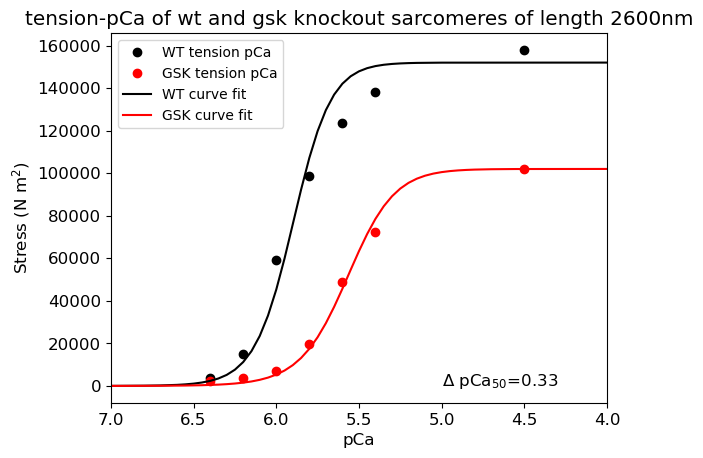

In [7]:
csv_file='hsl1300'

import numpy as np;
import scipy.optimize as opt;
from scipy.optimize import curve_fit

LDApath=path+'/tension_pCa'
os.chdir(LDApath)
#print(LDApath)
x_values=[9,6.4,6.2,6,5.8,5.6,5.4,4.5]

import csv 


#for csv_file in csvs:
#print(csv_file)
wt=csv_file + '_kforce5.csv'
#print(wt)
gsk=csv_file + '_kforce174.csv'
#wt_obj = open(wt, 'r')


# Return a reader object which will 
# iterate over lines in the given csvfile 
wt_obj = open(wt, 'r')
wt_csv = csv.reader(wt_obj)

#print(wt_csv)
list_of_wt = list(wt_csv) 
list_of_wt = list_of_wt[0]
#print(list_of_wt)
for i in range(len(list_of_wt)):
    list_of_wt[i]=float(list_of_wt[i])
#print(type(list_of_wt[0]))




#print(type(list_of_gsk[0]))

#print(gsk)
gsk_obj = open(gsk, 'r')
gsk_csv = csv.reader(gsk_obj)
#print(gsk_csv)
list_of_gsk = list(gsk_csv)
list_of_gsk = list_of_gsk[0]
print(list_of_gsk)


for i in range(len(list_of_gsk)):
    list_of_gsk[i]=float(list_of_gsk[i])

fig,ax = plt.subplots()
#ax.set_yscale('log')


#optimized_wt_Parameters, pcov = opt.curve_fit(func, x_values, list_of_wt,maxfev=5000)
#optimized_gsk_Parameters, pcov = opt.curve_fit(func, x_values, list_of_gsk,maxfev=5000)

#optimized_wt_Parameters=optimized_wt_Parameters.tolist()
#print(optimized_wt_Parameters)
#optimized_gsk_Parameters=optimized_gsk_Parameters.tolist()
#print(type(optimized_gsk_Parameters))

plt.xlim(4,7)
#ax.set_yticks([-1000, 200000])
plt.gca().invert_xaxis()

wt50=5.90


gsk50=5.57

hill_co=2

def hill_function(F,Ca50,Ca,n):
    return F/(1+(Ca50/Ca)**n)

F=152000

pCa_sequence=[]
y=4.0
for i in range(0,1000):
    pCa_sequence.append(y)
    y+=0.05
#print(pCa_sequence)

line_items=[]
for Ca in pCa_sequence:
    line_items.append(hill_function(F,wt50,Ca,-51))

#print(line_items)
#for i in range(
    
#hill_co=2

def hill_GSK_function(G,Ca50,Ca,n):
    return G/(1+(Ca50/Ca)**n)

G=102000

GSK_sequence=[]
y=4.0
for i in range(0,1000):
    GSK_sequence.append(y)
    y+=0.05
#print(GSK_sequence)

gsk_line_items=[]
for Ca in GSK_sequence:
    gsk_line_items.append(hill_GSK_function(G,gsk50,Ca,-39))



title="tension-pCa of wt and gsk knockout sarcomeres of length 2600nm"
plt.title(title)

plt.xlabel("pCa")
plt.ylabel('Stress (N m$^2$)')

plt.plot(x_values,list_of_wt,'ko',label='WT tension pCa')
plt.plot(x_values,list_of_gsk,'ro',label='GSK tension pCa')
plt.plot(pCa_sequence,line_items,'k-',label='WT curve fit')
plt.plot(GSK_sequence,gsk_line_items,'r-',label='GSK curve fit')


delta50=round(wt50-gsk50,3)
text="\u0394 pCa$_{50}$="+str(delta50)
plt.text(5.0,0,text)
plt.legend()
plt.legend(loc='best',fontsize=10)


name='pCa_hsl1300.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

['-4407.10720472144', '-3219.52803060485', '-2497.03303817737', '-1985.51556394075', '-1343.5857810806', '-551.635422588938', '-96.7991764747339', '2028.41409399527', '5424.77552756568', '11353.5935416821', '35661.9235029201', '63514.8813202462', '95608.3497140811']
[-4407.10720472144, -3219.52803060485, -2497.03303817737, -1985.51556394075, -1343.5857810806, -551.635422588938, -96.7991764747339, 2028.41409399527, 5424.77552756568, 11353.5935416821, 35661.9235029201, 63514.8813202462, 95608.3497140811]


ValueError: x and y must have same first dimension, but have shapes (13,) and (8,)

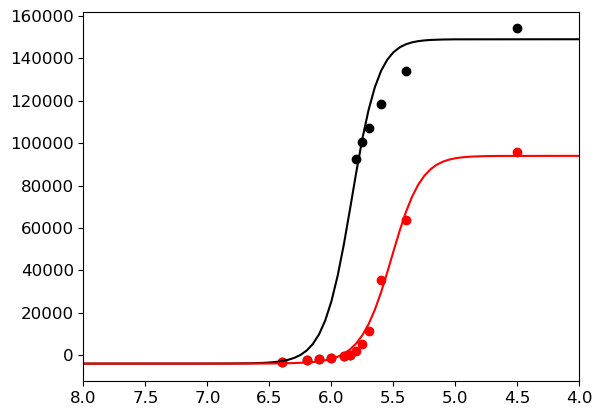

In [6]:
csv_file='hsl950'

import numpy as np;
import scipy.optimize as opt;
from scipy.optimize import curve_fit

LDApath=path+'/tension_pCa'
os.chdir(LDApath)
#print(LDApath)
x_values=[9,6.4,6.2,6.1,6,5.9,5.85,5.8,5.75,5.7,5.6,5.4,4.5]

import csv 


wt=csv_file + '_kforce5.csv'
#print(wt)
gsk=csv_file + '_kforce174.csv'
#wt_obj = open(wt, 'r')



wt_obj = open(wt, 'r')
wt_csv = csv.reader(wt_obj)

#print(wt_csv)
list_of_wt = list(wt_csv) 
list_of_wt = list_of_wt[0]
#print(list_of_wt)
for i in range(len(list_of_wt)):
    list_of_wt[i]=float(list_of_wt[i])
#print(type(list_of_wt[0]))

gsk_obj = open(gsk, 'r')
gsk_csv = csv.reader(gsk_obj)
#print(gsk_csv)
list_of_gsk = list(gsk_csv)
list_of_gsk = list_of_gsk[0]
print(list_of_gsk)

for i in range(len(list_of_gsk)):
    list_of_gsk[i]=float(list_of_gsk[i])

fig,ax = plt.subplots()



plt.xlim(4,8)
plt.gca().invert_xaxis()

wt50=5.84
gsk50=5.52
F=153000
G=98000



def hill_function(F,Ca50,Ca,n):
    return F/(1+(Ca50/Ca)**n)-4000



pCa_sequence=[]
y=4.0
for i in range(0,1000):
    pCa_sequence.append(y)
    y+=0.05
#print(pCa_sequence)

line_items=[]
for Ca in pCa_sequence:
    line_items.append(hill_function(F,wt50,Ca,-53))

#print(line_items)
#for i in range(
    
#hill_co=2

def hill_GSK_function(G,Ca50,Ca,n):
    return G/(1+(Ca50/Ca)**n)-4000



GSK_sequence=[]
y=4.0
for i in range(0,1000):
    GSK_sequence.append(y)
    y+=0.05
#print(GSK_sequence)

gsk_line_items=[]
for Ca in GSK_sequence:
    gsk_line_items.append(hill_GSK_function(G,gsk50,Ca,-45))




#plot 1900nm stuff
plt.plot(x_values,list_of_wt,'ko',label='1900nm WT tension pCa')
plt.plot(x_values,list_of_gsk,'ro',label='1900nm GSK ko tension pCa')
plt.plot(pCa_sequence,line_items,'k-',label='1900nm WT curve fit')
plt.plot(GSK_sequence,gsk_line_items,'r-',label='1900nm GSK ko curve fit')


long_csv='hsl1300'
#LONG STUFF
long_wt=long_csv + '_kforce5.csv'
#print(wt)
long_gsk=long_csv + '_kforce174.csv'
#wt_obj = open(wt, 'r')



long_wt_obj = open(long_wt, 'r')
long_wt_csv = csv.reader(long_wt_obj)

#print(wt_csv)
list_of_long_wt = list(long_wt_csv) 
list_of_long_wt = list_of_long_wt[0]
#print(list_of_wt)
for i in range(len(list_of_long_wt)):
    list_of_long_wt[i]=float(list_of_long_wt[i])
#print(type(list_of_wt[0]))

long_gsk_obj = open(long_gsk, 'r')
long_gsk_csv = csv.reader(long_gsk_obj)
#print(gsk_csv)
list_of_long_gsk = list(long_gsk_csv)
list_of_long_gsk = list_of_long_gsk[0]
print(list_of_gsk)

for i in range(len(list_of_long_gsk)):
    list_of_long_gsk[i]=float(list_of_long_gsk[i])

long_wt50=5.86
long_gsk50=5.57
long_F=155000
long_G=101000


def long_hill_function(F,Ca50,Ca,n):
    return F/(1+(Ca50/Ca)**n)

def long_hill_GSK_function(G,Ca50,Ca,n):
    return G/(1+(Ca50/Ca)**n)

long_pCa_sequence=[]
y=4.0
for i in range(0,1000):
    long_pCa_sequence.append(y)
    y+=0.05
#print(pCa_sequence)

long_line_items=[]
for Ca in long_pCa_sequence:
    long_line_items.append(long_hill_function(long_F,long_wt50,Ca,-36))



long_GSK_sequence=[]
y=4.0
for i in range(0,1000):
    long_GSK_sequence.append(y)
    y+=0.05
#print(GSK_sequence)

long_gsk_line_items=[]
for Ca in long_GSK_sequence:
    long_gsk_line_items.append(long_hill_GSK_function(long_G,long_gsk50,Ca,-31))


#plot 2600nm stuff
plt.plot(x_values,list_of_long_wt,'o',label='2600nm WT tension pCa',color='gray')
plt.plot(x_values,list_of_long_gsk,'o',label='2600nm GSK ko tension pCa',color='lightcoral')
plt.plot(long_pCa_sequence,long_line_items,'-',label='2600nm WT curve fit',color='gray')
plt.plot(long_GSK_sequence,long_gsk_line_items,'-',label='2600nm GSK ko curve fit',color='lightcoral')

plt.text(5.5,20000,"\u0394 pCa = 2600nm - 1900nm", fontsize=9)
plt.plot([5.5,4.1],[19000,19000],color='black',linewidth=0.5)
wt_delta50=round(long_wt50-wt50,3)
text="WT \u0394 pCa$_{50}$= "+str(wt_delta50)
plt.text(5.3,10000,text,fontsize=9)
gsk_delta50=round(long_gsk50-gsk50,3)
gsk_text="GSK ko \u0394 pCa$_{50}$= "+str(gsk_delta50)
plt.text(5.4,0,gsk_text,fontsize=9)
plt.legend()
plt.legend(loc='best',fontsize=9)

title="tension-pCa of wt and gsk knockout sarcomeres of length 1900nm and 2600nm"
plt.title(title)

plt.xlabel("pCa")
plt.ylabel('Stress (N m$^2$)')
name='pCa_hsl950_vs_hsl1300.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

[-344.271151198233, 3306.76083581735, 8836.39138936911, 16844.3652521565, 33390.4810264617, 55405.0286019026, 66227.792891446, 76117.6017155869, 84913.2579214119, 92698.055658064, 105494.338718974, 122630.736403979, 144976.215546082]
[-906.703562725428, 1327.45817330131, 19604.2030386597, 47077.4820014136, 73618.0311376333, 96254.2157012387, 105972.602139986, 114658.852192698, 122377.433095295, 129205.155252081, 140517.947721, 155957.535043383, 176726.348328188]
[1408.08879001084, 7293.29590076726, 17101.1106754034, 30402.6482695445, 51722.1860456263, 75063.8683129076, 85851.034406521, 95662.980795963, 104446.209485455, 112239.407971293, 125134.819070534, 142579.087279426, 165544.592691047]


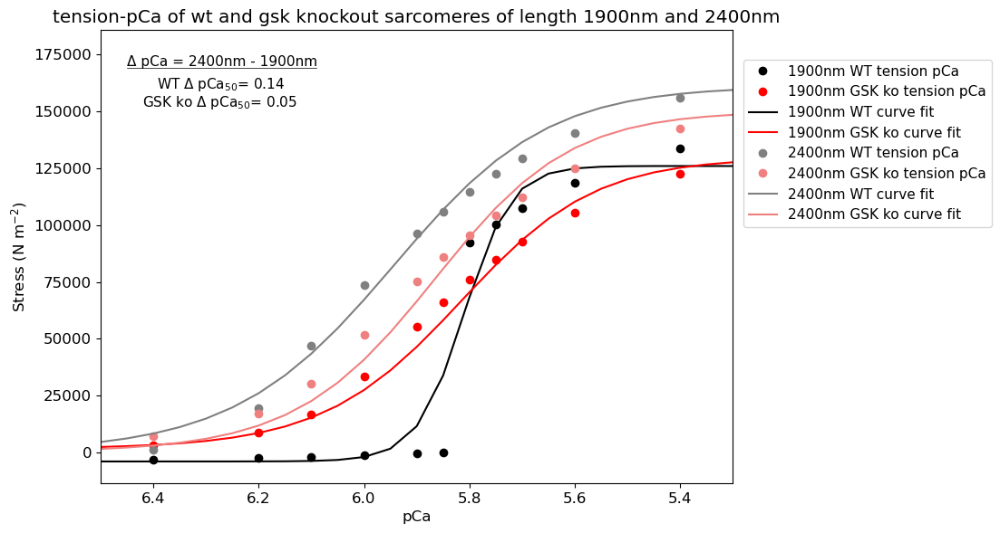

In [4]:
#MATLAB LDA tension-pCa
csv_file='hsl950'

import numpy as np;
import scipy.optimize as opt;
from scipy.optimize import curve_fit
import csv 
LDApath=path+'/tension_pCa'
os.chdir(LDApath)
#print(LDApath)
x_values=[9,6.4,6.2,6.1,6,5.9,5.85,5.8,5.75,5.7,5.6,5.4,4.5]

import csv 


wt=csv_file + '_kforce5.csv'
#print(wt)
gsk=csv_file + '_kforce174_k1_2_slack1000_lin7.csv'
#wt_obj = open(wt, 'r')



wt_obj = open(wt, 'r')
wt_csv = csv.reader(wt_obj)

#print(wt_csv)
list_of_wt = list(wt_csv) 
list_of_wt = list_of_wt[0]
#print(list_of_wt)
for i in range(len(list_of_wt)):
    list_of_wt[i]=float(list_of_wt[i])
#print(type(list_of_wt[0]))


gsk_obj = open(gsk, 'r')
gsk_csv = csv.reader(gsk_obj)
#print(gsk_csv)
list_of_gsk = list(gsk_csv)
list_of_gsk = list_of_gsk[0]
#print(list_of_gsk)

for i in range(len(list_of_gsk)):
    list_of_gsk[i]=float(list_of_gsk[i])
print(list_of_gsk)


fig,ax = plt.subplots()



plt.xlim(5.3,6.5)
plt.gca().invert_xaxis()

wt50=5.81
gsk50=5.82
#gsk50=5.51

F=130000
G=127000
#G=100000



def hill_function(F,Ca50,Ca,n):
    return F/(1+(Ca50/Ca)**n)-4000



pCa_sequence=[]
y=4.0
for i in range(0,1000):
    pCa_sequence.append(y)
    y+=0.05
#print(pCa_sequence)

line_items=[]
for Ca in pCa_sequence:
    line_items.append(hill_function(F,wt50,Ca,-130))

#print(line_items)
#for i in range(
    
#hill_co=2

def hill_GSK_function(G,Ca50,Ca,n):
    return (G+1000)/(1+(Ca50/Ca)**n)+1500 #-4000



GSK_sequence=[]
y=4.0
for i in range(0,1000):
    GSK_sequence.append(y)
    y+=0.05
#print(GSK_sequence)

gsk_line_items=[]
for Ca in GSK_sequence:
    gsk_line_items.append(hill_GSK_function(G,gsk50,Ca,-45))




#plot 1900nm stuff
plt.plot(x_values,list_of_wt,'ko',label='1900nm WT tension pCa')
plt.plot(x_values,list_of_gsk,'ro',label='1900nm GSK ko tension pCa')
plt.plot(pCa_sequence,line_items,'k-',label='1900nm WT curve fit')
plt.plot(GSK_sequence,gsk_line_items,'r-',label='1900nm GSK ko curve fit')


long_csv='hsl1200'
#LONG STUFF
long_wt=long_csv + '_kforce5.csv'
#print(wt)
long_gsk=long_csv + '_kforce174_k1_2_slack1000_lin7.csv'
#wt_obj = open(wt, 'r')



long_wt_obj = open(long_wt, 'r')
long_wt_csv = csv.reader(long_wt_obj)

#print(wt_csv)
list_of_long_wt = list(long_wt_csv) 
list_of_long_wt = list_of_long_wt[0]
#print(list_of_wt)
for i in range(len(list_of_long_wt)):
    list_of_long_wt[i]=float(list_of_long_wt[i])
#print(type(list_of_wt[0]))


print(list_of_long_wt)


long_gsk_obj = open(long_gsk, 'r')
long_gsk_csv = csv.reader(long_gsk_obj)
#print(gsk_csv)
list_of_long_gsk = list(long_gsk_csv)
list_of_long_gsk = list_of_long_gsk[0]
#print(list_of_gsk)

for i in range(len(list_of_long_gsk)):
    list_of_long_gsk[i]=float(list_of_long_gsk[i])


print(list_of_long_gsk)


long_wt50=5.95
long_gsk50=5.87
#long_gsk50=5.61
long_F=161000
long_G=150000
#long_G=120000


def long_hill_function(F,Ca50,Ca,n):
    return F/(1+(Ca50/Ca)**n)

def long_hill_GSK_function(G,Ca50,Ca,n):
    return G/(1+(Ca50/Ca)**n)

long_pCa_sequence=[]
y=4.0
for i in range(0,1000):
    long_pCa_sequence.append(y)
    y+=0.05
#print(pCa_sequence)

long_line_items=[]
for Ca in long_pCa_sequence:
    long_line_items.append(long_hill_function(long_F,long_wt50,Ca,-40))



long_GSK_sequence=[]
y=4.0
for i in range(0,1000):
    long_GSK_sequence.append(y)
    y+=0.05
#print(GSK_sequence)

long_gsk_line_items=[]
for Ca in long_GSK_sequence:
    long_gsk_line_items.append(long_hill_GSK_function(long_G,long_gsk50,Ca,-45))


#plot 2600nm stuff
plt.plot(x_values,list_of_long_wt,'o',label='2400nm WT tension pCa',color='gray')
plt.plot(x_values,list_of_long_gsk,'o',label='2400nm GSK ko tension pCa',color='lightcoral')
plt.plot(long_pCa_sequence,long_line_items,'-',label='2400nm WT curve fit',color='gray')
plt.plot(long_GSK_sequence,long_gsk_line_items,'-',label='2400nm GSK ko curve fit',color='lightcoral')


plt.plot([6.45,6.090],[169000,169000],color='black',linewidth=0.5)
wt_delta50=round(long_wt50-wt50,3)
text="WT \u0394 pCa$_{50}$= "+str(wt_delta50)
plt.text(6.45,170000,"\u0394 pCa = 2400nm - 1900nm", fontsize=11)
plt.text(6.394,160000,text,fontsize=11)
gsk_delta50=round(long_gsk50-gsk50,3)
gsk_text="GSK ko \u0394 pCa$_{50}$= "+str(gsk_delta50)
plt.text(6.421,152000,gsk_text,fontsize=11)
plt.legend()
plt.legend(bbox_to_anchor=(1.42,0.75),loc='center right',fontsize=11)

ax.figure.set_size_inches(9.0,6.5)
title="tension-pCa of wt and gsk knockout sarcomeres of length 1900nm and 2400nm"
plt.title(title)

plt.xlabel("pCa")
plt.ylabel('Stress (N m$^{-2}$)')
name='pCa_hsl950_vs_hsl1200_restored.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()


[-4407.10720472144, -3219.52803060485, -2497.03303817737, -1985.51556394075, -1343.5857810806, -551.635422588938, -96.7991764747339, 2028.41409399527, 5424.77552756568, 11353.5935416821, 35661.9235029201, 63514.8813202462, 95608.3497140811]
[-0.04609542176913411, -0.03367413034774599, -0.026117311360825735, -0.02076717744714221, -0.014053017179970404, -0.005769741076366406, -0.0010124552590251165, 0.0212158676523681, 0.056739558247669714, 0.11875106698981076, 0.373000094757078, 0.6643235816765886, 1.0]
[-0.005130551110814799, 0.007511376689774443, 0.11092971265526236, 0.26638632239482934, 0.41656511229961946, 0.5446511887547788, 0.5996423461610296, 0.6487931951141312, 0.6924685212644983, 0.7311029536588498, 0.7951160030764199, 0.8824803800832433, 1.0]
[-0.007546693432046144, 0.004837271808107893, 0.01679736897717875, 0.0289308571826067, 0.05157077560494004, 0.09867891632567023, 0.14028440757626162, 0.2092766248384301, 0.27370595189789654, 0.3580133389696145, 0.5290305344015733, 0.74085

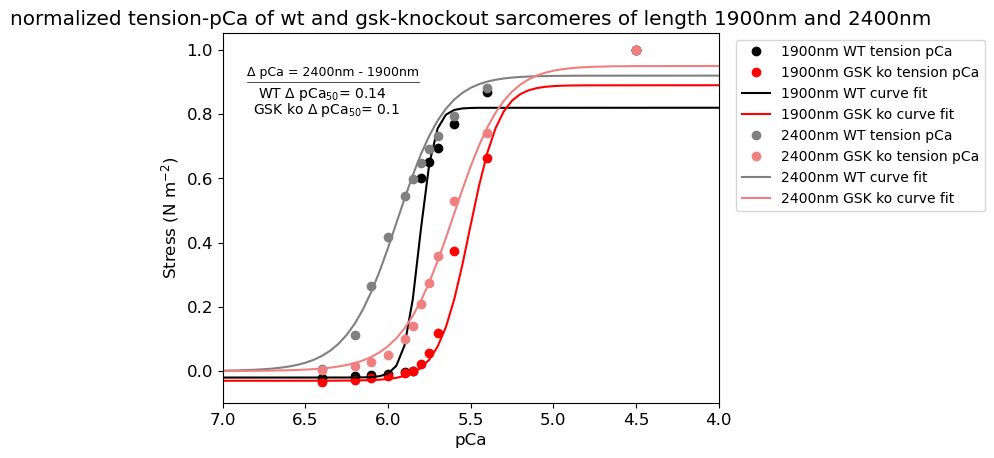

In [50]:
#MATLAB LDA tension-pCa
csv_file='hsl950'

import numpy as np;
import scipy.optimize as opt;
from scipy.optimize import curve_fit

LDApath=path+'/tension_pCa'
os.chdir(LDApath)
#print(LDApath)
x_values=[9,6.4,6.2,6.1,6,5.9,5.85,5.8,5.75,5.7,5.6,5.4,4.5]

import csv 


wt=csv_file + '_kforce5.csv'
#print(wt)
gsk=csv_file + '_kforce174.csv'
#wt_obj = open(wt, 'r')



wt_obj = open(wt, 'r')
wt_csv = csv.reader(wt_obj)

#print(wt_csv)
list_of_wt = list(wt_csv) 
list_of_wt = list_of_wt[0]
#print(list_of_wt)
for i in range(len(list_of_wt)):
    list_of_wt[i]=float(list_of_wt[i])
#print(type(list_of_wt[0]))

normalized_wt=[]
for i in range(len(list_of_wt)):
    normalized_wt.append(list_of_wt[i]/max(list_of_wt))
list_of_wt=normalized_wt

gsk_obj = open(gsk, 'r')
gsk_csv = csv.reader(gsk_obj)
#print(gsk_csv)
list_of_gsk = list(gsk_csv)
list_of_gsk = list_of_gsk[0]
#print(list_of_gsk)

for i in range(len(list_of_gsk)):
    list_of_gsk[i]=float(list_of_gsk[i])
print(list_of_gsk)


normalized_gsk=[]
for i in range(len(list_of_gsk)):
    normalized_gsk.append(list_of_gsk[i]/max(list_of_gsk))

list_of_gsk=normalized_gsk

print(list_of_gsk)

fig,ax = plt.subplots()



plt.xlim(4,7)
plt.gca().invert_xaxis()

wt50=5.81
gsk50=5.51
F=0.82
G=0.89



def hill_function(F,Ca50,Ca,n):
    return (F+0.02)/(1+(Ca50/Ca)**n)-0.02



pCa_sequence=[]
y=4.0
for i in range(0,1000):
    pCa_sequence.append(y)
    y+=0.05
#print(pCa_sequence)

line_items=[]
for Ca in pCa_sequence:
    line_items.append(hill_function(F,wt50,Ca,-130))

#print(line_items)
#for i in range(
    
#hill_co=2

def hill_GSK_function(G,Ca50,Ca,n):
    return (G+0.03)/(1+(Ca50/Ca)**n)-0.03



GSK_sequence=[]
y=4.0
for i in range(0,1000):
    GSK_sequence.append(y)
    y+=0.05
#print(GSK_sequence)

gsk_line_items=[]
for Ca in GSK_sequence:
    gsk_line_items.append(hill_GSK_function(G,gsk50,Ca,-60))




#plot 1900nm stuff
plt.plot(x_values,list_of_wt,'ko',label='1900nm WT tension pCa')
plt.plot(x_values,list_of_gsk,'ro',label='1900nm GSK ko tension pCa')
plt.plot(pCa_sequence,line_items,'k-',label='1900nm WT curve fit')
plt.plot(GSK_sequence,gsk_line_items,'r-',label='1900nm GSK ko curve fit')


long_csv='hsl1200'
#LONG STUFF
long_wt=long_csv + '_kforce5.csv'
#print(wt)
long_gsk=long_csv + '_kforce174.csv'
#wt_obj = open(wt, 'r')



long_wt_obj = open(long_wt, 'r')
long_wt_csv = csv.reader(long_wt_obj)

#print(wt_csv)
list_of_long_wt = list(long_wt_csv) 
list_of_long_wt = list_of_long_wt[0]
#print(list_of_wt)
for i in range(len(list_of_long_wt)):
    list_of_long_wt[i]=float(list_of_long_wt[i])
#print(type(list_of_wt[0]))

normalized_long_wt=[]
for i in range(len(list_of_long_wt)):
    normalized_long_wt.append(list_of_long_wt[i]/max(list_of_long_wt))

list_of_long_wt=normalized_long_wt

print(list_of_long_wt)


long_gsk_obj = open(long_gsk, 'r')
long_gsk_csv = csv.reader(long_gsk_obj)
#print(gsk_csv)
list_of_long_gsk = list(long_gsk_csv)
list_of_long_gsk = list_of_long_gsk[0]
#print(list_of_gsk)

for i in range(len(list_of_long_gsk)):
    list_of_long_gsk[i]=float(list_of_long_gsk[i])


normalized_long_gsk=[]
for i in range(len(list_of_long_gsk)):
    normalized_long_gsk.append(list_of_long_gsk[i]/max(list_of_long_gsk))

list_of_long_gsk=normalized_long_gsk

print(list_of_long_gsk)


long_wt50=5.95
long_gsk50=5.61
long_F=0.92
long_G=0.95


def long_hill_function(F,Ca50,Ca,n):
    return F/(1+(Ca50/Ca)**n)

def long_hill_GSK_function(G,Ca50,Ca,n):
    return G/(1+(Ca50/Ca)**n)

long_pCa_sequence=[]
y=4.0
for i in range(0,1000):
    long_pCa_sequence.append(y)
    y+=0.05
#print(pCa_sequence)

long_line_items=[]
for Ca in long_pCa_sequence:
    long_line_items.append(long_hill_function(long_F,long_wt50,Ca,-40))



long_GSK_sequence=[]
y=4.0
for i in range(0,1000):
    long_GSK_sequence.append(y)
    y+=0.05
#print(GSK_sequence)

long_gsk_line_items=[]
for Ca in long_GSK_sequence:
    long_gsk_line_items.append(long_hill_GSK_function(long_G,long_gsk50,Ca,-36))


#plot 2600nm stuff
plt.plot(x_values,list_of_long_wt,'o',label='2400nm WT tension pCa',color='gray')
plt.plot(x_values,list_of_long_gsk,'o',label='2400nm GSK ko tension pCa',color='lightcoral')
plt.plot(long_pCa_sequence,long_line_items,'-',label='2400nm WT curve fit',color='gray')
plt.plot(long_GSK_sequence,long_gsk_line_items,'-',label='2400nm GSK ko curve fit',color='lightcoral')

'''
plt.plot([6.45,6.036],[169000,169000],color='black',linewidth=0.5)
wt_delta50=round(long_wt50-wt50,3)
text="WT \u0394 pCa$_{50}$= "+str(wt_delta50)
plt.text(6.45,170000,"\u0394 pCa = 2400nm - 1900nm", fontsize=9)
plt.text(6.386,161000,text,fontsize=9)
gsk_delta50=round(long_gsk50-gsk50,3)
gsk_text="GSK ko \u0394 pCa$_{50}$= "+str(gsk_delta50)
plt.text(6.416,154000,gsk_text,fontsize=9)
'''
plt.plot([6.85,5.81],[0.9,0.9],color='black',linewidth=0.5)
wt_delta50=round(long_wt50-wt50,3)
text="WT \u0394 pCa$_{50}$= "+str(wt_delta50)
plt.text(6.85,0.92,"\u0394 pCa = 2400nm - 1900nm", fontsize=9)
plt.text(6.786,0.85,text,fontsize=10)
gsk_delta50=round(long_gsk50-gsk50,3)
gsk_text="GSK ko \u0394 pCa$_{50}$= "+str(gsk_delta50)
plt.text(6.816,0.8,gsk_text,fontsize=10)
plt.legend()
plt.legend(bbox_to_anchor=(1.55,0.75),loc='center right',fontsize=10)


title="normalized tension-pCa of wt and gsk-knockout sarcomeres of length 1900nm and 2400nm"
plt.title(title)

plt.xlabel("pCa")
plt.ylabel('Stress (N m$^{-2}$)')
name='pCa_hsl950_vs_hsl1200_normal.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()


ValueError: x and y must have same first dimension, but have shapes (8,) and (13,)

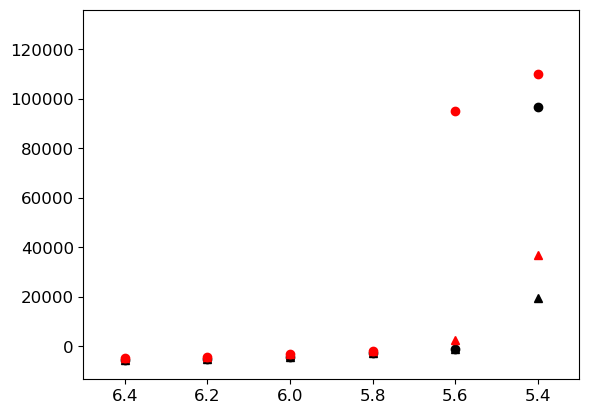

In [5]:
#MATLAB LDA tension-pCa
#csv_files=['hsl950','hsl1050','hsl1100','hsl1200','hsl1300']
LDApath=path+'/tension_pCa'
os.chdir(LDApath)
#print(LDApath)
x_values=[9,6.4,6.2,6,5.8,5.6,5.4,4.5]

csv_files=['hsl800','hsl850','hsl950','hsl1050','hsl1100','hsl1200','hsl1300','hsl1350']
colors=['black','red','blue','green','orange','purple','lightcoral','gray','lightblue']
color_num=0
fig,ax = plt.subplots()

for csv_file in csv_files:
    wt=csv_file + '_kforce5.csv'

    gsk=csv_file + '_kforce174.csv'
    
    wt_obj = open(wt, 'r')
    wt_csv = csv.reader(wt_obj)
    
    #print(wt_csv)
    list_of_wt = list(wt_csv) 
    list_of_wt = list_of_wt[0]
    #print(list_of_wt)
    for i in range(len(list_of_wt)):
        list_of_wt[i]=float(list_of_wt[i])

    gsk_obj = open(gsk, 'r')
    gsk_csv = csv.reader(gsk_obj)
    #print(gsk_csv)
    list_of_gsk = list(gsk_csv)
    list_of_gsk = list_of_gsk[0]
    #print(list_of_gsk)
    
    
    for i in range(len(list_of_gsk)):
        list_of_gsk[i]=float(list_of_gsk[i])
    
    plt.xlim(5.3,6.5)
    #plt.ylim(-10000,175000)
    plt.gca().invert_xaxis()
    wt_classification="WT " + csv_file
    ax.plot(x_values,list_of_wt,'o',color=colors[color_num],label=wt_classification)
    gsk_classification="GSK ko " + csv_file
    ax.plot(x_values,list_of_gsk,'^',color=colors[color_num],label=gsk_classification)
    color_num+=1
plt.title("WT vs GSK ko of all half-sarcomere lengths")
ax.figure.set_size_inches(7.0,7.0)
plt.legend(bbox_to_anchor=(1.3,0.7),loc='center right',fontsize=9)
plt.xlabel("pCa")
plt.ylabel('Stress (N m$^{-2}$)')
name='pCa_everything.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=300)
plt.show()

/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses
check in 1
51.32439617923725
WT_ABLIM1_343-473_BUILT: 51.32439617923725
check in 1
48.08662268329705
S450D_S452D_ABLIM1_343-473_BUILT: 48.08662268329705
check in 1
48.3412100317975
S450pS_S452pS_ABLIM1_343-473_BUILT: 48.3412100317975
check-in 2


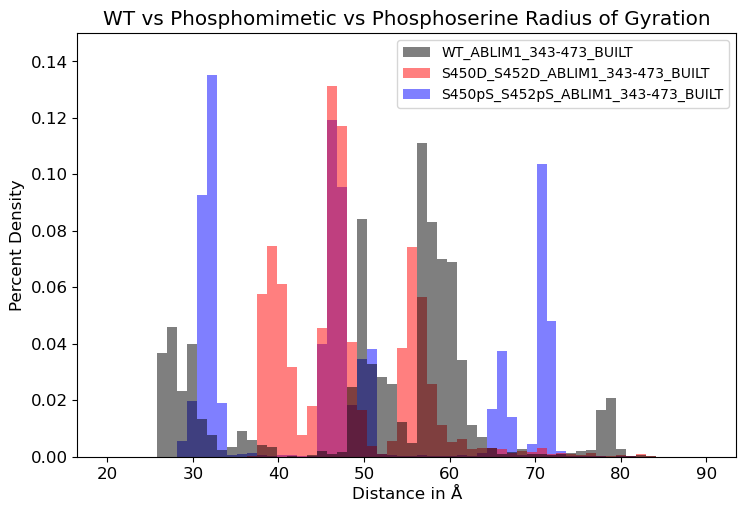

In [115]:
#HISTOGRAM OF MEAN ROG FOR BUILT, LONG C-TERM SYSTEMS
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
trajectory= 'abm_ProtIon_trimmed_concat.xtc'
#print(trajectory)
topology= 'abm_ProtIon_rep1_start.pdb'
print(path)
x_multi=[]
systems=['WT_ABLIM1_343-473_BUILT','S450D_S452D_ABLIM1_343-473_BUILT','S450pS_S452pS_ABLIM1_343-473_BUILT']
n_bins=100
color_num=0
colors=['black','red','blue']

multi_num=0
fig,ax = plt.subplots()
for system in systems:
    os.chdir(path+'/'+system)
    sys_mean=system + ' mean'
    traj=pt.iterload(trajectory,topology)
    #traj2=pt.iterload(trajectory[1],topology[1])
    #traj3=pt.iterload(trajectory[2],topology[2])
    #traj4=pt.iterload(trajectory[3],topology[3])
    #traj5=pt.iterload(trajectory[4],topology[4])
    #traj6=pt.iterload(trajectory[5],topology[5])
    #traj7=pt.iterload(trajectory[6],topology[6])

    #pytraj radius of gyration calculated for the backbone atoms
    data=pt.radgyr(traj, mask='@BB')
    #data2=pt.radgyr(traj2, mask='@BB')
    #data3=pt.radgyr(traj3, mask='@BB')
    #data4=pt.radgyr(traj4, mask='@BB')
    #data5=pt.radgyr(traj5, mask='@BB')
    #data6=pt.radgyr(traj6, mask='@BB')
    #data7=pt.radgyr(traj7, mask='@BB')
    print('check in 1')
    #print(len(data))
    multiple_lists = [data]#,data4,data5,data6,data7]
    arrays = [np.array(x) for x in multiple_lists]
    means=[np.mean(k) for k in zip(*arrays)]
    #print(len(means))
    #print(means)
    if system=='WT_ABLIM1_343-473_BUILT':
        real_means=[]
        #one WT run did not go through production properly but was not noticed until after all runs were concatenated, so it is manually spliced out here
        real_means.extend(means[200:3300])
        real_means.extend(means[4170:])
        x_multi.append(real_means)
    elif system=='S450pS_S452pS_ABLIM1_343-473_BUILT':
        real_means=[]
        #one S450pS run did not go through production properly but was not noticed until after all runs were concatenated, so it is manually spliced out here
        real_means.extend(means[3500:])
        x_multi.append(real_means)
    else:
        x_multi.append(means[400:])
    total_mean=np.mean(x_multi[multi_num])
    multi_num+=1
    print(str(total_mean))
    print(system + ': ' + str(total_mean))


#calculate the bars & edges of the histogram
n_bins=60

bin_counts,bin_edges,bars=ax.hist(x_multi, n_bins, histtype='stepfilled',range=(20,90),color=colors,label=systems,density=True,alpha=0.5)
#get andles and labels
handles, labels = plt.gca().get_legend_handles_labels() 
#set order
order = [2,1,0] 

# pass handle & labels lists along with order as below 
plt.legend([handles[i] for i in order], [labels[i] for i in order],loc='best',prop={'size':10}) 
    
print('check-in 2')
'''
fig,ax = plt.subplots()
for i in range(len(bin_counts)):
    #generate the outline/shape of the histogram for each system, NOT including the bars themselves
    bin_centres = (bin_edges[:-1] + bin_edges[1:])/2.
    plt.scatter(x=bin_centres,y=bin_counts[i],color=colors[i],label=systems[i])
    plt.plot(bin_centres,bin_counts[i],color=colors[i])
'''
#print('check in 3')

title="WT vs Phosphomimetic vs Phosphoserine Radius of Gyration"
plt.title(title)
#plt.xlim(12,24)
plt.ylim(0,0.15)
plt.xlabel("Distance in Å")
plt.ylabel("Percent Density")
ax.figure.set_size_inches(8.5,5.5)
#ax.legend()
#for b in bars:
#    ax.bar_label(b, labels=[v.astype(np.int64) if v > 0 else '' for v in b.datavalues])

name='WT_450DpS_BUILT_C_TERM_ROG_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=600)
plt.show()


pytraj.TrajectoryIterator, 5404 frames: 
Size: 0.037445 (GB)
<Topology: 310 atoms, 131 residues, 310 mols, PBC with box type = cubic>
           
131
[343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 471, 472, 473]
131
131
pytraj.TrajectoryIterator, 4736 frames: 
Size: 0.032816 (GB)
<Topology: 310 atoms, 131 residues, 310 mols, PBC with box type = cubic>
           
131
[343, 344, 345, 346, 347, 348, 349, 

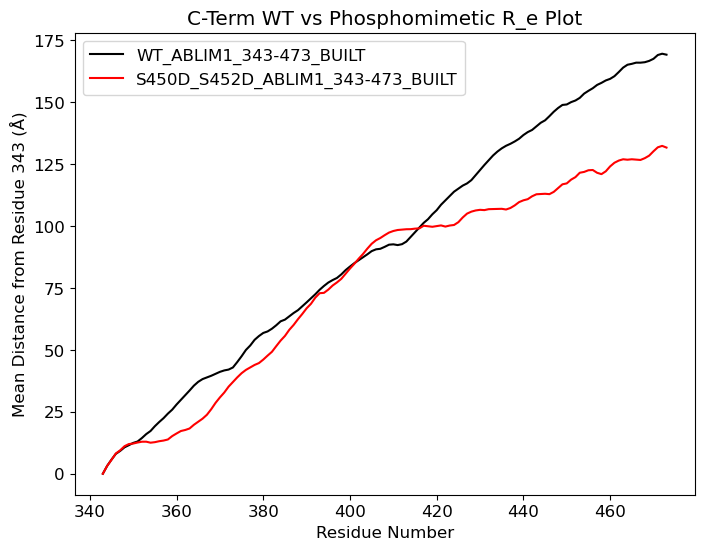

0.0
huh?
3.1741065100247337


"\nwt_output=path+'/built_wt_R_e_Cterm.csv'\n#wt_r2_Cterm=r_squared\nprint(wt_r2_Cterm)\nwt_dF=pd.DataFrame(wt_r2_Cterm)\nprint(wt_dF)\n\nwt_dF.to_csv('built_wt_R_e_Cterm.csv',index=False,header=None)\n\n\ns450d_output=path+'/built_s450d_s452d_R_e_Cterm.csv'\n#s450d_r2_Cterm=s450d_extended_r_squared[1]\nprint(s450d_s452d_r2_Cterm)\ns450d_dF=pd.DataFrame(s450d_s452d_r2_Cterm)\nprint(s450d_dF)\ns450d_dF.to_csv('built_s450d_s452d_R_e_Cterm.csv',index=False,header=None)\n\n\ns450pS_output=path+'/built_s450pS_s452pS_R_e_Cterm.csv'\n#s450d_r2_Cterm=s450d_extended_r_squared[1]\ns450pS_dF=pd.DataFrame(s450pS_s452pS_r2_Cterm)\nprint(s450pS_dF)\ns450pS_dF.to_csv('built_s450pS_s452pS_R_e_Cterm.csv',index=False,header=None)\n"

In [104]:
systems=['WT_ABLIM1_343-473_BUILT','S450D_S452D_ABLIM1_343-473_BUILT']#,'S450pS_S452pS_ABLIM1_343-473_BUILT']#,'WT_L2_L3','S216D_L2_L3']
colors=['black','red']#,'blue']
#from pytraj import topology as top
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
os.chdir(path)
import math

#use template to produce the trajectory and topology file names

trajectory= 'abm_ProtIon_trimmed_concat.xtc'
#print(trajectory)
topology= 'abm_ProtIon_rep1_start.pdb'

#print(topology)
color_num=0
fig,ax=plt.subplots()

for system in systems:
    new_path=path+'/'+system
    #print(new_path)
    os.chdir(new_path)
    system_avg_distances=[]
    top=pt.load_topology(topology)
    traj=pt.iterload(trajectory,topology)
    print(traj)
    print(top.n_residues)
    n_residues=top.n_residues
    #print(n_residues)
    n_bins=n_residues
    for i in range(1,n_residues+1):
        resmask=(':1@BB :' + str(i)+'@BB')
        distance_between=pt.distance(traj, mask=resmask)
        system_avg_distances.append(distance_between)
    #print(system_avg_distances)
    #print(len(system_avg_distances))
    #print(len(system_avg_distances[0]))
    #print('BREAK')

    mean_distances=[]
    sd_distances=[]
    for i in range(len(system_avg_distances)):
        mean=np.mean(system_avg_distances[i])
        mean_distances.append(mean)
        sd=np.std(system_avg_distances[i])
        sd_distances.append(sd)
    
    #print(len(mean_distances))
    #print(mean_distances)

    r_squared=[]
    for i in range(len(mean_distances)):
        squared=mean_distances[i]#*mean_distances[i]
        r_squared.append(squared)#math.sqrt(squared))

    if system=='WT_ABLIM1_343-473_BUILT':
        wt_r2_Cterm=mean_distances
    elif system=='S450D_S452D_ABLIM1_343-473_BUILT':
        s450d_s452d_r2_Cterm=mean_distances
    elif system=='S450pS_S452pS_ABLIM1_343-473_BUILT':
        s450pS_s452pS_r2_Cterm=mean_distances
    #print(r_squared)
    #print(n_residues)
    #print(len(r_squared))

    '''
    #print(len(means))
    #print(means)
    #end_distances=pt.distance(traj1, mask=ends)
    counts,edges,bars=ax.hist(r_squared, n_bins, histtype='bar',color='black',label=systems)
    ax.set_title('')

    for i in range(len(counts)):
        bin_centres = (edges[:-1] + edges[1:])/2.
        print(bin_centres)
        print(counts)
        plt.scatter(x=bin_centres,y=counts[i],color='black',label=systems[i])
        plt.plot(bin_centres,counts[i],color=colors[i])'''

    x_values=[]
    lower_sd=[]
    upper_sd=[]
    for i in range(343,n_residues+343):
        x_values.append(i)
    print(x_values)
    #for i in range(0,len(x_values)):
    #    lower_sd.append(r_squared[i]-sd_distances[i])
    #    upper_sd.append(r_squared[i]+sd_distances[i])

    #print(len(x_values))
    #print(len(r_squared))
    #print(sd_distances)
    #print('BREAK')
    #print(len(lower_sd))
    #print(lower_sd)
    #print(len(upper_sd))
    #print(upper_sd)
    legend=system
    print(len(x_values))
    print(len(r_squared))
    ax.plot(x_values,mean_distances,'-',color=colors[color_num],label=legend)
    color_num+=1
    #plt.fill_between(x_values,lower_sd,upper_sd,color='gray')


    title="C-Term WT vs Phosphomimetic R_e Plot" #vs Phosphoserine R_e Plot"
    plt.title(title)
    plt.xlabel("Residue Number")
    plt.ylabel("Mean Distance from Residue 343 (Å)")
    #plt.xlim(0,n_residues)
    #plt.gca().invert_xaxis()
    ax.figure.set_size_inches(8.0,6.0)
    leg = ax.legend()

name='BUILT_WT_S450D_Cterm_Re_plot.png' #vsS450pS_Cterm_r_e_plot.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=600)
plt.show()

#print(x_values)
#print(r_squared)

import csv
os.chdir(path)

#wt_extended_r_squared
#s216d_extended_r_squared
#wt_L2L3_r_squared
#s216d_L2L3_r_squared
#print(wt_extended_r_squared)
#print(s216d_extended_r_squared)
print(r_squared[0])

print('huh?')

print(r_squared[1])
'''
wt_output=path+'/built_wt_R_e_Cterm.csv'
#wt_r2_Cterm=r_squared
print(wt_r2_Cterm)
wt_dF=pd.DataFrame(wt_r2_Cterm)
print(wt_dF)

wt_dF.to_csv('built_wt_R_e_Cterm.csv',index=False,header=None)


s450d_output=path+'/built_s450d_s452d_R_e_Cterm.csv'
#s450d_r2_Cterm=s450d_extended_r_squared[1]
print(s450d_s452d_r2_Cterm)
s450d_dF=pd.DataFrame(s450d_s452d_r2_Cterm)
print(s450d_dF)
s450d_dF.to_csv('built_s450d_s452d_R_e_Cterm.csv',index=False,header=None)


s450pS_output=path+'/built_s450pS_s452pS_R_e_Cterm.csv'
#s450d_r2_Cterm=s450d_extended_r_squared[1]
s450pS_dF=pd.DataFrame(s450pS_s452pS_r2_Cterm)
print(s450pS_dF)
s450pS_dF.to_csv('built_s450pS_s452pS_R_e_Cterm.csv',index=False,header=None)
'''

pytraj.TrajectoryIterator, 5404 frames: 
Size: 0.037445 (GB)
<Topology: 310 atoms, 131 residues, 310 mols, PBC with box type = cubic>
           
131
131
[array([0., 0., 0., ..., 0., 0., 0.]), array([3.6611508 , 2.78233694, 4.00301312, ..., 3.44465882, 3.5097288 ,
       2.96150291]), array([7.24417964, 6.1562765 , 6.39253619, ..., 5.02335518, 4.92175449,
       4.64350719]), array([10.86242557,  8.92633176,  8.26968653, ...,  7.86959499,
        7.69577826,  7.34985756]), array([13.61001918, 11.40583694, 11.64928446, ...,  9.94887126,
        9.82171931,  9.62723391]), array([17.0174772 , 13.32680837, 14.40350927, ..., 12.69181489,
       12.39615059, 12.41142939]), array([20.41372761, 14.66850396, 17.04728757, ..., 11.77285696,
       12.50820582, 11.91860482]), array([22.3137544 , 16.48985821, 18.49141744, ..., 12.27790852,
       13.11088487, 12.52834986]), array([26.1486416 , 19.75687512, 20.72566098, ..., 11.48032251,
       12.12599677, 11.65537873]), array([29.12134391, 22.7545

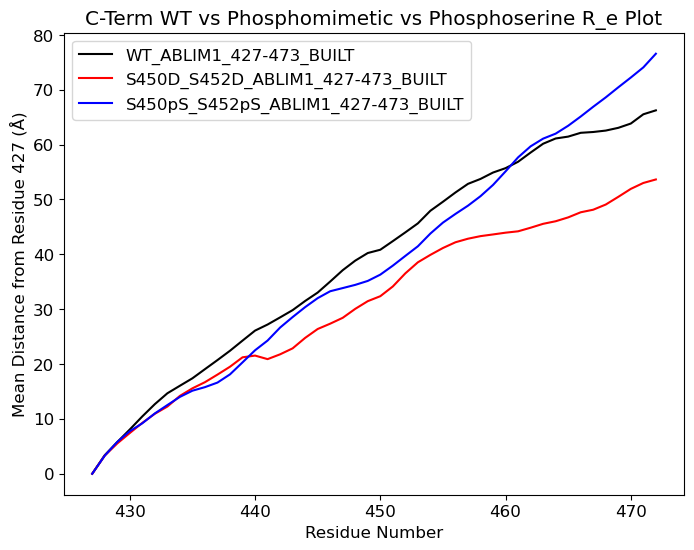

            0
0    0.000000
1    3.377856
2    5.771275
3    8.065929
4   10.451374
5   12.688942
6   14.666071
7   16.039722
8   17.398682
9   19.065873
10  20.720984
11  22.421490
12  24.268918
13  26.093123
14  27.201658
15  28.502737
16  29.827647
17  31.496424
18  33.030669
19  35.040969
20  37.110391
21  38.852349
22  40.238568
23  40.838109
24  42.407960
25  44.007274
26  45.645771
27  47.947767
28  49.586198
29  51.278849
30  52.849182
31  53.749025
32  54.914553
33  55.713170
34  56.878006
35  58.557688
36  60.166933
37  61.122213
38  61.465261
39  62.157623
40  62.306030
41  62.565061
42  63.064456
43  63.845836
44  65.534606
45  66.251510
[0.0, 3.3058988415103894, 5.520327802363297, 7.420672551799396, 9.272663871349748, 10.929565038535761, 12.247218541799496, 14.191901517017325, 15.569725505099566, 16.688960998865056, 18.07319041109204, 19.510685048500378, 21.22345468928307, 21.54103781688205, 20.891994506983753, 21.769268913771864, 22.857614887699388, 24.76632010161282, 26.

In [20]:
systems=['WT_ABLIM1_343-473_BUILT','S450D_S452D_ABLIM1_343-473_BUILT','S450pS_S452pS_ABLIM1_343-473_BUILT']#,'WT_L2_L3','S216D_L2_L3']
system_names=['WT_ABLIM1_427-473_BUILT','S450D_S452D_ABLIM1_427-473_BUILT','S450pS_S452pS_ABLIM1_427-473_BUILT']
system_num=0
colors=['black','red','blue']
#from pytraj import topology as top
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
os.chdir(path)
import math

#use template to produce the trajectory and topology file names

trajectory= 'abm_ProtIon_trimmed_concat.xtc'
#print(trajectory)
topology= 'abm_ProtIon_rep1_start.pdb'

#print(topology)
color_num=0
fig,ax=plt.subplots()

for system in systems:
    new_path=path+'/'+system
    #print(new_path)
    os.chdir(new_path)
    system_avg_distances=[]
    top=pt.load_topology(topology)
    traj=pt.iterload(trajectory,topology)
    print(traj)
    print(top.n_residues)
    n_residues=top.n_residues
    print(n_residues)
    n_bins=n_residues
    for i in range(85,n_residues):
        resmask=(':85@BB :' + str(i)+'@BB')
        #print(resmask)
        distance_between=pt.distance(traj, mask=resmask)
        #print(distance_between)
        system_avg_distances.append(distance_between)
    print(system_avg_distances)
    #print(len(system_avg_distances))
    #print(len(system_avg_distances[0]))
    #print('BREAK')
    
    mean_distances=[]
    sd_distances=[]
    for i in range(len(system_avg_distances)):
        #res_averages.append(system_avg_distances[i]*system_avg_distances[i])
        mean=np.mean(system_avg_distances[i]*system_avg_distances[i])
        mean_distances.append(mean)
        sd=np.std(system_avg_distances[i])
        sd_distances.append(sd)
    
    #print(len(mean_distances))
    #print(mean_distances)

    r_squared=[]
    for i in range(len(mean_distances)):
        squared=mean_distances[i]
        r_squared.append(math.sqrt(squared))
    if system=='WT_ABLIM1_343-473_BUILT':
        wt_r2_Cterm=r_squared
    elif system=='S450pS_S452pS_ABLIM1_343-473_BUILT':
        s450pS_s452pS_r2_Cterm=r_squared
    elif system=='S450D_S452D_ABLIM1_343-473_BUILT':
        s450d_s452d_r2_Cterm=r_squared


    '''
    #print(len(means))
    #print(means)
    #end_distances=pt.distance(traj1, mask=ends)
    counts,edges,bars=ax.hist(r_squared, n_bins, histtype='bar',color='black',label=systems)
    ax.set_title('')

    for i in range(len(counts)):
        bin_centres = (edges[:-1] + edges[1:])/2.
        print(bin_centres)
        print(counts)
        plt.scatter(x=bin_centres,y=counts[i],color='black',label=systems[i])
        plt.plot(bin_centres,counts[i],color=colors[i])'''

    x_values=[]
    lower_sd=[]
    upper_sd=[]
    for i in range(427,473):
        x_values.append(i)
    print(x_values)
    print(len(x_values))
    print(r_squared)
    #for i in range(0,len(x_values)):
    #    lower_sd.append(r_squared[i]-sd_distances[i])
    #    upper_sd.append(r_squared[i]+sd_distances[i])

    #print(len(x_values))
    #print(len(r_squared))
    #print(sd_distances)
    #print('BREAK')
    #print(len(lower_sd))
    #print(lower_sd)
    #print(len(upper_sd))
    #print(upper_sd)
    legend=system_names[system_num]
    system_num+=1
    print(len(x_values))
    print(len(r_squared))
    ax.plot(x_values,r_squared,'-',color=colors[color_num],label=legend)
    color_num+=1
    #plt.fill_between(x_values,lower_sd,upper_sd,color='gray')

    title="C-Term WT vs Phosphomimetic vs Phosphoserine R_e Plot"
    plt.title(title)
    plt.xlabel("Residue Number")
    plt.ylabel("Mean Distance from Residue 427 (Å)")
    #plt.xlim(0,n_residues)
    #plt.gca().invert_xaxis()
    ax.figure.set_size_inches(8.0,6.0)
    leg = ax.legend()

name='BUILT_427_WT_S450D_vsS450pS_Cterm_r_e_plot.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=600)
plt.show()

#print(x_values)
#print(r_squared)

import csv
os.chdir(path)



wt_output=path+'/built_wt_427_r_e_Cterm.csv'
#print(wt_r2_Cterm)
wt_dF=pd.DataFrame(wt_r2_Cterm)
print(wt_dF)

wt_dF.to_csv('built_wt_427_r_e_Cterm.csv',index=False,header=None)


s450d_output=path+'/built_s450d_427_r_e_Cterm.csv'
print(s450d_s452d_r2_Cterm)
s450d_r2_Cterm=s450d_s452d_r2_Cterm
s450d_dF=pd.DataFrame(s450d_s452d_r2_Cterm)
print(s450d_dF)
s450d_dF.to_csv('built_s450d_427_r_e_Cterm.csv',index=False,header=None)



s450pS_output=path+'/built_s450pS_427_r_e_Cterm.csv'
print(s450pS_s452pS_r2_Cterm)
s450pS_s452pS_Cterm=s450pS_s452pS_r2_Cterm
print(s450pS_s452pS_r2_Cterm)
s450pS_dF=pd.DataFrame(s450pS_s452pS_r2_Cterm)
print(s450pS_dF)

s450pS_dF.to_csv('built_s450pS_427_r_e_Cterm.csv',index=False,header=None)

pytraj.TrajectoryIterator, 5404 frames: 
Size: 0.037445 (GB)
<Topology: 310 atoms, 131 residues, 310 mols, PBC with box type = cubic>
           
131
131
[array([0., 0., 0., ..., 0., 0., 0.]), array([4.0208084 , 3.04062799, 3.43577777, ..., 3.43735192, 3.1835371 ,
       2.64945641]), array([7.58747655, 6.46964568, 5.54788061, ..., 6.33918893, 5.68466491,
       5.34629924]), array([11.03083545,  7.60022696,  8.81234431, ...,  7.64571406,
        7.43826317,  7.05795344]), array([14.88214491,  9.51128742, 10.68772718, ..., 10.76473232,
        9.9165804 ,  9.97923314]), array([18.41830689, 13.21095653, 14.37974499, ..., 11.50192363,
       11.74741877, 11.48788568]), array([21.82094923, 15.90568866, 16.61792191, ..., 14.75831396,
       14.78299899, 14.3480355 ]), array([24.99714026, 18.87807103, 19.24293574, ..., 16.44674576,
       15.87770169, 15.59587877]), array([28.05083206, 22.14552723, 21.89690322, ..., 18.32599898,
       17.94985425, 17.57334985]), array([30.43094178, 24.3149

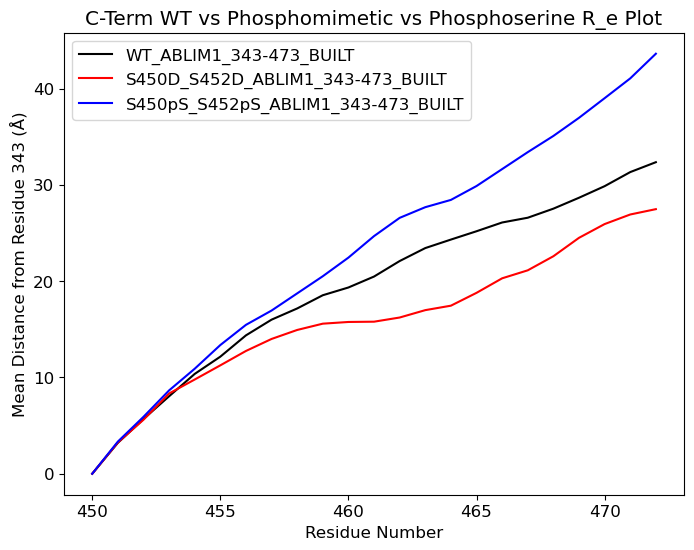

"\nimport csv\nos.chdir(path)\n\n#wt_extended_r_squared\n#s216d_extended_r_squared\n#wt_L2L3_r_squared\n#s216d_L2L3_r_squared\n#print(wt_extended_r_squared)\n#print(s216d_extended_r_squared)\nprint(r_squared[0])\n\nprint('huh?')\n\nprint(r_squared[1])\n\nwt_output=path+'/built_wt_r_e**2_Cterm.csv'\n#wt_r2_Cterm=r_squared[0]\nprint(wt_r2_Cterm)\nwt_dF=pd.DataFrame(wt_r2_Cterm)\nprint(wt_dF)\n\nwt_dF.to_csv('built_wt_r_e**2_Cterm.csv',index=False,header=None)\n\n\ns450d_output=path+'/built_s450d_s452d_r_e**2_Cterm.csv'\n#s450d_r2_Cterm=s450d_extended_r_squared[1]\ns450d_dF=pd.DataFrame(s450d_s452d_r2_Cterm)\nprint(s450d_dF)\ns450d_dF.to_csv('built_s450d_s452d_r_e**2_Cterm.csv',index=False,header=None)\n"

In [15]:
systems=['WT_ABLIM1_343-473_BUILT','S450D_S452D_ABLIM1_343-473_BUILT','S450pS_S452pS_ABLIM1_343-473_BUILT']#,'WT_L2_L3','S216D_L2_L3']
colors=['black','red','blue']
#from pytraj import topology as top
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
os.chdir(path)
import math

#use template to produce the trajectory and topology file names

trajectory= 'abm_ProtIon_trimmed_concat.xtc'
#print(trajectory)
topology= 'abm_ProtIon_rep1_start.pdb'

#print(topology)
color_num=0
fig,ax=plt.subplots()

for system in systems:
    new_path=path+'/'+system
    #print(new_path)
    os.chdir(new_path)
    system_avg_distances=[]
    top=pt.load_topology(topology)
    traj=pt.iterload(trajectory,topology)
    print(traj)
    print(top.n_residues)
    n_residues=top.n_residues
    print(n_residues)
    n_bins=n_residues
    for i in range(108,n_residues):
        resmask=(':108@BB :' + str(i)+'@BB')
        #print(resmask)
        distance_between=pt.distance(traj, mask=resmask)
        #print(distance_between)
        system_avg_distances.append(distance_between)
    print(system_avg_distances)
    #print(len(system_avg_distances))
    #print(len(system_avg_distances[0]))
    #print('BREAK')
    
    mean_distances=[]
    sd_distances=[]
    for i in range(len(system_avg_distances)):
        #res_averages.append(system_avg_distances[i]*system_avg_distances[i])
        mean=np.mean(system_avg_distances[i]*system_avg_distances[i])
        mean_distances.append(mean)
        sd=np.std(system_avg_distances[i])
        sd_distances.append(sd)
    
    #print(len(mean_distances))
    #print(mean_distances)

    r_squared=[]
    for i in range(len(mean_distances)):
        squared=mean_distances[i]
        r_squared.append(math.sqrt(squared))
    if system=='WT_ABLIM1_343-473_BUILT':
        wt_r2_Cterm=r_squared
    elif system=='S450pS_S452pS_ABLIM1_343-473_BUILT':
        s450pS_s452pS_r2_Cterm=r_squared
    elif system=='S450D_S452D_ABLIM1_343-473_BUILT':
        s450d_s452d_r2_Cterm=r_squared


    '''
    #print(len(means))
    #print(means)
    #end_distances=pt.distance(traj1, mask=ends)
    counts,edges,bars=ax.hist(r_squared, n_bins, histtype='bar',color='black',label=systems)
    ax.set_title('')

    for i in range(len(counts)):
        bin_centres = (edges[:-1] + edges[1:])/2.
        print(bin_centres)
        print(counts)
        plt.scatter(x=bin_centres,y=counts[i],color='black',label=systems[i])
        plt.plot(bin_centres,counts[i],color=colors[i])'''

    x_values=[]
    lower_sd=[]
    upper_sd=[]
    for i in range(450,473):
        x_values.append(i)
    print(x_values)
    print(len(x_values))
    print(r_squared)
    #for i in range(0,len(x_values)):
    #    lower_sd.append(r_squared[i]-sd_distances[i])
    #    upper_sd.append(r_squared[i]+sd_distances[i])

    #print(len(x_values))
    #print(len(r_squared))
    #print(sd_distances)
    #print('BREAK')
    #print(len(lower_sd))
    #print(lower_sd)
    #print(len(upper_sd))
    #print(upper_sd)
    legend=system
    print(len(x_values))
    print(len(r_squared))
    ax.plot(x_values,r_squared,'-',color=colors[color_num],label=legend)
    color_num+=1
    #plt.fill_between(x_values,lower_sd,upper_sd,color='gray')

    title="C-Term WT vs Phosphomimetic vs Phosphoserine R_e Plot"
    plt.title(title)
    plt.xlabel("Residue Number")
    plt.ylabel("Mean Distance from Residue 343 (Å)")
    #plt.xlim(0,n_residues)
    #plt.gca().invert_xaxis()
    ax.figure.set_size_inches(8.0,6.0)
    leg = ax.legend()

name='BUILT_450_WT_S450D_vsS450pS_Cterm_r_e_plot.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=600)
plt.show()

#print(x_values)
#print(r_squared)

import csv
os.chdir(path)

#wt_extended_r_squared
#s216d_extended_r_squared
#wt_L2L3_r_squared
#s216d_L2L3_r_squared
#print(wt_extended_r_squared)
#print(s216d_extended_r_squared)
print(r_squared[0])

print('huh?')

print(r_squared[1])

wt_output=path+'/built_wt_r_e_Cterm.csv'
#wt_r2_Cterm=r_squared[0]
print(wt_r2_Cterm)
wt_dF=pd.DataFrame(wt_r2_Cterm)
print(wt_dF)

wt_dF.to_csv('built_wt_r_e**2_Cterm.csv',index=False,header=None)


s450d_output=path+'/built_s450d_s452d_r_e**2_Cterm.csv'
#s450d_r2_Cterm=s450d_extended_r_squared[1]
s450d_dF=pd.DataFrame(s450d_s452d_r2_Cterm)
print(s450d_dF)
s450d_dF.to_csv('built_s450d_s452d_r_e**2_Cterm.csv',index=False,header=None)
'''

['cg_WT_CTERM_ProtIon_rep1.xtc', 'cg_WT_CTERM_ProtIon_rep2.xtc', 'cg_WT_CTERM_ProtIon_rep3.xtc', 'cg_WT_CTERM_ProtIon_rep4.xtc', 'cg_WT_CTERM_ProtIon_rep5.xtc', 'cg_WT_CTERM_ProtIon_rep6.xtc', 'cg_WT_CTERM_ProtIon_rep7.xtc']
abm_ProtIon_rep1_start.pdb
pytraj.TrajectoryIterator, 30001 frames: 
Size: 0.207878 (GB)
<Topology: 310 atoms, 131 residues, 310 mols, PBC with box type = cubic>
           
pytraj.TrajectoryIterator, 25666 frames: 
Size: 0.177841 (GB)
<Topology: 310 atoms, 131 residues, 310 mols, PBC with box type = cubic>
           
[75.63970505 76.59106826 76.04870177 ... 15.31387597 16.98291278
 18.04613499]
[73.49319606 73.79057666 70.98027335 ... 28.61115079 29.46309417
 29.4874757 ]
[56.86970186355504, 56.27848761531, 55.313227961279566, 54.605289940161086, 56.574338284838966, 56.39904882885814, 56.11621979920836, 55.058717291117944, 54.91009264650807, 54.527312697186105, 54.78937818229862, 56.37529744810263, 56.981534124653656, 56.03410475710545, 57.008823466345255, 57.403

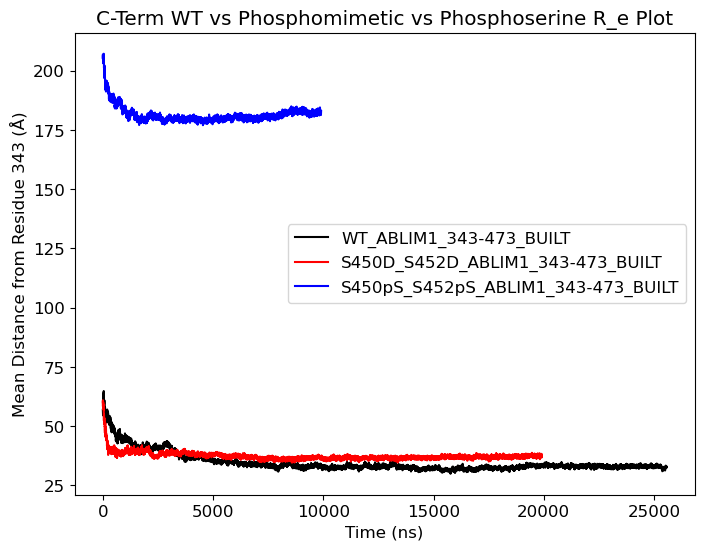

In [28]:
systems=['WT_ABLIM1_343-473_BUILT','S450D_S452D_ABLIM1_343-473_BUILT','S450pS_S452pS_ABLIM1_343-473_BUILT']#,'WT_L2_L3','S216D_L2_L3']
colors=['black','red','blue']
#from pytraj import topology as top
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
os.chdir(path)
import math


color_num=0
fig,ax=plt.subplots()

for system in systems:
    os.chdir(path+'/'+system)
    if system=='WT_ABLIM1_343-473_BUILT':
        system_name = 'WT_CTERM'
    elif system=='S450D_S452D_ABLIM1_343-473_BUILT':
        system_name='S450D_S452D_CTERM'
    elif system=='S450pS_S452pS_ABLIM1_343-473_BUILT':
        system_name= 'S450pS_S452pS_CTERM'
    #use template to produce the trajectory and topology file names
    template= 'cg_' + system_name + '_ProtIon_rep%s'
    trajectory= [template % (str(i)+'.xtc') for i in range (1,8)]
    print(trajectory)
    
    topology= 'abm_ProtIon_rep1_start.pdb'
    #print(trajectory)
    print(topology)
    #print(topology)
    sys_mean=system + ' mean'
    traj1=pt.iterload(trajectory[0],topology)
    print(traj1)
    traj2=pt.iterload(trajectory[1],topology)
    traj3=pt.iterload(trajectory[2],topology)
    traj4=pt.iterload(trajectory[3],topology)
    traj5=pt.iterload(trajectory[4],topology)
    traj6=pt.iterload(trajectory[5],topology)
    traj7=pt.iterload(trajectory[6],topology)
    traj8=pt.iterload(trajectory[7],topology)
    traj9=pt.iterload(trajectory[8],topology)
    traj10=pt.iterload(trajectory[9],topology)
    print(traj7)
    #pytraj distance calculated from end-to-end
    distances=':1 :131'
    data1=pt.distance(traj1, mask=distances)
    print(data1)
    data2=pt.distance(traj2, mask=distances)
    data3=pt.distance(traj3, mask=distances)
    data4=pt.distance(traj4, mask=distances)
    data5=pt.distance(traj5, mask=distances)
    data6=pt.distance(traj6, mask=distances)
    data7=pt.distance(traj7, mask=distances)
    data8=pt.distance(traj8, mask=distances)
    data9=pt.distance(traj9, mask=distances)
    data10=pt.distance(traj10, mask=distances)
    print(data8)
    multiple_lists = [data1,data2,data3,data4,data5,data6,data7,data8,data9,data10]
    arrays = [np.array(x) for x in multiple_lists]
    means=[np.mean(k) for k in zip(*arrays)]
    #print(means)
    #print(len(means))
    mean_distances=means[100:]
    #print(len(mean_distances))
    print(mean_distances)
    '''
    r_squared=[]
    for i in range(len(mean_distances)):
        squared=mean_distances[i]
        r_squared.append(math.sqrt(squared))
    print(r_squared)
    if system=='WT_ABLIM1_343-473_BUILT':
        wt_r2_Cterm=r_squared
    elif system=='S450pS_S452pS_ABLIM1_343-473_BUILT':
        s450pS_s452pS_r2_Cterm=r_squared
    elif system=='S450D_S452D_ABLIM1_343-473_BUILT':
        s450d_s452d_r2_Cterm=r_squared

    '''
    x_values=[]
    lower_sd=[]
    upper_sd=[]
    for i in range(343,473):
        x_values.append(i)
    #print(x_values)
    #print(len(x_values))
    #print(r_squared)
 
    legend=system
    #print(len(x_values))
    #print(len(r_squared))
    x=np.arange(0,len(mean_distances))
    y=np.array(mean_distances)
    ax.plot(x,y,'-',color=colors[color_num],label=legend)
    color_num+=1
    #plt.fill_between(x_values,lower_sd,upper_sd,color='gray')

    title="C-Term WT vs Phosphomimetic vs Phosphoserine R_e Plot"
    plt.title(title)
    plt.xlabel("Time (ns)")
    plt.ylabel("Mean D343 to S473 End-to-End distance (Å)")
    #plt.xlim(0,n_residues)
    #plt.gca().invert_xaxis()
    ax.figure.set_size_inches(8.0,6.0)
    leg = ax.legend()

name='BUILT_WT_S450D_S450pS_Cterm_TIME_distance_plot.png'
os.chdir(path)
#plt.gcf().savefig(name,dpi=600)
plt.show()


import csv
os.chdir(path)


/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses/WT_ABLIM1_343-473_BUILT
pytraj.TrajectoryIterator, 5404 frames: 
Size: 0.037445 (GB)
<Topology: 310 atoms, 131 residues, 310 mols, PBC with box type = cubic>
           
[246.04999444 237.71051928 232.1477123  ...  67.71680718  65.2352591
  63.97183079]
1
/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses/S450D_S452D_ABLIM1_343-473_BUILT
pytraj.TrajectoryIterator, 4736 frames: 
Size: 0.032816 (GB)
<Topology: 310 atoms, 131 residues, 310 mols, PBC with box type = cubic>
           
[247.54293629 245.1251628  238.61126967 ... 133.88575092 132.84850887
 133.55924964]
2
/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses/S450pS_S452pS_ABLIM1_343-473_BUILT
pytraj.TrajectoryIterator, 28001 frames: 
Size: 0.195272 (GB)
<Topology: 312 atoms, 131 residues, 312 mols, PBC with box type = cubic>
           
[241.26575423 237.97261501 234.61536561 ... 194.52158847 196.34881648
 196.42441055]
3
[ 52.2  56.6  61.  ... 259.  263.4 267.8]
[[0.0000

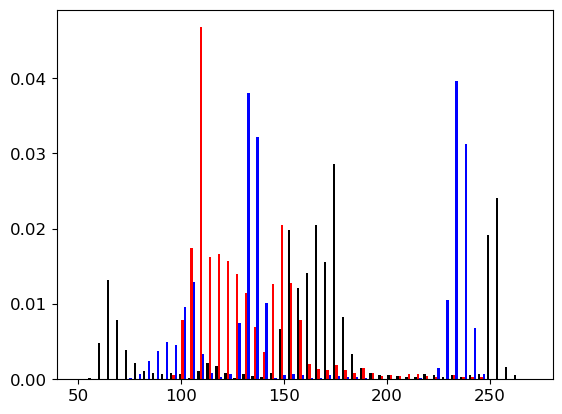

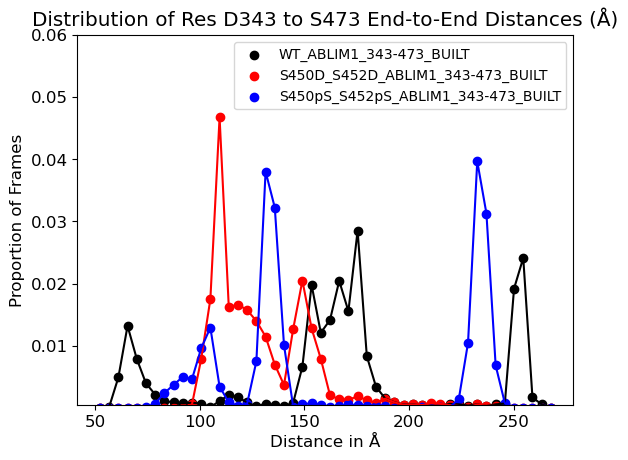

In [61]:
systems=['WT_ABLIM1_343-473_BUILT','S450D_S452D_ABLIM1_343-473_BUILT','S450pS_S452pS_ABLIM1_343-473_BUILT']#,'WT_L2_L3','S216D_L2_L3']
colors=['black','red','blue']
#from pytraj import topology as top
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
os.chdir(path)
import math

system_number=0
color_num=0
fig,ax=plt.subplots()

n_bins=50
x_multi=[]
for system in systems:
    os.chdir(path+'/'+system)
    print(os.getcwd())
    trajectory = 'abm_ProtIon_trimmed_concat.xtc'
    #print(trajectory)    
    topology= 'abm_ProtIon_rep1_start.pdb'
    #print(trajectory)
    #print(topology)
    #print(topology)
    sys_mean=system + ' mean'
    traj=pt.iterload(trajectory,topology)
    print(traj)
    
    #pytraj distance calculated from end-to-end
    distances=':1 :131'
    data1=pt.distance(traj, mask=distances)
    print(data1)
    #multiple_lists = [data]#,data4,data5,data6,data7]
    #arrays = [np.array(x) for x in multiple_lists]
    #means=[np.mean(k) for k in zip(*arrays)]
    #print(means)
    #print(len(means))
    x_multi.append(data1[100:20000])
    print(len(x_multi))
    #legend=system+ ' mean'


#calculate the bars & edges of the histogram
bin_counts,bin_edges,bars=ax.hist(x_multi, n_bins, histtype='bar',range=(50,270),color=colors,label=systems,density=True,linewidth=1.5)


fig,ax = plt.subplots()
for i in range(len(bin_counts)):
    #generate the outline/shape of the histogram for each system, NOT including the bars themselves
    bin_centers = (bin_edges[:-1] + bin_edges[1:])/2.
    print(bin_centers)
    print(bin_counts)
    plt.scatter(x=bin_centers,y=bin_counts[i],color=colors[i],label=systems[i])
    plt.plot(bin_centers,bin_counts[i],color=colors[i])


title="Distribution of Res D343 to S473 End-to-End Distances (Å)"
plt.title(title)
#plt.xlim(12,24)
plt.ylim(0.0005,0.06)
plt.xlabel("Distance in Å")
plt.ylabel("Proportion of Frames")
#ax.figure.set_size_inches(7.5,6.5)
plt.legend(loc='upper right',prop={'size':10})

name='BUILT_WT_S450D_S450pS_C_TERM_End_to_End_Hist.png'
os.chdir(path)
#plt.gcf().savefig(name,dpi=600)
plt.show()


169.3406695702227
169.3406695702227
130.80575045178344
130.80575045178344
159.6960939937087
159.7418740138585
Histogram data saved to: /Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses/C_Term_End_to_End_Histogram_Data.csv


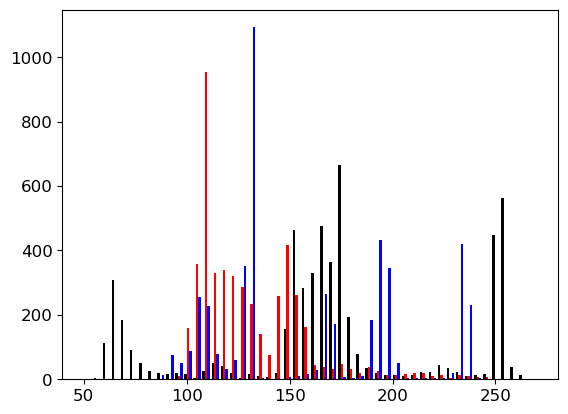

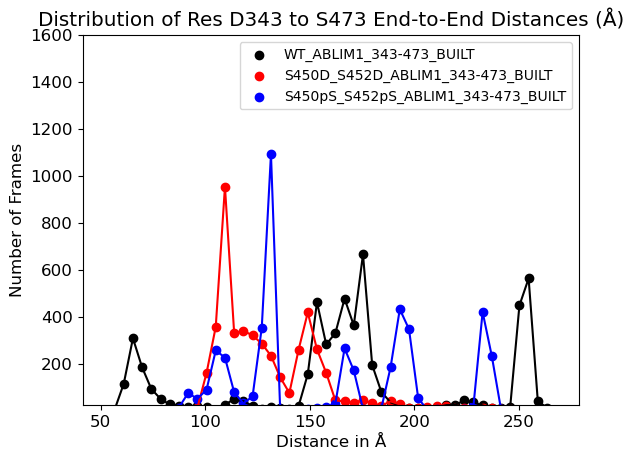

In [103]:
systems=['WT_ABLIM1_343-473_BUILT','S450D_S452D_ABLIM1_343-473_BUILT','S450pS_S452pS_ABLIM1_343-473_BUILT']#,'WT_L2_L3','S216D_L2_L3']
colors=['black','red','blue']
#from pytraj import topology as top
path='/Users/alecloftus/Desktop/ABLIM_CG_Extended_Analyses'
os.chdir(path)
import math

system_number=0
color_num=0
fig,ax=plt.subplots()

n_bins=50
x_multi=[]
for system in systems:
    os.chdir(path+'/'+system)
    #print(os.getcwd())
    trajectory = 'abm_ProtIon_trimmed_concat.xtc'
    #print(trajectory)    
    topology= 'abm_ProtIon_rep1_start.pdb'
    #print(trajectory)
    #print(topology)
    #print(topology)
    sys_mean=system + ' mean'
    traj=pt.iterload(trajectory,topology)
    #print(traj)
    
    #pytraj distance calculated from end-to-end
    distances=':1 :131'
    data1=pt.distance(traj, mask=distances)
    #print(data1)
    #multiple_lists = [data]#,data4,data5,data6,data7]
    #arrays = [np.array(x) for x in multiple_lists]
    #means=[np.mean(k) for k in zip(*arrays)]
    #print(means)
    #print(len(means))
    print(np.mean(data1))
    if system=='S450pS_S452pS_ABLIM1_343-473_BUILT':
        group1=data1[7000:7660] 
        group2=data1[14600:17000] 
        group3=data1[24000:24500]
        group4=data1[27000:]
        combined = np.concatenate((group1, group2, group3,group4))
        data1=combined
    #print(len(data1))
    x_multi.append(data1[:6000])
    print(np.mean(data1))
    #print(len(x_multi))
    #legend=system+ ' mean'


#calculate the bars & edges of the histogram
bin_counts,bin_edges,bars=ax.hist(x_multi, n_bins, histtype='bar',range=(50,270),color=colors,label=systems,linewidth=1.5)

fig,ax = plt.subplots()
for i in range(len(bin_counts)):
    #generate the outline/shape of the histogram for each system, NOT including the bars themselves
    bin_centers = (bin_edges[:-1] + bin_edges[1:])/2.
    #print(bin_centers)
    #print(bin_counts)
    plt.scatter(x=bin_centers,y=bin_counts[i],color=colors[i],label=systems[i])
    plt.plot(bin_centers,bin_counts[i],color=colors[i])


# Prepare CSV data
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2.0
csv_data = {'Bin Center (Å)': bin_centers}
for i, system in enumerate(systems):
    csv_data[system] = bin_counts[i]

# Save to CSV
df = pd.DataFrame(csv_data)
csv_output_path = os.path.join(path, 'C_Term_End_to_End_Histogram_Data.csv')
df.to_csv(csv_output_path, index=False)
print(f"Histogram data saved to: {csv_output_path}")


title="Distribution of Res D343 to S473 End-to-End Distances (Å)"
plt.title(title)
#plt.xlim(12,24)
plt.ylim(25,1600)
plt.xlabel("Distance in Å")
plt.ylabel("Number of Frames")
#ax.figure.set_size_inches(7.5,6.5)
plt.legend(loc='upper right',prop={'size':10})

name='BUILT_WT_S450D_S450pS_C_TERM_End_to_End_Hist.png'
os.chdir(path)
plt.gcf().savefig(name,dpi=600)
plt.show()
